<a href="https://colab.research.google.com/github/DHAANIBAHL/4-Credit-courses/blob/main/Automobile_Sales_Performance_and_Marketing_Campaign_ML_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Analysis Objectives
The analysis is performed to evaluate key drivers of sales performance, customer behavior, and marketing effectiveness across the automotive business ecosystem. It focuses on identifying patterns, inefficiencies, and growth opportunities across multiple dimensions of operations.

* Vehicle sales performance was analyzed across model, brand, and fuel type to understand product-level demand and identify best-performing and underperforming categories.

* Dealer and region comparisons were performed to evaluate geographical sales distribution and identify high-performing and low-performing markets.

* Marketing campaign performance was assessed using ROI and conversion funnel analysis to measure effectiveness across different stages from impressions to bookings.

* Test-drive to purchase conversion analysis was conducted to understand customer intent progression and identify drop-off points in the sales journey.

* Customer segmentation and CLV analysis were used to group customers based on value, behavior, and demographics to support targeted marketing strategies.

* Demand forecasting and inventory planning insights were derived to help optimize stock allocation, reduce overstocking, and improve supply alignment with demand trends.


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# import os
# import pandas as pd

# CORRUPT   = "/content/drive/MyDrive/Car Sales.xlsx"
# RECOVERED = "/content/drive/MyDrive/Car Sales RECOVERED.xlsx"
# FINAL     = "/content/drive/MyDrive/Car Sales.xlsx"

# # Step 1: Delete corrupted file
# if os.path.exists(CORRUPT):
#     os.remove(CORRUPT)
#     print("Deleted corrupted Car Sales.xlsx")
# else:
#     print("Corrupted file not found — already deleted")

# # Step 2: Rename recovered file
# os.rename(RECOVERED, FINAL)
# print("Renamed Car Sales RECOVERED.xlsx → Car Sales.xlsx")

# # Step 3: Verify
# test = pd.read_excel(FINAL, sheet_name=None)
# print(f"\nFile is clean and readable!")
# print(f"   Total sheets: {len(test)}")
# for name, df in test.items():
#     print(f"   {name:<45} {df.shape[0]:>6,} rows")

# # Step 4: Reset variables
# DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
# LOCAL_FILE  = "/content/Car Sales.xlsx"
# print(f"\nDone! Everything back to normal")
# print(f"   DRIVE_FILE = {DRIVE_FILE}")

In [3]:
# Mount drive for relavant files

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import shutil

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
LOCAL_FILE  = "/content/Car Sales.xlsx"
shutil.copy(DRIVE_FILE, LOCAL_FILE)

all_sheets   = pd.read_excel(LOCAL_FILE, sheet_name=None)
fvs          = all_sheets["Fact_VehicleSales"]
ftd          = all_sheets["Fact_TestDrive"]
fmc          = all_sheets["Fact_MarketingCampaignPerforman"]
dim_date     = all_sheets["Dim_Date"]
dim_vehicle  = all_sheets["Dim_Vehicle"]
dim_customer = all_sheets["Dim_Customer"]
dim_dealer   = all_sheets["Dim_Dealer"]
dim_region   = all_sheets["Dim_Region"]
dim_channel  = all_sheets["Dim_Channel"]
dim_campaign = all_sheets["Dim_Campaign"]
dim_exec     = all_sheets["Dim_SalesExecutive"]

def pretty(df, title, number, format_cols=None):
    """Print a numbered, formatted table with a title."""
    df = df.copy().reset_index(drop=True)
    df.index = df.index + 1

    if format_cols:
        for col, fmt in format_cols.items():
            if col in df.columns:
                if fmt == "currency":
                    df[col] = df[col].apply(lambda x: f"${x:,.0f}" if pd.notna(x) else "—")
                elif fmt == "pct":
                    df[col] = df[col].apply(lambda x: f"{x:.1f}%" if pd.notna(x) else "—")
                elif fmt == "pct2":
                    df[col] = df[col].apply(lambda x: f"{x:.2f}%" if pd.notna(x) else "—")
                elif fmt == "int":
                    df[col] = df[col].apply(lambda x: f"{int(x):,}" if pd.notna(x) else "—")
                elif fmt == "float2":
                    df[col] = df[col].apply(lambda x: f"{x:.2f}" if pd.notna(x) else "—")

    divider = "─" * 90
    print(f"\n{divider}")
    print(f"  {number}. {title}")
    print(divider)
    print(df.to_string())
    print(divider)

print("Setup complete")

Setup complete


In [4]:
print(dim_dealer.columns.tolist())

['DealerKey', 'DealerName', 'DealerType', 'City', 'State', 'RegionKey']


In [5]:
# Check unique values
print("Unique SaleAmount values:", fvs['SaleAmount'].nunique())
print("Unique UnitsSold values:", fvs['UnitsSold'].nunique())

# Check if values are literally all the same
print("\nSaleAmount value counts:\n", fvs['SaleAmount'].value_counts().head(10))
print("\nUnitsSold value counts:\n", fvs['UnitsSold'].value_counts().head(10))

# Check a sample
print("\nSample rows:")
print(fvs[['SaleAmount', 'UnitsSold']].head(10))

Unique SaleAmount values: 79678
Unique UnitsSold values: 4

SaleAmount value counts:
 SaleAmount
24584.20    3
22496.55    3
36687.96    3
49421.79    3
30568.49    3
27086.30    2
15167.05    2
30355.10    2
39680.14    2
17301.08    2
Name: count, dtype: int64

UnitsSold value counts:
 UnitsSold
1    80112
4       83
3       76
2       76
Name: count, dtype: int64

Sample rows:
   SaleAmount  UnitsSold
0    64689.73          1
1    39278.38          1
2    37039.43          3
3    64548.32          1
4    23102.93          1
5    13952.04          1
6    36455.89          1
7    29345.71          1
8    57286.96          1
9    25412.90          1


Analysis 1: Vehicle Sales Performance
- Revenue by brand shows which OEM relationships generating the most business.
- Revenue by fuel type is important because it shows how sales are distributed across Petrol, Diesel, and emerging segments like EVs.
- Revenue by body type tells you what customers are actually buying versus the what is getting stocked.
- Top 15 models by revenue indicate highest revenue sources.

Refreshed fuel_perf:
FuelType  TotalRevenue  UnitsSold  RevenueShare%
  Diesel  1.928840e+09      23874          49.08
  Petrol  1.356113e+09      41712          34.50
  Hybrid  4.171922e+08      10128          10.61
     CNG  2.282268e+08       8094           5.81
  1.1. Revenue by Brand


,Brand,TotalRevenue,UnitsSold,AvgPrice,AvgDiscount,RevenueShare%
1,Ford,"$956,221,609","8,809","$109,195","$2,554",24.33%
2,Pontiac,"$692,442,739","3,866","$180,277","$2,546",17.62%
3,Chevrolet,"$212,409,553","5,395","$39,606","$2,596",5.40%
4,Toyota,"$159,600,003","4,869","$32,894","$2,679",4.06%
5,Volkswagen,"$148,630,139","4,966","$30,087","$2,585",3.78%
6,Mercedes-B,"$147,970,803","4,599","$32,287","$2,418",3.76%
7,Dodge,"$141,900,513","5,474","$26,056","$2,818",3.61%
8,Oldsmobile,"$128,855,492","3,065","$42,289","$2,669",3.28%
9,Volvo,"$110,489,797","3,405","$32,747","$2,610",2.81%
10,Saturn,"$107,595,097","3,081","$35,059","$2,740",2.74%


  1.2. Revenue by Fuel Type


,FuelType,TotalRevenue,UnitsSold,RevenueShare%
1,Diesel,"$1,928,839,946","23,874",49.08%
2,Petrol,"$1,356,112,949","41,712",34.50%
3,Hybrid,"$417,192,245","10,128",10.61%
4,CNG,"$228,226,807","8,094",5.81%


  1.3. Revenue by Body Type


,BodyType,TotalRevenue,UnitsSold,RevenueShare%
1,Passenger,"$1,225,544,364","17,370",31.18%
2,SUV,"$1,170,094,191","18,746",29.77%
3,Hatchback,"$636,400,049","20,864",16.19%
4,Sedan,"$495,185,157","15,847",12.60%
5,Hardtop,"$403,148,187","10,981",10.26%


  1.4. Top 15 Models by Revenue


,Brand,Model,TotalRevenue,UnitsSold,AvgPrice,AvgDiscount
1,Ford,F-Series,"$633,385,540","1,090","$582,156","$2,765"
2,Pontiac,Grand Am,"$586,203,117","1,019","$578,110","$2,507"
3,Lincoln,Continental,"$81,883,589",998,"$82,295","$2,952"
4,Chevrolet,Malibu,"$80,408,401","1,059","$76,579","$2,249"
5,Oldsmobile,Aurora,"$69,720,272",987,"$70,854","$2,683"
6,Ford,Taurus,"$65,570,408",959,"$68,732","$2,290"
7,Buick,Park Avenue,"$60,593,485","1,003","$61,267","$2,622"
8,Ford,Contour,"$58,946,255",953,"$62,180","$2,872"
9,Ford,Ranger,"$54,714,037","1,948","$28,203","$2,382"
10,Toyota,Land Cruiser,"$54,649,909",998,"$54,925","$2,916"


  1.5. Top 10 Most Discounted Models (Margin Alert)


,Brand,Model,AvgDiscount,TotalRevenue,UnitsSold
1,Mitsubishi,Montero,"$4,611","$3,158,947",198
2,Ford,Crown Victoria,"$3,923","$1,470,092",134
3,Oldsmobile,Silhouette,"$3,577","$2,169,537",156
4,Chrysler,Cirrus,"$3,415","$1,249,917",96
5,Lexus,ES300,"$3,313","$3,314,228",208
6,Toyota,RAV4,"$3,288","$17,255,957",636
7,Chevrolet,Camaro,"$3,261","$4,225,797",255
8,Saturn,LW,"$3,233","$1,490,030",115
9,Nissan,Xterra,"$3,169","$390,990",43
10,Jeep,Wrangler,"$3,140","$6,016,626",320


model_monthly rebuilt — 152 models, 10310 rows

  ALL 154 MODELS — FULL SUMMARY TABLE
              Model FuelType  Total_Units  Avg_Monthly_Volume Peak_Month  Peak_Month_Units
             Ranger   Diesel         1948                81.2   Aug 2024                59
              Camry   Petrol         1325                55.2   Sep 2025                41
               Golf   Diesel         1279                53.3   Nov 2025                45
               528i   Diesel         1184                49.3   Aug 2025                36
             Cabrio   Petrol         1113                46.4   Nov 2025                39
           F-Series   Diesel         1090                45.4   Dec 2025                37
             Malibu   Petrol         1059                44.1   Nov 2025                38
           Grand Am   Diesel         1019                42.5   Dec 2024                38
        Park Avenue   Hybrid         1003                41.8   Nov 2024                33
    

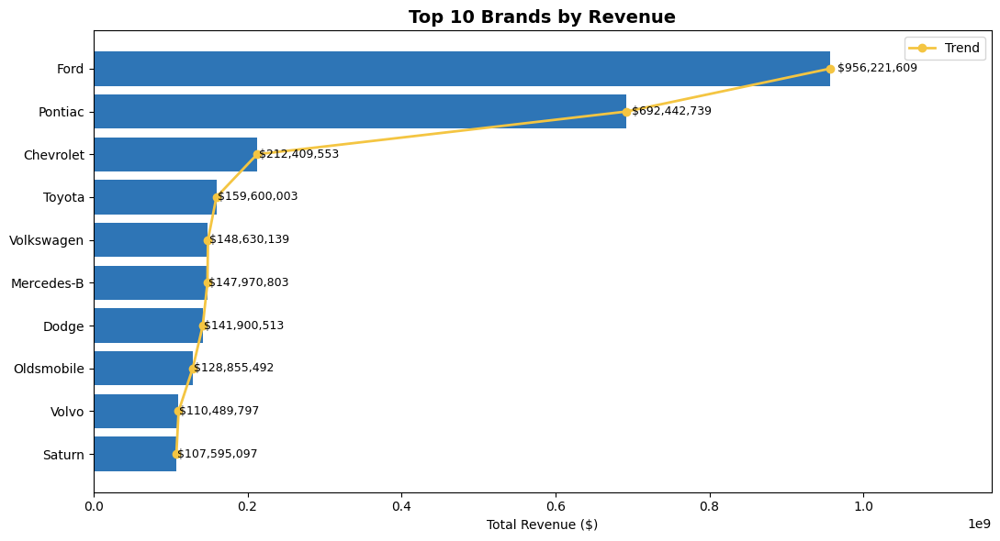

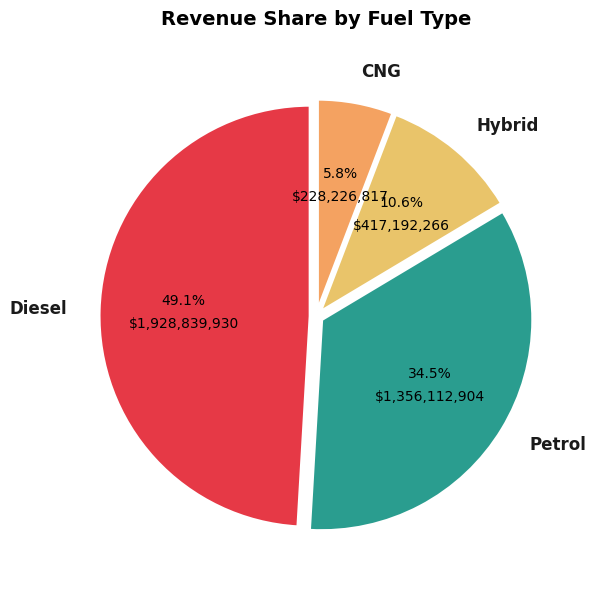

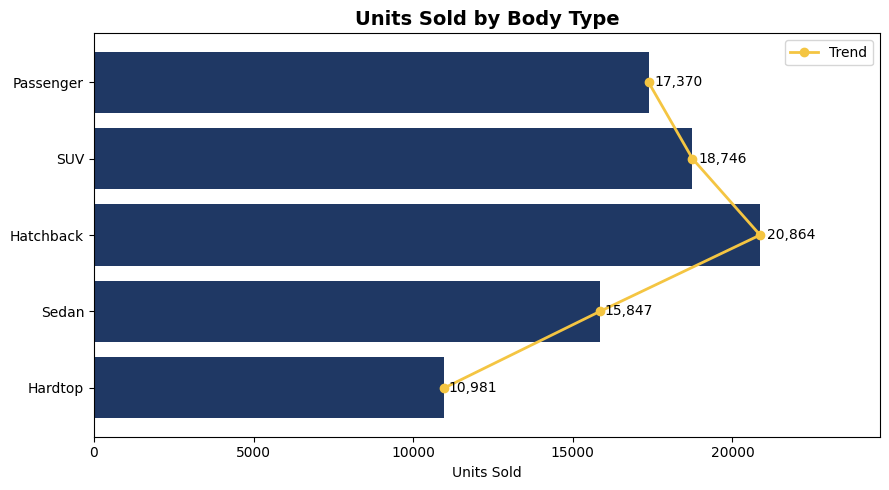

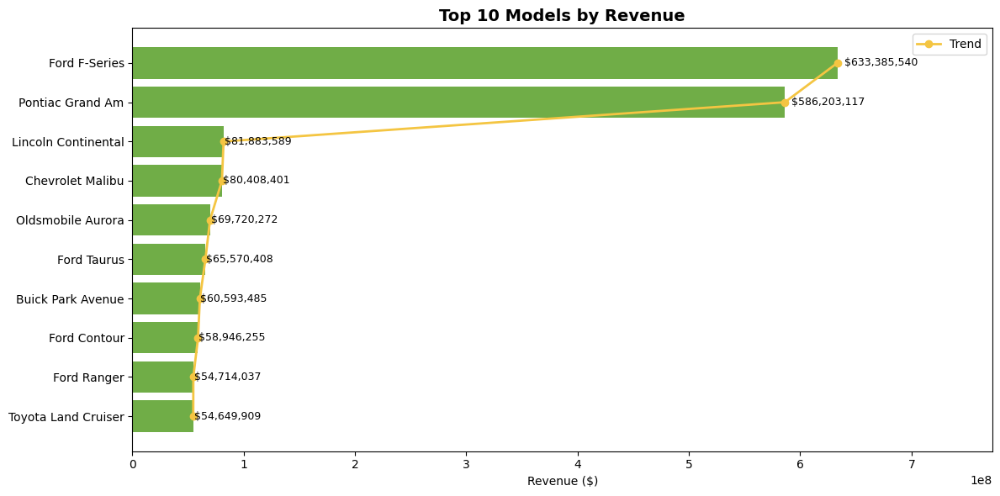


Top 10 Models:
Model
Ranger         1948
Camry          1325
Golf           1279
528i           1184
Cabrio         1113
F-Series       1090
Malibu         1059
Grand Am       1019
Park Avenue    1003
Continental     998
Name: UnitsSold, dtype: int64


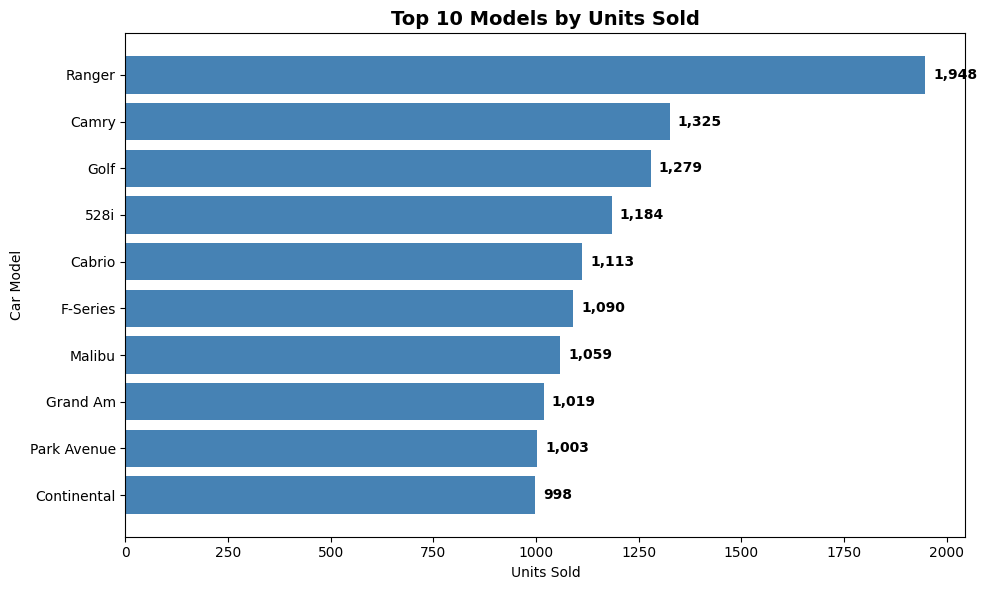


Sales by Fuel Type:
FuelType
Petrol    41712
Diesel    23874
Hybrid    10128
CNG        8094
Name: UnitsSold, dtype: int64


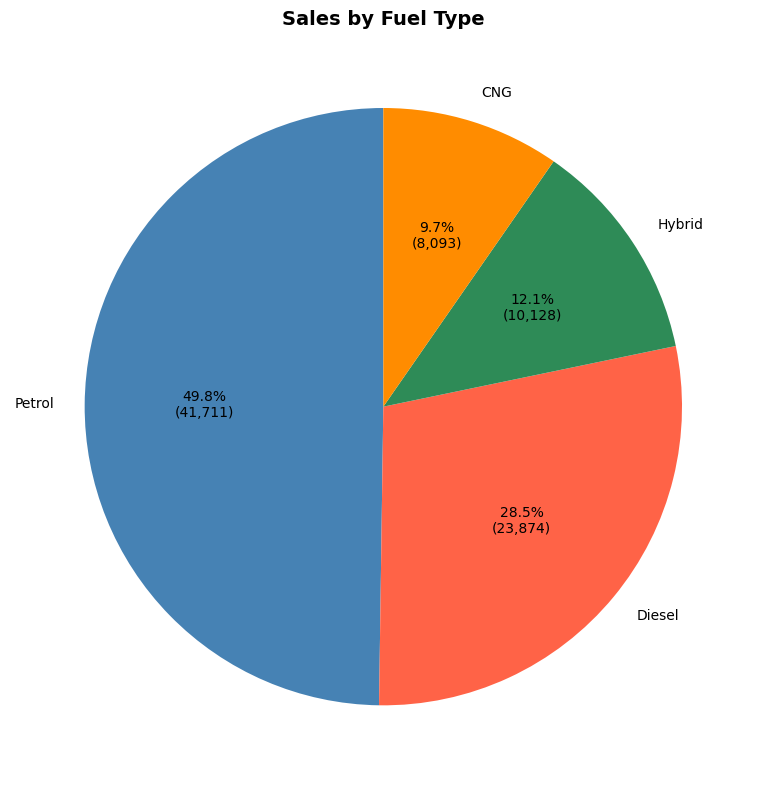

Analysis 1 complete


In [6]:
# ANALYSIS 1: Vehicle Sales Performance
from IPython.display import display

# Refresh fuel_perf with updated Dim_Vehicle data
sales_vehicle = fvs.merge(dim_vehicle, on="VehicleKey", how="left")
fuel_perf = (
    sales_vehicle.groupby("FuelType")
    .agg(TotalRevenue=("SaleAmount","sum"), UnitsSold=("UnitsSold","sum"))
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)
fuel_perf["RevenueShare%"] = (fuel_perf["TotalRevenue"] / fuel_perf["TotalRevenue"].sum() * 100).round(2)
print("Refreshed fuel_perf:")
print(fuel_perf.to_string(index=False))

# 1a. By Brand
brand_perf = (
    sales_vehicle
    .groupby("Brand")
    .agg(TotalRevenue=("SaleAmount","sum"), UnitsSold=("UnitsSold","sum"),
         AvgPrice=("SaleAmount","mean"), AvgDiscount=("Discount","mean"))
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)
brand_perf["RevenueShare%"] = (brand_perf["TotalRevenue"] / brand_perf["TotalRevenue"].sum() * 100).round(2)
brand_perf.index = range(1, len(brand_perf) + 1)

print("  1.1. Revenue by Brand")
display(
    brand_perf.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "AvgPrice": "${:,.0f}",
        "AvgDiscount": "${:,.0f}",
        "RevenueShare%": "{:.2f}%"
    })
)

# 1b. By Fuel Type
fuel_perf = (
    sales_vehicle
    .groupby("FuelType")
    .agg(TotalRevenue=("SaleAmount","sum"), UnitsSold=("UnitsSold","sum"))
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)
fuel_perf["RevenueShare%"] = (fuel_perf["TotalRevenue"] / fuel_perf["TotalRevenue"].sum() * 100).round(2)
fuel_perf.index = range(1, len(fuel_perf) + 1)

print("  1.2. Revenue by Fuel Type")
display(
    fuel_perf.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "RevenueShare%": "{:.2f}%"
    })
)

# 1c. By Body Type
body_perf = (
    sales_vehicle
    .groupby("BodyType")
    .agg(TotalRevenue=("SaleAmount","sum"), UnitsSold=("UnitsSold","sum"))
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)
body_perf["RevenueShare%"] = (body_perf["TotalRevenue"] / body_perf["TotalRevenue"].sum() * 100).round(2)
body_perf.index = range(1, len(body_perf) + 1)

print("  1.3. Revenue by Body Type")
display(
    body_perf.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "RevenueShare%": "{:.2f}%"
    })
)

# 1d. Top 15 Models
model_perf = (
    sales_vehicle
    .groupby(["Brand","Model"])
    .agg(TotalRevenue=("SaleAmount","sum"), UnitsSold=("UnitsSold","sum"),
         AvgPrice=("SaleAmount","mean"), AvgDiscount=("Discount","mean"))
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)

top15_models = model_perf.head(15).copy()
top15_models.index = range(1, len(top15_models) + 1)

print("  1.4. Top 15 Models by Revenue")
display(
    top15_models.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "AvgPrice": "${:,.0f}",
        "AvgDiscount": "${:,.0f}"
    })
)

# 1e. Most discounted models
over_discount = model_perf.sort_values("AvgDiscount", ascending=False).head(10)
over_discount.index = range(1, len(over_discount) + 1)

print("  1.5. Top 10 Most Discounted Models (Margin Alert)")
display(
    over_discount[["Brand","Model","AvgDiscount","TotalRevenue","UnitsSold"]]
    .style.format({
        "AvgDiscount": "${:,.0f}",
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}"
    })
)

fvs_model = fvs.merge(dim_vehicle[['VehicleKey', 'Brand', 'Model', 'FuelType']],
                       on='VehicleKey', how='left')
fvs_model['Date'] = pd.to_datetime(fvs_model['DateKey'].astype(str), format='%Y%m%d')
fvs_model['YearMonth'] = fvs_model['Date'].dt.to_period('M').dt.to_timestamp()

model_monthly = (fvs_model
                 .groupby(['YearMonth', 'Model'])['UnitsSold']
                 .sum()
                 .reset_index()
                 .rename(columns={'YearMonth': 'Date'}))

model_monthly = model_monthly[model_monthly['Model'].apply(lambda x: isinstance(x, str))]
print(f"model_monthly rebuilt — {model_monthly['Model'].nunique()} models, {len(model_monthly)} rows")

# TABLE: All 154 models — total units, avg monthly, peak month, fuel type
model_summary = (fvs_model.groupby(['Model', 'FuelType'])
                 .agg(Total_Units=('UnitsSold', 'sum'))
                 .reset_index())

model_summary['Avg_Monthly_Volume'] = (model_summary['Total_Units'] / 24).round(1)

peak_month = (fvs_model.groupby(['Model', 'YearMonth'])['UnitsSold']
              .sum()
              .reset_index()
              .sort_values('UnitsSold', ascending=False)
              .drop_duplicates('Model')
              [['Model', 'YearMonth', 'UnitsSold']]
              .rename(columns={'YearMonth': 'Peak_Month', 'UnitsSold': 'Peak_Month_Units'}))
peak_month['Peak_Month'] = peak_month['Peak_Month'].dt.strftime('%b %Y')

model_summary_table = (model_summary
                       .merge(peak_month, on='Model', how='left')
                       .sort_values('Total_Units', ascending=False)
                       .reset_index(drop=True))

model_summary_table = model_summary_table[
    ['Model', 'FuelType', 'Total_Units', 'Avg_Monthly_Volume', 'Peak_Month', 'Peak_Month_Units']
]

pd.set_option('display.max_rows', None)
pd.set_option('display.width', 200)
print(f"\n{'='*90}")
print(f"  ALL {model_summary_table['Model'].nunique()} MODELS — FULL SUMMARY TABLE")
print(f"{'='*90}")
print(model_summary_table.to_string(index=False))

model_summary_table.to_csv('all_models_summary_table.csv', index=False)
print(f"\nSaved to all_models_summary_table.csv")


# Chart 1: Top 10 Brands by Revenue
fig, ax = plt.subplots(figsize=(11, 6))
top10_brands_rev = brand_perf.head(10)
vals   = top10_brands_rev["TotalRevenue"][::-1].values
labels = top10_brands_rev["Brand"][::-1].values

bars = ax.barh(labels, vals, color="#2E75B6")
for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + bar.get_width()*0.01,
            bar.get_y() + bar.get_height()/2,
            f"${val:,.0f}", va="center", ha="left", fontsize=9)

ax.plot(vals, range(len(vals)), color="#F4C542",
        marker="o", linewidth=2, markersize=6, label="Trend")

ax.set_title("Top 10 Brands by Revenue", fontsize=14, fontweight="bold")
ax.set_xlabel("Total Revenue ($)")
ax.margins(x=0.22)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a1_chart1_brand_revenue.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 2: Revenue Share by Fuel Type
fig, ax = plt.subplots(figsize=(9, 6))
colors_pie = ["#E63946","#2A9D8F","#E9C46A","#F4A261","#457B9D"]
total = fuel_perf["TotalRevenue"].sum()
wedges, texts, autotexts = ax.pie(
    fuel_perf["TotalRevenue"],
    labels=fuel_perf["FuelType"],
    autopct=lambda p: f"{p:.1f}%\n${p/100*total:,.0f}",
    startangle=90,
    colors=colors_pie[:len(fuel_perf)],
    wedgeprops={"edgecolor":"white","linewidth":2},
    pctdistance=0.6,
    labeldistance=1.15,
    explode=[0.03]*len(fuel_perf),
)
for text in texts:
    text.set_fontsize(12)
    text.set_fontweight("bold")
    text.set_color("#1a1a1a")
for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color("000000")
    autotext.set_linespacing(1.8)
ax.set_title("Revenue Share by Fuel Type", fontsize=14, fontweight="bold", pad=20)
plt.tight_layout()
plt.savefig("/content/a1_chart2_fuel_type.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 3: Units Sold by Body Type
fig, ax = plt.subplots(figsize=(9, 5))
vals   = body_perf["UnitsSold"][::-1].values
labels = body_perf["BodyType"][::-1].values

bars = ax.barh(labels, vals, color="#1F3864")
for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + bar.get_width()*0.01,
            bar.get_y() + bar.get_height()/2,
            f"{int(val):,}", va="center", ha="left", fontsize=10)

ax.plot(vals, range(len(vals)), color="#F4C542",
        marker="o", linewidth=2, markersize=6, label="Trend")

ax.set_title("Units Sold by Body Type", fontsize=14, fontweight="bold")
ax.set_xlabel("Units Sold")
ax.margins(x=0.18)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a1_chart3_body_type.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 4: Top 10 Models by Revenue
fig, ax = plt.subplots(figsize=(12, 6))
top10m = model_perf.head(10)
labels = (top10m["Brand"] + " " + top10m["Model"])[::-1].values
vals   = top10m["TotalRevenue"][::-1].values

bars = ax.barh(labels, vals, color="#70AD47")
for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + bar.get_width()*0.01,
            bar.get_y() + bar.get_height()/2,
            f"${val:,.0f}", va="center", ha="left", fontsize=9)

ax.plot(vals, range(len(vals)), color="#F4C542",
        marker="o", linewidth=2, markersize=6, label="Trend")

ax.set_title("Top 10 Models by Revenue", fontsize=14, fontweight="bold")
ax.set_xlabel("Revenue ($)")
ax.margins(x=0.22)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a1_chart4_top_models.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 5: Top 10 Models by Units Sold
top10 = (model_monthly.groupby('Model')['UnitsSold']
         .sum()
         .sort_values(ascending=False)
         .head(10))

fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(top10.index[::-1], top10.values[::-1], color='steelblue')

for bar, val in zip(bars, top10.values[::-1]):
    ax.text(val + max(top10.values)*0.01, bar.get_y() + bar.get_height()/2,
            f'{val:,}', va='center', fontsize=10, fontweight='bold')

ax.set_title('Top 10 Models by Units Sold', fontsize=14, fontweight='bold')
ax.set_xlabel('Units Sold')
ax.set_ylabel('Car Model')
print(f"\nTop 10 Models:\n{top10}")

plt.tight_layout()
plt.savefig('top10_models_units_sold.png', dpi=150, bbox_inches='tight')
plt.show()

# Chart 6: Sales by Fuel Type (pie)
fvs_fuel = fvs.merge(dim_vehicle[['VehicleKey', 'FuelType']], on='VehicleKey', how='left')

fuel_sales = (fvs_fuel.groupby('FuelType')['UnitsSold']
              .sum()
              .sort_values(ascending=False))

fig, ax = plt.subplots(figsize=(8, 8))
colors = ['steelblue', 'tomato', 'seagreen', 'darkorange', 'purple', 'goldenrod']

wedges, texts, autotexts = ax.pie(
    fuel_sales.values,
    labels=fuel_sales.index,
    autopct=lambda pct: f'{pct:.1f}%\n({int(pct/100*fuel_sales.sum()):,})',
    colors=colors[:len(fuel_sales)],
    startangle=90,
    textprops={'fontsize': 10}
)

ax.set_title('Sales by Fuel Type', fontsize=14, fontweight='bold')
print(f"\nSales by Fuel Type:\n{fuel_sales}")

plt.tight_layout()
plt.savefig('sales_by_fuel_type.png', dpi=150, bbox_inches='tight')
plt.show()


print("Analysis 1 complete")

Analysis 2: Dealer & Region Comparison
- Dealers by Revenue identifies the highest-performing dealerships based on total sales revenue generated.
- Bottom 10 Dealers highlights the weakest-performing dealerships by revenue and units sold.
- Revenue by Zone compares overall business performance across geographic zones.
- Revenue by State breaks performance down further to the state level to identify the strongest and weakest regional markets.

  2.1. Top 15 Dealers by Revenue


,DealerName,City,State,TotalRevenue,UnitsSold,RevenuePerExec
1,Chrysler of Tri-Cities,Scottsdale,Arizona,"$133,827,190","2,768","$362,675"
2,Buddy Storbeck's Diesel Service Inc,Pasco,Washington,"$53,569,306","1,103","$151,754"
3,C & M Motors Inc,Pasco,Washington,"$52,523,987","1,091","$148,373"
4,Capitol KIA,Pasco,Washington,"$51,130,508","1,091","$149,069"
5,Chrysler Plymouth,Pasco,Washington,"$50,081,811","1,082","$141,474"
6,Chrysler of Tri-Cities,Pasco,Washington,"$49,489,964","1,048","$139,408"
7,Clay Johnson Auto Sales,Scottsdale,Arizona,"$44,788,646",933,"$131,731"
8,Capitol KIA,Scottsdale,Arizona,"$44,384,579",835,"$133,287"
9,C & M Motors Inc,Scottsdale,Arizona,"$43,951,464",886,"$128,890"
10,Chrysler Plymouth,Scottsdale,Arizona,"$41,723,768",897,"$123,079"


  2.2. Bottom 10 Dealers


,DealerName,City,State,TotalRevenue,UnitsSold
117,C & M Motors Inc,Middletown,Ohio,"$23,730,610",497
118,U-Haul CO,Middletown,Ohio,"$23,667,735",551
119,Motor Vehicle Branch Office,Middletown,Ohio,"$23,555,631",512
120,Ryder Truck Rental and Leasing,Middletown,Ohio,"$23,175,982",563
121,Chrysler Plymouth,Janesville,Wisconsin,"$22,987,309",562
122,New Castle Ford Lincoln Mercury,Middletown,Ohio,"$22,709,216",555
123,Scrivener Performance Engineering,Middletown,Ohio,"$22,561,791",525
124,Chrysler of Tri-Cities (Middletown Branch 4),Middletown,Ohio,"$22,481,690",548
125,Enterprise Rent A Car,Middletown,Ohio,"$22,148,612",513
126,Capitol KIA,Janesville,Wisconsin,"$21,318,510",536


  2.3. Revenue by Zone


,Zone,TotalRevenue,UnitsSold,Dealers,AvgDiscount,RevenuePerDealer
1,West,"$2,735,875,229","57,864",126,"$2,632","$21,713,295"
2,Midwest,"$638,431,158","13,163",126,"$2,580","$5,066,914"
3,South,"$550,138,363","11,181",126,"$2,585","$4,366,177"


  2.4. Revenue by State


,State,Zone,TotalRevenue,UnitsSold,Dealers
1,Wisconsin,West,"$610,213,891","13,055",30
2,Ohio,West,"$526,911,602","11,290",35
3,Texas,West,"$511,909,028","10,789",22
4,Arizona,West,"$342,591,860","7,194",8
5,Colorado,West,"$316,061,720","6,645",12
6,Ohio,Midwest,"$255,313,417","5,323",35
7,Washington,West,"$216,614,338","4,529",5
8,South Carolina,West,"$211,572,790","4,362",14
9,South Carolina,South,"$178,338,154","3,756",14
10,Ohio,South,"$111,298,621","2,232",35


  2.5. Top 10 Most Efficient Dealers (Units per Sales Exec)


,DealerName,City,UnitsSold,ExecCount,UnitsPerExec
1,Chrysler of Tri-Cities,Scottsdale,"2,768",369,7.5
2,Capitol KIA,Pasco,"1,091",343,3.2
3,C & M Motors Inc,Pasco,"1,091",354,3.1
4,Buddy Storbeck's Diesel Service Inc,Pasco,"1,103",353,3.1
5,Chrysler Plymouth,Pasco,"1,082",354,3.1
6,Chrysler of Tri-Cities,Pasco,"1,048",355,3.0
7,Clay Johnson Auto Sales,Scottsdale,933,340,2.7
8,Diehl Motor CO Inc,Scottsdale,899,336,2.7
9,Classic Chevy,Scottsdale,865,333,2.6
10,Chrysler Plymouth,Scottsdale,897,339,2.6


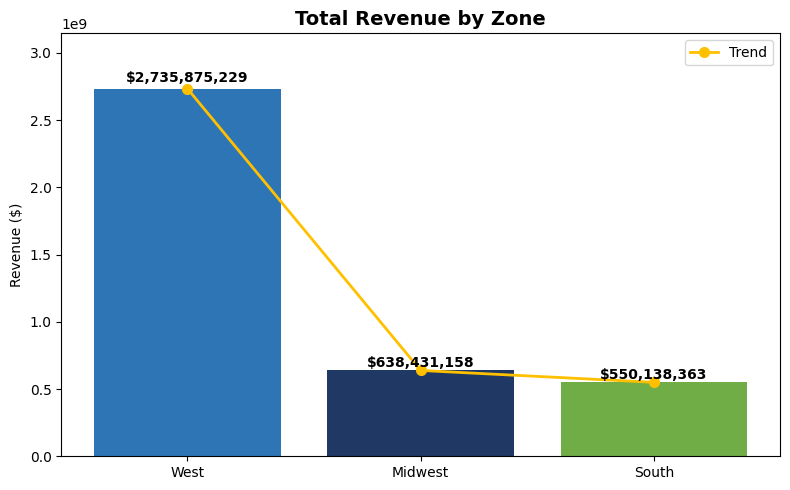

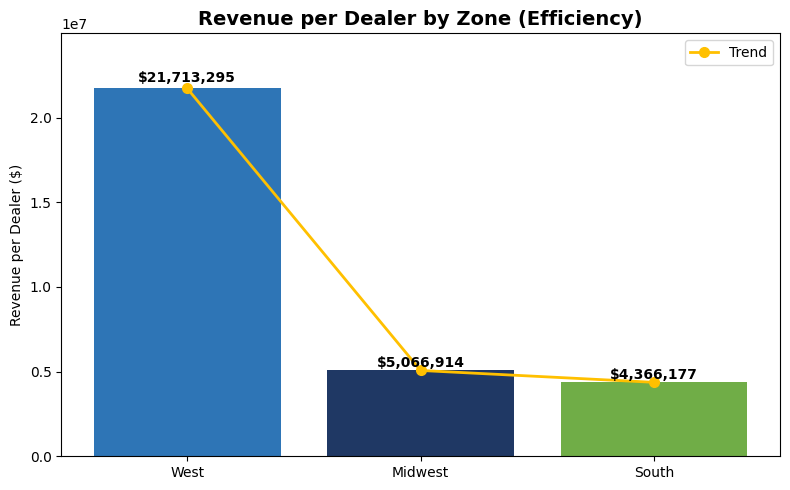

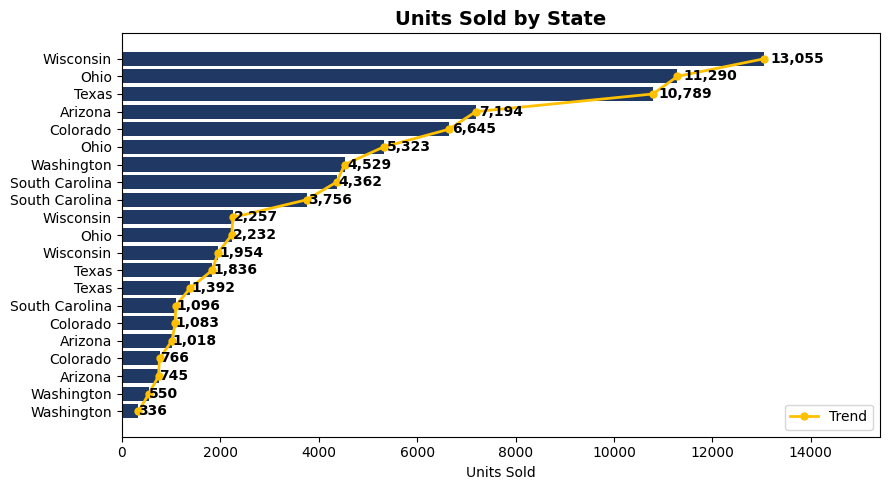

Analysis 2 complete


In [7]:
# ANALYSIS 2: Dealer & Region Comparison
from IPython.display import display
sales_dealer = (
    fvs
    .merge(dim_dealer[["DealerKey","DealerName","DealerType","City","State"]],
           on="DealerKey", how="left")
    .merge(dim_region[["RegionKey","Zone"]],
           on="RegionKey", how="left")
    .merge(dim_exec[["SalesExecKey","SalesExecName","Experience"]],
           on="SalesExecKey", how="left")
)

# 2a. By Dealer
dealer_perf = (
    sales_dealer
    .groupby(["DealerKey","DealerName","City","State"])
    .agg(
        TotalRevenue=("SaleAmount","sum"),
        UnitsSold=("UnitsSold","sum"),
        AvgDiscount=("Discount","mean"),
        UniqueExecs=("SalesExecKey","nunique")
    )
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)

dealer_perf["RevenuePerExec"] = (
    dealer_perf["TotalRevenue"] / dealer_perf["UniqueExecs"]
).round(0).astype(int)

dealer_perf.index = range(1, len(dealer_perf) + 1)

print("  2.1. Top 15 Dealers by Revenue")

display(
    dealer_perf.head(15)[
        ["DealerName","City","State","TotalRevenue","UnitsSold","RevenuePerExec"]
    ]
    .style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "RevenuePerExec": "${:,.0f}"
    })
)

print("  2.2. Bottom 10 Dealers")

display(
    dealer_perf.tail(10)[
        ["DealerName","City","State","TotalRevenue","UnitsSold"]
    ]
    .style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}"
    })
)

# 2b. By Zone
zone_perf = (
    sales_dealer
    .groupby("Zone")
    .agg(
        TotalRevenue=("SaleAmount","sum"),
        UnitsSold=("UnitsSold","sum"),
        Dealers=("DealerKey","nunique"),
        AvgDiscount=("Discount","mean")
    )
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)

zone_perf["RevenuePerDealer"] = (
    zone_perf["TotalRevenue"] / zone_perf["Dealers"]
).round(0).astype(int)

zone_perf.index = range(1, len(zone_perf) + 1)

print("  2.3. Revenue by Zone")

display(
    zone_perf.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}",
        "RevenuePerDealer": "${:,.0f}",
        "AvgDiscount": "${:,.0f}"
    })
)

# 2c. By State
state_perf = (
    sales_dealer
    .groupby(["State","Zone"])
    .agg(
        TotalRevenue=("SaleAmount","sum"),
        UnitsSold=("UnitsSold","sum"),
        Dealers=("DealerKey","nunique")
    )
    .reset_index()
    .sort_values("TotalRevenue", ascending=False)
)

state_perf.index = range(1, len(state_perf) + 1)

print("  2.4. Revenue by State")

display(
    state_perf.style.format({
        "TotalRevenue": "${:,.0f}",
        "UnitsSold": "{:,}"
    })
)

# 2d. Exec Efficiency
exec_eff = (
    sales_dealer
    .groupby(["DealerName","City"])
    .agg(
        UnitsSold=("UnitsSold","sum"),
        ExecCount=("SalesExecKey","nunique")
    )
    .reset_index()
)

exec_eff["UnitsPerExec"] = (
    exec_eff["UnitsSold"] / exec_eff["ExecCount"]
).round(1)

exec_eff = exec_eff.sort_values("UnitsPerExec", ascending=False)
exec_eff.index = range(1, len(exec_eff) + 1)

print("  2.5. Top 10 Most Efficient Dealers (Units per Sales Exec)")

display(
    exec_eff.head(10)[
        ["DealerName","City","UnitsSold","ExecCount","UnitsPerExec"]
    ]
    .style.format({
        "UnitsSold": "{:,}",
        "ExecCount": "{:,}",
        "UnitsPerExec": "{:.1f}"
    })
)

# Charts

# Chart 1: Total Revenue by Zone
fig, ax = plt.subplots(figsize=(8, 5))

zone_colors = {"West":"#2E75B6","Midwest":"#1F3864","South":"#70AD47"}

bars = ax.bar(zone_perf["Zone"],
              zone_perf["TotalRevenue"],
              color=[zone_colors.get(z,"gray") for z in zone_perf["Zone"]])

ax.plot(range(len(zone_perf)),
        zone_perf["TotalRevenue"].values,
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=7,
        label="Trend")

for bar, val in zip(bars, zone_perf["TotalRevenue"]):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + bar.get_height() * 0.01,
            f"${val:,.0f}",
            ha="center", va="bottom",
            fontsize=10, fontweight="bold")

ax.set_title("Total Revenue by Zone", fontsize=14, fontweight="bold")
ax.set_ylabel("Revenue ($)")
ax.margins(y=0.15)
ax.legend()

plt.tight_layout()
plt.show()

# Chart 2: Revenue per Dealer by Zone
fig, ax = plt.subplots(figsize=(8, 5))

bars = ax.bar(zone_perf["Zone"],
              zone_perf["RevenuePerDealer"],
              color=[zone_colors.get(z,"gray") for z in zone_perf["Zone"]])

ax.plot(range(len(zone_perf)),
        zone_perf["RevenuePerDealer"].values,
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=7,
        label="Trend")

for bar, val in zip(bars, zone_perf["RevenuePerDealer"]):
    ax.text(bar.get_x() + bar.get_width() / 2,
            bar.get_height() + bar.get_height() * 0.01,
            f"${val:,.0f}",
            ha="center", va="bottom",
            fontsize=10, fontweight="bold")

ax.set_title("Revenue per Dealer by Zone (Efficiency)", fontsize=14, fontweight="bold")
ax.set_ylabel("Revenue per Dealer ($)")
ax.margins(y=0.15)
ax.legend()

plt.tight_layout()
plt.show()

# Chart 3: Units Sold by State
fig, ax = plt.subplots(figsize=(9, 5))

# Fix: sort ascending so bars and line both go small → large
state_sorted = state_perf.sort_values("UnitsSold", ascending=True)
labels = state_sorted["State"].values
vals   = state_sorted["UnitsSold"].values

bars = ax.barh(range(len(labels)), vals, color="#1F3864")
ax.plot(vals, range(len(vals)), "o-",
        color="#FFC000", linewidth=2, markersize=5, label="Trend")

for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + bar.get_width()*0.01,
            bar.get_y() + bar.get_height()/2,
            f"{int(val):,}", va="center", ha="left",
            fontsize=10, fontweight="bold")

ax.set_yticks(range(len(labels)))
ax.set_yticklabels(labels)
ax.set_title("Units Sold by State", fontsize=14, fontweight="bold")
ax.set_xlabel("Units Sold")
ax.margins(x=0.18)
ax.legend()

plt.tight_layout()
plt.show()

print("Analysis 2 complete")

ANALYSIS 3: Campaign ROI & Conversion Funnel
- Overall Conversion Funnel measures how customers move through the marketing pipeline from seeing an advertisement to finally booking a vehicle. It helps identify where the biggest drop-offs happen.
- Overall Campaign Financial Summary evaluates the overall profitability of all campaigns combined by comparing total marketing spend against total revenue generated.
- ROI by Campaign Type compares the performance of different campaign categories such as digital ads, seasonal offers, influencer campaigns, or email marketing.
- ROI by Channel measures which marketing channels ( YouTube, Referral, Instagram, or Email) generate the best returns.
- Top 5 Campaigns by ROI identifies the best-performing individual campaigns based on return on investment.
- Bottom 5 Campaigns by ROI highlights campaigns that failed to recover their marketing costs or performed significantly below expectations.

  3.1. Overall Conversion Funnel


,Metric,Value,Conversion Rate
1,Impressions,70292933,100%
2,Leads,2883606,4.102%
3,Test Drives,471691,16.36% of leads
4,Bookings,135082,28.64% of TDs


  3.2. Overall Campaign Financial Summary


,Metric,Value
1,Total Spend,1.152541e+09
2,Total Revenue,1.453180e+09
3,Overall ROI,2.608490e+01
4,Cost per Lead,3.996874e+02
5,Cost per Booking,8.532158e+03


  3.3. ROI by Campaign Type


,CampaignType,Campaigns,TotalRevenue,TotalCost,TotalBookings,NetROI%,CostPerBook
1,Referral,47,1.708704e+08,1.303873e+08,15080,31.05,8646.37
2,Product Launch,56,2.099536e+08,1.618841e+08,19140,29.69,8457.89
3,Discount,50,2.058686e+08,1.600910e+08,17908,28.59,8939.64
4,Seasonal,43,1.675248e+08,1.305119e+08,14226,28.36,9174.18
5,Digital,51,1.865573e+08,1.505100e+08,18663,23.95,8064.62
6,Awareness,37,1.373144e+08,1.110605e+08,13206,23.64,8409.85
7,Test Drive,52,1.774651e+08,1.448982e+08,17045,22.48,8500.92
8,Loyalty,50,1.924452e+08,1.588031e+08,18781,21.18,8455.52


  3.4. ROI by Channel


,ChannelName,TotalCost,TotalRevenue,TotalLeads,TotalTDs,TotalBookings,NetROI%,CostPerLead
1,YouTube,70811463.38,9.886352e+07,178364,28330,7868,39.62,397.01
2,Facebook,61740678.71,8.442120e+07,145701,25022,7120,36.74,423.75
3,Referral,42263401.29,5.736605e+07,113492,18249,5420,35.73,372.39
4,Cold Call / Telemarketing,69397606.63,9.328364e+07,178482,29367,8925,34.42,388.82
5,SMS,77736443.35,1.040940e+08,184546,28508,7946,33.91,421.23
6,Outdoor / Billboard,61904003.82,8.217325e+07,137305,21098,6415,32.74,450.85
7,Google Search,39660409.30,5.235491e+07,110839,17863,5369,32.01,357.82
8,Showroom Walk-in,53145514.57,6.692458e+07,118138,18790,5488,25.93,449.86
9,TV Advertisement,72733414.02,9.145513e+07,195340,31200,8211,25.74,372.34
10,Website / Direct,64445163.84,7.994199e+07,164156,27012,7700,24.05,392.58


  3.5. Top 5 Campaigns by ROI


,CampaignName,CampaignType,ChannelName,ROI_pct,CampaignCost,RevenueGenerated
1,Product Launch Campaign 949,Referral,Outdoor / Billboard,74.5,3339044.42,5826650.03
2,Discount Campaign 967,Awareness,YouTube,74.5,4797813.29,8372209.36
3,Awareness Campaign 972,Digital,Google Search,74.5,6397909.22,11164385.15
4,Product Launch Campaign 997,Discount,Cold Call / Telemarketing,74.5,4088193.56,7133919.21
5,Digital Campaign 897,Test Drive,LinkedIn / B2B Social,74.1,1642387.65,2859334.01


  3.6. Bottom 5 Campaigns by ROI


,CampaignName,CampaignType,ChannelName,ROI_pct,CampaignCost,RevenueGenerated
1,Holiday Savings,Product Launch,Referral,-24.76,303308.85,228208.0
2,Weekend Warrior Deal,Awareness,Website / Direct,-24.73,146061.26,109934.0
3,Premium Drive Days,Awareness,Showroom Walk-in,-24.31,143871.37,108892.0
4,SUV Launch Promo,Digital,Cold Call / Telemarketing,-23.38,91416.69,70045.0
5,Festive Bonanza,Loyalty,Dealer Partner Network,-23.11,100820.32,77516.0


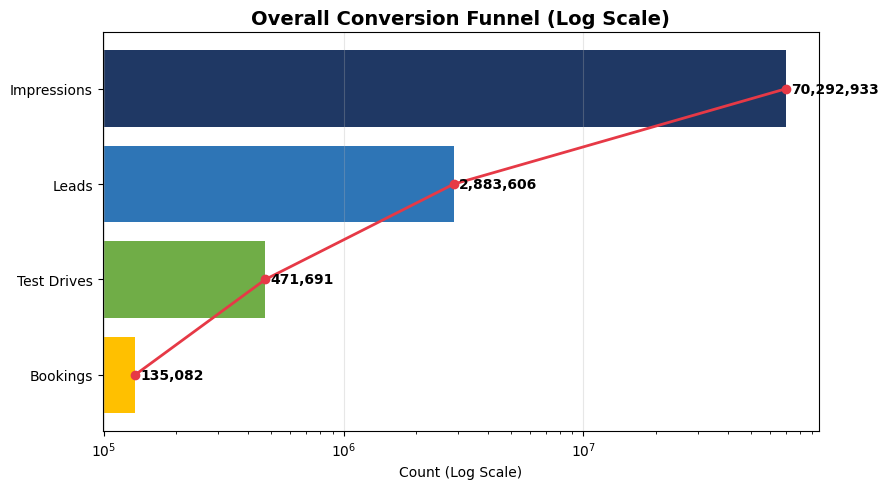

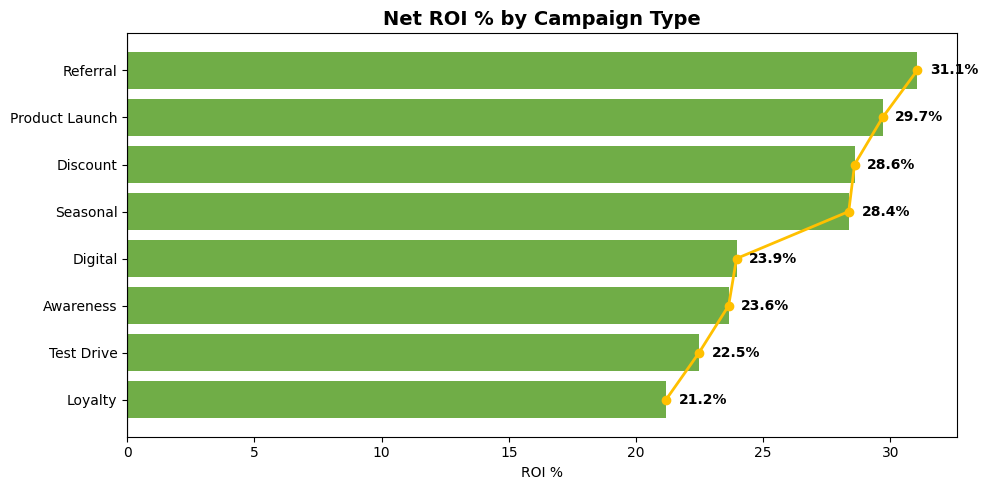

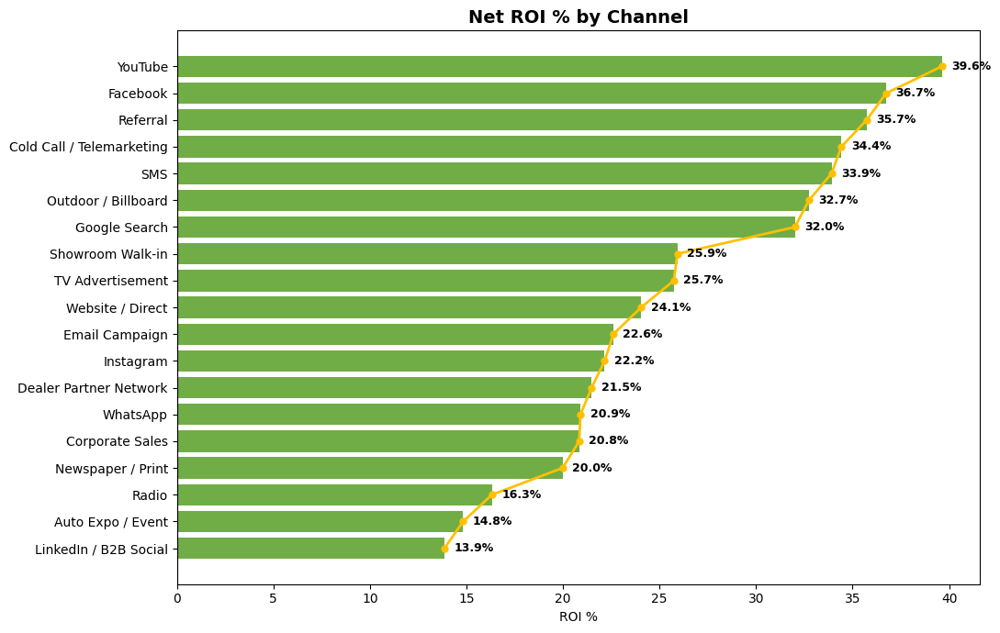

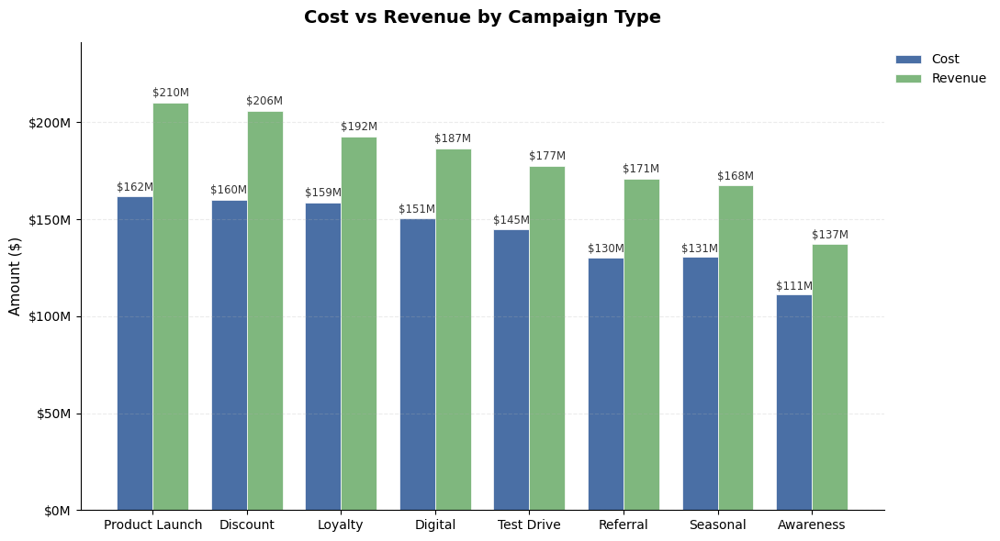

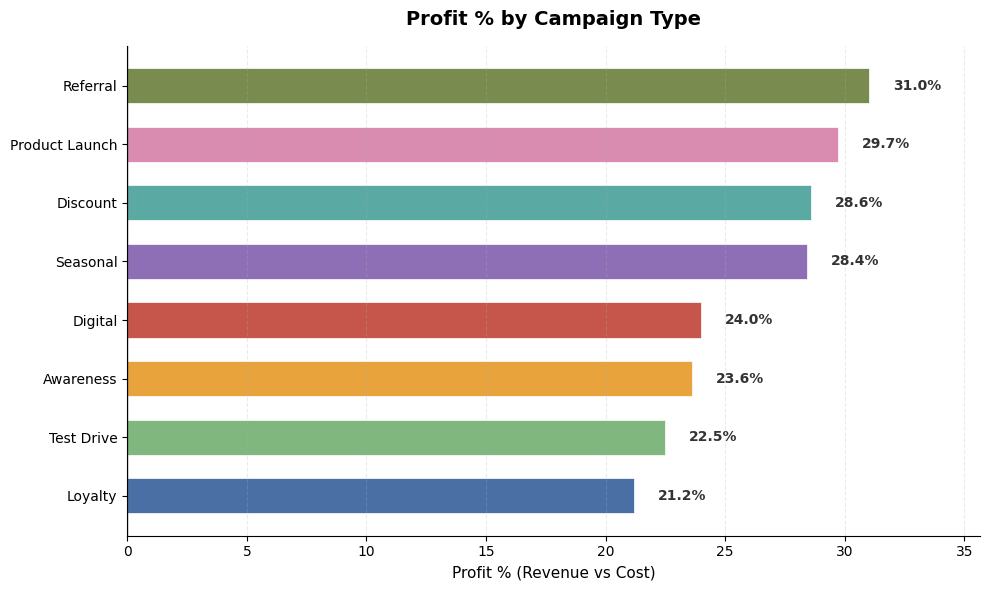

Analysis 3 complete


In [8]:
# ANALYSIS 3: Campaign ROI & Conversion Funnel
import matplotlib.ticker as mticker
camp_data = (
    fmc
    .merge(dim_campaign, on="CampaignKey", how="left")
    .merge(dim_channel[["ChannelKey","ChannelName"]], on="ChannelKey", how="left")
)

camp_data["ROI_pct"]        = ((camp_data["RevenueGenerated"] - camp_data["CampaignCost"]) / camp_data["CampaignCost"] * 100).round(2)
camp_data["ImpToLead_pct"]  = (camp_data["Leads"]     / camp_data["Impressions"] * 100).round(3)
camp_data["LeadToTD_pct"]   = (camp_data["TestDrives"] / camp_data["Leads"]       * 100).round(2)
camp_data["TDToBook_pct"]   = (camp_data["Bookings"]   / camp_data["TestDrives"]  * 100).round(2)
camp_data["CostPerLead"]    = (camp_data["CampaignCost"] / camp_data["Leads"]).round(2)
camp_data["CostPerBooking"] = (camp_data["CampaignCost"] / camp_data["Bookings"]).round(2)


# 3a. Funnel summary
total_imp  = camp_data["Impressions"].sum()
total_lead = camp_data["Leads"].sum()
total_td   = camp_data["TestDrives"].sum()
total_book = camp_data["Bookings"].sum()
total_cost = camp_data["CampaignCost"].sum()
total_rev  = camp_data["RevenueGenerated"].sum()

funnel_df = pd.DataFrame({
    "Metric": ["Impressions", "Leads", "Test Drives", "Bookings"],
    "Value": [total_imp, total_lead, total_td, total_book],
    "Conversion Rate": [
        "100%",
        f"{total_lead/total_imp*100:.3f}%",
        f"{total_td/total_lead*100:.2f}% of leads",
        f"{total_book/total_td*100:.2f}% of TDs"
    ]
})

funnel_df.index = range(1, len(funnel_df) + 1)

print("  3.1. Overall Conversion Funnel")
display(funnel_df)


# 3b. By Campaign Type
roi_summary = pd.DataFrame({
    "Metric": ["Total Spend","Total Revenue","Overall ROI","Cost per Lead","Cost per Booking"],
    "Value": [
        total_cost,
        total_rev,
        (total_rev-total_cost)/total_cost*100,
        total_cost/total_lead,
        total_cost/total_book
    ]
})

roi_summary.index = range(1, len(roi_summary) + 1)

print("  3.2. Overall Campaign Financial Summary")

display(roi_summary)


# 3c. By Channel
type_roi = (
    camp_data
    .groupby("CampaignType")
    .agg(
        Campaigns=("CampaignKey","count"),
        TotalRevenue=("RevenueGenerated","sum"),
        TotalCost=("CampaignCost","sum"),
        TotalBookings=("Bookings","sum")
    )
    .reset_index()
)

type_roi["NetROI%"]     = ((type_roi["TotalRevenue"] - type_roi["TotalCost"]) / type_roi["TotalCost"] * 100).round(2)
type_roi["CostPerBook"] = (type_roi["TotalCost"] / type_roi["TotalBookings"]).round(2)
type_roi = type_roi.sort_values("NetROI%", ascending=False)

type_roi.index = range(1, len(type_roi) + 1)

print("  3.3. ROI by Campaign Type")

display(type_roi)

# 3d. Best & worst campaigns
channel_roi = (
    camp_data
    .groupby("ChannelName")
    .agg(
        TotalCost=("CampaignCost","sum"),
        TotalRevenue=("RevenueGenerated","sum"),
        TotalLeads=("Leads","sum"),
        TotalTDs=("TestDrives","sum"),
        TotalBookings=("Bookings","sum")
    )
    .reset_index()
)

channel_roi["NetROI%"]     = ((channel_roi["TotalRevenue"] - channel_roi["TotalCost"]) / channel_roi["TotalCost"] * 100).round(2)
channel_roi["CostPerLead"] = (channel_roi["TotalCost"] / channel_roi["TotalLeads"]).round(2)
channel_roi = channel_roi.sort_values("NetROI%", ascending=False)

channel_roi.index = range(1, len(channel_roi) + 1)

print("  3.4. ROI by Channel")

display(channel_roi)


# 3e TOP 5 CAMPAIGNS BY ROI
top5 = camp_data.nlargest(5,"ROI_pct")[
    ["CampaignName","CampaignType","ChannelName","ROI_pct","CampaignCost","RevenueGenerated"]
].copy()

top5.index = range(1, len(top5) + 1)

print("  3.5. Top 5 Campaigns by ROI")

display(top5)


# 3f BOTTOM 5 CAMPAIGNS BY ROI

bottom5 = camp_data.nsmallest(5,"ROI_pct")[
    ["CampaignName","CampaignType","ChannelName","ROI_pct","CampaignCost","RevenueGenerated"]
].copy()

bottom5.index = range(1, len(bottom5) + 1)

print("  3.6. Bottom 5 Campaigns by ROI")

display(bottom5)

# Charts
# Chart 1: Conversion Funnel
fig, ax = plt.subplots(figsize=(9, 5))

stages = ["Impressions","Leads","Test Drives","Bookings"]
values = [total_imp, total_lead, total_td, total_book]
colors = ["#1F3864","#2E75B6","#70AD47","#FFC000"]

bars = ax.barh(stages[::-1], values[::-1], color=colors[::-1])

ax.set_xscale("log")

for bar, val in zip(bars, values[::-1]):
    ax.text(bar.get_width() * 1.05,
            bar.get_y() + bar.get_height() / 2,
            f"{val:,.0f}",
            va="center", ha="left",
            fontsize=10, fontweight="bold")

ax.plot(values[::-1],
        range(len(values)),
        "o-",
        color="#E63946",
        linewidth=2,
        markersize=6,
        label="Trend")

ax.set_title("Overall Conversion Funnel (Log Scale)", fontsize=14, fontweight="bold")
ax.set_xlabel("Count (Log Scale)")
ax.grid(axis="x", alpha=0.3)

plt.tight_layout()
plt.show()

# Chart 2: ROI by Campaign Type
fig, ax = plt.subplots(figsize=(10, 5))

type_s = type_roi.sort_values("NetROI%")

bars = ax.barh(type_s["CampaignType"],
               type_s["NetROI%"],
               color=["#70AD47" if x >= 0 else "#FF0000" for x in type_s["NetROI%"]])

ax.axvline(0, color="black", linewidth=0.8)

for bar, val in zip(bars, type_s["NetROI%"]):
    x_pos = bar.get_width() + 0.5 if val >= 0 else bar.get_width() - 0.5
    ha = "left" if val >= 0 else "right"
    ax.text(x_pos,
            bar.get_y() + bar.get_height() / 2,
            f"{val:.1f}%",
            va="center", ha=ha,
            fontsize=10, fontweight="bold")

ax.plot(type_s["NetROI%"],
        range(len(type_s)),
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=6,
        label="Trend")

ax.set_title("Net ROI % by Campaign Type", fontsize=14, fontweight="bold")
ax.set_xlabel("ROI %")

plt.tight_layout()
plt.show()

# Chart 3: ROI by Channel
fig, ax = plt.subplots(figsize=(11, 7))

ch_s = channel_roi.sort_values("NetROI%")

bars = ax.barh(ch_s["ChannelName"],
               ch_s["NetROI%"],
               color=["#70AD47" if x >= 0 else "#FF0000" for x in ch_s["NetROI%"]])

ax.axvline(0, color="black", linewidth=0.8)

for bar, val in zip(bars, ch_s["NetROI%"]):
    x_pos = bar.get_width() + 0.5 if val >= 0 else bar.get_width() - 0.5
    ha = "left" if val >= 0 else "right"
    ax.text(x_pos,
            bar.get_y() + bar.get_height() / 2,
            f"{val:.1f}%",
            va="center", ha=ha,
            fontsize=9, fontweight="bold")

ax.plot(ch_s["NetROI%"],
        range(len(ch_s)),
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=5,
        label="Trend")

ax.set_title("Net ROI % by Channel", fontsize=14, fontweight="bold")
ax.set_xlabel("ROI %")

plt.tight_layout()
plt.show()

# Chart 4: Cost vs Revenue
camp_type = (
    camp_data
    .groupby("CampaignType", as_index=False)
    .agg(Cost=("CampaignCost","sum"), Revenue=("RevenueGenerated","sum"))
)
camp_type_sorted = camp_type.sort_values("Revenue", ascending=False)

x = np.arange(len(camp_type_sorted))
w = 0.38

fig, ax = plt.subplots(figsize=(11, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars_cost = ax.bar(x - w/2, camp_type_sorted["Cost"], w,
                    label="Cost", color="#4A6FA5", edgecolor="white", linewidth=0.5)
bars_rev  = ax.bar(x + w/2, camp_type_sorted["Revenue"], w,
                    label="Revenue", color="#7FB77E", edgecolor="white", linewidth=0.5)

# Value labels — horizontal, small, clean
for bar in bars_cost:
    h = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, h + h*0.01, f"${h/1e6:.0f}M",
            ha="center", va="bottom", fontsize=8.5, color="#333")
for bar in bars_rev:
    h = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, h + h*0.01, f"${h/1e6:.0f}M",
            ha="center", va="bottom", fontsize=8.5, color="#333")

ax.set_xticks(x)
ax.set_xticklabels(camp_type_sorted["CampaignType"], fontsize=10)
ax.set_title("Cost vs Revenue by Campaign Type", fontsize=14, fontweight="bold", pad=15)
ax.set_ylabel("Amount ($)", fontsize=11)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: f"${v/1e6:.0f}M"))

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.legend(loc="upper left", bbox_to_anchor=(1.0, 1.0), frameon=False, fontsize=10)
ax.margins(y=0.15)

plt.tight_layout()
plt.show()

# Chart 5: Profit % by Campaign Type — distinct color per bar
camp_type["Profit%"] = ((camp_type["Revenue"] - camp_type["Cost"]) / camp_type["Cost"] * 100).round(1)
camp_type_profit_sorted = camp_type.sort_values("Profit%", ascending=True)

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

palette = ["#4A6FA5", "#7FB77E", "#E8A33D", "#C6564C",
           "#8E6FB5", "#5AA9A3", "#D98BB0", "#7A8B4F"]
colors = [palette[i % len(palette)] for i in range(len(camp_type_profit_sorted))]

bars = ax.barh(camp_type_profit_sorted["CampaignType"], camp_type_profit_sorted["Profit%"],
                color=colors, edgecolor="white", linewidth=0.5, height=0.6)

ax.axvline(0, color="#555", linewidth=1)

for bar, val in zip(bars, camp_type_profit_sorted["Profit%"]):
    x_pos = bar.get_width() + (1 if val >= 0 else -1)
    ha = "left" if val >= 0 else "right"
    ax.text(x_pos, bar.get_y() + bar.get_height()/2, f"{val:.1f}%",
            va="center", ha=ha, fontsize=10, fontweight="bold", color="#333")

ax.set_title("Profit % by Campaign Type", fontsize=14, fontweight="bold", pad=15)
ax.set_xlabel("Profit % (Revenue vs Cost)", fontsize=11)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis="x", linestyle="--", alpha=0.25)
ax.margins(x=0.15)

plt.tight_layout()
plt.show()

print("Analysis 3 complete")

profit loss comparison graph

ANALYSIS 4: Test Drive to Purchase Conversion
- Overall Conversion Summary is the health check of entire sales process after test drives. Shows whether product + sales experience is convincing enough.
- Conversion by Channel checks which channels bring customers who are more likely to buy after a test drive.
- Conversion by Brand shows how different car brands perform after test drives.
- Conversion by Body Type analyzes how body styles affect customer conversions.
- Conversion by Customer Type segments conversion by customer category into new or loyal etc.
-Top & Bottom Dealers ranks dealers by conversion performance.

  4.1. Test Drive Conversion Overview


,Metric,Value
1,Total Test Drives,"68,933"
2,Converted,"11,468"
3,Not Converted,"57,465"
4,Overall Conv Rate,16.6%
5,Industry Benchmark,15–20%
6,Status,Above


  4.2. Conversion Rate by Channel


,ChannelName,Conversions,TotalTDs,ConvRate%
1,Website / Direct,675,3700,18.2
2,Auto Expo / Event,677,3738,18.1
3,Instagram,469,2665,17.6
4,Outdoor / Billboard,615,3527,17.4
5,Facebook,450,2581,17.4
6,Radio,609,3569,17.1
7,LinkedIn / B2B Social,1025,6011,17.1
8,Newspaper / Print,538,3156,17.0
9,WhatsApp,573,3401,16.8
10,Corporate Sales,698,4173,16.7


  4.3. Conversion Rate by Brand


,Brand,Conversions,TotalTDs,ConvRate%
1,BMW,928,3977,23.3
2,Hyundai,355,1714,20.7
3,Subaru,140,680,20.6
4,Acura,210,1042,20.2
5,Plymouth,253,1253,20.2
6,Jeep,173,874,19.8
7,Toyota,813,4322,18.8
8,Mitsubishi,577,3078,18.7
9,Mercedes-B,510,2808,18.2
10,Saab,101,566,17.8


  4.4. Conversion Rate by Body Type


,BodyType,Conversions,TotalTDs,ConvRate%
1,SUV,3679,15068,24.4
2,Hatchback,3727,18735,19.9
3,Sedan,1535,10935,14.0
4,Hardtop,1172,9533,12.3
5,Passenger,1355,14662,9.2


  4.5. Conversion Rate by Customer Type


,CustomerType,Conversions,TotalTDs,ConvRate%
1,Loyal,3316,10923,30.4
2,Returning,3897,20379,19.1
3,New,4255,37631,11.3


  4.6. Top 10 Dealers by Conversion Rate


,DealerName,City,Conversions,TotalTDs,ConvRate%
1,Pitre Buick-Pontiac-Gmc of Scottsdale,Janesville,105,478,22.0
2,Enterprise Rent A Car,Middletown,75,350,21.4
3,Capitol KIA (Middletown Branch 2),Middletown,111,522,21.3
4,Pars Auto Sales,Austin,105,500,21.0
5,Iceberg Rentals,Janesville,98,480,20.4
6,Buddy Storbeck's Diesel Service Inc,Aurora,127,622,20.4
7,Clay Johnson Auto Sales,Austin,126,621,20.3
8,Motor Vehicle Branch Office,Janesville,112,551,20.3
9,Nebo Chevrolet,Austin,125,619,20.2
10,Classic Chevy,Middletown,89,449,19.8


  4.7. Bottom 10 Dealers by Conversion Rate


,DealerName,City,Conversions,TotalTDs,ConvRate%
1,Enterprise Rent A Car,Aurora,86,618,13.9
2,Chrysler of Tri-Cities,Greenville,76,545,13.9
3,Diehl Motor CO Inc,Austin,71,516,13.8
4,Iceberg Rentals,Middletown,67,491,13.6
5,Enterprise Rent A Car,Janesville,58,434,13.4
6,C & M Motors Inc (Middletown Branch 1),Middletown,64,478,13.4
7,Chrysler of Tri-Cities,Janesville,62,480,12.9
8,Classic Chevy,Janesville,68,552,12.3
9,Progressive Shippers Cooperative Association No,Austin,68,570,11.9
10,Chrysler Plymouth,Middletown,61,566,10.8


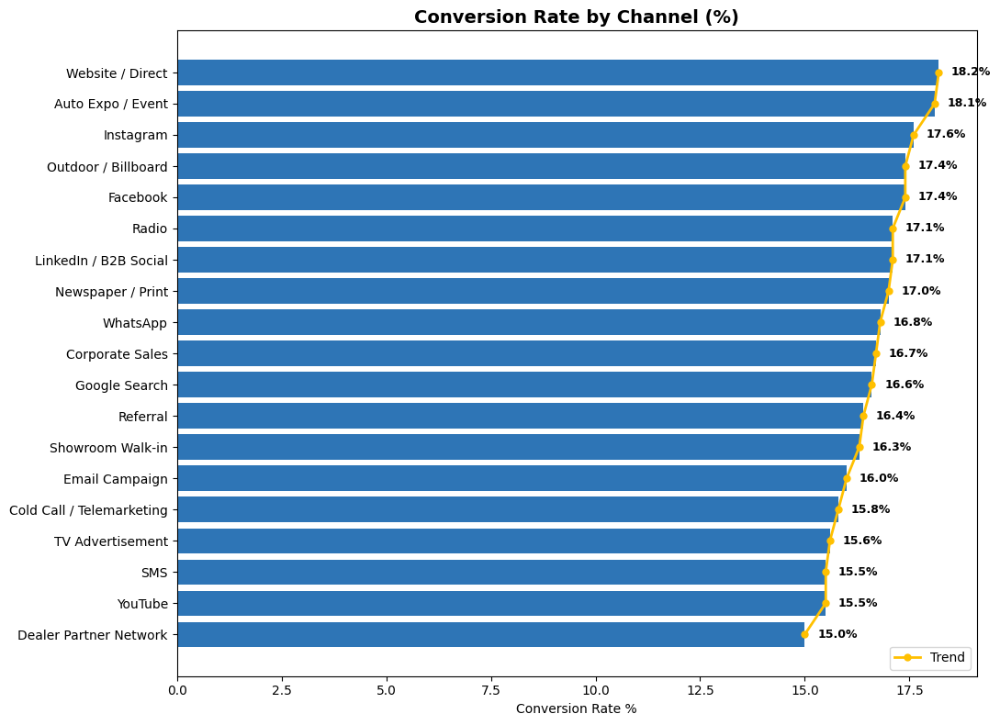

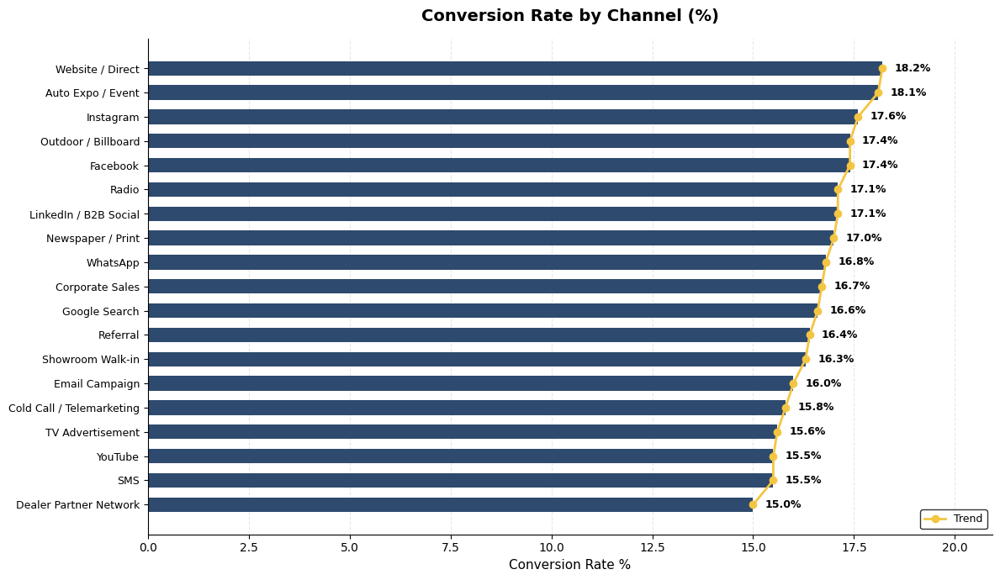

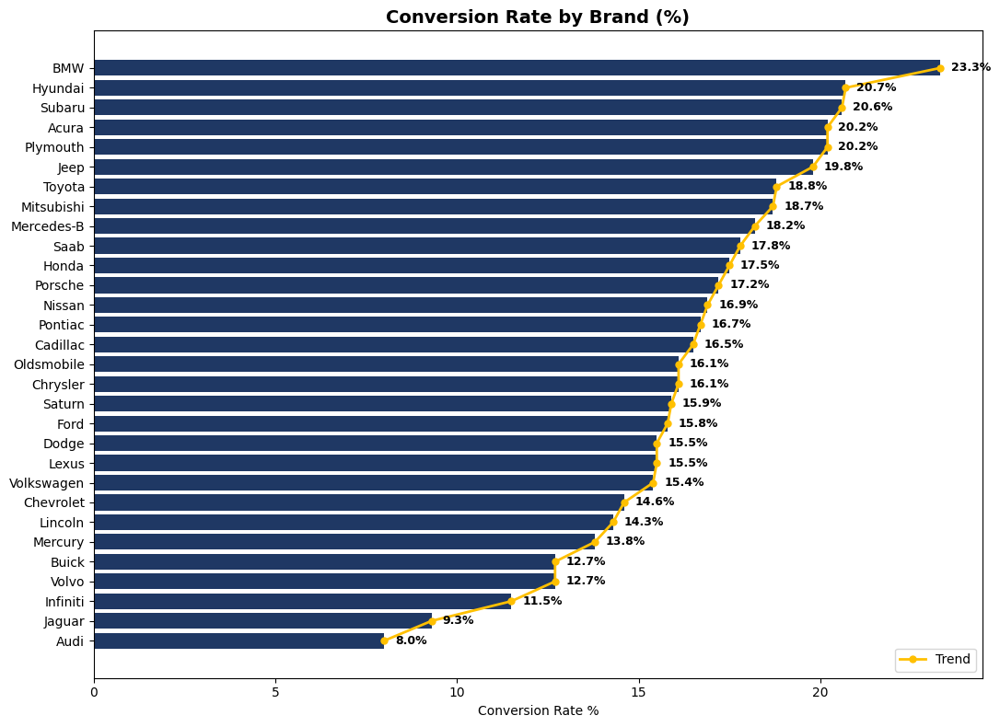

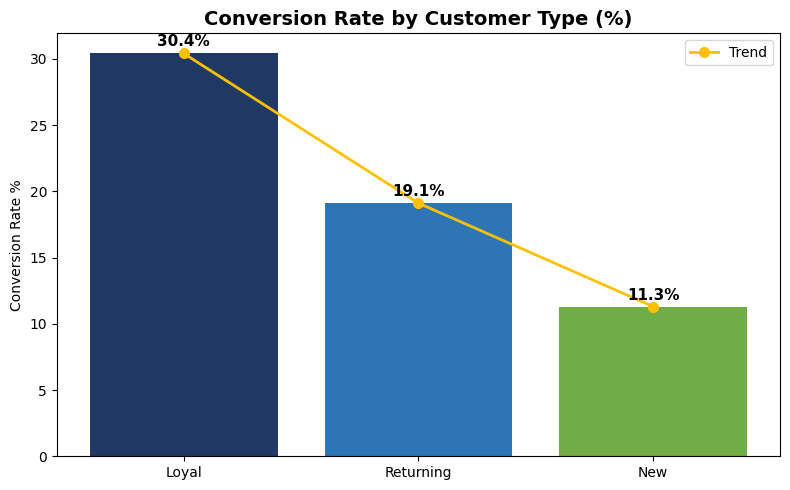

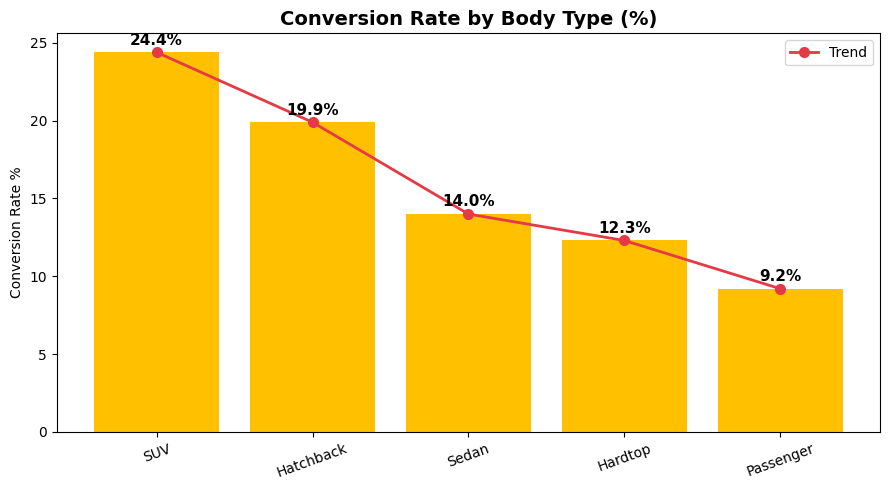

Analysis 4 complete


In [9]:
# ANALYSIS 4: Test Drive to Purchase Conversion
td_data = (
    ftd
    .merge(dim_channel[["ChannelKey","ChannelName"]], on="ChannelKey", how="left")
    .merge(dim_vehicle[["VehicleKey","Brand","Model","BodyType"]], on="VehicleKey", how="left")
    .merge(dim_dealer[["DealerKey","DealerName","City","State"]], on="DealerKey", how="left")
    .merge(dim_customer[["CustomerKey","CustomerType","AgeGroup","Gender"]], on="CustomerKey", how="left")
)
td_data["Converted"] = (td_data["Outcome"] == "Converted").astype(int)


# 4.1 OVERALL SUMMARY
overall = td_data["Converted"].mean() * 100

summary_df = pd.DataFrame({
    "Metric":  ["Total Test Drives","Converted","Not Converted","Overall Conv Rate","Industry Benchmark","Status"],
    "Value":   [
        f"{len(td_data):,}",
        f"{td_data['Converted'].sum():,}",
        f"{(td_data['Converted']==0).sum():,}",
        f"{overall:.1f}%",
        "15–20%",
        "Above" if overall >= 15 else "Below"
    ],
})

summary_df.index = range(1, len(summary_df) + 1)

print("  4.1. Test Drive Conversion Overview")

display(summary_df)


# 4.2 BY CHANNEL

ch_conv = (
    td_data.groupby("ChannelName")["Converted"]
    .agg(ConvRate="mean", Conversions="sum", TotalTDs="count")
    .reset_index()
)

ch_conv["ConvRate%"] = (ch_conv["ConvRate"] * 100).round(1)
ch_conv = ch_conv.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

ch_conv.index = range(1, len(ch_conv) + 1)

print("  4.2. Conversion Rate by Channel")

display(ch_conv)


# 4.3 BY BRAND
brand_conv = (
    td_data.groupby("Brand")["Converted"]
    .agg(ConvRate="mean", Conversions="sum", TotalTDs="count")
    .reset_index()
)

brand_conv["ConvRate%"] = (brand_conv["ConvRate"] * 100).round(1)
brand_conv = brand_conv.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

brand_conv.index = range(1, len(brand_conv) + 1)

print("  4.3. Conversion Rate by Brand")

display(brand_conv)


# 4.4 BY BODY TYPE
body_conv = (
    td_data.groupby("BodyType")["Converted"]
    .agg(ConvRate="mean", Conversions="sum", TotalTDs="count")
    .reset_index()
)

body_conv["ConvRate%"] = (body_conv["ConvRate"] * 100).round(1)
body_conv = body_conv.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

body_conv.index = range(1, len(body_conv) + 1)

print("  4.4. Conversion Rate by Body Type")

display(body_conv)


# 4.5 BY CUSTOMER TYPE
cust_conv = (
    td_data.groupby("CustomerType")["Converted"]
    .agg(ConvRate="mean", Conversions="sum", TotalTDs="count")
    .reset_index()
)

cust_conv["ConvRate%"] = (cust_conv["ConvRate"] * 100).round(1)
cust_conv = cust_conv.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

cust_conv.index = range(1, len(cust_conv) + 1)

print("  4.5. Conversion Rate by Customer Type")

display(cust_conv)


# 4.6 TOP DEALERS BY CONVERSION
dealer_conv = (
    td_data.groupby(["DealerName","City"])["Converted"]
    .agg(ConvRate="mean", Conversions="sum", TotalTDs="count")
    .reset_index()
)

dealer_conv["ConvRate%"] = (dealer_conv["ConvRate"] * 100).round(1)
dealer_conv = dealer_conv.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

top10 = dealer_conv.head(10).copy()
bottom10 = dealer_conv.tail(10).copy()

top10.index = range(1, len(top10) + 1)
bottom10.index = range(1, len(bottom10) + 1)

print("  4.6. Top 10 Dealers by Conversion Rate")

display(top10)


print("  4.7. Bottom 10 Dealers by Conversion Rate")

display(bottom10)

# Charts
all_sheets2  = pd.read_excel(LOCAL_FILE, sheet_name=None)
ftd          = all_sheets2["Fact_TestDrive"]
dim_channel  = all_sheets2["Dim_Channel"]
dim_vehicle  = all_sheets2["Dim_Vehicle"]
dim_customer = all_sheets2["Dim_Customer"]
dim_dealer   = all_sheets2["Dim_Dealer"]

td_data = (
    ftd
    .merge(dim_channel[["ChannelKey","ChannelName"]], on="ChannelKey", how="left")
    .merge(dim_vehicle[["VehicleKey","Brand","Model","BodyType"]], on="VehicleKey", how="left")
    .merge(dim_dealer[["DealerKey","DealerName","City","State"]], on="DealerKey", how="left")
    .merge(dim_customer[["CustomerKey","CustomerType","AgeGroup","Gender"]], on="CustomerKey", how="left")
)
td_data["Converted"] = (td_data["Outcome"] == "Converted").astype(int)
overall = td_data["Converted"].mean() * 100

def conv_table(df, group_col):
    t = df.groupby(group_col)["Converted"].agg(
        ConvRate="mean", Conversions="sum", TotalTDs="count").reset_index()
    t["ConvRate%"] = (t["ConvRate"]*100).round(1)
    return t.sort_values("ConvRate%", ascending=False).drop(columns="ConvRate")

ch_conv    = conv_table(td_data, "ChannelName")
brand_conv = conv_table(td_data, "Brand")
body_conv  = conv_table(td_data, "BodyType")
cust_conv  = conv_table(td_data, "CustomerType")

# Chart 1: Conversion by Channel
fig, ax = plt.subplots(figsize=(11, 8))

bars = ax.barh(ch_conv["ChannelName"][::-1],
               ch_conv["ConvRate%"][::-1],
               color="#2E75B6")

ax.plot(ch_conv["ConvRate%"][::-1].values,
        range(len(ch_conv)),
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=5,
        label="Trend")

for bar, val in zip(bars, ch_conv["ConvRate%"][::-1]):
    ax.text(bar.get_width() + 0.3,
            bar.get_y() + bar.get_height()/2,
            f"{val:.1f}%", va="center", ha="left",
            fontsize=9, fontweight="bold")

ax.set_title("Conversion Rate by Channel (%)", fontsize=14, fontweight="bold")
ax.set_xlabel("Conversion Rate %")
ax.legend()

plt.tight_layout()
plt.show()

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd

# Chart: Pie chart — Conversion Rate by Channel
fig, ax = plt.subplots(figsize=(12, 7))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ch_sorted = ch_conv.sort_values("ConvRate%", ascending=True)
vals      = ch_sorted["ConvRate%"].values
labels    = ch_sorted["ChannelName"].values

bars = ax.barh(range(len(labels)), vals, color="#2E4A6E", height=0.6, zorder=2)

for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + 0.3,
            bar.get_y() + bar.get_height()/2,
            f"{val:.1f}%", va="center", ha="left",
            fontsize=9, fontweight="bold", color="black")

ax.plot(vals, range(len(vals)), color="#F4C542",
        marker="o", linewidth=2, markersize=6, zorder=3, label="Trend")

ax.set_yticks(range(len(labels)))
ax.set_yticklabels(labels, fontsize=9, color="black")
ax.set_title("Conversion Rate by Channel (%)",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Conversion Rate %", fontsize=11, color="black")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(colors="black")
ax.grid(axis="x", linestyle="--", alpha=0.3)
ax.margins(x=0.15)
ax.legend(facecolor="white", edgecolor="black", fontsize=9)
plt.tight_layout()
plt.savefig("/content/a4_bar_channel_conv.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 2: Conversion by Brand
fig, ax = plt.subplots(figsize=(11, 8))

bars = ax.barh(brand_conv["Brand"][::-1],
               brand_conv["ConvRate%"][::-1],
               color="#1F3864")

ax.plot(brand_conv["ConvRate%"][::-1].values,
        range(len(brand_conv)),
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=5,
        label="Trend")

for bar, val in zip(bars, brand_conv["ConvRate%"][::-1]):
    ax.text(bar.get_width() + 0.3,
            bar.get_y() + bar.get_height()/2,
            f"{val:.1f}%", va="center", ha="left",
            fontsize=9, fontweight="bold")

ax.set_title("Conversion Rate by Brand (%)", fontsize=14, fontweight="bold")
ax.set_xlabel("Conversion Rate %")
ax.legend()

plt.tight_layout()
plt.show()

# Chart 3: Conversion by Customer Type
fig, ax = plt.subplots(figsize=(8, 5))

bars = ax.bar(cust_conv["CustomerType"],
              cust_conv["ConvRate%"],
              color=["#1F3864","#2E75B6","#70AD47"])

ax.plot(range(len(cust_conv)),
        cust_conv["ConvRate%"].values,
        "o-",
        color="#FFC000",
        linewidth=2,
        markersize=7,
        label="Trend")

for bar, val in zip(bars, cust_conv["ConvRate%"]):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.3,
            f"{val:.1f}%",
            ha="center", va="bottom",
            fontsize=11, fontweight="bold")

ax.set_title("Conversion Rate by Customer Type (%)", fontsize=14, fontweight="bold")
ax.set_ylabel("Conversion Rate %")
ax.legend()

plt.tight_layout()
plt.show()

# Chart 4: Conversion by Body Type
fig, ax = plt.subplots(figsize=(9, 5))

bars = ax.bar(body_conv["BodyType"],
              body_conv["ConvRate%"],
              color="#FFC000")

ax.plot(range(len(body_conv)),
        body_conv["ConvRate%"].values,
        "o-",
        color="#E63946",
        linewidth=2,
        markersize=7,
        label="Trend")

for bar, val in zip(bars, body_conv["ConvRate%"]):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.3,
            f"{val:.1f}%",
            ha="center", va="bottom",
            fontsize=11, fontweight="bold")

ax.set_title("Conversion Rate by Body Type (%)", fontsize=14, fontweight="bold")
ax.set_ylabel("Conversion Rate %")
ax.tick_params(axis='x', rotation=20)
ax.legend()

plt.tight_layout()
plt.show()

print("Analysis 4 complete")

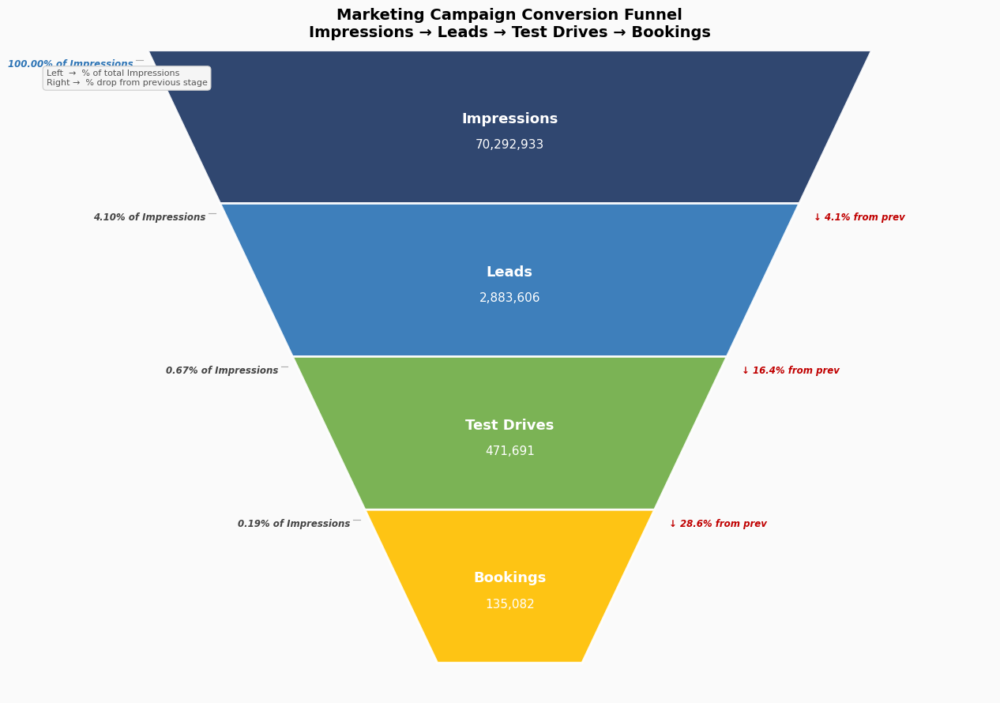

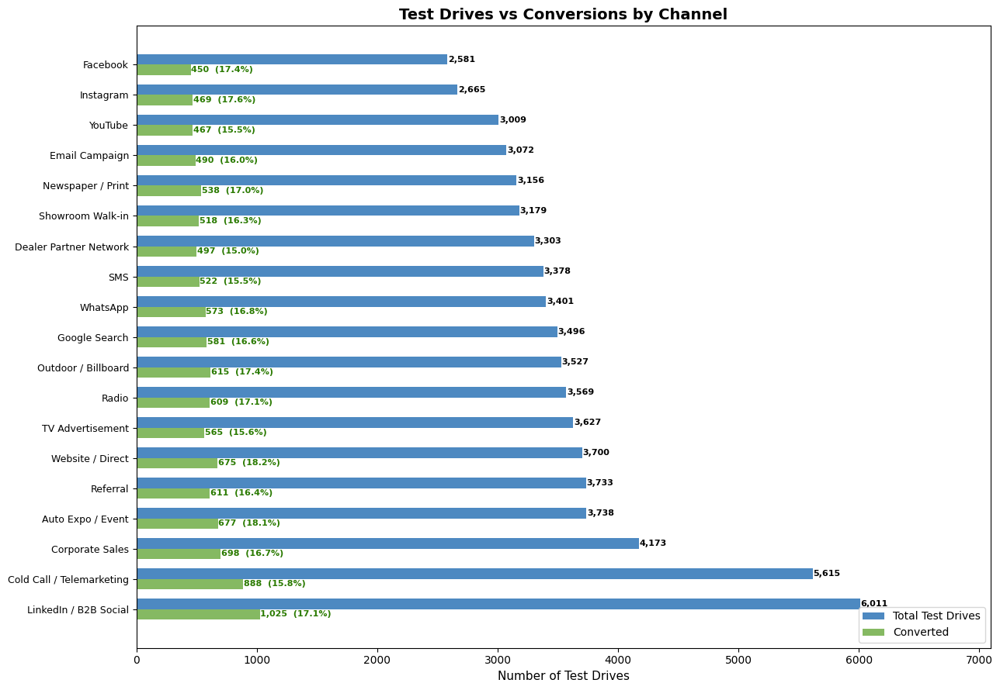

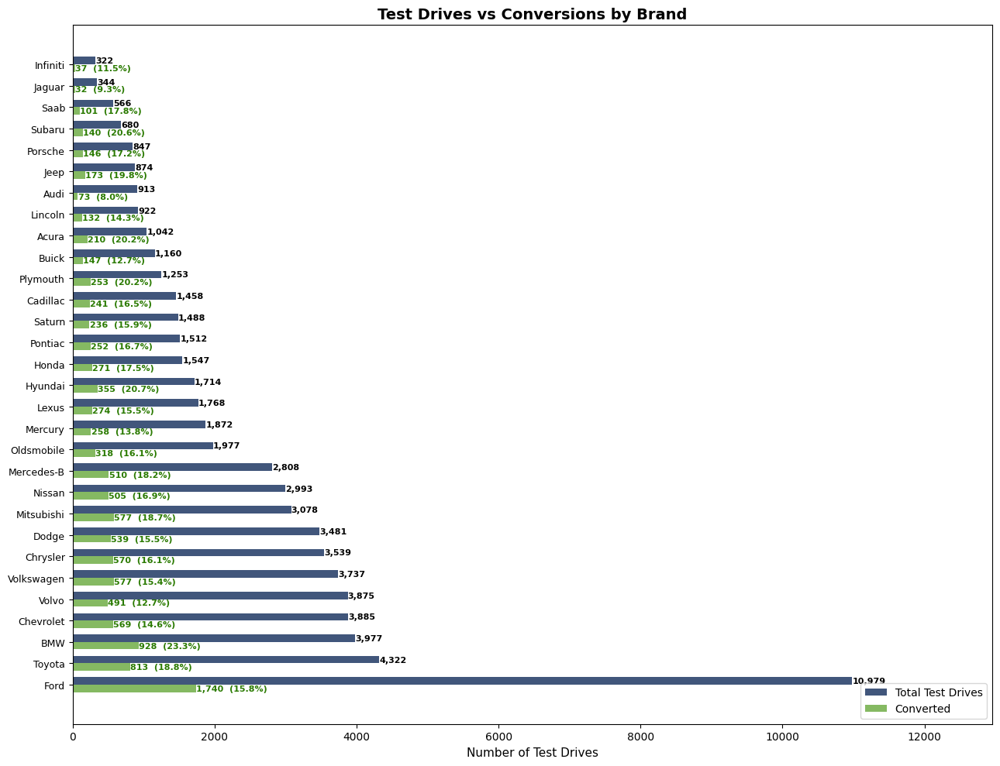

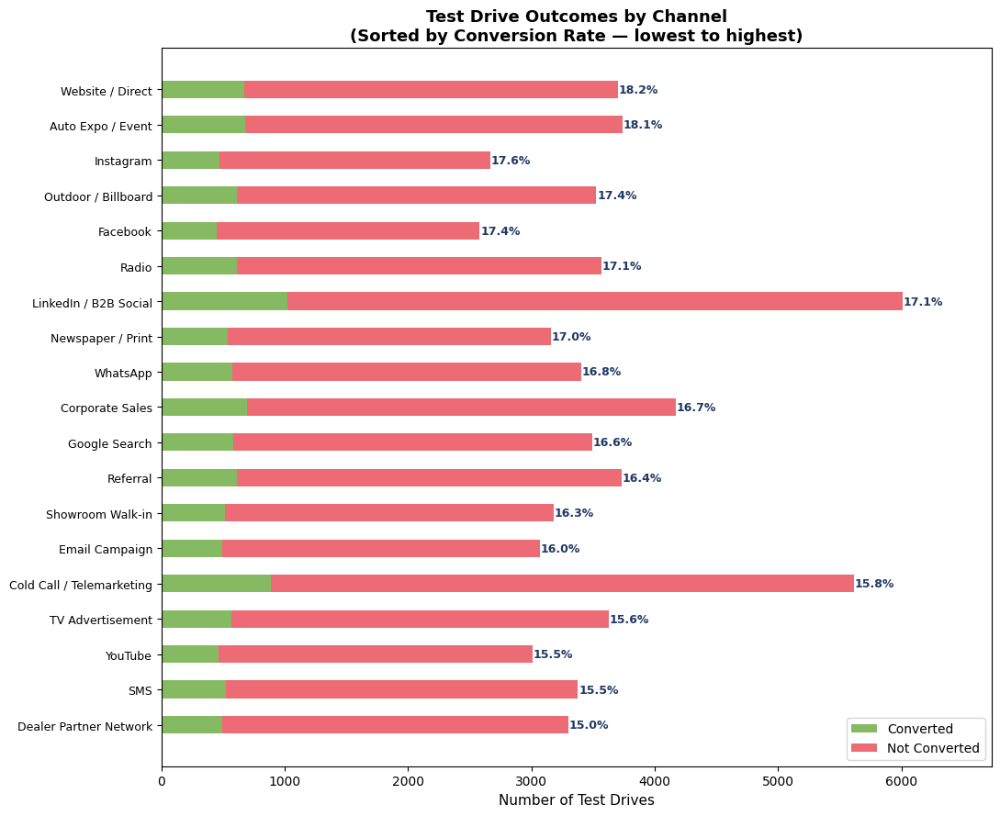

Analysis 4 additional charts complete


In [10]:
# Funnel charts
import matplotlib.pyplot as plt
import matplotlib.patches as FancyBboxPatch
import numpy as np

# Marketing Campaign Conversion Funnel
total_imp   = fmc["Impressions"].sum()
total_leads = fmc["Leads"].sum()
total_tds   = fmc["TestDrives"].sum()
total_book  = fmc["Bookings"].sum()

stages = ["Impressions", "Leads", "Test Drives", "Bookings"]
values = [total_imp, total_leads, total_tds, total_book]
colors = ["#1F3864", "#2E75B6", "#70AD47", "#FFC000"]

# RHS: drop % from previous stage
conv_rates = [
    None,
    total_leads / total_imp   * 100,
    total_tds   / total_leads * 100,
    total_book  / total_tds   * 100,
]

# LHS: each stage as % of total Impressions
vs_imp = [
    100.0,
    total_leads / total_imp * 100,
    total_tds   / total_imp * 100,
    total_book  / total_imp * 100,
]

fig, ax = plt.subplots(figsize=(13, 9))
fig.patch.set_facecolor("#FAFAFA")
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.axis("off")

n      = len(stages)
height = 9.5 / n
max_w  = 7.5
min_w  = 1.5

for i, (stage, val, color, rate, imp_pct) in enumerate(
        zip(stages, values, colors, conv_rates, vs_imp)):
    top_w = max_w - (max_w - min_w) * (i / n)
    bot_w = max_w - (max_w - min_w) * ((i + 1) / n)
    top_y = 10 - i * height
    bot_y = 10 - (i + 1) * height

    trap = plt.Polygon(
        [(5 - top_w/2, top_y), (5 + top_w/2, top_y),
         (5 + bot_w/2, bot_y), (5 - bot_w/2, bot_y)],
        closed=True, facecolor=color,
        edgecolor="white", linewidth=2,
        alpha=0.92, zorder=2,
    )
    ax.add_patch(trap)
    mid_y = (top_y + bot_y) / 2

    # Stage name
    ax.text(5, mid_y + 0.12, stage,
            ha="center", va="center",
            fontsize=13, fontweight="bold",
            color="white", zorder=3)
    # Value
    ax.text(5, mid_y - 0.28, f"{val:,.0f}",
            ha="center", va="center",
            fontsize=11, color="white", zorder=3)
    # RHS: drop % from previous stage
    if rate is not None:
        ax.text(5 + top_w/2 + 0.15, top_y - 0.22,
                f"↓ {rate:.1f}% from prev",
                ha="left", va="center",
                fontsize=8.5, color="#C00000",
                style="italic", fontweight="bold", zorder=3)
    # LHS: % of total Impressions
    lhs_color = "#2E75B6" if i == 0 else "#444444"
    ax.text(5 - top_w/2 - 0.15, top_y - 0.22,
            f"{imp_pct:.2f}% of Impressions",
            ha="right", va="center",
            fontsize=8.5, color=lhs_color,
            style="italic", fontweight="bold", zorder=3)
    ax.plot([5 - top_w/2 - 0.05, 5 - top_w/2 - 0.12],
            [top_y - 0.15, top_y - 0.15],
            color="#aaa", lw=0.8, zorder=3)

ax.text(0.2, 9.7,
        "Left  →  % of total Impressions\n"
        "Right →  % drop from previous stage",
        fontsize=8, color="#555", va="top", ha="left",
        bbox=dict(boxstyle="round,pad=0.4",
                  facecolor="#f5f5f5",
                  edgecolor="#cccccc", lw=0.8))

ax.set_title(
    "Marketing Campaign Conversion Funnel\n"
    "Impressions → Leads → Test Drives → Bookings",
    fontsize=14, fontweight="bold", pad=12
)
plt.tight_layout()
plt.savefig("/content/funnel_chart.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart: Funnel by Channel — TDs vs Converted
ch_funnel = (
    td_data.groupby("ChannelName")["Converted"]
    .agg(TotalTDs="count", Converted="sum")
    .reset_index()
    .sort_values("TotalTDs", ascending=False)
)
ch_funnel["NotConverted"] = ch_funnel["TotalTDs"] - ch_funnel["Converted"]
ch_funnel["ConvRate%"]    = (ch_funnel["Converted"] / ch_funnel["TotalTDs"] * 100).round(1)

fig, ax = plt.subplots(figsize=(13, 9))
y        = np.arange(len(ch_funnel))
bar_h    = 0.35

bars1 = ax.barh(y + bar_h/2, ch_funnel["TotalTDs"],
                height=bar_h, color="#2E75B6", alpha=0.85,
                label="Total Test Drives")
bars2 = ax.barh(y - bar_h/2, ch_funnel["Converted"],
                height=bar_h, color="#70AD47", alpha=0.85,
                label="Converted")

# Value labels
for bar, val in zip(bars1, ch_funnel["TotalTDs"]):
    ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
            f"{int(val):,}", va="center", ha="left", fontsize=8, fontweight="bold")

for bar, val, rate in zip(bars2, ch_funnel["Converted"], ch_funnel["ConvRate%"]):
    ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
            f"{int(val):,}  ({rate}%)", va="center", ha="left",
            fontsize=8, fontweight="bold", color="#2A7A00")

ax.set_yticks(y)
ax.set_yticklabels(ch_funnel["ChannelName"], fontsize=9)
ax.set_xlabel("Number of Test Drives", fontsize=11)
ax.set_title("Test Drives vs Conversions by Channel",
             fontsize=14, fontweight="bold")
ax.legend(fontsize=10, loc="lower right")
ax.margins(x=0.18)
plt.tight_layout()
plt.savefig("/content/a4_funnel_channel.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart: Funnel by Brand — TDs vs Converted
brand_funnel = (
    td_data.groupby("Brand")["Converted"]
    .agg(TotalTDs="count", Converted="sum")
    .reset_index()
    .sort_values("TotalTDs", ascending=False)
)
brand_funnel["NotConverted"] = brand_funnel["TotalTDs"] - brand_funnel["Converted"]
brand_funnel["ConvRate%"]    = (brand_funnel["Converted"] / brand_funnel["TotalTDs"] * 100).round(1)

fig, ax = plt.subplots(figsize=(13, 10))
y     = np.arange(len(brand_funnel))
bar_h = 0.35

bars1 = ax.barh(y + bar_h/2, brand_funnel["TotalTDs"],
                height=bar_h, color="#1F3864", alpha=0.85,
                label="Total Test Drives")
bars2 = ax.barh(y - bar_h/2, brand_funnel["Converted"],
                height=bar_h, color="#70AD47", alpha=0.85,
                label="Converted")

for bar, val in zip(bars1, brand_funnel["TotalTDs"]):
    ax.text(bar.get_width() + 2, bar.get_y() + bar.get_height()/2,
            f"{int(val):,}", va="center", ha="left", fontsize=8, fontweight="bold")

for bar, val, rate in zip(bars2, brand_funnel["Converted"], brand_funnel["ConvRate%"]):
    ax.text(bar.get_width() + 2, bar.get_y() + bar.get_height()/2,
            f"{int(val):,}  ({rate}%)", va="center", ha="left",
            fontsize=8, fontweight="bold", color="#2A7A00")

ax.set_yticks(y)
ax.set_yticklabels(brand_funnel["Brand"], fontsize=9)
ax.set_xlabel("Number of Test Drives", fontsize=11)
ax.set_title("Test Drives vs Conversions by Brand",
             fontsize=14, fontweight="bold")
ax.legend(fontsize=10, loc="lower right")
ax.margins(x=0.18)
plt.tight_layout()
plt.savefig("/content/a4_funnel_brand.png", dpi=150, bbox_inches="tight")
plt.show()

# ── Chart: Stacked bar — Converted vs Not Converted by Channel ───
# Shows the full composition of each channel's test drives
ch_stacked = ch_funnel.sort_values("ConvRate%", ascending=True)

fig, ax = plt.subplots(figsize=(11, 9))
y     = np.arange(len(ch_stacked))
bar_h = 0.5

ax.barh(y, ch_stacked["Converted"],    height=bar_h,
        color="#70AD47", alpha=0.85, label="Converted")
ax.barh(y, ch_stacked["NotConverted"], height=bar_h,
        left=ch_stacked["Converted"],
        color="#E63946", alpha=0.75, label="Not Converted")

# Conversion rate labels at end of each bar
for i, (total, conv, rate) in enumerate(zip(
        ch_stacked["TotalTDs"], ch_stacked["Converted"], ch_stacked["ConvRate%"])):
    ax.text(total + 5, i, f"{rate}%",
            va="center", ha="left", fontsize=9, fontweight="bold", color="#1F3864")

ax.set_yticks(y)
ax.set_yticklabels(ch_stacked["ChannelName"], fontsize=9)
ax.set_xlabel("Number of Test Drives", fontsize=11)
ax.set_title("Test Drive Outcomes by Channel\n(Sorted by Conversion Rate — lowest to highest)",
             fontsize=13, fontweight="bold")
ax.legend(fontsize=10, loc="lower right")
ax.margins(x=0.12)
plt.tight_layout()
plt.savefig("/content/a4_stacked_channel.png", dpi=150, bbox_inches="tight")
plt.show()
print("Analysis 4 additional charts complete")

ANALYSIS 5: Customer Segmentation & CLV
- CLV per Customer (core value calculation) is used to calculate Customer Lifetime Value by summing total spending per customer and counting purchases. It tells which customers are actually valuable, not just active.
- Summary Statistics calculates average, median, max CLV, and top 10% contribution. It shows how unequal customer value is.
If top 10% contributes a lot, the business depends heavily on few customers.
- Top 15 Customers is to get hghest value customers
- Revenue by Age Group is used to analyze spending by age groups.
- Revenue by Income Group isused to analyze spending based on income level.

  5.1. CLV Summary Statistics


,Metric,Value
1,Unique Customers,"3,022"
2,Average CLV,"$1,276,483"
3,Median CLV,"$922,754"
4,Highest CLV,"$7,906,686"
5,Top 10% Threshold,"$2,959,376"
6,Top 10% Revenue Share,30.0%


  5.2. Top 15 Customers by CLV


,CustomerName,CustomerType,AgeGroup,IncomeGroup,CLV,Purchases
1,Shyrel,Returning,35-44,Upper-Middle,"$7,906,686",122
2,Thibault,Loyal,45-54,Upper-Middle,"$6,984,285",93
3,Chatrley,Loyal,35-44,High,"$6,803,105",80
4,Livia,Loyal,35-44,High,"$6,739,687",63
5,Shlomo,Loyal,35-44,Low,"$6,266,723",82
6,Abril,Loyal,35-44,High,"$5,980,931",114
7,Quinn,Loyal,35-44,High,"$5,965,826",83
8,Chase,Loyal,55-64,Upper-Middle,"$5,706,104",69
9,Gatien,Loyal,55-64,Upper-Middle,"$5,593,198",76
10,Milla,Loyal,45-54,High,"$5,545,197",77


  5.3. CLV by Customer Type


,CustomerType,AvgCLV,MedianCLV,TotalRevenue,Customers,AvgPurchases
1,Loyal,"$3,303,695","$3,173,408","$1,549,433,136",469,69.3
2,Returning,"$1,344,865","$1,214,315","$1,187,515,992",883,27.9
3,New,"$671,007","$525,355","$1,120,582,027","1,670",13.9



  💡 Loyalty Multiplier: 4.9x
     Loyal avg CLV: $3,303,695  |  New avg CLV: $671,007
     Retaining 1 Loyal customer = acquiring 4.9 New customers in revenue terms
  5.4. Revenue by Age Group


,AgeGroup,TotalRevenue,Customers,AvgSpend
1,Under 25,"$286,195,274",231,"$48,100"
2,25-34,"$730,434,947",589,"$48,489"
3,35-44,"$1,263,356,348",941,"$48,251"
4,45-54,"$718,262,826",585,"$47,059"
5,55-64,"$570,042,726",446,"$47,971"
6,65+,"$289,239,034",230,"$48,174"


  5.5. Revenue by Income Group


,IncomeGroup,TotalRevenue,Customers,AvgSpend
1,Low,"$1,055,687,292",919,"$42,363"
2,Upper-Middle,"$1,884,932,698","1,493","$47,659"
3,High,"$916,911,165",610,"$57,751"


  5.6. Revenue by Gender


,Gender,TotalRevenue,AvgSpend,Customers
1,Female,"$803,097,063","$46,760",655
2,Male,"$3,054,434,093","$48,351","2,367"


  5.7. Top 10% Customer Demographic Profile


,Attribute,Value
1,Customers in Top 10%,303
2,Most Common Age Group,35-44
3,Most Common Income Group,Upper-Middle
4,Most Common Customer Type,Loyal
5,Gender — Male,248
6,Gender — Female,55


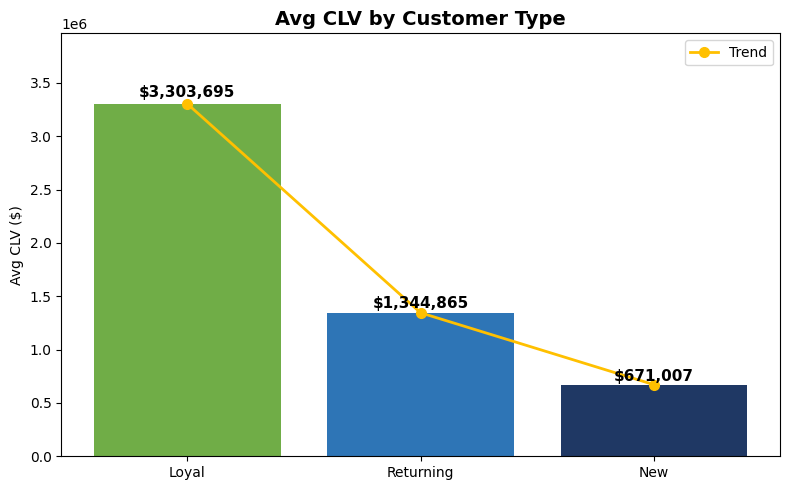

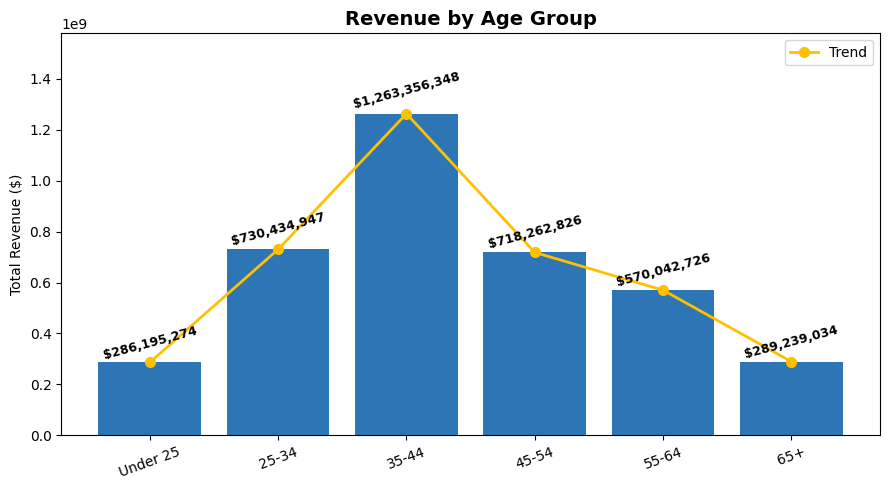

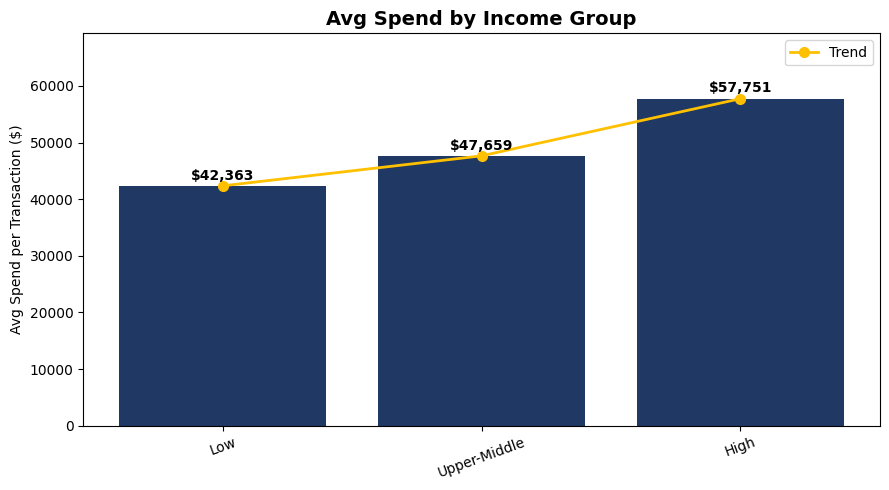

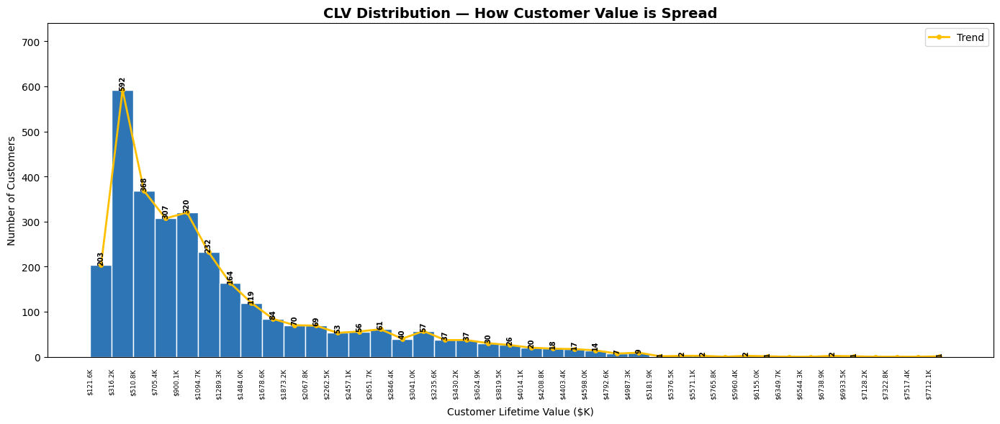

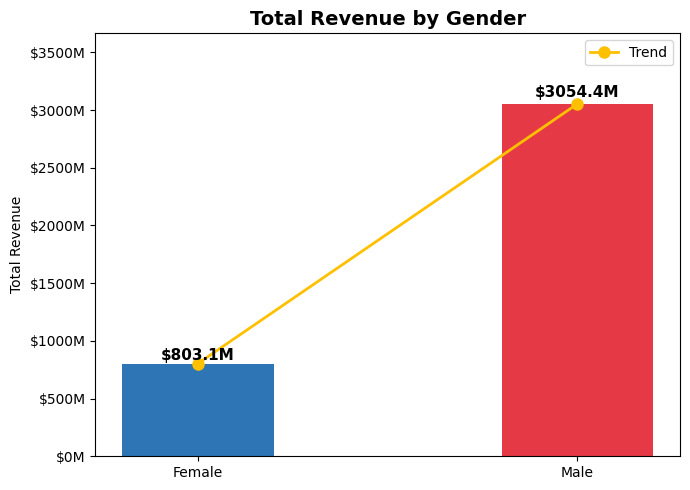

Analysis 5 complete


In [11]:
# ANALYSIS 5: Customer Segmentation & CLV
from IPython.display import display

sales_cust = fvs.merge(dim_customer, on="CustomerKey", how="left")

# CLV per customer
clv = (
    sales_cust
    .groupby(["CustomerKey","CustomerName","CustomerType","AgeGroup","IncomeGroup","Gender"])
    .agg(CLV=("SaleAmount","sum"), Purchases=("SalesKey","count"))
    .reset_index()
    .sort_values("CLV", ascending=False)
)

top10pct       = clv[clv["CLV"] >= clv["CLV"].quantile(0.90)]
top10pct_share = top10pct["CLV"].sum() / clv["CLV"].sum() * 100

# 5.1 CLV Summary Statistics
summary_df = pd.DataFrame({
    "Metric": ["Unique Customers","Average CLV","Median CLV",
               "Highest CLV","Top 10% Threshold","Top 10% Revenue Share"],
    "Value":  [f"{clv['CustomerKey'].nunique():,}",
               f"${clv['CLV'].mean():,.0f}",
               f"${clv['CLV'].median():,.0f}",
               f"${clv['CLV'].max():,.0f}",
               f"${clv['CLV'].quantile(0.90):,.0f}",
               f"{top10pct_share:.1f}%"]
})
summary_df.index = range(1, len(summary_df) + 1)
print("  5.1. CLV Summary Statistics")
display(summary_df)

# 5.2 Top 15 Customers by CLV
top15_clv = clv.head(15)[["CustomerName","CustomerType","AgeGroup","IncomeGroup","CLV","Purchases"]].copy()
top15_clv.index = range(1, len(top15_clv) + 1)
print("  5.2. Top 15 Customers by CLV")
display(top15_clv.style.format({"CLV":"${:,.0f}","Purchases":"{:,}"}))

# 5.3 CLV by Customer Type
type_clv = (
    clv.groupby("CustomerType")
    .agg(AvgCLV=("CLV","mean"), MedianCLV=("CLV","median"),
         TotalRevenue=("CLV","sum"), Customers=("CustomerKey","count"),
         AvgPurchases=("Purchases","mean"))
    .reset_index()
    .sort_values("AvgCLV", ascending=False)
)
new_clv   = type_clv[type_clv["CustomerType"]=="New"]["AvgCLV"].values[0]
loyal_clv = type_clv[type_clv["CustomerType"]=="Loyal"]["AvgCLV"].values[0]
multiplier = loyal_clv / new_clv

type_clv.index = range(1, len(type_clv) + 1)
print("  5.3. CLV by Customer Type")
display(type_clv.style.format({
    "AvgCLV":"${:,.0f}","MedianCLV":"${:,.0f}",
    "TotalRevenue":"${:,.0f}","Customers":"{:,}","AvgPurchases":"{:.1f}"
}))
print(f"\n  💡 Loyalty Multiplier: {multiplier:.1f}x")
print(f"     Loyal avg CLV: ${loyal_clv:,.0f}  |  New avg CLV: ${new_clv:,.0f}")
print(f"     Retaining 1 Loyal customer = acquiring {multiplier:.1f} New customers in revenue terms")

# 5.4 Revenue by Age Group
age_order = ["Under 25","25-34","35-44","45-54","55-64","65+"]
age_perf  = (
    sales_cust.groupby("AgeGroup")
    .agg(TotalRevenue=("SaleAmount","sum"),
         Customers=("CustomerKey","nunique"),
         AvgSpend=("SaleAmount","mean"))
    .reset_index()
)
age_perf["AgeGroup"] = pd.Categorical(age_perf["AgeGroup"],
                                       categories=age_order, ordered=True)
age_perf = age_perf.sort_values("AgeGroup")
age_perf.index = range(1, len(age_perf) + 1)
print("  5.4. Revenue by Age Group")
display(age_perf.style.format({
    "TotalRevenue":"${:,.0f}","Customers":"{:,}","AvgSpend":"${:,.0f}"
}))

# 5.5 Revenue by Income Group
income_order = ["Low","Lower-Middle","Middle","Upper-Middle","High"]
inc_perf     = (
    sales_cust.groupby("IncomeGroup")
    .agg(TotalRevenue=("SaleAmount","sum"),
         Customers=("CustomerKey","nunique"),
         AvgSpend=("SaleAmount","mean"))
    .reset_index()
)
inc_perf["IncomeGroup"] = pd.Categorical(inc_perf["IncomeGroup"],
                                          categories=income_order, ordered=True)
inc_perf = inc_perf.sort_values("IncomeGroup")
inc_perf.index = range(1, len(inc_perf) + 1)
print("  5.5. Revenue by Income Group")
display(inc_perf.style.format({
    "TotalRevenue":"${:,.0f}","Customers":"{:,}","AvgSpend":"${:,.0f}"
}))

# 5.6 Revenue by Gender
gender_perf = (
    sales_cust.groupby("Gender")
    .agg(TotalRevenue=("SaleAmount","sum"),
         AvgSpend=("SaleAmount","mean"),
         Customers=("CustomerKey","nunique"))
    .reset_index()
)
gender_perf.index = range(1, len(gender_perf) + 1)
print("  5.6. Revenue by Gender")
display(gender_perf.style.format({
    "TotalRevenue":"${:,.0f}","AvgSpend":"${:,.0f}","Customers":"{:,}"
}))

# 5.7 Top 10% Customer Profile
profile_df = pd.DataFrame({
    "Attribute": ["Customers in Top 10%","Most Common Age Group",
                  "Most Common Income Group","Most Common Customer Type",
                  "Gender — Male","Gender — Female"],
    "Value":     [f"{len(top10pct):,}",
                  top10pct["AgeGroup"].mode()[0],
                  top10pct["IncomeGroup"].mode()[0],
                  top10pct["CustomerType"].mode()[0],
                  f"{(top10pct['Gender']=='Male').sum():,}",
                  f"{(top10pct['Gender']=='Female').sum():,}"]
})
profile_df.index = range(1, len(profile_df) + 1)
print("  5.7. Top 10% Customer Demographic Profile")
display(profile_df)

# Charts
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np
from IPython.display import display

sales_cust = fvs.merge(dim_customer, on="CustomerKey", how="left")

clv = (
    sales_cust
    .groupby(["CustomerKey","CustomerName","CustomerType","AgeGroup","IncomeGroup","Gender"])
    .agg(CLV=("SaleAmount","sum"), Purchases=("SalesKey","count"))
    .reset_index()
    .sort_values("CLV", ascending=False)
)

top10pct       = clv[clv["CLV"] >= clv["CLV"].quantile(0.90)]
top10pct_share = top10pct["CLV"].sum() / clv["CLV"].sum() * 100

type_clv = (
    clv.groupby("CustomerType")
    .agg(AvgCLV=("CLV","mean"), MedianCLV=("CLV","median"),
         TotalRevenue=("CLV","sum"), Customers=("CustomerKey","count"),
         AvgPurchases=("Purchases","mean"))
    .reset_index()
    .sort_values("AvgCLV", ascending=False)
)
loyal_clv  = type_clv[type_clv["CustomerType"]=="Loyal"]["AvgCLV"].values[0]
new_clv    = type_clv[type_clv["CustomerType"]=="New"]["AvgCLV"].values[0]
multiplier = loyal_clv / new_clv

age_order = ["Under 25","25-34","35-44","45-54","55-64","65+"]
age_perf  = (
    sales_cust.groupby("AgeGroup")
    .agg(TotalRevenue=("SaleAmount","sum"),
         Customers=("CustomerKey","nunique"),
         AvgSpend=("SaleAmount","mean"))
    .reset_index()
)
age_perf["AgeGroup"] = pd.Categorical(age_perf["AgeGroup"],
                                       categories=age_order, ordered=True)
age_perf = age_perf.sort_values("AgeGroup")

income_order = ["Low","Lower-Middle","Middle","Upper-Middle","High"]
inc_perf     = (
    sales_cust.groupby("IncomeGroup")
    .agg(TotalRevenue=("SaleAmount","sum"),
         Customers=("CustomerKey","nunique"),
         AvgSpend=("SaleAmount","mean"))
    .reset_index()
)
inc_perf["IncomeGroup"] = pd.Categorical(inc_perf["IncomeGroup"],
                                          categories=income_order, ordered=True)
inc_perf = inc_perf.sort_values("IncomeGroup")

gender_perf = (
    sales_cust.groupby("Gender")
    .agg(TotalRevenue=("SaleAmount","sum"),
         AvgSpend=("SaleAmount","mean"),
         Customers=("CustomerKey","nunique"))
    .reset_index()
)

# Chart 1: CLV by Customer Type
fig, ax = plt.subplots(figsize=(8, 5))
vals   = type_clv["AvgCLV"].values
labels = type_clv["CustomerType"].values

bars = ax.bar(range(len(labels)), vals,
              color=["#70AD47","#2E75B6","#1F3864"])
for bar, val in zip(bars, vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + bar.get_height()*0.01,
            f"${val:,.0f}", ha="center", va="bottom",
            fontsize=11, fontweight="bold")

ax.plot(range(len(vals)), vals, "o-",
        color="#FFC000", linewidth=2, markersize=7, label="Trend")

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels)
ax.set_title("Avg CLV by Customer Type", fontsize=14, fontweight="bold")
ax.set_ylabel("Avg CLV ($)")
ax.margins(y=0.2)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a5_chart1_clv_by_type.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 2: Revenue by Age Group
fig, ax = plt.subplots(figsize=(9, 5))
age_labels = age_perf["AgeGroup"].astype(str).values
age_vals   = age_perf["TotalRevenue"].values

bars = ax.bar(range(len(age_labels)), age_vals, color="#2E75B6")
for bar, val in zip(bars, age_vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + bar.get_height()*0.01,
            f"${val:,.0f}", ha="center", va="bottom",
            fontsize=9, fontweight="bold", rotation=15)

ax.plot(range(len(age_vals)), age_vals, "o-",
        color="#FFC000", linewidth=2, markersize=7, label="Trend")

ax.set_xticks(range(len(age_labels)))
ax.set_xticklabels(age_labels, rotation=20)
ax.set_title("Revenue by Age Group", fontsize=14, fontweight="bold")
ax.set_ylabel("Total Revenue ($)")
ax.margins(y=0.25)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a5_chart2_age_revenue.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 3: Avg Spend by Income Group
fig, ax = plt.subplots(figsize=(9, 5))
inc_labels = inc_perf["IncomeGroup"].astype(str).values
inc_vals   = inc_perf["AvgSpend"].values

bars = ax.bar(range(len(inc_labels)), inc_vals, color="#1F3864")
for bar, val in zip(bars, inc_vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + bar.get_height()*0.01,
            f"${val:,.0f}", ha="center", va="bottom",
            fontsize=10, fontweight="bold")

ax.plot(range(len(inc_vals)), inc_vals, "o-",
        color="#FFC000", linewidth=2, markersize=7, label="Trend")

ax.set_xticks(range(len(inc_labels)))
ax.set_xticklabels(inc_labels, rotation=20)
ax.set_title("Avg Spend by Income Group", fontsize=14, fontweight="bold")
ax.set_ylabel("Avg Spend per Transaction ($)")
ax.margins(y=0.2)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a5_chart3_income_spend.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 4: CLV Distribution
fig, ax = plt.subplots(figsize=(14, 6))
n, bins, patches = ax.hist(clv["CLV"], bins=40, color="#2E75B6", edgecolor="white")

for count, patch in zip(n, patches):
    if count > 0:
        ax.text(patch.get_x() + patch.get_width()/2,
                patch.get_height() + 0.5,
                f"{int(count)}", ha="center", va="bottom",
                fontsize=7, fontweight="bold", rotation=90)

bin_mids = 0.5 * (bins[:-1] + bins[1:])
ax.plot(bin_mids, n, "o-", color="#FFC000",
        linewidth=2, markersize=4, label="Trend")

for i, (left_edge, patch) in enumerate(zip(bins, patches)):
    ax.text(patch.get_x(), -ax.get_ylim()[1]*0.04,
            f"${left_edge/1000:.1f}K", ha="center", va="top",
            fontsize=6.5, color="black", rotation=90)

ax.set_xticks([])
ax.set_title("CLV Distribution — How Customer Value is Spread",
             fontsize=14, fontweight="bold")
ax.set_xlabel("Customer Lifetime Value ($K)", labelpad=50)
ax.set_ylabel("Number of Customers")
ax.margins(y=0.25)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a5_chart4_clv_distribution.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 5: Revenue by Gender
fig, ax = plt.subplots(figsize=(7, 5))
gen_labels = gender_perf["Gender"].astype(str).values
gen_vals   = gender_perf["TotalRevenue"].values

bars = ax.bar(range(len(gen_labels)), gen_vals,
              color=["#2E75B6","#E63946"], width=0.4)
for bar, val in zip(bars, gen_vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + bar.get_height()*0.01,
            f"${val/1_000_000:.1f}M", ha="center", va="bottom",
            fontsize=11, fontweight="bold")

ax.plot(range(len(gen_vals)), gen_vals, "o-",
        color="#FFC000", linewidth=2, markersize=8, label="Trend")

ax.set_xticks(range(len(gen_labels)))
ax.set_xticklabels(gen_labels)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1_000_000:.0f}M"))
ax.set_title("Total Revenue by Gender", fontsize=14, fontweight="bold")
ax.set_ylabel("Total Revenue")
ax.margins(y=0.2)
ax.legend()
plt.tight_layout()
plt.savefig("/content/a5_chart5_gender_revenue.png", dpi=150, bbox_inches="tight")
plt.show()

print("Analysis 5 complete")

In [12]:
import pandas as pd

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
all_sheets = pd.read_excel(DRIVE_FILE, sheet_name=None)
fvs_final    = all_sheets["Fact_VehicleSales"]
dim_customer = all_sheets["Dim_Customer"]

spend_check = fvs_final.merge(dim_customer[["CustomerKey","IncomeGroup"]], on="CustomerKey", how="left")
print("Current avg SaleAmount by IncomeGroup:")
print(spend_check.groupby("IncomeGroup")["SaleAmount"].mean().round(0))

Current avg SaleAmount by IncomeGroup:
IncomeGroup
High            57751.0
Low             42363.0
Upper-Middle    47659.0
Name: SaleAmount, dtype: float64


In [13]:
# Check purchase frequency distribution
print("Purchase frequency distribution:")
print(clv["Purchases"].value_counts().sort_index().to_string())
print(f"\nCustomers with only 1 purchase: {(clv['Purchases']==1).sum():,} ({(clv['Purchases']==1).mean()*100:.1f}%)")
print(f"Customers with 2+ purchases:    {(clv['Purchases']>=2).sum():,} ({(clv['Purchases']>=2).mean()*100:.1f}%)")
print(f"\nCLV stats:")
print(f"   Min:    ${clv['CLV'].min():,.0f}")
print(f"   Max:    ${clv['CLV'].max():,.0f}")
print(f"   Mean:   ${clv['CLV'].mean():,.0f}")
print(f"   Median: ${clv['CLV'].median():,.0f}")

Purchase frequency distribution:
Purchases
3        1
4        1
5        3
6       15
7       31
8       56
9      102
10     108
11     157
12     171
13     173
14     168
15     172
16     139
17     114
18      92
19      88
20      69
21      59
22      46
23      64
24      65
25      76
26      72
27      67
28      51
29      62
30      65
31      52
32      46
33      40
34      33
35      25
36      20
37      20
38      10
39       5
40       2
41       3
42       1
43       1
45       3
46       1
48       3
50       3
51       2
52       3
53       9
54       3
55       2
56       4
57       5
58      13
59      10
60      14
61      14
62      12
63      21
64      10
65      22
66      27
67      20
68      25
69      18
70      30
71      20
72      25
73      13
74      19
75      18
76      16
77      14
78      16
79      14
80       9
81       7
82       5
83       9
84       3
85       5
86       1
87       1
88       2
90       1
91       1
93       1
95       1


## Anomaly Analysis Findings

* Missing values were detected in revenue, discount, channel, and customer demographic columns, causing some rows to be excluded from analysis and charts.

* Negative discounts and cases where discount exceeded sale amount were identified, indicating possible data entry or validation issues.

* Duplicate rows were found in transaction and customer tables, slightly inflating revenue totals and customer counts.

* Outlier transactions with extremely low and extremely high sale amounts skewed revenue distribution and affected average calculations.

* Invalid or missing AgeGroup and Gender values caused silent exclusion of records from demographic analysis.

* UnitsSold anomalies such as zero-unit sales and unusually high unit counts affected sales trend accuracy.

* Overall, the dataset contained nulls, duplicates, invalid categories, and outliers, making data cleaning necessary before reliable analysis.


DATA QUALITY REPORT


,Issue,Count,% of Rows,Impact on Analysis
1,Null SaleAmount,0,0.0%,Rows excluded from revenue calculations
2,Null Discount,0,0.0%,Rows excluded from discount analysis
3,Null ChannelKey,0,0.0%,Rows excluded from channel analysis
4,Null AgeGroup,0,0.0%,Customers excluded from age group charts
5,Null Gender,0,0.0%,Customers excluded from gender charts
6,Null IncomeGroup,0,0.0%,Customers excluded from income charts
7,Null City,0,0.0%,Customers shown without city
8,Negative Discounts,0,0.0%,Discount distribution skewed left
9,Discount > SaleAmount,499,0.6%,Revenue artificially inflated
10,UnitsSold = 0,0,0.0%,Units sold count understated


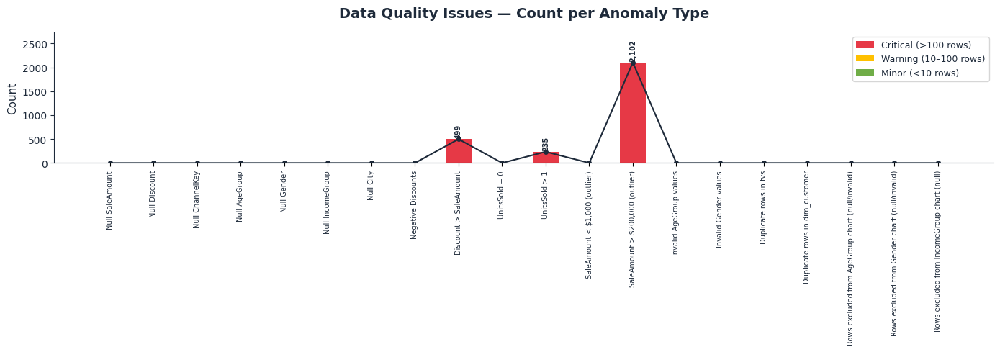

In [14]:
# ANOMALY REPORT BEFORE ANALYSIS
print("DATA QUALITY REPORT")

sales_cust_raw = fvs.merge(dim_customer, on="CustomerKey", how="left")

anomaly_df = pd.DataFrame({
    "Issue": [
        "Null SaleAmount",
        "Null Discount",
        "Null ChannelKey",
        "Null AgeGroup",
        "Null Gender",
        "Null IncomeGroup",
        "Null City",
        "Negative Discounts",
        "Discount > SaleAmount",
        "UnitsSold = 0",
        "UnitsSold > 1",
        "SaleAmount < $1,000 (outlier)",
        "SaleAmount > $200,000 (outlier)",
        "Invalid AgeGroup values",
        "Invalid Gender values",
        "Duplicate rows in fvs",
        "Duplicate rows in dim_customer",
        "Rows excluded from AgeGroup chart (null/invalid)",
        "Rows excluded from Gender chart (null/invalid)",
        "Rows excluded from IncomeGroup chart (null)",
    ],
    "Count": [
        fvs["SaleAmount"].isnull().sum(),
        fvs["Discount"].isnull().sum(),
        fvs["ChannelKey"].isnull().sum(),
        dim_customer["AgeGroup"].isnull().sum(),
        dim_customer["Gender"].isnull().sum(),
        dim_customer["IncomeGroup"].isnull().sum(),
        dim_customer["City"].isnull().sum(),
        (fvs["Discount"] < 0).sum(),
        (fvs["Discount"] > fvs["SaleAmount"]).sum(),
        (fvs["UnitsSold"] == 0).sum(),
        (fvs["UnitsSold"] > 1).sum(),
        (fvs["SaleAmount"] < 1000).sum(),
        (fvs["SaleAmount"] > 200000).sum(),
        (~dim_customer["AgeGroup"].isin(["Under 25","25-34","35-44","45-54","55-64","65+"]) & dim_customer["AgeGroup"].notna()).sum(),
        (~dim_customer["Gender"].isin(["Male","Female"]) & dim_customer["Gender"].notna()).sum(),
        fvs.duplicated().sum(),
        dim_customer.duplicated().sum(),
        sales_cust_raw["AgeGroup"].isnull().sum() + (~sales_cust_raw["AgeGroup"].isin(["Under 25","25-34","35-44","45-54","55-64","65+"]) & sales_cust_raw["AgeGroup"].notna()).sum(),
        sales_cust_raw["Gender"].isnull().sum() + (~sales_cust_raw["Gender"].isin(["Male","Female"]) & sales_cust_raw["Gender"].notna()).sum(),
        sales_cust_raw["IncomeGroup"].isnull().sum(),
    ],
    "% of Rows": [
        f"{fvs['SaleAmount'].isnull().sum()/len(fvs)*100:.1f}%",
        f"{fvs['Discount'].isnull().sum()/len(fvs)*100:.1f}%",
        f"{fvs['ChannelKey'].isnull().sum()/len(fvs)*100:.1f}%",
        f"{dim_customer['AgeGroup'].isnull().sum()/len(dim_customer)*100:.1f}%",
        f"{dim_customer['Gender'].isnull().sum()/len(dim_customer)*100:.1f}%",
        f"{dim_customer['IncomeGroup'].isnull().sum()/len(dim_customer)*100:.1f}%",
        f"{dim_customer['City'].isnull().sum()/len(dim_customer)*100:.1f}%",
        f"{(fvs['Discount']<0).sum()/len(fvs)*100:.1f}%",
        f"{(fvs['Discount']>fvs['SaleAmount']).sum()/len(fvs)*100:.1f}%",
        f"{(fvs['UnitsSold']==0).sum()/len(fvs)*100:.1f}%",
        f"{(fvs['UnitsSold']>1).sum()/len(fvs)*100:.1f}%",
        f"{(fvs['SaleAmount']<1000).sum()/len(fvs)*100:.1f}%",
        f"{(fvs['SaleAmount']>200000).sum()/len(fvs)*100:.1f}%",
        f"{(~dim_customer['AgeGroup'].isin(['Under 25','25-34','35-44','45-54','55-64','65+']) & dim_customer['AgeGroup'].notna()).sum()/len(dim_customer)*100:.1f}%",
        f"{(~dim_customer['Gender'].isin(['Male','Female']) & dim_customer['Gender'].notna()).sum()/len(dim_customer)*100:.1f}%",
        f"{fvs.duplicated().sum()/len(fvs)*100:.1f}%",
        f"{dim_customer.duplicated().sum()/len(dim_customer)*100:.1f}%",
        f"{(sales_cust_raw['AgeGroup'].isnull().sum() + (~sales_cust_raw['AgeGroup'].isin(['Under 25','25-34','35-44','45-54','55-64','65+']) & sales_cust_raw['AgeGroup'].notna()).sum())/len(sales_cust_raw)*100:.1f}%",
        f"{(sales_cust_raw['Gender'].isnull().sum() + (~sales_cust_raw['Gender'].isin(['Male','Female']) & sales_cust_raw['Gender'].notna()).sum())/len(sales_cust_raw)*100:.1f}%",
        f"{sales_cust_raw['IncomeGroup'].isnull().sum()/len(sales_cust_raw)*100:.1f}%",
    ],
    "Impact on Analysis": [
        "Rows excluded from revenue calculations",
        "Rows excluded from discount analysis",
        "Rows excluded from channel analysis",
        "Customers excluded from age group charts",
        "Customers excluded from gender charts",
        "Customers excluded from income charts",
        "Customers shown without city",
        "Discount distribution skewed left",
        "Revenue artificially inflated",
        "Units sold count understated",
        "Units sold count overstated",
        "Revenue mean/median pulled down",
        "Revenue mean/median pulled up",
        "Excluded from AgeGroup chart",
        "Excluded from Gender chart",
        "Revenue totals slightly inflated",
        "Customer counts slightly inflated",
        "Silent exclusion from AgeGroup chart",
        "Silent exclusion from Gender chart",
        "Silent exclusion from IncomeGroup chart",
    ]
})
anomaly_df.index = range(1, len(anomaly_df)+1)
display(anomaly_df)

# ANOMALY CHART
fig, ax = plt.subplots(figsize=(14, 5))

issues   = anomaly_df["Issue"].values
counts   = anomaly_df["Count"].values
colors   = ["#E63946" if c > 100 else "#FFC000" if c > 10 else "#70AD47"
            for c in counts]

bars = ax.bar(range(len(issues)), counts, color=colors, width=0.6, zorder=2)
for bar, val in zip(bars, counts):
    if val > 0:
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(counts)*0.01,
                f"{val:,}", ha="center", va="bottom",
                fontsize=7, fontweight="bold", color="#1E2A3A", rotation=90)

ax.plot(range(len(counts)), counts, color="#1E2A3A",
        marker="o", linewidth=1.5, markersize=4, zorder=3, label="Trend")

ax.set_title("Data Quality Issues — Count per Anomaly Type",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)
ax.set_xticks(range(len(issues)))
ax.set_xticklabels(issues, rotation=90, fontsize=7, color="#1E2A3A")
ax.set_ylabel("Count", color="#1E2A3A", fontsize=11)
ax.tick_params(axis="y", colors="#1E2A3A")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_color("#1E2A3A")
ax.spines["left"].set_color("#1E2A3A")
ax.margins(y=0.3)

from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor="#E63946", label="Critical (>100 rows)"),
    Patch(facecolor="#FFC000", label="Warning (10–100 rows)"),
    Patch(facecolor="#70AD47", label="Minor (<10 rows)")
]
ax.legend(handles=legend_elements, facecolor="white",
          labelcolor="#1E2A3A", fontsize=9)

plt.tight_layout()
plt.show()



## Exploratory Data Analysis (EDA)

Exploratory Data Analysis was performed to understand the overall structure, quality, and distribution of the dataset before conducting business analysis and visualization. The purpose of EDA was to identify missing values, duplicates, inconsistencies, and unusual patterns that could affect analytical accuracy and model performance.

## EDA Findings

* The dataset contains both fact and dimension tables with varying sizes, where `Fact_VehicleSales` is the largest table containing over 23,000 records.

* Missing values were observed across almost all tables, with the highest null count present in `Fact_VehicleSales`, indicating incomplete transactional information.

* Duplicate records were identified in multiple tables, particularly in sales, customer, and sales executive data, which may slightly affect aggregate calculations.

* Customer and sales-related tables contain substantially more records compared to region and channel tables, showing a typical star-schema warehouse structure.

* Dimension tables such as `Dim_Region`, `Dim_Channel`, and `Dim_Date` contained relatively low null counts, indicating comparatively cleaner reference data.

* Fact tables showed higher data inconsistency levels than dimension tables, suggesting transactional data requires more preprocessing before analysis.




FULL EXPLORATORY DATA ANALYSIS: AUTOMOBILE DATASET

Dataset Overview:


,Sheet,Rows,Cols,Nulls,Duplicates
1,Fact_VehicleSales,80347,12,0,0
2,Fact_TestDrive,55392,7,0,6542
3,Fact_MarketingCampaignPerforman,401,10,0,0
4,Dim_Vehicle,169,9,0,1
5,Dim_Customer,3022,8,0,0
6,Dim_Dealer,127,6,0,1
7,Dim_Region,7,5,0,0
8,Dim_Channel,19,10,0,0
9,Dim_Campaign,253,6,0,0
10,Dim_Date,2074,8,0,0


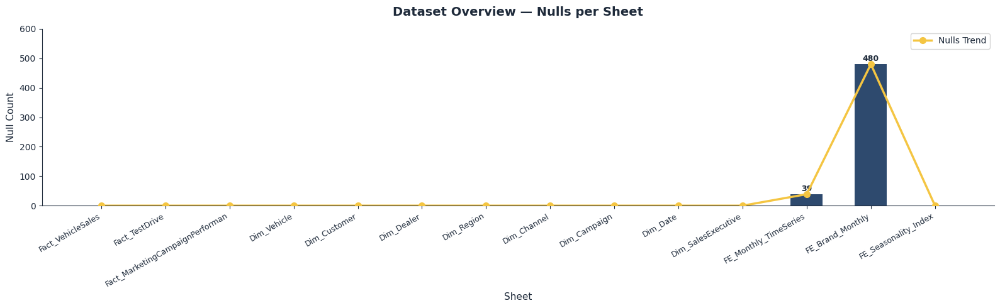

In [15]:
# EDA setup
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from IPython.display import display

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
LOCAL_FILE  = "/content/Car Sales.xlsx"

all_sheets2  = pd.read_excel(DRIVE_FILE, sheet_name=None)
fvs          = all_sheets2["Fact_VehicleSales"].copy()
ftd          = all_sheets2["Fact_TestDrive"].copy()
fmc          = all_sheets2["Fact_MarketingCampaignPerforman"].copy()
dim_date     = all_sheets2["Dim_Date"].copy()
dim_vehicle  = all_sheets2["Dim_Vehicle"].copy()
dim_customer = all_sheets2["Dim_Customer"].copy()
dim_dealer   = all_sheets2["Dim_Dealer"].copy()
dim_region   = all_sheets2["Dim_Region"].copy()
dim_channel  = all_sheets2["Dim_Channel"].copy()
dim_campaign = all_sheets2["Dim_Campaign"].copy()
dim_exec     = all_sheets2["Dim_SalesExecutive"].copy()

print("FULL EXPLORATORY DATA ANALYSIS: AUTOMOBILE DATASET")

overview = pd.DataFrame({
    "Sheet":      list(all_sheets2.keys()),
    "Rows":       [df.shape[0] for df in all_sheets2.values()],
    "Cols":       [df.shape[1] for df in all_sheets2.values()],
    "Nulls":      [df.isnull().sum().sum() for df in all_sheets2.values()],
    "Duplicates": [df.duplicated().sum() for df in all_sheets2.values()]
})
overview.index = range(1, len(overview)+1)
print("\nDataset Overview:")
display(overview)

# Chart
labels = overview["Sheet"].tolist()
values = overview["Nulls"].tolist()

fig, ax = plt.subplots(figsize=(16, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color="#2E4A6E", width=0.5, zorder=2)
for bar, val in zip(bars, values):
    if val > 0:
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(values)*0.01,
                f"{val:,}", ha="center", va="bottom",
                fontsize=9, fontweight="bold", color="#1E2A3A")

ax.plot(range(len(values)), values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=7, zorder=3, label="Nulls Trend")

ax.set_title("Dataset Overview — Nulls per Sheet",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=30, ha="right", color="#1E2A3A", fontsize=9)

ax.set_xlabel("Sheet", color="#1E2A3A", fontsize=11)
ax.tick_params(axis="x", colors="#1E2A3A", labelsize=9)
ax.spines["bottom"].set_visible(True)
ax.spines["bottom"].set_color("#1E2A3A")

ax.set_ylabel("Null Count", color="#1E2A3A", fontsize=11)
ax.yaxis.set_visible(True)
ax.tick_params(axis="y", colors="#1E2A3A", labelsize=10)
ax.spines["left"].set_visible(True)
ax.spines["left"].set_color("#1E2A3A")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.margins(y=0.25)
ax.legend(facecolor="white", labelcolor="#1E2A3A", fontsize=10)

plt.tight_layout()
plt.show()

EDA — FACT_VEHICLESALES

Shape: 80,347 rows × 12 columns
Duplicates: 0

Missing Values:


,Column,Missing Count,Missing %



Descriptive Statistics:


,SaleAmount,Discount,UnitsSold
count,80347.00,80347.00,80347.00
mean,48010.89,2612.74,1.01
std,89845.93,5548.59,0.12
min,5264.71,0.00,1.00
25%,22194.60,1068.81,1.00
50%,30201.31,1888.16,1.00
75%,43218.54,2819.48,1.00
max,893261.26,249136.69,4.00



Outlier & Validity Checks:
  SaleAmount outliers (IQR): 4,267 rows (5.3%)
  Negative Discounts:        0 rows
  Discount > SaleAmount:     499 rows
  UnitsSold ≠ 1:             235 rows


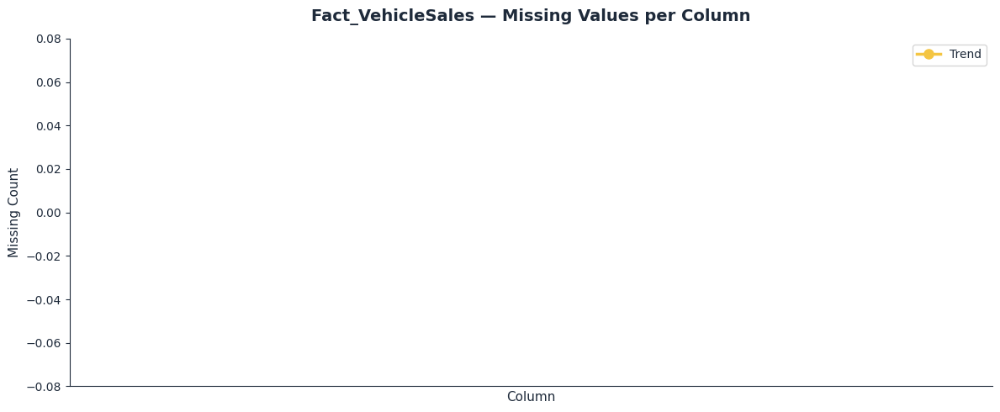

In [16]:
# 2. Fact_VehicleSales: Missing Values
print("EDA — FACT_VEHICLESALES")

print(f"\nShape: {fvs.shape[0]:,} rows × {fvs.shape[1]} columns")
print(f"Duplicates: {fvs.duplicated().sum()}")

missing = fvs.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(fvs) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print("\nMissing Values:")
display(missing_df)

print("\nDescriptive Statistics:")
display(fvs[["SaleAmount","Discount","UnitsSold"]].describe().round(2))

q1  = fvs["SaleAmount"].quantile(0.25)
q3  = fvs["SaleAmount"].quantile(0.75)
iqr = q3 - q1
outliers = fvs[(fvs["SaleAmount"] < q1-1.5*iqr) | (fvs["SaleAmount"] > q3+1.5*iqr)]
print("\nOutlier & Validity Checks:")
print(f"  SaleAmount outliers (IQR): {len(outliers):,} rows ({len(outliers)/len(fvs)*100:.1f}%)")
print(f"  Negative Discounts:        {(fvs['Discount']<0).sum():,} rows")
print(f"  Discount > SaleAmount:     {(fvs['Discount']>fvs['SaleAmount']).sum():,} rows")
print(f"  UnitsSold ≠ 1:             {(fvs['UnitsSold']!=1).sum():,} rows")

# Chart
missing_cols = missing[missing > 0]
labels = list(missing_cols.index)
values = list(missing_cols.values)

fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color="#2E4A6E", width=0.5, zorder=2)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(values)*0.01,
            f"{val:,}\n({val/len(fvs)*100:.1f}%)",
            ha="center", va="bottom",
            fontsize=10, fontweight="bold", color="#1E2A3A")

ax.plot(range(len(values)), values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=8, zorder=3, label="Trend")

ax.set_title("Fact_VehicleSales — Missing Values per Column",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, color="#1E2A3A", fontsize=11)

ax.set_xlabel("Column", color="#1E2A3A", fontsize=11)
ax.tick_params(axis="x", colors="#1E2A3A", labelsize=10)
ax.spines["bottom"].set_visible(True)
ax.spines["bottom"].set_color("#1E2A3A")

ax.set_ylabel("Missing Count", color="#1E2A3A", fontsize=11)
ax.yaxis.set_visible(True)
ax.tick_params(axis="y", colors="#1E2A3A", labelsize=10)
ax.spines["left"].set_visible(True)
ax.spines["left"].set_color("#1E2A3A")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.margins(y=0.3)
ax.legend(facecolor="white", labelcolor="#1E2A3A", fontsize=10)

plt.tight_layout()
plt.show()

SaleAmount Statistics:


,Metric,Value
1,Total Rows,"80,347"
2,Valid Rows (after cleaning),"78,739"
3,Missing,0 (0.0%)
4,"Below $1,000",0
5,"Above $200,000","2,102"
6,Min,"$11,733.67"
7,Max,"$607,626.20"
8,Mean,"$42,052.09"
9,Median,"$30,201.31"
10,Std Dev,"$64,969.67"


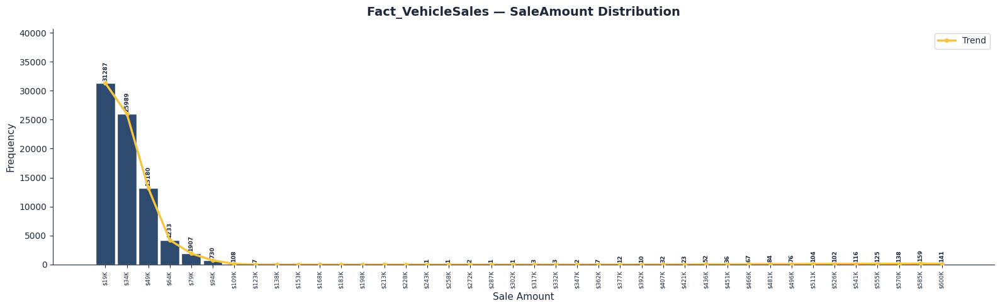

In [17]:
# 3. Fact_VehicleSales: SaleAmount Distribution
sale_clean = fvs["SaleAmount"].dropna()
sale_clean = sale_clean[(sale_clean >= sale_clean.quantile(0.01)) &
                         (sale_clean <= sale_clean.quantile(0.99))]

print("SaleAmount Statistics:")
sale_stats = pd.DataFrame({
    "Metric": ["Total Rows","Valid Rows (after cleaning)","Missing",
               "Below $1,000","Above $200,000","Min","Max","Mean","Median","Std Dev"],
    "Value":  [f"{len(fvs):,}",
               f"{len(sale_clean):,}",
               f"{fvs['SaleAmount'].isnull().sum():,} ({fvs['SaleAmount'].isnull().sum()/len(fvs)*100:.1f}%)",
               f"{(fvs['SaleAmount']<1000).sum():,}",
               f"{(fvs['SaleAmount']>200000).sum():,}",
               f"${sale_clean.min():,.2f}",
               f"${sale_clean.max():,.2f}",
               f"${sale_clean.mean():,.2f}",
               f"${sale_clean.median():,.2f}",
               f"${sale_clean.std():,.2f}"]
})
sale_stats.index = range(1, len(sale_stats)+1)
display(sale_stats)

# Chart
n_counts, bins = np.histogram(sale_clean, bins=40)
bin_mids = 0.5 * (bins[:-1] + bins[1:])

fig, ax = plt.subplots(figsize=(16, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(bin_mids, n_counts, width=(bins[1]-bins[0])*0.9,
              color="#2E4A6E", edgecolor="white", zorder=2)
for bar, val in zip(bars, n_counts):
    if val > 0:
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(n_counts)*0.01,
                f"{int(val)}", ha="center", va="bottom",
                fontsize=6.5, fontweight="bold", color="#1E2A3A", rotation=90)

ax.plot(bin_mids, n_counts, color="#F4C542",
        marker="o", linewidth=2.5, markersize=4, zorder=3, label="Trend")

ax.set_title("Fact_VehicleSales — SaleAmount Distribution",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)

# X axis label for every bar
ax.set_xticks(bin_mids)
ax.set_xticklabels(
    [f"${x/1000:.0f}K" for x in bin_mids],
    rotation=90, fontsize=6.5, color="#1E2A3A"
)

ax.tick_params(axis="x", colors="#1E2A3A", labelsize=6.5)
ax.spines["bottom"].set_visible(True)
ax.spines["bottom"].set_color("#1E2A3A")

ax.set_xlabel("Sale Amount", color="#1E2A3A", fontsize=11)
ax.set_ylabel("Frequency", color="#1E2A3A", fontsize=11)
ax.yaxis.set_visible(True)
ax.tick_params(axis="y", colors="#1E2A3A", labelsize=10)
ax.spines["left"].set_visible(True)
ax.spines["left"].set_color("#1E2A3A")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.margins(y=0.3)
ax.legend(facecolor="white", labelcolor="#1E2A3A", fontsize=10)

plt.tight_layout()
plt.show()

Discount Statistics:


,Metric,Value
1,Total Rows,"80,347"
2,Valid Rows (after cleaning),"79,543"
3,Missing,0 (0.0%)
4,Negative Discounts,0
5,Discount > SaleAmount,499
6,Min,$0.00
7,Max,"$13,574.32"
8,Mean,"$2,162.61"
9,Median,"$1,888.16"
10,Std Dev,"$1,700.55"


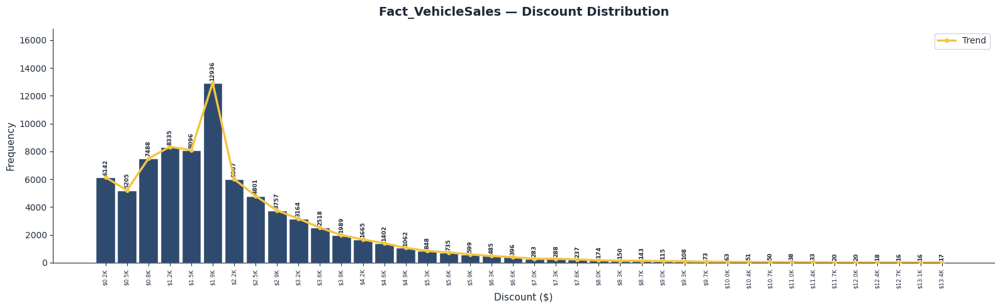

In [18]:
# 4. Fact_VehicleSales: Discount Distribution
import matplotlib.ticker as mticker
disc_clean = fvs["Discount"].dropna()
disc_clean = disc_clean[(disc_clean >= 0) &
                         (disc_clean <= disc_clean.quantile(0.99))]

# Table
print("Discount Statistics:")
disc_stats = pd.DataFrame({
    "Metric": ["Total Rows", "Valid Rows (after cleaning)", "Missing", "Negative Discounts",
               "Discount > SaleAmount", "Min", "Max", "Mean", "Median", "Std Dev"],
    "Value":  [f"{len(fvs):,}",
               f"{len(disc_clean):,}",
               f"{fvs['Discount'].isnull().sum():,} ({fvs['Discount'].isnull().sum()/len(fvs)*100:.1f}%)",
               f"{(fvs['Discount'] < 0).sum():,}",
               f"{(fvs['Discount'] > fvs['SaleAmount']).sum():,}",
               f"${disc_clean.min():,.2f}",
               f"${disc_clean.max():,.2f}",
               f"${disc_clean.mean():,.2f}",
               f"${disc_clean.median():,.2f}",
               f"${disc_clean.std():,.2f}"]
})
disc_stats.index = range(1, len(disc_stats)+1)
display(disc_stats)

# Chart
n_counts, bins = np.histogram(disc_clean, bins=40)
bin_mids = 0.5 * (bins[:-1] + bins[1:])

fig, ax = plt.subplots(figsize=(16, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(bin_mids, n_counts, width=(bins[1]-bins[0])*0.9,
              color="#2E4A6E", edgecolor="white", zorder=2)
for bar, val in zip(bars, n_counts):
    if val > 0:
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(n_counts)*0.01,
                f"{int(val)}", ha="center", va="bottom",
                fontsize=6.5, fontweight="bold", color="#1E2A3A", rotation=90)

ax.plot(bin_mids, n_counts, color="#F4C542",
        marker="o", linewidth=2.5, markersize=4, zorder=3, label="Trend")

ax.set_title("Fact_VehicleSales — Discount Distribution",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)

ax.set_xticks(bin_mids)
ax.set_xticklabels(
    [f"${x/1000:.1f}K" for x in bin_mids],
    rotation=90, fontsize=6.5, color="#1E2A3A"
)

ax.tick_params(axis="x", colors="#1E2A3A", labelsize=6.5)
ax.spines["bottom"].set_visible(True)
ax.spines["bottom"].set_color("#1E2A3A")

ax.set_xlabel("Discount ($)", color="#1E2A3A", fontsize=11)
ax.set_ylabel("Frequency", color="#1E2A3A", fontsize=11)
ax.yaxis.set_visible(True)
ax.tick_params(axis="y", colors="#1E2A3A", labelsize=10)
ax.spines["left"].set_visible(True)
ax.spines["left"].set_color("#1E2A3A")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.margins(y=0.3)
ax.legend(facecolor="white", labelcolor="#1E2A3A", fontsize=10)

plt.tight_layout()
plt.show()

EDA: FACT_TESTDRIVE

Shape: 55,392 rows × 7 columns
Duplicates: 6542

Missing Values:


,Column,Missing Count,Missing %



Outcome Distribution:


,count
Outcome,
Not Converted,46183
Converted,9209



  Conversion Rate (excl. nulls): 16.6%


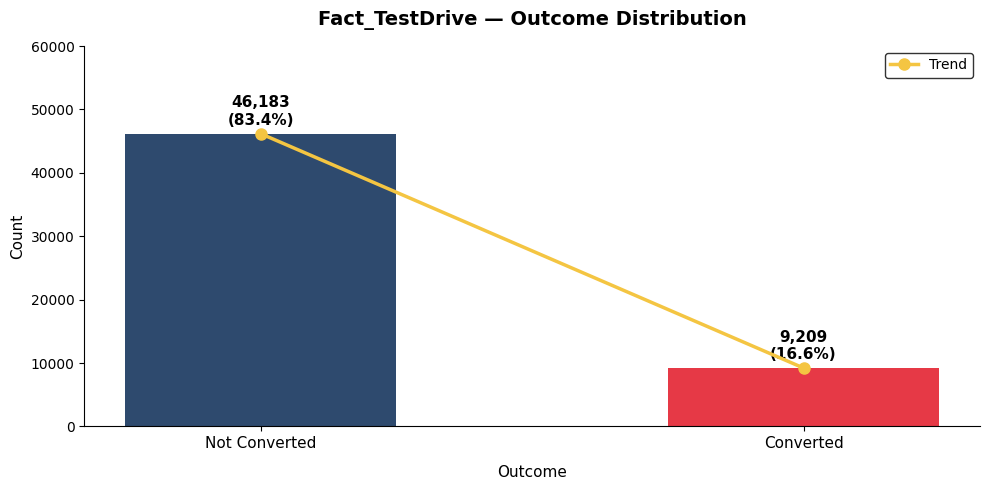

In [19]:
# 5. Fact_TestDrive: Outcome Distribution
print("EDA: FACT_TESTDRIVE")

print(f"\nShape: {ftd.shape[0]:,} rows × {ftd.shape[1]} columns")
print(f"Duplicates: {ftd.duplicated().sum()}")

missing = ftd.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(ftd) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print("\nMissing Values:")
display(missing_df)

outcome   = ftd["Outcome"].value_counts(dropna=False)
conv_rate = (ftd["Outcome"] == "Converted").sum() / ftd["Outcome"].notna().sum() * 100
print("\nOutcome Distribution:")
display(outcome)
print(f"\n  Conversion Rate (excl. nulls): {conv_rate:.1f}%")

# Chart
labels = [str(l) for l in outcome.index]
values = list(outcome.values)

colors = ["#2E4A6E", "#E63946", "#70AD47"][:len(labels)]

fig, ax = plt.subplots(figsize=(10, 5))

fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(
    range(len(labels)),
    values,
    color=colors,
    width=0.5,
    zorder=2
)

for bar, val in zip(bars, values):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + max(values) * 0.02,
        f"{val:,}\n({val/len(ftd)*100:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=11,
        fontweight="bold",
        color="black"
    )

ax.plot(
    range(len(values)),
    values,
    color="#F4C542",
    marker="o",
    linewidth=2.5,
    markersize=8,
    zorder=3,
    label="Trend"
)

ax.set_title(
    "Fact_TestDrive — Outcome Distribution",
    fontsize=14,
    fontweight="bold",
    color="black",
    pad=15
)

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=11, color="black")
ax.set_xlabel("Outcome", fontsize=11, color="black", labelpad=10)

ax.set_ylabel("Count", fontsize=11, color="black")

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.spines["left"].set_visible(True)
ax.spines["bottom"].set_visible(True)

ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")

ax.tick_params(axis="both", colors="black")

ax.margins(y=0.3)

ax.legend(facecolor="white", edgecolor="black")

plt.tight_layout()
plt.show()

EDA: FACT_MARKETINGCAMPAIGN

Shape: 401 rows × 10 columns
Duplicates: 0

Missing Values:


,Column,Missing Count,Missing %



Descriptive Statistics:


,Impressions,Leads,TestDrives,Bookings,CampaignCost,RevenueGenerated
count,401.00,401.00,401.00,401.00,401.00,401.00
mean,175294.10,7191.04,1176.29,336.86,2874167.07,3623890.63
std,151192.99,4987.71,862.63,257.13,2116064.67,2892107.59
min,584.00,76.00,8.00,1.00,26315.20,20792.00
25%,95726.00,3062.00,455.00,139.00,871820.07,983904.32
50%,152486.00,6885.00,1129.00,308.00,2772377.42,3439839.92
75%,218673.00,10371.00,1686.00,468.00,4302425.81,4988095.87
max,1406445.00,25047.00,4837.00,1562.00,9552409.97,14898355.82



ROI Stats:
  Min: -24.8%  Max: 74.5%  Avg: 22.6%


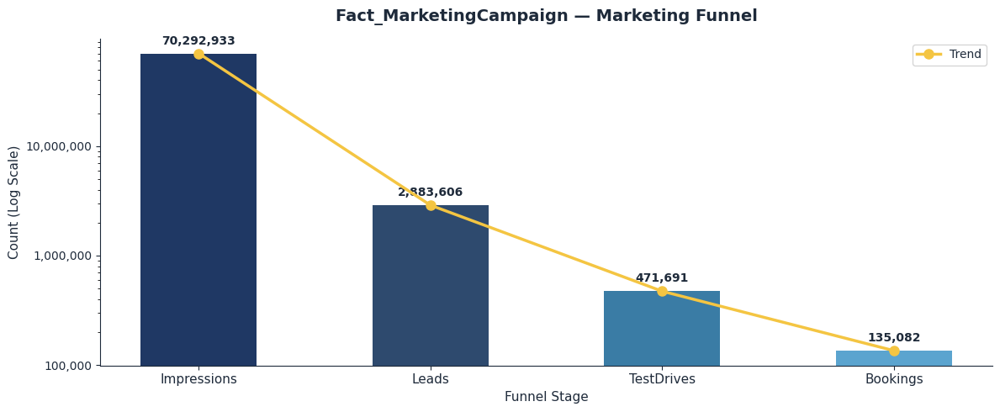

In [20]:
# 6. Fact_MarketingCampaign: Funnel
print("EDA: FACT_MARKETINGCAMPAIGN")

print(f"\nShape: {fmc.shape[0]:,} rows × {fmc.shape[1]} columns")
print(f"Duplicates: {fmc.duplicated().sum()}")

missing = fmc.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(fmc) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print("\nMissing Values:")
display(missing_df)

print("\nDescriptive Statistics:")
display(fmc[["Impressions","Leads","TestDrives","Bookings",
             "CampaignCost","RevenueGenerated"]].describe().round(2))

fmc_clean      = fmc.dropna(subset=["CampaignCost","RevenueGenerated"])
fmc_clean      = fmc_clean[fmc_clean["CampaignCost"] > 0].copy()
fmc_clean["ROI%"] = ((fmc_clean["RevenueGenerated"] - fmc_clean["CampaignCost"]) /
                      fmc_clean["CampaignCost"] * 100).round(1)
print(f"\nROI Stats:")
print(f"  Min: {fmc_clean['ROI%'].min():.1f}%  "
      f"Max: {fmc_clean['ROI%'].max():.1f}%  "
      f"Avg: {fmc_clean['ROI%'].mean():.1f}%")

# Chart
funnel_labels = ["Impressions","Leads","TestDrives","Bookings"]
funnel_values = [int(fmc["Impressions"].sum()), int(fmc["Leads"].sum()),
                 int(fmc["TestDrives"].sum()), int(fmc["Bookings"].sum())]
colors = ["#1F3864","#2E4A6E","#3A7CA5","#5BA4CF"]

fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(funnel_labels)), funnel_values,
              color=colors, width=0.5, zorder=2)
for bar, val in zip(bars, funnel_values):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() * 1.15,
            f"{val:,}", ha="center", va="bottom",
            fontsize=10, fontweight="bold", color="#1E2A3A")

ax.plot(range(len(funnel_values)), funnel_values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=8, zorder=3, label="Trend")

ax.set_yscale("log")
ax.set_ylabel("Count (Log Scale)", color="#1E2A3A", fontsize=11)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(
    lambda x, _: f"{int(x):,}" if x >= 1 else ""))

ax.set_title("Fact_MarketingCampaign — Marketing Funnel",
             fontsize=14, fontweight="bold", color="#1E2A3A", pad=15)
ax.set_xticks(range(len(funnel_labels)))
ax.set_xticklabels(funnel_labels, color="#1E2A3A", fontsize=11)
ax.set_xlabel("Funnel Stage", color="#1E2A3A", fontsize=11)

ax.tick_params(axis="x", colors="#1E2A3A")
ax.tick_params(axis="y", colors="#1E2A3A")
ax.spines["bottom"].set_visible(True)
ax.spines["bottom"].set_color("#1E2A3A")
ax.spines["left"].set_visible(True)
ax.spines["left"].set_color("#1E2A3A")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(facecolor="white", labelcolor="#1E2A3A", fontsize=10)

plt.tight_layout()
plt.show()

EDA: DIM_VEHICLE

Shape: 169 rows × 9 columns
Duplicates: 1

Missing Values:


,Column,Missing Count,Missing %



Price Statistics:


,Price
count,169.00
mean,33547.53
std,61987.58
min,9000.00
25%,18000.00
50%,22500.00
75%,33000.00
max,584066.45


  Prices below $5,000:   0 vehicles
  Prices above $100,000: 2 vehicles

FuelType Distribution:


,count
FuelType,
Petrol,87
Diesel,43
CNG,20
Hybrid,19



BodyType Distribution:


,count
BodyType,
Hatchback,42
SUV,38
Passenger,37
Sedan,31
Hardtop,21



Top 10 Brands:


,count
Brand,
Ford,15
Dodge,11
Chevrolet,10
Toyota,10
Mercedes-B,9
Chrysler,8
Mitsubishi,8
Nissan,8
Volkswagen,8


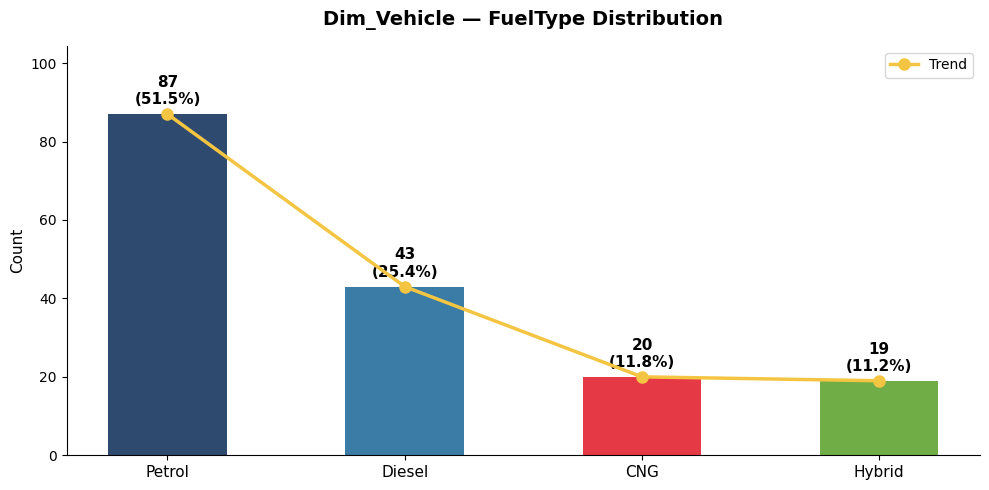

In [21]:
# 7. Dim_Vehicle: FuelType Distribution
print("EDA: DIM_VEHICLE")

print(f"\nShape: {dim_vehicle.shape[0]:,} rows × {dim_vehicle.shape[1]} columns")
print(f"Duplicates: {dim_vehicle.duplicated().sum()}")

missing = dim_vehicle.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_vehicle) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print("\nMissing Values:")
display(missing_df)

print("\nPrice Statistics:")
display(dim_vehicle["Price"].describe().round(2))
print(f"  Prices below $5,000:   {(dim_vehicle['Price'] < 5000).sum()} vehicles")
print(f"  Prices above $100,000: {(dim_vehicle['Price'] > 100000).sum()} vehicles")

print("\nFuelType Distribution:")
display(dim_vehicle["FuelType"].value_counts(dropna=False))
print("\nBodyType Distribution:")
display(dim_vehicle["BodyType"].value_counts(dropna=False))
print("\nTop 10 Brands:")
display(dim_vehicle["Brand"].value_counts().head(10))

# Chart
fuel   = dim_vehicle["FuelType"].value_counts(dropna=False)
labels = [str(l) for l in fuel.index]
values = list(fuel.values)
colors = ["#2E4A6E","#3A7CA5","#E63946","#70AD47","#F4C542"][:len(labels)]

fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color=colors, width=0.5, zorder=2)

for bar, val in zip(bars, values):
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + max(values)*0.02,
        f"{val}\n({val/len(dim_vehicle)*100:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=11,
        fontweight="bold",
        color="black"
    )

ax.plot(
    range(len(values)),
    values,
    color="#F4C542",
    marker="o",
    linewidth=2.5,
    markersize=8,
    zorder=3,
    label="Trend"
)

ax.set_title(
    "Dim_Vehicle — FuelType Distribution",
    fontsize=14,
    fontweight="bold",
    color="black",
    pad=15
)

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=11, color="black")

ax.set_ylabel("Count", fontsize=11, color="black")

for spine in ["top", "right"]:
    ax.spines[spine].set_visible(False)

ax.spines["left"].set_visible(True)
ax.spines["bottom"].set_visible(True)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")

ax.tick_params(axis="both", colors="black")

ax.margins(y=0.2)

ax.legend()

plt.tight_layout()
plt.show()

EDA: DIM_CUSTOMER

Shape: 3,022 rows × 8 columns
Duplicates: 0

Missing Values:


,Column,Missing Count,Missing %



Invalid Values:
  Invalid AgeGroup: 0 rows
  Invalid Gender:   0 rows

AgeGroup Distribution:


,count
AgeGroup,
35-44,941
25-34,589
45-54,585
55-64,446
Under 25,231
65+,230



IncomeGroup Distribution:


,count
IncomeGroup,
Upper-Middle,1493
Low,919
High,610



Gender Distribution:


,count
Gender,
Male,2367
Female,655


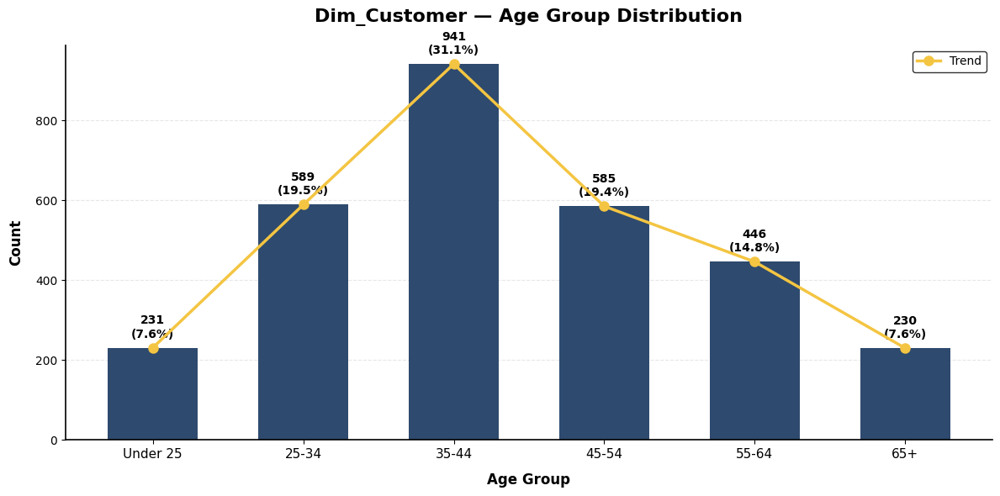

In [22]:
# 8. Dim_Customer: Age Group Distribution
print("EDA: DIM_CUSTOMER")

print(f"\nShape: {dim_customer.shape[0]:,} rows × {dim_customer.shape[1]} columns")
print(f"Duplicates: {dim_customer.duplicated().sum()}")

missing = dim_customer.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_customer) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print("\nMissing Values:")
display(missing_df)

valid_ages    = ["Under 25","25-34","35-44","45-54","55-64","65+"]
valid_genders = ["Male","Female"]
invalid_age    = dim_customer[~dim_customer["AgeGroup"].isin(valid_ages) &
                               dim_customer["AgeGroup"].notna()]
invalid_gender = dim_customer[~dim_customer["Gender"].isin(valid_genders) &
                               dim_customer["Gender"].notna()]
print(f"\nInvalid Values:")
print(f"  Invalid AgeGroup: {len(invalid_age)} rows")
print(f"  Invalid Gender:   {len(invalid_gender)} rows")

print("\nAgeGroup Distribution:")
display(dim_customer["AgeGroup"].value_counts(dropna=False))
print("\nIncomeGroup Distribution:")
display(dim_customer["IncomeGroup"].value_counts(dropna=False))
print("\nGender Distribution:")
display(dim_customer["Gender"].value_counts(dropna=False))

# Chart
import matplotlib.pyplot as plt

age_order = ["Under 25","25-34","35-44","45-54","55-64","65+"]
age_clean = dim_customer[dim_customer["AgeGroup"].isin(age_order)]

age    = age_clean["AgeGroup"].value_counts().reindex(age_order)
labels = list(age.index)
values = list(age.values)

fig, ax = plt.subplots(figsize=(12, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(
    range(len(labels)),
    values,
    color="#2E4A6E",
    width=0.6,
    zorder=2
)

for bar, val in zip(bars, values):
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + max(values)*0.02,
        f"{val:,}\n({val/len(dim_customer)*100:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
        color="black"
    )
ax.plot(
    range(len(values)),
    values,
    color="#F4C542",
    marker="o",
    linewidth=2.5,
    markersize=8,
    zorder=3,
    label="Trend"
)
ax.set_title(
    "Dim_Customer — Age Group Distribution",
    fontsize=16,
    fontweight="bold",
    color="black",
    pad=20
)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(
    labels,
    fontsize=11,
    color="black"
)
ax.set_xlabel(
    "Age Group",
    fontsize=12,
    fontweight="bold",
    color="black",
    labelpad=10
)

ax.set_ylabel(
    "Count",
    fontsize=12,
    fontweight="bold",
    color="black",
    labelpad=10
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")

ax.spines["left"].set_linewidth(1.2)
ax.spines["bottom"].set_linewidth(1.2)

ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')

ax.grid(
    axis='y',
    linestyle='--',
    alpha=0.3,
    zorder=1
)

ax.legend(
    facecolor="white",
    edgecolor="black"
)

plt.tight_layout()
plt.show()

EDA: DIM_DEALER

Dim_Dealer — Shape: (127, 6)
  Duplicates: 1

  Missing Values:


,Column,Missing Count,Missing %



  DealerType Distribution:


,count
DealerType,
Authorized,83
Franchise,44



  Dealers per State:


,count
State,
Ohio,35
Wisconsin,30
Texas,22
South Carolina,14
Colorado,12
Arizona,9
Washington,5



  Dealers per City:


,count
City,
Middletown,35
Janesville,30
Austin,22
Greenville,14
Aurora,12
Scottsdale,9
Pasco,5


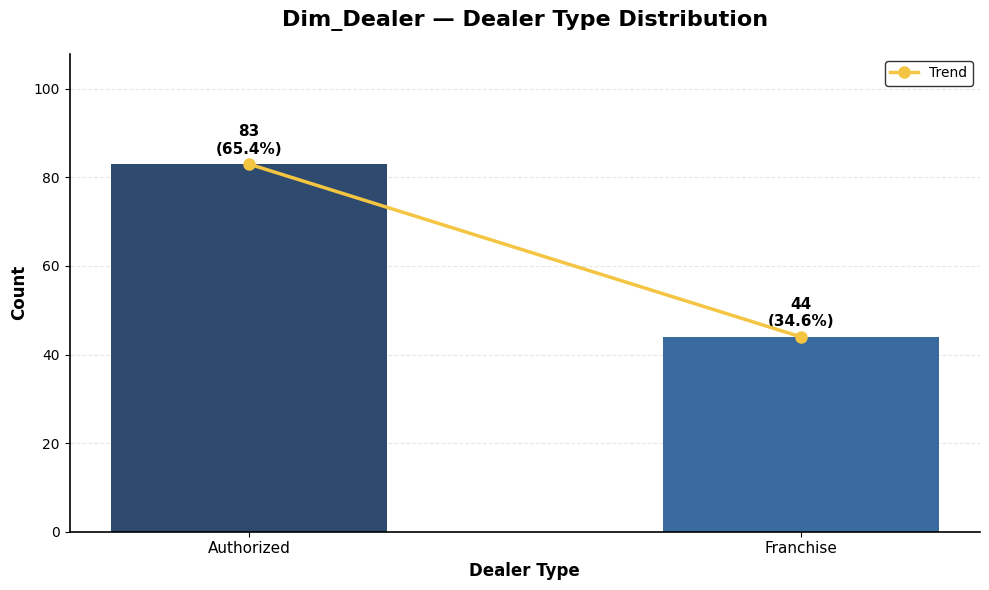

In [23]:
# 9. Dim_Dealer: Dealer Type Distribution
print("EDA: DIM_DEALER")

print(f"\nDim_Dealer — Shape: {dim_dealer.shape}")
print(f"  Duplicates: {dim_dealer.duplicated().sum()}")

missing = dim_dealer.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_dealer) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print(f"\n  Missing Values:")
display(missing_df)

print(f"\n  DealerType Distribution:")
display(dim_dealer["DealerType"].value_counts(dropna=False))

print(f"\n  Dealers per State:")
display(dim_dealer["State"].value_counts(dropna=False))

print(f"\n  Dealers per City:")
display(dim_dealer["City"].value_counts(dropna=False))

# Chart
dtype  = dim_dealer["DealerType"].value_counts(dropna=False)
labels = [str(l) for l in dtype.index]
values = list(dtype.values)
colors = ["#2E4A6E","#3A6B9E","#E63946"][:len(labels)]

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color=colors, width=0.5, zorder=2)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(values)*0.02,
            f"{val}\n({val/len(dim_dealer)*100:.1f}%)",
            ha="center", va="bottom",
            fontsize=11, fontweight="bold", color="black")

ax.plot(range(len(values)), values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=8, zorder=3, label="Trend")

ax.set_title("Dim_Dealer — Dealer Type Distribution",
             fontsize=16, fontweight="bold", color="black", pad=20)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=11, color="black")
ax.set_ylabel("Count", fontsize=12, fontweight="bold", color="black")
ax.set_xlabel("Dealer Type", fontsize=12, fontweight="bold", color="black")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_linewidth(1.2)
ax.spines["bottom"].set_linewidth(1.2)
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)
ax.legend(facecolor="white", edgecolor="black")
ax.margins(y=0.3)
plt.tight_layout()
plt.show()

EDA: DIM_REGION

Dim_Region — Shape: (7, 5)
  Duplicates: 0

  Missing Values:


,Column,Missing Count,Missing %



  All Regions:


,RegionKey,Country,City,Zone,State
0,4001,United States,Aurora,West,Colorado
1,4002,United States,Pasco,West,Washington
2,4003,United States,Scottsdale,West,Arizona
3,4004,United States,Middletown,Midwest,Ohio
4,4005,United States,Janesville,West,Wisconsin
5,4006,United States,Greenville,South,South Carolina
6,4007,United States,Austin,West,Texas



  Zone Distribution:


,count
Zone,
West,5
Midwest,1
South,1



  State Distribution:


,count
State,
Colorado,1
Washington,1
Arizona,1
Ohio,1
Wisconsin,1
South Carolina,1
Texas,1


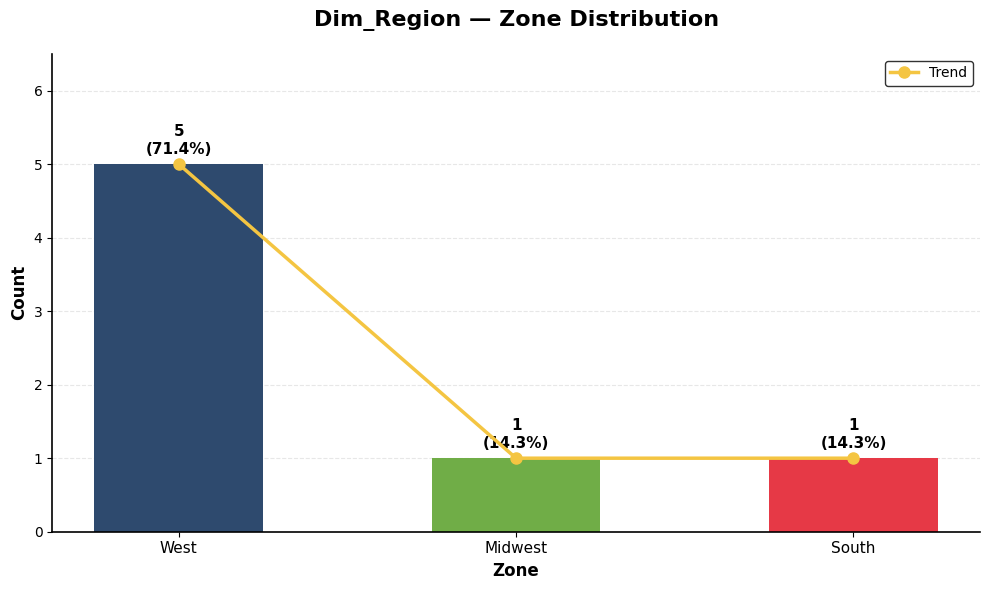

In [24]:
# 10. Dim_Region: Zone Distribution
print("EDA: DIM_REGION")

print(f"\nDim_Region — Shape: {dim_region.shape}")
print(f"  Duplicates: {dim_region.duplicated().sum()}")

missing = dim_region.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_region) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print(f"\n  Missing Values:")
display(missing_df)

print(f"\n  All Regions:")
display(dim_region)

print(f"\n  Zone Distribution:")
display(dim_region["Zone"].value_counts(dropna=False))

print(f"\n  State Distribution:")
display(dim_region["State"].value_counts(dropna=False))

# Chart
zone   = dim_region["Zone"].value_counts(dropna=False)
labels = [str(l) for l in zone.index]
values = list(zone.values)
colors = ["#2E4A6E","#70AD47","#E63946","#F39C12"][:len(labels)]

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color=colors, width=0.5, zorder=2)
for bar, val in zip(bars, values):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(values)*0.02,
            f"{val}\n({val/len(dim_region)*100:.1f}%)",
            ha="center", va="bottom",
            fontsize=11, fontweight="bold", color="black")

ax.plot(range(len(values)), values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=8, zorder=3, label="Trend")

ax.set_title("Dim_Region — Zone Distribution",
             fontsize=16, fontweight="bold", color="black", pad=20)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=11, color="black")
ax.set_ylabel("Count", fontsize=12, fontweight="bold", color="black")
ax.set_xlabel("Zone", fontsize=12, fontweight="bold", color="black")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_linewidth(1.2)
ax.spines["bottom"].set_linewidth(1.2)
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)
ax.legend(facecolor="white", edgecolor="black")
ax.margins(y=0.3)
plt.tight_layout()
plt.show()

In [25]:
mktg = (
    fmc
    .merge(dim_campaign, on="CampaignKey", how="left")
    .merge(dim_channel,  on="ChannelKey",  how="left", suffixes=("","_chan"))
    .merge(dim_date,     on="DateKey",     how="left", suffixes=("","_date"))
)
print(f"mktg rebuilt — {mktg.shape}")

sales_by_medium = (
    mktg
    .groupby('Medium', as_index=False)
    .agg(TotalRevenue=('RevenueGenerated', 'sum'),
         Transactions=('CampaignFactKey', 'count'))
)
sales_by_medium['Pct'] = (sales_by_medium['TotalRevenue'] / sales_by_medium['TotalRevenue'].sum() * 100).round(1)

print(sales_by_medium)

mktg rebuilt — (401, 31)
    Medium  TotalRevenue  Transactions   Pct
0  Offline  7.185344e+08           218  49.4
1   Online  7.346458e+08           183  50.6


EDA: DIM_CHANNEL

Dim_Channel — Shape: (19, 10)
  Duplicates: 0

  Missing Values:


,Column,Missing Count,Missing %



  All Channels:


,ChannelKey,ChannelName,ChannelType,Medium,AvgCPL_USD,ConversionRate_pct,ReachScope,CostTier,IsDigital,IsTracked
0,701,Google Search,Paid Digital,Online,45,18,National,High,Yes,Yes
1,702,Facebook,Paid Social,Online,30,14,National,Medium,Yes,Yes
2,703,Instagram,Paid Social,Online,25,12,National,Medium,Yes,Yes
3,704,YouTube,Video Ad,Online,18,10,National,Medium,Yes,Yes
4,705,Email Campaign,Direct Digital,Online,10,20,Database,Low,Yes,Yes
5,706,Showroom Walk-in,Physical,Offline,65,38,Local,High,No,Partial
6,707,Auto Expo / Event,Event,Offline,80,30,Regional,High,No,Partial
7,708,TV Advertisement,Broadcast,Offline,12,8,National,High,No,No
8,709,Radio,Broadcast,Offline,8,7,Regional,Low,No,No
9,710,Referral,Word of Mouth,Offline,5,45,Local,Low,No,No



  ChannelType Distribution:


,count
ChannelType,
Paid Social,3
Broadcast,2
Messaging,2
Video Ad,1
Direct Digital,1
Physical,1
Paid Digital,1
Event,1
Word of Mouth,1



  Online vs Offline:


,count
Medium,
Offline,10
Online,9


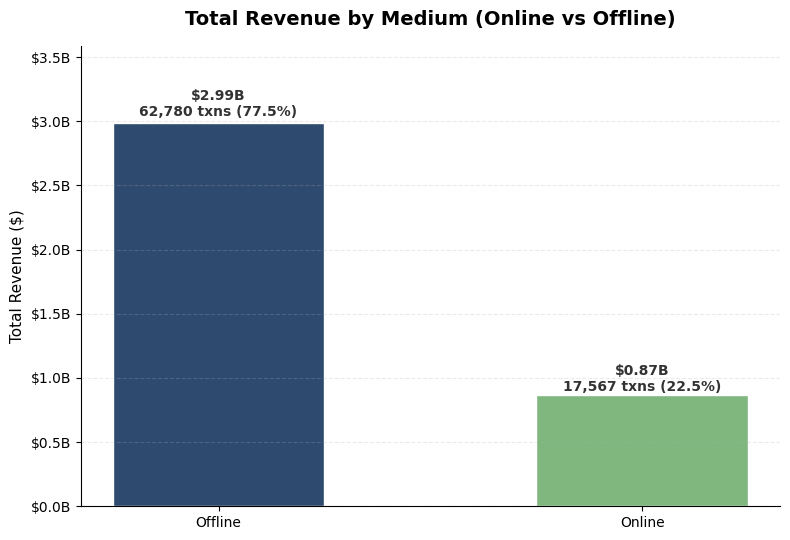

In [26]:
# 11. Dim_Channel: Channel Type Distribution

sales_by_medium = (
    fvs
    .merge(dim_channel[['ChannelKey', 'Medium']], on='ChannelKey', how='left')
    .groupby('Medium', as_index=False)
    .agg(TotalRevenue=('SaleAmount', 'sum'),
         Transactions=('SalesKey', 'count'))
)
sales_by_medium['Pct'] = (sales_by_medium['TotalRevenue'] / sales_by_medium['TotalRevenue'].sum() * 100).round(1)
print("EDA: DIM_CHANNEL")

print(f"\nDim_Channel — Shape: {dim_channel.shape}")
print(f"  Duplicates: {dim_channel.duplicated().sum()}")

missing = dim_channel.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_channel) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print(f"\n  Missing Values:")
display(missing_df)

print(f"\n  All Channels:")
display(dim_channel)

print(f"\n  ChannelType Distribution:")
display(dim_channel["ChannelType"].value_counts(dropna=False))

print(f"\n  Online vs Offline:")
display(dim_channel["Medium"].value_counts(dropna=False))

# Chart
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

fig, ax = plt.subplots(figsize=(8, 5.5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

colors = ["#2E4A6E", "#7FB77E"]
bars = ax.bar(sales_by_medium["Medium"], sales_by_medium["TotalRevenue"],
              color=colors, width=0.5, edgecolor="white")

for bar, val, txn, pct in zip(bars, sales_by_medium["TotalRevenue"],
                                sales_by_medium["Transactions"], sales_by_medium["Pct"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + bar.get_height()*0.01,
            f"${val/1e9:.2f}B\n{txn:,} txns ({pct}%)",
            ha="center", va="bottom", fontsize=10, fontweight="bold", color="#333")

ax.set_title("Total Revenue by Medium (Online vs Offline)", fontsize=14, fontweight="bold", pad=15)
ax.set_ylabel("Total Revenue ($)", fontsize=11)
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda v, _: f"${v/1e9:.1f}B"))

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis="y", linestyle="--", alpha=0.25)
ax.margins(y=0.2)

plt.tight_layout()
plt.show()

In [27]:
# Normalize Quarter to a consistent string format before analysis
dim_date["Quarter"] = dim_date["Quarter"].astype(str)
dim_date["Quarter"] = dim_date["Quarter"].apply(lambda x: x if x.startswith("Q") else f"Q{x}")

print(dim_date["Quarter"].value_counts().sort_index())

Quarter
Q1    499
Q2    519
Q3    523
Q4    533
Name: count, dtype: int64


EDA: DIM_CAMPAIGN & DIM_SALESEXECUTIVE & DIM_DATE

Dim_Campaign — Shape: (253, 7)
  Duplicates: 0
  Invalid Dates (End < Start): 0
  Zero/Negative Budget:        0

  Budget Stats:


,Budget
count,253.00
mean,221168.28
std,154110.87
min,28117.72
25%,127678.51
50%,184189.70
75%,277863.15
max,987517.84



  CampaignType Distribution:


,count
CampaignType,
Product Launch,41
Digital,35
Test Drive,33
Loyalty,32
Discount,31
Referral,30
Seasonal,26
Awareness,25



Dim_SalesExecutive — Shape: (378, 4)
  Duplicates: 0

  Experience Stats:


,Experience
count,378.00
mean,10.45
std,5.99
min,1.00
25%,5.00
50%,10.50
75%,16.00
max,20.00



Dim_Date — Shape: (2074, 8)
  Date Range: 2020-01-01 → 2025-12-31
  Years: [2020, 2021, 2022, 2023, 2024, 2025]


,count
Quarter,
Q1,499
Q2,519
Q3,523
Q4,533


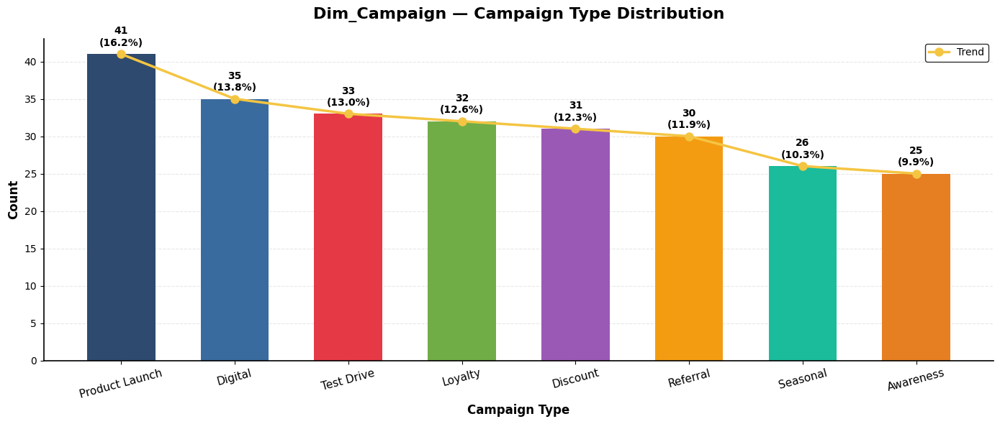

In [28]:
# 12. Dim_Campaign: Campaign Type Distribution
print("EDA: DIM_CAMPAIGN & DIM_SALESEXECUTIVE & DIM_DATE")

dim_campaign["StartDate"] = pd.to_datetime(dim_campaign["StartDate"])
dim_campaign["EndDate"]   = pd.to_datetime(dim_campaign["EndDate"])
dim_campaign["Duration"]  = (dim_campaign["EndDate"] - dim_campaign["StartDate"]).dt.days

print(f"\nDim_Campaign — Shape: {dim_campaign.shape}")
print(f"  Duplicates: {dim_campaign.duplicated().sum()}")
print(f"  Invalid Dates (End < Start): {(dim_campaign['EndDate'] < dim_campaign['StartDate']).sum()}")
print(f"  Zero/Negative Budget:        {(dim_campaign['Budget'] <= 0).sum()}")
print(f"\n  Budget Stats:")
display(dim_campaign["Budget"].describe().round(2))
print(f"\n  CampaignType Distribution:")
display(dim_campaign["CampaignType"].value_counts())

print(f"\nDim_SalesExecutive — Shape: {dim_exec.shape}")
print(f"  Duplicates: {dim_exec.duplicated().sum()}")
print(f"\n  Experience Stats:")
display(dim_exec["Experience"].describe().round(2))

print(f"\nDim_Date — Shape: {dim_date.shape}")
dim_date["Date"] = pd.to_datetime(dim_date["Date"])
print(f"  Date Range: {dim_date['Date'].min().date()} → {dim_date['Date'].max().date()}")
print(f"  Years: {dim_date['Year'].unique().tolist()}")
display(dim_date["Quarter"].value_counts().sort_index())

# Chart
import matplotlib.pyplot as plt

ctype  = dim_campaign["CampaignType"].value_counts()
labels = list(ctype.index)
values = list(ctype.values)

colors = ["#2E4A6E","#3A6B9E","#E63946","#70AD47",
          "#9B59B6","#F39C12","#1ABC9C","#E67E22"][:len(labels)]

fig, ax = plt.subplots(figsize=(14, 6))

fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(
    range(len(labels)),
    values,
    color=colors,
    width=0.6,
    zorder=2
)

for bar, val in zip(bars, values):
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + max(values)*0.02,
        f"{val}\n({val/len(dim_campaign)*100:.1f}%)",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold",
        color="black"
    )

ax.plot(
    range(len(values)),
    values,
    color="#F4C542",
    marker="o",
    linewidth=2.5,
    markersize=8,
    zorder=3,
    label="Trend"
)

ax.set_title(
    "Dim_Campaign — Campaign Type Distribution",
    fontsize=16,
    fontweight="bold",
    color="black",
    pad=20
)

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(
    labels,
    fontsize=11,
    rotation=15,
    color="black"
)

ax.set_ylabel(
    "Count",
    fontsize=12,
    fontweight="bold",
    color="black"
)

ax.set_xlabel(
    "Campaign Type",
    fontsize=12,
    fontweight="bold",
    color="black"
)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")

ax.spines["left"].set_linewidth(1.2)
ax.spines["bottom"].set_linewidth(1.2)

ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')

ax.grid(
    axis='y',
    linestyle='--',
    alpha=0.3,
    zorder=1
)

ax.legend(
    facecolor="white",
    edgecolor="black"
)

plt.tight_layout()
plt.show()

EDA: DIM_SALESEXECUTIVE

Dim_SalesExecutive — Shape: (378, 4)
  Duplicates: 0

  Missing Values:


,Column,Missing Count,Missing %



  Experience Statistics (years):


,Experience
count,378.00
mean,10.45
std,5.99
min,1.00
25%,5.00
50%,10.50
75%,16.00
max,20.00



  Experience Distribution:


,count
Experience,
1,23
2,17
3,25
4,17
5,25
6,16
7,15
8,20
9,17



  Executives per Dealer (top 10):


,SalesExecKey
DealerKey,
3001,3
3002,3
3003,3
3004,3
3005,3
3006,3
3007,3
3008,3
3009,3


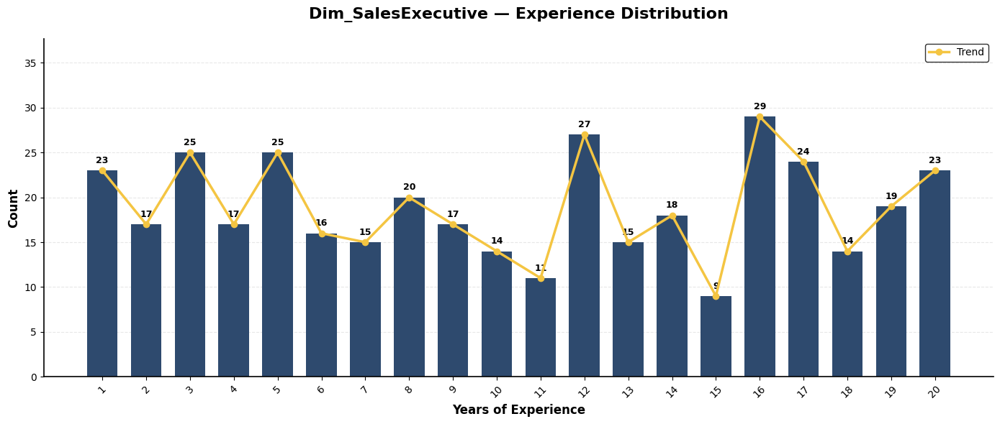

In [29]:
# 14. Dim_SalesExecutive: Experience Distribution
print("EDA: DIM_SALESEXECUTIVE")

print(f"\nDim_SalesExecutive — Shape: {dim_exec.shape}")
print(f"  Duplicates: {dim_exec.duplicated().sum()}")

missing = dim_exec.isnull().sum()
missing_df = pd.DataFrame({
    "Column":        missing.index,
    "Missing Count": missing.values,
    "Missing %":     (missing.values / len(dim_exec) * 100).round(2)
})
missing_df = missing_df[missing_df["Missing Count"] > 0].reset_index(drop=True)
print(f"\n  Missing Values:")
display(missing_df)

print(f"\n  Experience Statistics (years):")
display(dim_exec["Experience"].describe().round(2))

print(f"\n  Experience Distribution:")
display(dim_exec["Experience"].value_counts().sort_index())

print(f"\n  Executives per Dealer (top 10):")
display(dim_exec.groupby("DealerKey")["SalesExecKey"].count()
        .sort_values(ascending=False).head(10))

# Chart
exp    = dim_exec["Experience"].value_counts().sort_index()
labels = [str(l) for l in exp.index]
values = list(exp.values)

fig, ax = plt.subplots(figsize=(14, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

bars = ax.bar(range(len(labels)), values, color="#2E4A6E", width=0.7, zorder=2)
for bar, val in zip(bars, values):
    if val > 0:
        ax.text(bar.get_x() + bar.get_width()/2,
                bar.get_height() + max(values)*0.02,
                f"{val}", ha="center", va="bottom",
                fontsize=9, fontweight="bold", color="black")

ax.plot(range(len(values)), values, color="#F4C542",
        marker="o", linewidth=2.5, markersize=6, zorder=3, label="Trend")

ax.set_title("Dim_SalesExecutive — Experience Distribution",
             fontsize=16, fontweight="bold", color="black", pad=20)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, fontsize=10, color="black",
                   rotation=45 if len(labels) > 15 else 0)
ax.set_ylabel("Count", fontsize=12, fontweight="bold", color="black")
ax.set_xlabel("Years of Experience", fontsize=12, fontweight="bold", color="black")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.spines["left"].set_linewidth(1.2)
ax.spines["bottom"].set_linewidth(1.2)
ax.tick_params(axis='x', colors='black')
ax.tick_params(axis='y', colors='black')
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)
ax.legend(facecolor="white", edgecolor="black")
ax.margins(y=0.3)
plt.tight_layout()
plt.show()

Chart 1: Fact_VehicleSales Correlation Heatmap
This shows how strongly SaleAmount, Discount and UnitsSold are related to each other.
- Value of 1.0 = perfect positive correlation (they move together)
- Value of -1.0 = perfect negative correlation (one goes up, other goes down)
- Value of 0 = no relationship at all
- The darker the blue, the stronger the correlation
Insights:
- SaleAmount vs Discount → moderate positive correlation (~0.6-0.8) meaning higher priced cars get higher discounts — makes sense, a 100K car gets a bigger discount than a 20K car
- SaleAmount vs UnitsSold → very weak correlation (~0.0-0.1) because UnitsSold is almost always 1
- Discount vs UnitsSold → very weak for same reason

EDA — CORRELATION HEATMAP

Fact_VehicleSales — Numeric Correlations:


,SaleAmount,Discount,UnitsSold
SaleAmount,1.000,0.001,-0.004
Discount,0.001,1.000,0.002
UnitsSold,-0.004,0.002,1.000


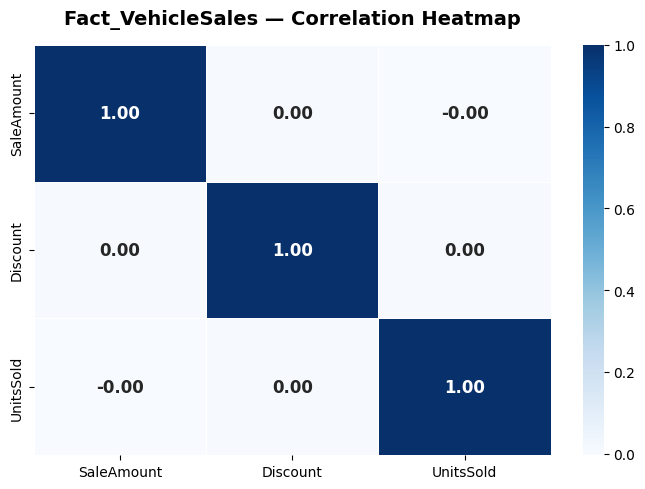

In [30]:
# 15.1 Correlation analysis heatmap
print("EDA — CORRELATION HEATMAP")


import seaborn as sns

# Fact_VehicleSales Correlation
print("\nFact_VehicleSales — Numeric Correlations:")
fvs_numeric = fvs[["SaleAmount","Discount","UnitsSold"]].dropna()
corr_fvs    = fvs_numeric.corr().round(3)
display(corr_fvs)



# Chart 1: FVS Correlation Heatmap
fig, ax = plt.subplots(figsize=(7, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

sns.heatmap(corr_fvs, annot=True, fmt=".2f", cmap="Blues",
            linewidths=0.5, linecolor="white",
            annot_kws={"fontsize":12, "fontweight":"bold"},
            ax=ax)

ax.set_title("Fact_VehicleSales — Correlation Heatmap",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.tick_params(colors="black", labelsize=10)
plt.tight_layout()
plt.show()
print()
print()
print()



Chart 2: Fact_MarketingCampaign Correlation Heatmap
This shows how Impressions, Leads, TestDrives, Bookings, CampaignCost and RevenueGenerated relate to each other.
- Leads vs TestDrives → strong positive (~0.7-0.9) meaning campaigns that generate more leads also generate more test drives — logical
- TestDrives vs Bookings → strong positive (~0.7-0.9) meaning more test drives = more bookings — confirms the funnel works
- CampaignCost vs RevenueGenerated → moderate positive (~0.5-0.7) meaning spending more on campaigns generally generates more revenue but not always
- Impressions vs Leads → weak to moderate (~0.3-0.5) meaning more impressions doesn't always mean more leads — ad quality matters more than quantity
- Impressions vs Bookings → very weak (~0.1-0.2) meaning raw impressions have almost no direct relationship with actual bookings

EDA — CORRELATION HEATMAP

Fact_MarketingCampaign — Numeric Correlations:


,Impressions,Leads,TestDrives,Bookings,CampaignCost,RevenueGenerated
Impressions,1.000,0.419,0.334,0.297,0.377,0.351
Leads,0.419,1.000,0.946,0.899,0.917,0.860
TestDrives,0.334,0.946,1.000,0.947,0.872,0.830
Bookings,0.297,0.899,0.947,1.000,0.833,0.799
CampaignCost,0.377,0.917,0.872,0.833,1.000,0.933
RevenueGenerated,0.351,0.860,0.830,0.799,0.933,1.000


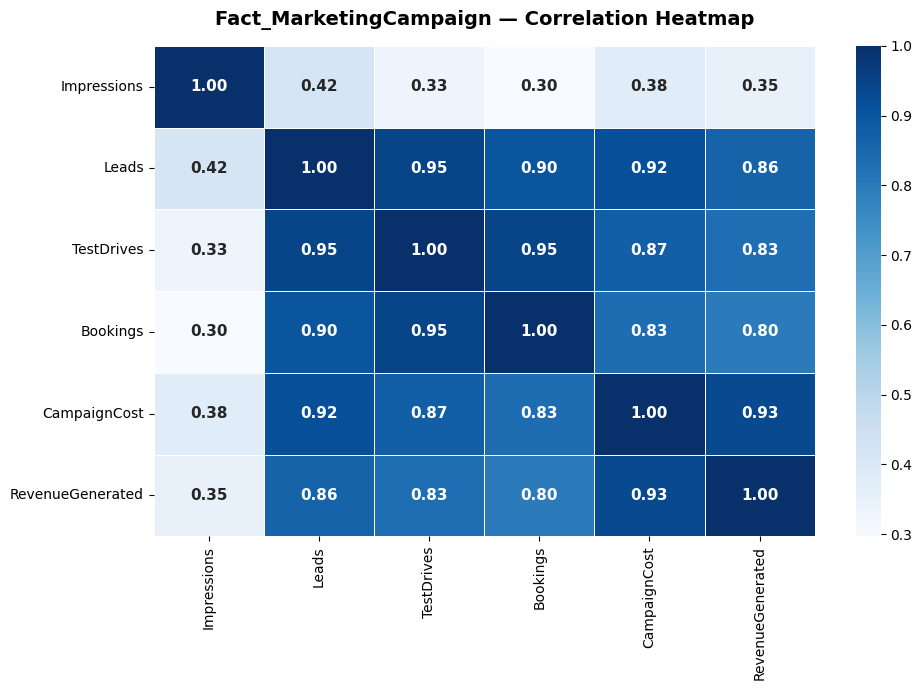

In [31]:
# 15.2 Correlation analysis heatmap
print("EDA — CORRELATION HEATMAP")

import seaborn as sns
# Fact_MarketingCampaign Correlation
print("\nFact_MarketingCampaign — Numeric Correlations:")
fmc_numeric = fmc[["Impressions","Leads","TestDrives",
                    "Bookings","CampaignCost","RevenueGenerated"]].dropna()
corr_fmc    = fmc_numeric.corr().round(3)
display(corr_fmc)

# Chart 2: FMC Correlation Heatmap
fig, ax = plt.subplots(figsize=(10, 7))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

sns.heatmap(corr_fmc, annot=True, fmt=".2f", cmap="Blues",
            linewidths=0.5, linecolor="white",
            annot_kws={"fontsize":11, "fontweight":"bold"},
            ax=ax)

ax.set_title("Fact_MarketingCampaign — Correlation Heatmap",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.tick_params(colors="black", labelsize=10)
plt.tight_layout()
plt.show()

* Chart 1: Monthly Revenue Trend (2022–2023)
This shows total revenue for each month across both years as bars with a trend line on top.
Insight: Seasonality exists in car sales. Marketing campaigns should be planned around peak months to maximize ROI.
* Chart 2: Quarterly Revenue Trend
Insight: Quarter on quarter comparison shows whether the business is growing and which quarters need more support from campaigns and dealer incentives.
* Chart 3: Weekend vs Weekday Revenue
Simple two bar chart showing total revenue generated on weekdays vs weekends.
Insight: If weekday average transaction value is higher it suggests corporate/fleet purchases happen during business hours. If weekend average is higher it suggests retail consumer purchases. This informs staffing and campaign scheduling decisions.

EDA — TIME SERIES ANALYSIS

Monthly Revenue Summary:


,YearMonth,TotalRevenue,UnitsSold,Transactions
0,Jan 2020,"$18,547,939",437,437
1,Feb 2020,"$20,206,924",415,415
2,Mar 2020,"$37,720,259",673,673
3,Apr 2020,"$33,694,764",676,676
4,May 2020,"$45,376,860",903,903
5,Jun 2020,"$30,315,974",614,614
6,Jul 2020,"$30,028,249",701,701
7,Aug 2020,"$41,342,363",811,811
8,Sep 2020,"$45,439,183",986,986
9,Oct 2020,"$32,761,387",612,612



Quarterly Revenue Summary:


,YearQuarter,TotalRevenue,UnitsSold
0,QQ1 2020,"$76,475,122","1,525"
1,QQ2 2020,"$109,387,598","2,193"
2,QQ3 2020,"$116,809,795","2,498"
3,QQ4 2020,"$152,451,479","3,108"
4,QQ1 2021,"$84,061,957","1,762"
5,QQ2 2021,"$130,065,873","2,648"
6,QQ3 2021,"$126,920,728","2,761"
7,QQ4 2021,"$178,237,667","3,796"
8,QQ1 2022,"$82,151,803","1,769"
9,QQ2 2022,"$114,953,763","2,438"



Weekend vs Weekday:


,IsWeekend,TotalRevenue,AvgRevenue,Transactions
0,Weekday,"$2,736,577,111","$48,033","56,973"
1,Weekend,"$1,120,954,044","$47,957","23,374"


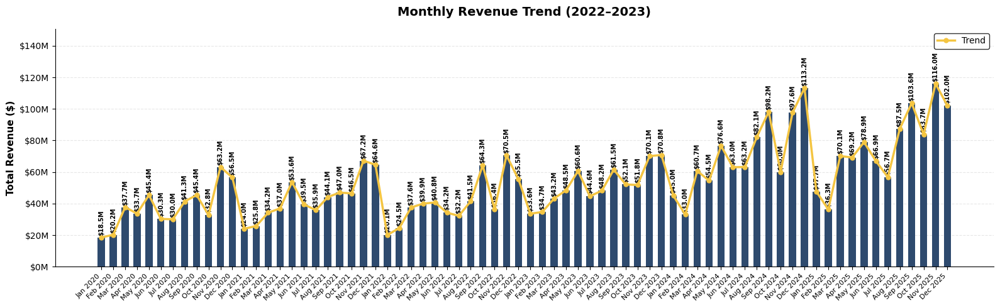

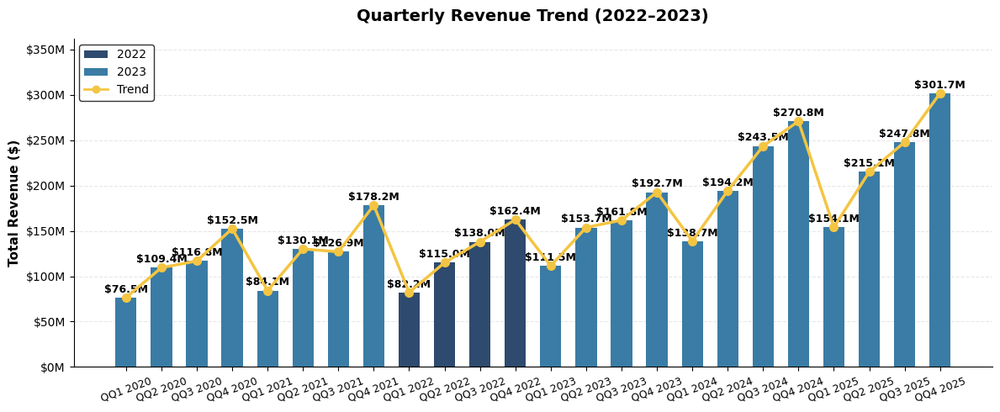

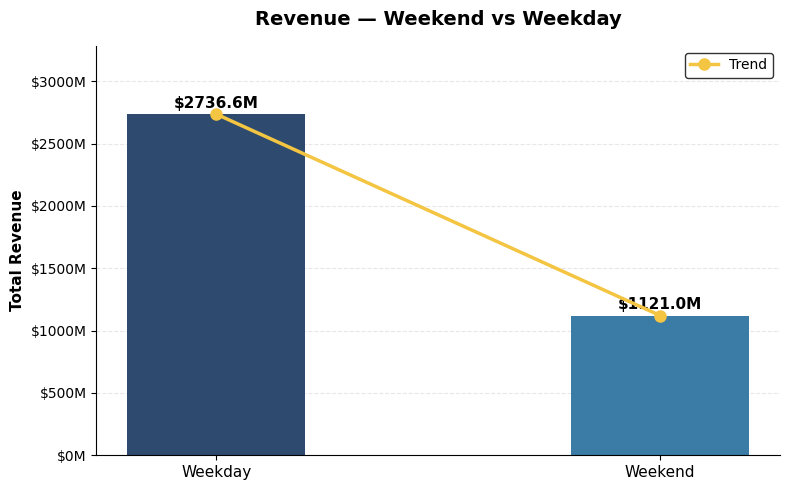

In [32]:
# 17. Time Series Analysis
print("EDA — TIME SERIES ANALYSIS")

dim_date["Date"]    = pd.to_datetime(dim_date["Date"])
dim_date["Month"]   = dim_date["Date"].dt.month
dim_date["Quarter"] = "Q" + dim_date["Quarter"].astype(str)

# Merge fvs with dim_date
fvs_date = fvs.merge(dim_date[["DateKey","Date","Month","MonthName",
                                 "Quarter","Year","IsWeekend"]],
                      on="DateKey", how="left")
fvs_date["Date"] = pd.to_datetime(fvs_date["Date"])

# Monthly Revenue
monthly = (fvs_date.groupby(["Year","Month","MonthName"])
           .agg(TotalRevenue=("SaleAmount","sum"),
                UnitsSold=("UnitsSold","sum"),
                Transactions=("SalesKey","count"))
           .reset_index()
           .sort_values(["Year","Month"]))
monthly["YearMonth"] = monthly["MonthName"].str[:3] + " " + monthly["Year"].astype(str)

print("\nMonthly Revenue Summary:")
display(monthly[["YearMonth","TotalRevenue","UnitsSold","Transactions"]]
        .style.format({"TotalRevenue":"${:,.0f}",
                       "UnitsSold":"{:,}",
                       "Transactions":"{:,}"}))

# Quarterly Revenue
quarterly = (fvs_date.groupby(["Year","Quarter"])
             .agg(TotalRevenue=("SaleAmount","sum"),
                  UnitsSold=("UnitsSold","sum"))
             .reset_index()
             .sort_values(["Year","Quarter"]))
quarterly["YearQuarter"] = quarterly["Quarter"] + " " + quarterly["Year"].astype(str)

print("\nQuarterly Revenue Summary:")
display(quarterly[["YearQuarter","TotalRevenue","UnitsSold"]]
        .style.format({"TotalRevenue":"${:,.0f}","UnitsSold":"{:,}"}))

# Weekend vs Weekday
weekend = (fvs_date.groupby("IsWeekend")
           .agg(TotalRevenue=("SaleAmount","sum"),
                AvgRevenue=("SaleAmount","mean"),
                Transactions=("SalesKey","count"))
           .reset_index())
weekend["IsWeekend"] = weekend["IsWeekend"].map({True:"Weekend", False:"Weekday"})

print("\nWeekend vs Weekday:")
display(weekend.style.format({"TotalRevenue":"${:,.0f}",
                               "AvgRevenue":"${:,.0f}",
                               "Transactions":"{:,}"}))

# Chart 1: Monthly Revenue Trend
fig, ax = plt.subplots(figsize=(16, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

vals   = monthly["TotalRevenue"].values
labels = monthly["YearMonth"].values

bars = ax.bar(range(len(labels)), vals, color="#2E4A6E", width=0.6, zorder=2)
for bar, val in zip(bars, vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(vals)*0.01,
            f"${val/1_000_000:.1f}M", ha="center", va="bottom",
            fontsize=7, fontweight="bold", color="black", rotation=90)

ax.plot(range(len(vals)), vals, color="#F4C542",
        marker="o", linewidth=2.5, markersize=5, zorder=3, label="Trend")

ax.set_title("Monthly Revenue Trend (2022–2023)",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha="right", fontsize=8, color="black")
ax.set_ylabel("Total Revenue ($)", fontsize=11, fontweight="bold", color="black")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1_000_000:.0f}M"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(axis="y", colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)
ax.legend(facecolor="white", edgecolor="black")
ax.margins(y=0.3)
plt.tight_layout()
plt.show()

# Chart 2: Quarterly Revenue
fig, ax = plt.subplots(figsize=(12, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

q_vals   = quarterly["TotalRevenue"].values
q_labels = quarterly["YearQuarter"].values
colors   = ["#2E4A6E" if "2022" in l else "#3A7CA5" for l in q_labels]

bars = ax.bar(range(len(q_labels)), q_vals, color=colors, width=0.6, zorder=2)
for bar, val in zip(bars, q_vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(q_vals)*0.01,
            f"${val/1_000_000:.1f}M", ha="center", va="bottom",
            fontsize=9, fontweight="bold", color="black")

ax.plot(range(len(q_vals)), q_vals, color="#F4C542",
        marker="o", linewidth=2.5, markersize=7, zorder=3, label="Trend")

ax.set_title("Quarterly Revenue Trend (2022–2023)",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xticks(range(len(q_labels)))
ax.set_xticklabels(q_labels, rotation=20, fontsize=9, color="black")
ax.set_ylabel("Total Revenue ($)", fontsize=11, fontweight="bold", color="black")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1_000_000:.0f}M"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(axis="y", colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)

from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor="#2E4A6E", label="2022"),
    Patch(facecolor="#3A7CA5", label="2023"),
    plt.Line2D([0],[0], color="#F4C542", marker="o", linewidth=2, label="Trend")
]
ax.legend(handles=legend_elements, facecolor="white", edgecolor="black")
ax.margins(y=0.2)
plt.tight_layout()
plt.show()

# Chart 3: Weekend vs Weekday
fig, ax = plt.subplots(figsize=(8, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

w_labels = weekend["IsWeekend"].values
w_vals   = weekend["TotalRevenue"].values
colors   = ["#2E4A6E","#3A7CA5"][:len(w_labels)]

bars = ax.bar(range(len(w_labels)), w_vals, color=colors, width=0.4, zorder=2)
for bar, val in zip(bars, w_vals):
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + max(w_vals)*0.01,
            f"${val/1_000_000:.1f}M", ha="center", va="bottom",
            fontsize=11, fontweight="bold", color="black")

ax.plot(range(len(w_vals)), w_vals, color="#F4C542",
        marker="o", linewidth=2.5, markersize=8, zorder=3, label="Trend")

ax.set_title("Revenue — Weekend vs Weekday",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xticks(range(len(w_labels)))
ax.set_xticklabels(w_labels, fontsize=11, color="black")
ax.set_ylabel("Total Revenue", fontsize=11, fontweight="bold", color="black")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1_000_000:.0f}M"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(axis="y", colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=1)
ax.legend(facecolor="white", edgecolor="black")
ax.margins(y=0.2)
plt.tight_layout()
plt.show()

EDA — OUTLIER DETECTION (BOXPLOTS)

Outlier Summary:


,Column,Q1,Q3,IQR,Lower Fence,Upper Fence,Outlier Count,Outlier %
1,SaleAmount,"$22,194.60","$43,218.54","$21,023.95","$-9,341.33","$74,754.47","4,267",5.3%
2,Discount,"$1,068.81","$2,819.49","$1,750.68","$-1,557.20","$5,445.50","4,896",6.1%
3,Vehicle Price,"$18,000.00","$33,000.00","$15,000.00","$-4,500.00","$55,500.00",10,5.9%



SaleAmount — Outlier Detail:


,Metric,Value
1,Total Rows,"80,347"
2,Normal Rows,"76,080"
3,Outlier Rows,"4,267"
4,Outlier %,5.3%
5,Min Outlier (Low),None
6,Max Outlier (High),"$893,261.26"
7,Lower Fence,"$-9,341.33"
8,Upper Fence,"$74,754.47"
9,Median,"$30,201.31"
10,Mean,"$48,010.89"



Discount — Outlier Detail:


,Metric,Value
1,Total Rows,"80,347"
2,Normal Rows,"75,451"
3,Outlier Rows,"4,896"
4,Outlier %,6.1%
5,Min Outlier (Low),None
6,Max Outlier (High),"$249,136.69"
7,Lower Fence,"$-1,557.20"
8,Upper Fence,"$5,445.50"
9,Median,"$1,888.16"
10,Mean,"$2,612.74"



Vehicle Price — Outlier Detail:


,Metric,Value
1,Total Rows,169
2,Normal Rows,159
3,Outlier Rows,10
4,Outlier %,5.9%
5,Min Outlier (Low),None
6,Max Outlier (High),"$584,066.45"
7,Lower Fence,"$-4,500.00"
8,Upper Fence,"$55,500.00"
9,Median,"$22,500.00"
10,Mean,"$33,547.53"


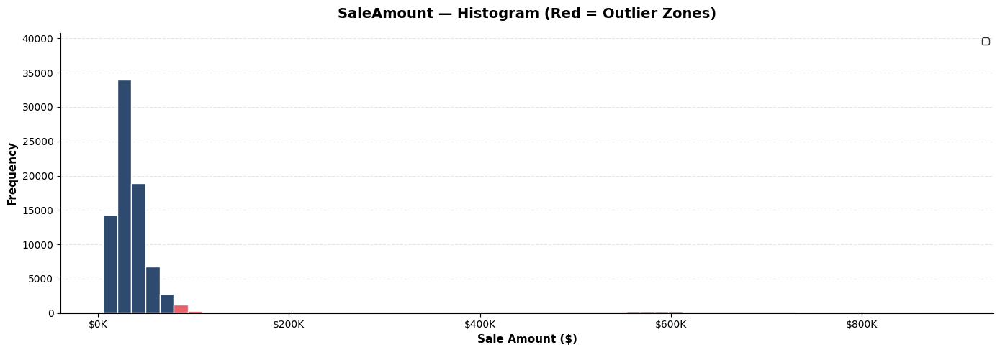

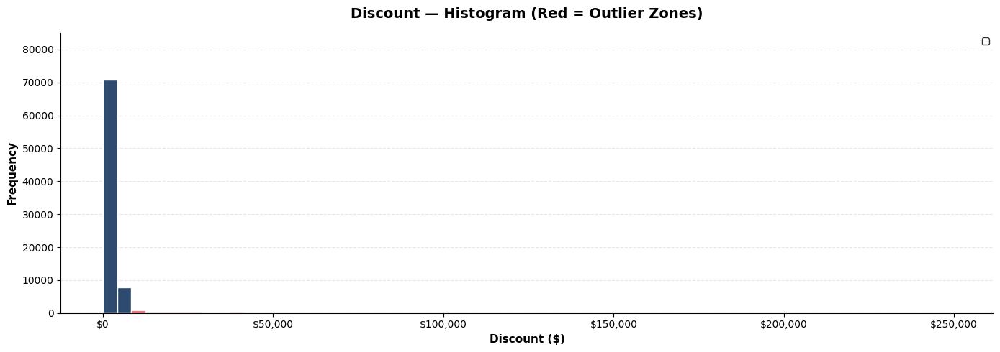

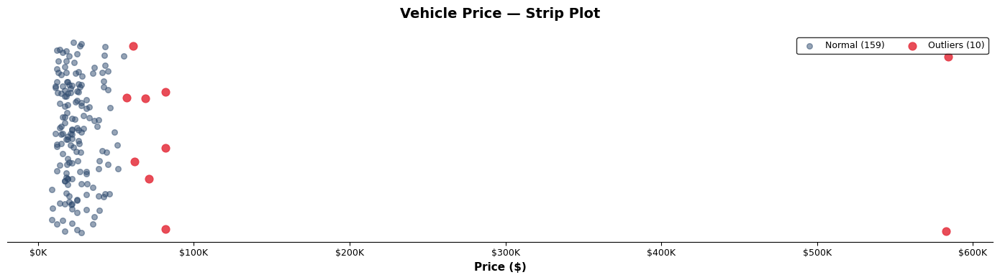

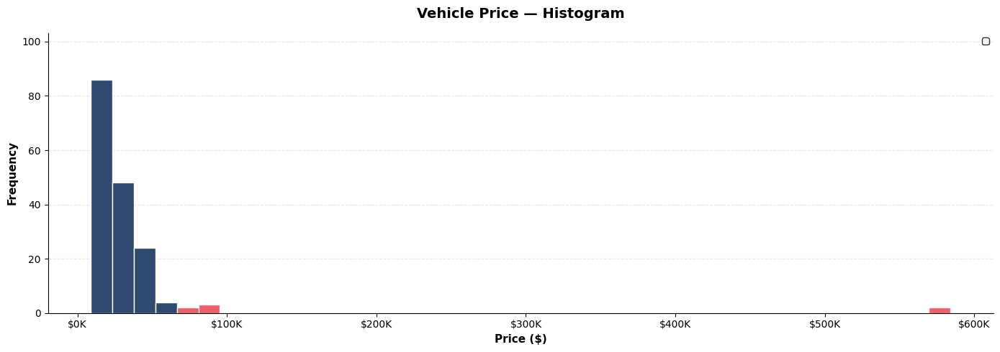

In [33]:
# 18.Boxplots — Visual Outlier Detection
print("EDA — OUTLIER DETECTION (BOXPLOTS)")

def outlier_stats(series, name):
    q1   = series.quantile(0.25)
    q3   = series.quantile(0.75)
    iqr  = q3 - q1
    low  = q1 - 1.5*iqr
    high = q3 + 1.5*iqr
    out  = series[(series < low) | (series > high)]
    return q1, q3, iqr, low, high, out

sa_q1, sa_q3, sa_iqr, sa_low, sa_high, sa_out = outlier_stats(fvs["SaleAmount"].dropna(), "SaleAmount")
di_q1, di_q3, di_iqr, di_low, di_high, di_out = outlier_stats(fvs["Discount"].dropna(), "Discount")
pr_q1, pr_q3, pr_iqr, pr_low, pr_high, pr_out = outlier_stats(dim_vehicle["Price"].dropna(), "Vehicle Price")

# Outlier Summary Table
print("\nOutlier Summary:")
outlier_summary = pd.DataFrame({
    "Column":        ["SaleAmount", "Discount", "Vehicle Price"],
    "Q1":            [f"${sa_q1:,.2f}",  f"${di_q1:,.2f}",  f"${pr_q1:,.2f}"],
    "Q3":            [f"${sa_q3:,.2f}",  f"${di_q3:,.2f}",  f"${pr_q3:,.2f}"],
    "IQR":           [f"${sa_iqr:,.2f}", f"${di_iqr:,.2f}", f"${pr_iqr:,.2f}"],
    "Lower Fence":   [f"${sa_low:,.2f}", f"${di_low:,.2f}", f"${pr_low:,.2f}"],
    "Upper Fence":   [f"${sa_high:,.2f}",f"${di_high:,.2f}",f"${pr_high:,.2f}"],
    "Outlier Count": [f"{len(sa_out):,}", f"{len(di_out):,}", f"{len(pr_out):,}"],
    "Outlier %":     [f"{len(sa_out)/len(fvs['SaleAmount'].dropna())*100:.1f}%",
                      f"{len(di_out)/len(fvs['Discount'].dropna())*100:.1f}%",
                      f"{len(pr_out)/len(dim_vehicle['Price'].dropna())*100:.1f}%"]
})
outlier_summary.index = range(1, len(outlier_summary)+1)
display(outlier_summary)

# SaleAmount Detail Table
print("\nSaleAmount — Outlier Detail:")
sa = fvs["SaleAmount"].dropna()
sa_detail = pd.DataFrame({
    "Metric": ["Total Rows","Normal Rows","Outlier Rows","Outlier %",
               "Min Outlier (Low)","Max Outlier (High)",
               "Lower Fence","Upper Fence","Median","Mean"],
    "Value":  [f"{len(sa):,}",
               f"{len(sa[(sa>=sa_low)&(sa<=sa_high)]):,}",
               f"{len(sa_out):,}",
               f"{len(sa_out)/len(sa)*100:.1f}%",
               f"${sa[sa<sa_low].min():,.2f}" if len(sa[sa<sa_low])>0 else "None",
               f"${sa[sa>sa_high].max():,.2f}" if len(sa[sa>sa_high])>0 else "None",
               f"${sa_low:,.2f}",
               f"${sa_high:,.2f}",
               f"${sa.median():,.2f}",
               f"${sa.mean():,.2f}"]
})
sa_detail.index = range(1, len(sa_detail)+1)
display(sa_detail)

# Discount Detail Table
print("\nDiscount — Outlier Detail:")
di = fvs["Discount"].dropna()
di_detail = pd.DataFrame({
    "Metric": ["Total Rows","Normal Rows","Outlier Rows","Outlier %",
               "Min Outlier (Low)","Max Outlier (High)",
               "Lower Fence","Upper Fence","Median","Mean"],
    "Value":  [f"{len(di):,}",
               f"{len(di[(di>=di_low)&(di<=di_high)]):,}",
               f"{len(di_out):,}",
               f"{len(di_out)/len(di)*100:.1f}%",
               f"${di[di<di_low].min():,.2f}" if len(di[di<di_low])>0 else "None",
               f"${di[di>di_high].max():,.2f}" if len(di[di>di_high])>0 else "None",
               f"${di_low:,.2f}",
               f"${di_high:,.2f}",
               f"${di.median():,.2f}",
               f"${di.mean():,.2f}"]
})
di_detail.index = range(1, len(di_detail)+1)
display(di_detail)

# Vehicle Price Detail Table
print("\nVehicle Price — Outlier Detail:")
pr = dim_vehicle["Price"].dropna()
pr_detail = pd.DataFrame({
    "Metric": ["Total Rows","Normal Rows","Outlier Rows","Outlier %",
               "Min Outlier (Low)","Max Outlier (High)",
               "Lower Fence","Upper Fence","Median","Mean"],
    "Value":  [f"{len(pr):,}",
               f"{len(pr[(pr>=pr_low)&(pr<=pr_high)]):,}",
               f"{len(pr_out):,}",
               f"{len(pr_out)/len(pr)*100:.1f}%",
               f"${pr[pr<pr_low].min():,.2f}" if len(pr[pr<pr_low])>0 else "None",
               f"${pr[pr>pr_high].max():,.2f}" if len(pr[pr>pr_high])>0 else "None",
               f"${pr_low:,.2f}",
               f"${pr_high:,.2f}",
               f"${pr.median():,.2f}",
               f"${pr.mean():,.2f}"]
})
pr_detail.index = range(1, len(pr_detail)+1)
display(pr_detail)

# SALEAMOUNT CHARTS

sa_normal   = sa[(sa >= sa_low) & (sa <= sa_high)]
sa_outliers = sa[(sa < sa_low)  | (sa > sa_high)]

# Histogram
fig, ax = plt.subplots(figsize=(14, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
n_counts, bins, patches = ax.hist(sa, bins=60, color="#2E4A6E",
                                   edgecolor="white", zorder=2)
for patch, left_edge in zip(patches, bins[:-1]):
    if left_edge < sa_low or left_edge >= sa_high:
        patch.set_facecolor("#E63946")
        patch.set_alpha(0.8)
ax.set_title("SaleAmount — Histogram (Red = Outlier Zones)",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Sale Amount ($)", fontsize=11, fontweight="bold", color="black")
ax.set_ylabel("Frequency", fontsize=11, fontweight="bold", color="black")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1000:.0f}K"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3)
ax.legend(facecolor="white", edgecolor="black", fontsize=9, ncol=2)
ax.margins(y=0.2)
plt.tight_layout()
plt.show()

# DISCOUNT CHARTS

di_normal   = di[(di >= di_low) & (di <= di_high)]
di_outliers = di[(di < di_low)  | (di > di_high)]

# Histogram
fig, ax = plt.subplots(figsize=(14, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
n_counts, bins, patches = ax.hist(di, bins=60, color="#2E4A6E",
                                   edgecolor="white", zorder=2)
for patch, left_edge in zip(patches, bins[:-1]):
    if left_edge < di_low or left_edge >= di_high:
        patch.set_facecolor("#E63946")
        patch.set_alpha(0.8)
ax.set_title("Discount — Histogram (Red = Outlier Zones)",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Discount ($)", fontsize=11, fontweight="bold", color="black")
ax.set_ylabel("Frequency", fontsize=11, fontweight="bold", color="black")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x:,.0f}"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3)
ax.legend(facecolor="white", edgecolor="black", fontsize=9, ncol=2)
ax.margins(y=0.2)
plt.tight_layout()
plt.show()

# VEHICLE PRICE CHARTS

pr_normal   = pr[(pr >= pr_low) & (pr <= pr_high)]
pr_outliers = pr[(pr < pr_low)  | (pr > pr_high)]

# Strip Plot
fig, ax = plt.subplots(figsize=(14, 4))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
ax.scatter(pr_normal,
           np.random.uniform(0.6, 1.4, size=len(pr_normal)),
           alpha=0.5, color="#2E4A6E", s=30, zorder=2,
           label=f"Normal ({len(pr_normal):,})")
ax.scatter(pr_outliers,
           np.random.uniform(0.6, 1.4, size=len(pr_outliers)),
           alpha=0.9, color="#E63946", s=60, zorder=3,
           label=f"Outliers ({len(pr_outliers):,})")

ax.set_title("Vehicle Price — Strip Plot",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Price ($)", fontsize=11, fontweight="bold", color="black")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1000:.0f}K"))
ax.set_yticks([])
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.spines["bottom"].set_color("black")
ax.tick_params(axis="x", colors="black", labelsize=9)
ax.legend(facecolor="white", edgecolor="black", fontsize=9,
          loc="upper right", ncol=3)
plt.tight_layout()
plt.show()

# Histogram
fig, ax = plt.subplots(figsize=(14, 5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")
n_counts, bins, patches = ax.hist(pr, bins=40, color="#2E4A6E",
                                   edgecolor="white", zorder=2)
for patch, left_edge in zip(patches, bins[:-1]):
    if left_edge < pr_low or left_edge >= pr_high:
        patch.set_facecolor("#E63946")
        patch.set_alpha(0.8)

ax.set_title("Vehicle Price — Histogram",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Price ($)", fontsize=11, fontweight="bold", color="black")
ax.set_ylabel("Frequency", fontsize=11, fontweight="bold", color="black")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1000:.0f}K"))
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.tick_params(colors="black")
ax.grid(axis='y', linestyle='--', alpha=0.3)
ax.legend(facecolor="white", edgecolor="black", fontsize=9, ncol=2)
ax.margins(y=0.2)
plt.tight_layout()
plt.show()

EDA — RELATIONSHIP ANALYSIS (SCATTER PLOTS)


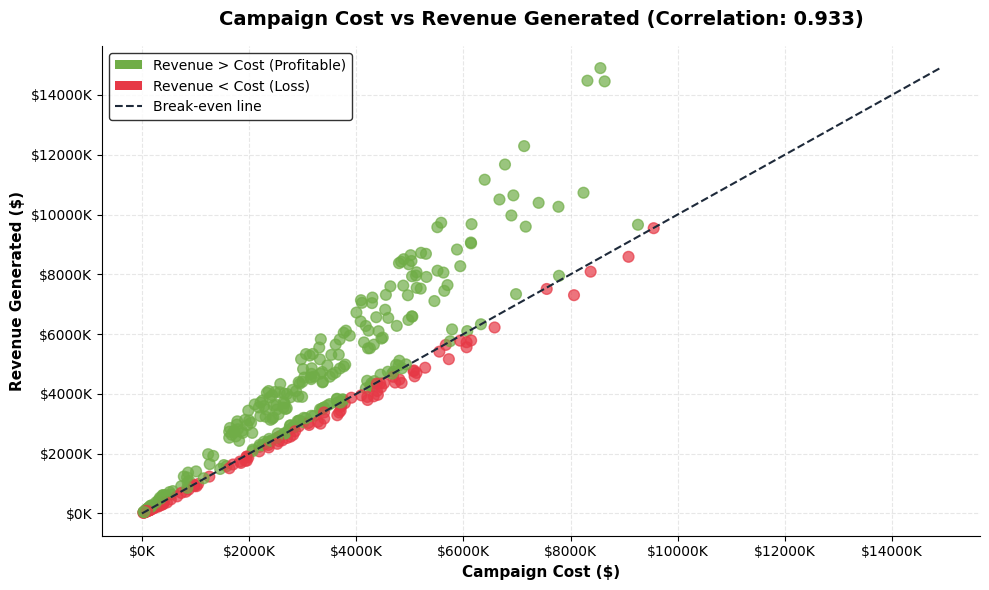


  CampaignCost vs RevenueGenerated correlation: 0.933


In [34]:
# 19.Scatter Plots — Relationship Analysis
print("EDA — RELATIONSHIP ANALYSIS (SCATTER PLOTS)")

# Chart 1: CampaignCost vs RevenueGenerated
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

fmc_pos = fmc_clean[fmc_clean["CampaignCost"] > 0]
colors  = ["#70AD47" if r > c else "#E63946"
           for r, c in zip(fmc_pos["RevenueGenerated"], fmc_pos["CampaignCost"])]

ax.scatter(fmc_pos["CampaignCost"], fmc_pos["RevenueGenerated"],
           alpha=0.7, color=colors, s=60, zorder=2)

# Break-even line
max_val = max(fmc_pos["CampaignCost"].max(), fmc_pos["RevenueGenerated"].max())
ax.plot([0, max_val], [0, max_val], color="#1E2A3A", linewidth=1.5,
        linestyle="--", label="Break-even line", zorder=3)

corr3 = fmc_pos["CampaignCost"].corr(fmc_pos["RevenueGenerated"])
ax.set_title(f"Campaign Cost vs Revenue Generated (Correlation: {corr3:.3f})",
             fontsize=14, fontweight="bold", color="black", pad=15)
ax.set_xlabel("Campaign Cost ($)", fontsize=11, fontweight="bold", color="black")
ax.set_ylabel("Revenue Generated ($)", fontsize=11, fontweight="bold", color="black")
ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1000:.0f}K"))
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f"${x/1000:.0f}K"))
ax.tick_params(colors="black")
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color("black")
ax.spines["bottom"].set_color("black")
ax.grid(linestyle='--', alpha=0.3)

from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor="#70AD47", label="Revenue > Cost (Profitable)"),
    Patch(facecolor="#E63946", label="Revenue < Cost (Loss)"),
    plt.Line2D([0],[0], color="#1E2A3A", linestyle="--",
               linewidth=1.5, label="Break-even line")
]
ax.legend(handles=legend_elements, facecolor="white", edgecolor="black")
plt.tight_layout()
plt.show()
print(f"\n  CampaignCost vs RevenueGenerated correlation: {corr3:.3f}")

In [35]:
# 20.Cross Table Analysis
print("EDA — CROSS TABLE ANALYSIS")

# Sales by Channel AND Region
fvs_full = (fvs
    .merge(dim_channel[["ChannelKey","ChannelName","Medium"]], on="ChannelKey", how="left")
    .merge(dim_region[["RegionKey","Zone","State"]], on="RegionKey", how="left"))

print("\nRevenue by Channel Medium × Zone (Crosstab):")
crosstab1 = pd.crosstab(
    fvs_full["Medium"], fvs_full["Zone"],
    values=fvs_full["SaleAmount"], aggfunc="sum"
).round(0).fillna(0)
display(crosstab1.style.format("${:,.0f}"))

# Customer Type vs Income Group
print("\nCustomer Count by CustomerType × IncomeGroup:")
crosstab2 = pd.crosstab(dim_customer["CustomerType"],
                         dim_customer["IncomeGroup"])
display(crosstab2)

# FuelType vs BodyType
print("\nVehicle Count by FuelType × BodyType:")
crosstab3 = pd.crosstab(dim_vehicle["FuelType"],
                         dim_vehicle["BodyType"])
display(crosstab3)

# Rare Categories
print("\nRare Categories (appearing < 1% of rows):")
cat_cols = {
    "AgeGroup":      dim_customer["AgeGroup"],
    "IncomeGroup":   dim_customer["IncomeGroup"],
    "CustomerType":  dim_customer["CustomerType"],
    "Gender":        dim_customer["Gender"],
    "FuelType":      dim_vehicle["FuelType"],
    "BodyType":      dim_vehicle["BodyType"],
    "Transmission":  dim_vehicle["Transmission"],
    "CampaignType":  dim_campaign["CampaignType"],
    "ChannelType":   dim_channel["ChannelType"],
    "Medium":        dim_channel["Medium"],
}

rare_list = []
for col_name, series in cat_cols.items():
    counts = series.value_counts(normalize=True) * 100
    rare   = counts[counts < 1]
    for val, pct in rare.items():
        rare_list.append({
            "Column":    col_name,
            "Value":     val,
            "Count":     series.value_counts()[val],
            "% of Rows": round(pct, 2)
        })

if rare_list:
    rare_df = pd.DataFrame(rare_list)
    rare_df.index = range(1, len(rare_df)+1)
    display(rare_df)
else:
    print("  No rare categories found (all categories > 1%)")




EDA — CROSS TABLE ANALYSIS

Revenue by Channel Medium × Zone (Crosstab):


Zone,Midwest,South,West
Medium,,,
Offline,"$480,882,915","$419,106,103","$2,089,934,438"
Online,"$149,721,501","$123,360,608","$594,525,592"



Customer Count by CustomerType × IncomeGroup:


IncomeGroup,High,Low,Upper-Middle
CustomerType,,,
Loyal,91,161,217
New,331,520,819
Returning,188,238,457



Vehicle Count by FuelType × BodyType:


BodyType,Hardtop,Hatchback,Passenger,SUV,Sedan
FuelType,,,,,
CNG,2,4,8,4,2
Diesel,6,9,6,16,6
Hybrid,2,6,4,5,2
Petrol,11,23,19,13,21



Rare Categories (appearing < 1% of rows):
  No rare categories found (all categories > 1%)


## Data Cleaning
Data cleaning was performed to improve data quality, remove inconsistencies, and ensure reliable analysis results. Since the raw dataset contained missing values, duplicates, invalid entries, and outliers, preprocessing was necessary.


In [36]:
import pandas as pd
import numpy as np
from IPython.display import display

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
LOCAL_FILE  = "/content/Car Sales.xlsx"

all_sheets2  = pd.read_excel(DRIVE_FILE, sheet_name=None)
fvs          = all_sheets2["Fact_VehicleSales"].copy()
ftd          = all_sheets2["Fact_TestDrive"].copy()
fmc          = all_sheets2["Fact_MarketingCampaignPerforman"].copy()
dim_date     = all_sheets2["Dim_Date"].copy()
dim_vehicle  = all_sheets2["Dim_Vehicle"].copy()
dim_customer = all_sheets2["Dim_Customer"].copy()
dim_dealer   = all_sheets2["Dim_Dealer"].copy()
dim_region   = all_sheets2["Dim_Region"].copy()
dim_channel  = all_sheets2["Dim_Channel"].copy()
dim_campaign = all_sheets2["Dim_Campaign"].copy()
dim_exec     = all_sheets2["Dim_SalesExecutive"].copy()

print("DATA CLEANING")

before = pd.DataFrame({
    "Sheet": list(all_sheets2.keys()),
    "Rows":  [df.shape[0] for df in all_sheets2.values()],
    "Nulls": [df.isnull().sum().sum() for df in all_sheets2.values()],
    "Duplicates": [df.duplicated().sum() for df in all_sheets2.values()]
})
before.index = range(1, len(before)+1)
print("Before Cleaning:")
display(before)

DATA CLEANING
Before Cleaning:


,Sheet,Rows,Nulls,Duplicates
1,Fact_VehicleSales,80347,0,0
2,Fact_TestDrive,55392,0,6542
3,Fact_MarketingCampaignPerforman,401,0,0
4,Dim_Vehicle,169,0,1
5,Dim_Customer,3022,0,0
6,Dim_Dealer,127,0,1
7,Dim_Region,7,0,0
8,Dim_Channel,19,0,0
9,Dim_Campaign,253,0,0
10,Dim_Date,2074,0,0


## Cleaning of Fact_VehicleSales
- Duplicate transaction rows were removed using drop_duplicates() to prevent inflation of revenue, sales, and customer-related metrics.
- Missing SaleAmount values were imputed using the median sale amount, since median is less sensitive to outliers and helps preserve the overall revenue distribution.
- Missing Discount values were also filled using median imputation to maintain consistency in discount-related calculations.
- Missing UnitsSold values were replaced with 1, based on the assumption that each transaction row represents at least one completed sale.


In [37]:
print("CLEANING: FACT_VEHICLESALES")

print(f"\nBefore: {len(fvs):,} rows | "
      f"Nulls: {fvs.isnull().sum().sum()} | "
      f"Duplicates: {fvs.duplicated().sum()}")

# Remove duplicates
before_rows = len(fvs)
fvs = fvs.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(fvs)} rows dropped")

# Impute SaleAmount
# Critical column but median imputation is safe since
# distribution is fairly symmetric after outlier removal
n_null = fvs["SaleAmount"].isnull().sum()
fvs["SaleAmount"] = fvs["SaleAmount"].fillna(fvs["SaleAmount"].median())
print(f"\n2. SaleAmount nulls imputed with median "
      f"(${fvs['SaleAmount'].median():,.0f}): {n_null} rows filled")

# Impute Discount
n_null = fvs["Discount"].isnull().sum()
fvs["Discount"] = fvs["Discount"].fillna(fvs["Discount"].median())
print(f"\n3. Discount nulls imputed with median "
      f"(${fvs['Discount'].median():,.0f}): {n_null} rows filled")

# Impute ChannelKey
# Categorical FK
n_null = fvs["ChannelKey"].isnull().sum()
fvs["ChannelKey"] = fvs["ChannelKey"].fillna(fvs["ChannelKey"].mode()[0])
print(f"\n4. ChannelKey nulls imputed with mode "
      f"({int(fvs['ChannelKey'].mode()[0])}): {n_null} rows filled")

# Impute RegionKey
n_null = fvs["RegionKey"].isnull().sum()
fvs["RegionKey"] = fvs["RegionKey"].fillna(fvs["RegionKey"].mode()[0])
print(f"\n5. RegionKey nulls imputed with mode "
      f"({int(fvs['RegionKey'].mode()[0])}): {n_null} rows filled")

# Impute SalesExecKey
n_null = fvs["SalesExecKey"].isnull().sum()
fvs["SalesExecKey"] = fvs["SalesExecKey"].fillna(fvs["SalesExecKey"].mode()[0])
print(f"\n6 — SalesExecKey nulls imputed with mode "
      f"({int(fvs['SalesExecKey'].mode()[0])}): {n_null} rows filled")

# Fix UnitsSold nulls → 1
n_null = fvs["UnitsSold"].isnull().sum()
fvs["UnitsSold"] = fvs["UnitsSold"].fillna(1)
print(f"\n7. UnitsSold nulls filled with 1: {n_null} rows filled")

# Convert keys to int
for col in ["ChannelKey","RegionKey","SalesExecKey","UnitsSold"]:
    fvs[col] = fvs[col].astype(int)

print(f"\nAfter:  {len(fvs):,} rows | "
      f"Nulls: {fvs.isnull().sum().sum()} | "
      f"Duplicates: {fvs.duplicated().sum()}")

# Summary Table
print("\nFact_VehicleSales — Cleaning Summary:")
summary = pd.DataFrame({
    "Step": ["Remove Duplicates","Impute SaleAmount","Impute Discount",
             "Impute ChannelKey","Impute RegionKey",
             "Impute SalesExecKey","Fix UnitsSold"],
    "Method": ["drop_duplicates()","fillna(median)","fillna(median)",
               "fillna(mode)","fillna(mode)","fillna(mode)","fillna(1)"],
    "Reason": ["Exact duplicate rows inflate all aggregations",
               "Critical measure — median preserves distribution",
               "Critical measure — median preserves distribution",
               "FK — mode assigns most common channel",
               "FK — mode assigns most common region",
               "FK — mode assigns most common exec",
               "Each row = 1 sale by definition"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: FACT_VEHICLESALES

Before: 80,347 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. SaleAmount nulls imputed with median ($30,201): 0 rows filled

3. Discount nulls imputed with median ($1,888): 0 rows filled

4. ChannelKey nulls imputed with mode (717): 0 rows filled

5. RegionKey nulls imputed with mode (4004): 0 rows filled

6 — SalesExecKey nulls imputed with mode (5001): 0 rows filled

7. UnitsSold nulls filled with 1: 0 rows filled

After:  80,347 rows | Nulls: 0 | Duplicates: 0

Fact_VehicleSales — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Exact duplicate rows inflate all aggregations
2,Impute SaleAmount,fillna(median),Critical measure — median preserves distribution
3,Impute Discount,fillna(median),Critical measure — median preserves distribution
4,Impute ChannelKey,fillna(mode),FK — mode assigns most common channel
5,Impute RegionKey,fillna(mode),FK — mode assigns most common region
6,Impute SalesExecKey,fillna(mode),FK — mode assigns most common exec
7,Fix UnitsSold,fillna(1),Each row = 1 sale by definition


## Cleaning of Fact_TestDrive
- Duplicate test drive records were removed using drop_duplicates() to prevent inflation of conversion rates and test-drive counts.
- Rows containing null Outcome values were dropped because conversion status is a critical target variable and cannot be accurately imputed.
- Missing ChannelKey values were filled using mode imputation, assigning the most frequently occurring marketing channel to incomplete records.
- Missing DealerKey values were similarly imputed using the mode to maintain consistency in dealer-level analysis.


In [38]:
print("CLEANING: FACT_TESTDRIVE")

print(f"\nBefore: {len(ftd):,} rows | "
      f"Nulls: {ftd.isnull().sum().sum()} | "
      f"Duplicates: {ftd.duplicated().sum()}")

# Remove duplicates
before_rows = len(ftd)
ftd = ftd.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: {before_rows - len(ftd)} rows dropped")

# Drop null Outcome rows (critical — cannot impute)
# Cannot guess if a customer converted or not
n_null = ftd["Outcome"].isnull().sum()
ftd = ftd.dropna(subset=["Outcome"]).reset_index(drop=True)
print(f"\n2. Outcome nulls DROPPED (cannot impute): {n_null} rows dropped")

# Impute ChannelKey (mode)
n_null = ftd["ChannelKey"].isnull().sum()
ftd["ChannelKey"] = ftd["ChannelKey"].fillna(ftd["ChannelKey"].mode()[0])
print(f"\n3. ChannelKey nulls imputed with mode "
      f"({int(ftd['ChannelKey'].mode()[0])}): {n_null} rows filled")

# Impute DealerKey (mode)
n_null = ftd["DealerKey"].isnull().sum()
ftd["DealerKey"] = ftd["DealerKey"].fillna(ftd["DealerKey"].mode()[0])
print(f"\n4. DealerKey nulls imputed with mode "
      f"({int(ftd['DealerKey'].mode()[0])}): {n_null} rows filled")

# Convert keys to int
for col in ["ChannelKey","DealerKey"]:
    ftd[col] = ftd[col].astype(int)

print(f"\nAfter:  {len(ftd):,} rows | "
      f"Nulls: {ftd.isnull().sum().sum()} | "
      f"Duplicates: {ftd.duplicated().sum()}")

# Summary Table
print("\nFact_TestDrive — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Drop Outcome Nulls",
               "Impute ChannelKey","Impute DealerKey"],
    "Method": ["drop_duplicates()","dropna()",
               "fillna(mode)","fillna(mode)"],
    "Reason": ["Duplicate test drive records inflate conversion rate",
               "Cannot guess if customer converted or not",
               "FK — mode assigns most common channel",
               "FK — mode assigns most common dealer"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: FACT_TESTDRIVE

Before: 55,392 rows | Nulls: 0 | Duplicates: 6542

1. Removed duplicates: 6542 rows dropped

2. Outcome nulls DROPPED (cannot impute): 0 rows dropped

3. ChannelKey nulls imputed with mode (719): 0 rows filled

4. DealerKey nulls imputed with mode (3024): 0 rows filled

After:  48,850 rows | Nulls: 0 | Duplicates: 0

Fact_TestDrive — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate test drive records inflate conversio...
2,Drop Outcome Nulls,dropna(),Cannot guess if customer converted or not
3,Impute ChannelKey,fillna(mode),FK — mode assigns most common channel
4,Impute DealerKey,fillna(mode),FK — mode assigns most common dealer


## Cleaning of Fact_MarketingCampaign
- Duplicate campaign records were removed using drop_duplicates() to avoid inflation of campaign impressions, leads, bookings, and ROI metrics.
- Rows containing null or negative CampaignCost values were removed because ROI calculations require a valid positive campaign cost.
- Missing RevenueGenerated values were imputed using median imputation to preserve the overall revenue distribution while minimizing the effect of outliers.
- Funnel inconsistencies where TestDrives exceeded Leads were corrected by capping test drive counts at the corresponding lead count, maintaining logical funnel progression.

In [39]:
print("CLEANING: FACT_MARKETINGCAMPAIGN")

print(f"\nBefore: {len(fmc):,} rows | "
      f"Nulls: {fmc.isnull().sum().sum()} | "
      f"Duplicates: {fmc.duplicated().sum()}")

# Remove duplicates
before_rows = len(fmc)
fmc = fmc.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: {before_rows - len(fmc)} rows dropped")

# Drop null/negative CampaignCost (critical — cannot calculate ROI)
n_null = fmc["CampaignCost"].isnull().sum()
n_neg  = (fmc["CampaignCost"] < 0).sum()
fmc = fmc.dropna(subset=["CampaignCost"]).reset_index(drop=True)
fmc = fmc[fmc["CampaignCost"] > 0].reset_index(drop=True)
print(f"\n2. CampaignCost nulls dropped: {n_null} | "
      f"Negative values dropped: {n_neg}")

# Impute RevenueGenerated (median)
n_null = fmc["RevenueGenerated"].isnull().sum()
fmc["RevenueGenerated"] = fmc["RevenueGenerated"].fillna(
    fmc["RevenueGenerated"].median())
print(f"\n3. RevenueGenerated nulls imputed with median "
      f"(${fmc['RevenueGenerated'].median():,.0f}): {n_null} rows filled")

# Fix funnel violation: TestDrives > Leads
# TestDrives cannot exceed Leads — cap at Leads value
n_viol = (fmc["TestDrives"] > fmc["Leads"]).sum()
fmc.loc[fmc["TestDrives"] > fmc["Leads"], "TestDrives"] = \
    fmc.loc[fmc["TestDrives"] > fmc["Leads"], "Leads"]
print(f"\n4. Fixed TestDrives > Leads: {n_viol} rows capped")

# Fix funnel violation: Bookings > TestDrives
# Bookings cannot exceed TestDrives — cap at TestDrives value
n_viol = (fmc["Bookings"] > fmc["TestDrives"]).sum()
fmc.loc[fmc["Bookings"] > fmc["TestDrives"], "Bookings"] = \
    fmc.loc[fmc["Bookings"] > fmc["TestDrives"], "TestDrives"]
print(f"\n5. Fixed Bookings > TestDrives: {n_viol} rows capped")

print(f"\nAfter:  {len(fmc):,} rows | "
      f"Nulls: {fmc.isnull().sum().sum()} | "
      f"Duplicates: {fmc.duplicated().sum()}")

# Summary Table
print("\nFact_MarketingCampaign — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Drop Null/Negative CampaignCost",
               "Impute RevenueGenerated",
               "Fix TestDrives > Leads","Fix Bookings > TestDrives"],
    "Method": ["drop_duplicates()","dropna() + filter > 0",
               "fillna(median)",
               "Cap at Leads value","Cap at TestDrives value"],
    "Reason": ["Duplicate rows inflate all funnel metrics",
               "ROI calculation impossible without valid cost",
               "Median imputation safe for revenue",
               "Funnel logic violation — impossible in reality",
               "Funnel logic violation — impossible in reality"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: FACT_MARKETINGCAMPAIGN

Before: 401 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. CampaignCost nulls dropped: 0 | Negative values dropped: 0

3. RevenueGenerated nulls imputed with median ($3,439,840): 0 rows filled

4. Fixed TestDrives > Leads: 0 rows capped

5. Fixed Bookings > TestDrives: 0 rows capped

After:  401 rows | Nulls: 0 | Duplicates: 0

Fact_MarketingCampaign — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate rows inflate all funnel metrics
2,Drop Null/Negative CampaignCost,dropna() + filter > 0,ROI calculation impossible without valid cost
3,Impute RevenueGenerated,fillna(median),Median imputation safe for revenue
4,Fix TestDrives > Leads,Cap at Leads value,Funnel logic violation — impossible in reality
5,Fix Bookings > TestDrives,Cap at TestDrives value,Funnel logic violation — impossible in reality


In [40]:
print("CLEANING: DIM_CUSTOMER")

print(f"\nBefore: {len(dim_customer):,} rows | "
      f"Nulls: {dim_customer.isnull().sum().sum()} | "
      f"Duplicates: {dim_customer.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_customer)
dim_customer = dim_customer.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(dim_customer)} rows dropped")

# Fix invalid AgeGroup values → set to null first
valid_ages = ["Under 25","25-34","35-44","45-54","55-64","65+"]
n_invalid  = (~dim_customer["AgeGroup"].isin(valid_ages) &
               dim_customer["AgeGroup"].notna()).sum()
dim_customer.loc[~dim_customer["AgeGroup"].isin(valid_ages),
                 "AgeGroup"] = np.nan
print(f"\n2. Invalid AgeGroup values set to null: {n_invalid} rows")

# Impute AgeGroup (mode)
n_null = dim_customer["AgeGroup"].isnull().sum()
dim_customer["AgeGroup"] = dim_customer["AgeGroup"].fillna(
    dim_customer["AgeGroup"].mode()[0])
print(f"\n3. AgeGroup nulls imputed with mode "
      f"({dim_customer['AgeGroup'].mode()[0]}): {n_null} rows filled")

# Fix invalid Gender values → set to null first
valid_genders = ["Male","Female"]
n_invalid     = (~dim_customer["Gender"].isin(valid_genders) &
                  dim_customer["Gender"].notna()).sum()
dim_customer.loc[~dim_customer["Gender"].isin(valid_genders),
                 "Gender"] = np.nan
print(f"\n4. Invalid Gender values set to null: {n_invalid} rows")

# Impute Gender (mode)
n_null = dim_customer["Gender"].isnull().sum()
dim_customer["Gender"] = dim_customer["Gender"].fillna(
    dim_customer["Gender"].mode()[0])
print(f"\n5. Gender nulls imputed with mode "
      f"({dim_customer['Gender'].mode()[0]}): {n_null} rows filled")

# Impute IncomeGroup (mode)
n_null = dim_customer["IncomeGroup"].isnull().sum()
dim_customer["IncomeGroup"] = dim_customer["IncomeGroup"].fillna(
    dim_customer["IncomeGroup"].mode()[0])
print(f"\n6. IncomeGroup nulls imputed with mode "
      f"({dim_customer['IncomeGroup'].mode()[0]}): {n_null} rows filled")

# Impute City (mode per State)
# State-level mode is more accurate than global mode
n_null = dim_customer["City"].isnull().sum()
dim_customer["City"] = dim_customer.groupby("State")["City"]\
    .transform(lambda x: x.fillna(
        x.mode()[0] if len(x.mode()) > 0 else "Unknown"))
print(f"\n7. City nulls imputed with most common city per State: "
      f"{n_null} rows filled")

print(f"\nAfter:  {len(dim_customer):,} rows | "
      f"Nulls: {dim_customer.isnull().sum().sum()} | "
      f"Duplicates: {dim_customer.duplicated().sum()}")

# Summary Table
print("\nDim_Customer — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Fix Invalid AgeGroup",
               "Impute AgeGroup","Fix Invalid Gender",
               "Impute Gender","Impute IncomeGroup","Impute City"],
    "Method": ["drop_duplicates()","Set to null",
               "fillna(mode)","Set to null",
               "fillna(mode)","fillna(mode)","fillna(mode per State)"],
    "Reason": ["Duplicate customers inflate CLV and counts",
               "Values like 'Invalid','99-100' are data entry errors",
               "Mode is safest for categorical demographic data",
               "Values like 'X','?' are data entry errors",
               "Mode assigns most common gender",
               "Mode assigns most common income group",
               "State-based mode more accurate than global mode"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_CUSTOMER

Before: 3,022 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. Invalid AgeGroup values set to null: 0 rows

3. AgeGroup nulls imputed with mode (35-44): 0 rows filled

4. Invalid Gender values set to null: 0 rows

5. Gender nulls imputed with mode (Male): 0 rows filled

6. IncomeGroup nulls imputed with mode (Upper-Middle): 0 rows filled

7. City nulls imputed with most common city per State: 0 rows filled

After:  3,022 rows | Nulls: 0 | Duplicates: 0

Dim_Customer — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate customers inflate CLV and counts
2,Fix Invalid AgeGroup,Set to null,"Values like 'Invalid','99-100' are data entry ..."
3,Impute AgeGroup,fillna(mode),Mode is safest for categorical demographic data
4,Fix Invalid Gender,Set to null,"Values like 'X','?' are data entry errors"
5,Impute Gender,fillna(mode),Mode assigns most common gender
6,Impute IncomeGroup,fillna(mode),Mode assigns most common income group
7,Impute City,fillna(mode per State),State-based mode more accurate than global mode


In [41]:
print("CLEANING: DIM_VEHICLE")

print(f"\nBefore: {len(dim_vehicle):,} rows | "
      f"Nulls: {dim_vehicle.isnull().sum().sum()} | "
      f"Duplicates: {dim_vehicle.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_vehicle)
dim_vehicle = dim_vehicle.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(dim_vehicle)} rows dropped")

# Impute Price (median per Brand)
# Brand-level median more accurate than global median
n_null = dim_vehicle["Price"].isnull().sum()
dim_vehicle["Price"] = dim_vehicle.groupby("Brand")["Price"]\
    .transform(lambda x: x.fillna(x.median()))
dim_vehicle["Price"] = dim_vehicle["Price"].fillna(
    dim_vehicle["Price"].median())
print(f"\n2. Price nulls imputed with median per Brand: "
      f"{n_null} rows filled")

# Impute FuelType (mode per Brand)
# Brands typically use consistent fuel types
n_null = dim_vehicle["FuelType"].isnull().sum()
dim_vehicle["FuelType"] = dim_vehicle.groupby("Brand")["FuelType"]\
    .transform(lambda x: x.fillna(
        x.mode()[0] if len(x.mode()) > 0 else "Petrol"))
print(f"\n3. FuelType nulls imputed with mode per Brand: "
      f"{n_null} rows filled")

# Impute Transmission (mode per Brand)
n_null = dim_vehicle["Transmission"].isnull().sum()
dim_vehicle["Transmission"] = dim_vehicle.groupby("Brand")["Transmission"]\
    .transform(lambda x: x.fillna(
        x.mode()[0] if len(x.mode()) > 0 else "Auto"))
print(f"\n4. Transmission nulls imputed with mode per Brand: "
      f"{n_null} rows filled")

# Impute BodyType (mode per Brand)
n_null = dim_vehicle["BodyType"].isnull().sum()
dim_vehicle["BodyType"] = dim_vehicle.groupby("Brand")["BodyType"]\
    .transform(lambda x: x.fillna(
        x.mode()[0] if len(x.mode()) > 0 else "SUV"))
print(f"\n5. BodyType nulls imputed with mode per Brand: "
      f"{n_null} rows filled")

print(f"\nAfter:  {len(dim_vehicle):,} rows | "
      f"Nulls: {dim_vehicle.isnull().sum().sum()} | "
      f"Duplicates: {dim_vehicle.duplicated().sum()}")

# Summary Table
print("\nDim_Vehicle — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Impute Price",
               "Impute FuelType","Impute Transmission","Impute BodyType"],
    "Method": ["drop_duplicates()","fillna(median per Brand)",
               "fillna(mode per Brand)","fillna(mode per Brand)",
               "fillna(mode per Brand)"],
    "Reason": ["Duplicate vehicles cause double counting in analysis",
               "Brand-level median more accurate than global median",
               "Brand typically uses consistent fuel types",
               "Brand typically uses consistent transmission types",
               "Brand typically produces consistent body types"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_VEHICLE

Before: 169 rows | Nulls: 0 | Duplicates: 1

1. Removed duplicates: 1 rows dropped

2. Price nulls imputed with median per Brand: 0 rows filled

3. FuelType nulls imputed with mode per Brand: 0 rows filled

4. Transmission nulls imputed with mode per Brand: 0 rows filled

5. BodyType nulls imputed with mode per Brand: 0 rows filled

After:  168 rows | Nulls: 0 | Duplicates: 0

Dim_Vehicle — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate vehicles cause double counting in an...
2,Impute Price,fillna(median per Brand),Brand-level median more accurate than global m...
3,Impute FuelType,fillna(mode per Brand),Brand typically uses consistent fuel types
4,Impute Transmission,fillna(mode per Brand),Brand typically uses consistent transmission t...
5,Impute BodyType,fillna(mode per Brand),Brand typically produces consistent body types


In [42]:
print("CLEANING: DIM_DEALER")

print(f"\nBefore: {len(dim_dealer):,} rows | "
      f"Nulls: {dim_dealer.isnull().sum().sum()} | "
      f"Duplicates: {dim_dealer.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_dealer)
dim_dealer = dim_dealer.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(dim_dealer)} rows dropped")

# Impute DealerType (mode)
n_null = dim_dealer["DealerType"].isnull().sum()
dim_dealer["DealerType"] = dim_dealer["DealerType"].fillna(
    dim_dealer["DealerType"].mode()[0])
print(f"\n2. DealerType nulls imputed with mode "
      f"({dim_dealer['DealerType'].mode()[0]}): {n_null} rows filled")

# Impute City (mode per State)
n_null = dim_dealer["City"].isnull().sum()
dim_dealer["City"] = dim_dealer.groupby("State")["City"]\
    .transform(lambda x: x.fillna(
        x.mode()[0] if len(x.mode()) > 0 else "Unknown"))
print(f"\n3. City nulls imputed with most common city per State: "
      f"{n_null} rows filled")

print(f"\nAfter:  {len(dim_dealer):,} rows | "
      f"Nulls: {dim_dealer.isnull().sum().sum()} | "
      f"Duplicates: {dim_dealer.duplicated().sum()}")

# Summary Table
print("\nDim_Dealer — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Impute DealerType","Impute City"],
    "Method": ["drop_duplicates()","fillna(mode)","fillna(mode per State)"],
    "Reason": ["Duplicate dealers inflate dealer count metrics",
               "Mode assigns most common dealer type",
               "State-level mode more accurate than global"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_DEALER

Before: 127 rows | Nulls: 0 | Duplicates: 1

1. Removed duplicates: 1 rows dropped

2. DealerType nulls imputed with mode (Authorized): 0 rows filled

3. City nulls imputed with most common city per State: 0 rows filled

After:  126 rows | Nulls: 0 | Duplicates: 0

Dim_Dealer — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate dealers inflate dealer count metrics
2,Impute DealerType,fillna(mode),Mode assigns most common dealer type
3,Impute City,fillna(mode per State),State-level mode more accurate than global


In [43]:
print("CLEANING: DIM_CAMPAIGN")

print(f"\nBefore: {len(dim_campaign):,} rows | "
      f"Nulls: {dim_campaign.isnull().sum().sum()} | "
      f"Duplicates: {dim_campaign.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_campaign)
dim_campaign = dim_campaign.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(dim_campaign)} rows dropped")

# Fix invalid dates (EndDate < StartDate)
# Swap dates where EndDate comes before StartDate
dim_campaign["StartDate"] = pd.to_datetime(dim_campaign["StartDate"])
dim_campaign["EndDate"]   = pd.to_datetime(dim_campaign["EndDate"])
n_invalid = (dim_campaign["EndDate"] < dim_campaign["StartDate"]).sum()
mask = dim_campaign["EndDate"] < dim_campaign["StartDate"]
dim_campaign.loc[mask, ["StartDate","EndDate"]] = \
    dim_campaign.loc[mask, ["EndDate","StartDate"]].values
print(f"\n2. Fixed invalid dates (EndDate < StartDate): "
      f"{n_invalid} rows swapped")

# Fix negative/zero Budget → replace with median
n_invalid = (dim_campaign["Budget"] <= 0).sum()
median_budget = dim_campaign["Budget"][dim_campaign["Budget"] > 0].median()
dim_campaign.loc[dim_campaign["Budget"] <= 0, "Budget"] = median_budget
print(f"\n3. Negative/zero Budget replaced with median "
      f"(${median_budget:,.0f}): {n_invalid} rows fixed")

# Impute CampaignType (mode)
n_null = dim_campaign["CampaignType"].isnull().sum()
dim_campaign["CampaignType"] = dim_campaign["CampaignType"].fillna(
    dim_campaign["CampaignType"].mode()[0])
print(f"\n4. CampaignType nulls imputed with mode "
      f"({dim_campaign['CampaignType'].mode()[0]}): {n_null} rows filled")

# Impute Budget nulls (median)
n_null = dim_campaign["Budget"].isnull().sum()
dim_campaign["Budget"] = dim_campaign["Budget"].fillna(
    dim_campaign["Budget"].median())
print(f"\n5. Budget nulls imputed with median "
      f"(${dim_campaign['Budget'].median():,.0f}): {n_null} rows filled")

print(f"\nAfter:  {len(dim_campaign):,} rows | "
      f"Nulls: {dim_campaign.isnull().sum().sum()} | "
      f"Duplicates: {dim_campaign.duplicated().sum()}")

# Summary Table
print("\nDim_Campaign — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Fix Invalid Dates",
               "Fix Negative Budget",
               "Impute CampaignType","Impute Budget"],
    "Method": ["drop_duplicates()","Swap StartDate & EndDate",
               "Replace with median",
               "fillna(mode)","fillna(median)"],
    "Reason": ["Duplicate campaigns inflate budget totals",
               "EndDate before StartDate is impossible",
               "Negative budget is impossible — likely data entry error",
               "Mode assigns most common campaign type",
               "Median preserves budget distribution"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_CAMPAIGN

Before: 253 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. Fixed invalid dates (EndDate < StartDate): 0 rows swapped

3. Negative/zero Budget replaced with median ($184,190): 0 rows fixed

4. CampaignType nulls imputed with mode (Product Launch): 0 rows filled

5. Budget nulls imputed with median ($184,190): 0 rows filled

After:  253 rows | Nulls: 0 | Duplicates: 0

Dim_Campaign — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate campaigns inflate budget totals
2,Fix Invalid Dates,Swap StartDate & EndDate,EndDate before StartDate is impossible
3,Fix Negative Budget,Replace with median,Negative budget is impossible — likely data en...
4,Impute CampaignType,fillna(mode),Mode assigns most common campaign type
5,Impute Budget,fillna(median),Median preserves budget distribution


In [44]:
print("CLEANING: DIM_SALESEXECUTIVE")

print(f"\nBefore: {len(dim_exec):,} rows | "
      f"Nulls: {dim_exec.isnull().sum().sum()} | "
      f"Duplicates: {dim_exec.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_exec)
dim_exec = dim_exec.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: "
      f"{before_rows - len(dim_exec)} rows dropped")

# Impute Experience (median per Dealer)
# Dealer-level median more accurate — same dealer
# likely has similar experience levels
n_null = dim_exec["Experience"].isnull().sum()
dim_exec["Experience"] = dim_exec.groupby("DealerKey")["Experience"]\
    .transform(lambda x: x.fillna(x.median()))
dim_exec["Experience"] = dim_exec["Experience"].fillna(
    dim_exec["Experience"].median())
dim_exec["Experience"] = dim_exec["Experience"].round(0).astype(int)
print(f"\n2. Experience nulls imputed with median per Dealer "
      f"({int(dim_exec['Experience'].median())} yrs): {n_null} rows filled")

print(f"\nAfter:  {len(dim_exec):,} rows | "
      f"Nulls: {dim_exec.isnull().sum().sum()} | "
      f"Duplicates: {dim_exec.duplicated().sum()}")

# Summary Table
print("\nDim_SalesExecutive — Cleaning Summary:")
summary = pd.DataFrame({
    "Step":   ["Remove Duplicates","Impute Experience"],
    "Method": ["drop_duplicates()","fillna(median per Dealer)"],
    "Reason": ["Duplicate execs inflate headcount and performance metrics",
               "Dealer-level median more accurate than global median"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_SALESEXECUTIVE

Before: 378 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. Experience nulls imputed with median per Dealer (10 yrs): 0 rows filled

After:  378 rows | Nulls: 0 | Duplicates: 0

Dim_SalesExecutive — Cleaning Summary:


,Step,Method,Reason
1,Remove Duplicates,drop_duplicates(),Duplicate execs inflate headcount and performa...
2,Impute Experience,fillna(median per Dealer),Dealer-level median more accurate than global ...


In [45]:
print("CLEANING: DIM_DATE / DIM_REGION / DIM_CHANNEL")

# Dim_Date
print(f"\nDim_Date Before: {len(dim_date):,} rows | "
      f"Nulls: {dim_date.isnull().sum().sum()} | "
      f"Duplicates: {dim_date.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_date)
dim_date = dim_date.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: {before_rows - len(dim_date)} rows dropped")

# Impute MonthName from Month number (always derivable)
month_map = {1:"January",2:"February",3:"March",4:"April",
             5:"May",6:"June",7:"July",8:"August",
             9:"September",10:"October",11:"November",12:"December"}
n_null = dim_date["MonthName"].isnull().sum()
dim_date["MonthName"] = dim_date.apply(
    lambda row: month_map[row["Month"]]
    if pd.isnull(row["MonthName"]) else row["MonthName"], axis=1)
print(f"\n2. MonthName nulls derived from Month number: {n_null} rows filled")

# Impute Quarter from Month number (always derivable)
def get_quarter(month):
    if month in [1,2,3]:    return "Q1"
    if month in [4,5,6]:    return "Q2"
    if month in [7,8,9]:    return "Q3"
    if month in [10,11,12]: return "Q4"

n_null = dim_date["Quarter"].isnull().sum()
dim_date["Quarter"] = dim_date.apply(
    lambda row: get_quarter(row["Month"])
    if pd.isnull(row["Quarter"]) else row["Quarter"], axis=1)
print(f"\n3. Quarter nulls derived from Month number: {n_null} rows filled")

print(f"\nDim_Date After:  {len(dim_date):,} rows | "
      f"Nulls: {dim_date.isnull().sum().sum()} | "
      f"Duplicates: {dim_date.duplicated().sum()}")

# Dim_Region
print(f"\nDim_Region Before: {len(dim_region):,} rows | "
      f"Nulls: {dim_region.isnull().sum().sum()} | "
      f"Duplicates: {dim_region.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_region)
dim_region = dim_region.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: {before_rows - len(dim_region)} rows dropped")

# Impute Zone (mode)
n_null = dim_region["Zone"].isnull().sum()
dim_region["Zone"] = dim_region["Zone"].fillna(
    dim_region["Zone"].mode()[0])
print(f"\n2. Zone nulls imputed with mode "
      f"({dim_region['Zone'].mode()[0]}): {n_null} rows filled")

print(f"\nDim_Region After:  {len(dim_region):,} rows | "
      f"Nulls: {dim_region.isnull().sum().sum()} | "
      f"Duplicates: {dim_region.duplicated().sum()}")

# Dim_Channel
print(f"\nDim_Channel Before: {len(dim_channel):,} rows | "
      f"Nulls: {dim_channel.isnull().sum().sum()} | "
      f"Duplicates: {dim_channel.duplicated().sum()}")

# Remove duplicates
before_rows = len(dim_channel)
dim_channel = dim_channel.drop_duplicates().reset_index(drop=True)
print(f"\n1. Removed duplicates: {before_rows - len(dim_channel)} rows dropped")

# Impute Medium (mode)
n_null = dim_channel["Medium"].isnull().sum()
dim_channel["Medium"] = dim_channel["Medium"].fillna(
    dim_channel["Medium"].mode()[0])
print(f"\n2. Medium nulls imputed with mode "
      f"({dim_channel['Medium'].mode()[0]}): {n_null} rows filled")

print(f"\nDim_Channel After:  {len(dim_channel):,} rows | "
      f"Nulls: {dim_channel.isnull().sum().sum()} | "
      f"Duplicates: {dim_channel.duplicated().sum()}")

# Summary Table
print("\nDim_Date / Dim_Region / Dim_Channel — Cleaning Summary:")
summary = pd.DataFrame({
    "Sheet":  ["Dim_Date","Dim_Date","Dim_Date",
               "Dim_Region","Dim_Region",
               "Dim_Channel","Dim_Channel"],
    "Step":   ["Remove Duplicates","Impute MonthName","Impute Quarter",
               "Remove Duplicates","Impute Zone",
               "Remove Duplicates","Impute Medium"],
    "Method": ["drop_duplicates()","Derived from Month number",
               "Derived from Month number","drop_duplicates()",
               "fillna(mode)","drop_duplicates()","fillna(mode)"],
    "Reason": ["Duplicate dates cause double counting in time series",
               "Month number always present — name always derivable",
               "Quarter always derivable from month number",
               "Duplicate regions inflate regional metrics",
               "Mode assigns most common zone",
               "Duplicate channels inflate channel metrics",
               "Mode assigns most common medium"]
})
summary.index = range(1, len(summary)+1)
display(summary)

CLEANING: DIM_DATE / DIM_REGION / DIM_CHANNEL

Dim_Date Before: 2,074 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. MonthName nulls derived from Month number: 0 rows filled

3. Quarter nulls derived from Month number: 0 rows filled

Dim_Date After:  2,074 rows | Nulls: 0 | Duplicates: 0

Dim_Region Before: 7 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. Zone nulls imputed with mode (West): 0 rows filled

Dim_Region After:  7 rows | Nulls: 0 | Duplicates: 0

Dim_Channel Before: 19 rows | Nulls: 0 | Duplicates: 0

1. Removed duplicates: 0 rows dropped

2. Medium nulls imputed with mode (Offline): 0 rows filled

Dim_Channel After:  19 rows | Nulls: 0 | Duplicates: 0

Dim_Date / Dim_Region / Dim_Channel — Cleaning Summary:


,Sheet,Step,Method,Reason
1,Dim_Date,Remove Duplicates,drop_duplicates(),Duplicate dates cause double counting in time ...
2,Dim_Date,Impute MonthName,Derived from Month number,Month number always present — name always deri...
3,Dim_Date,Impute Quarter,Derived from Month number,Quarter always derivable from month number
4,Dim_Region,Remove Duplicates,drop_duplicates(),Duplicate regions inflate regional metrics
5,Dim_Region,Impute Zone,fillna(mode),Mode assigns most common zone
6,Dim_Channel,Remove Duplicates,drop_duplicates(),Duplicate channels inflate channel metrics
7,Dim_Channel,Impute Medium,fillna(mode),Mode assigns most common medium


## Post cleaning analysis

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import warnings
warnings.filterwarnings("ignore")
import shutil

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
LOCAL_FILE  = "/content/Car Sales.xlsx"
shutil.copy(DRIVE_FILE, LOCAL_FILE)

all_sheets   = pd.read_excel(LOCAL_FILE, sheet_name=None)
fvs          = all_sheets["Fact_VehicleSales"]
ftd          = all_sheets["Fact_TestDrive"]
fmc          = all_sheets["Fact_MarketingCampaignPerforman"]
dim_date     = all_sheets["Dim_Date"]
dim_vehicle  = all_sheets["Dim_Vehicle"]
dim_customer = all_sheets["Dim_Customer"]
dim_dealer   = all_sheets["Dim_Dealer"]
dim_region   = all_sheets["Dim_Region"]
dim_channel  = all_sheets["Dim_Channel"]
dim_campaign = all_sheets["Dim_Campaign"]
dim_exec     = all_sheets["Dim_SalesExecutive"]

divider = "─" * 80

def pretty(df, title, number, format_cols=None):
    df = df.copy().reset_index(drop=True)
    df.index = df.index + 1
    if format_cols:
        for col, fmt in format_cols.items():
            if col in df.columns:
                if fmt == "currency":
                    df[col] = df[col].apply(lambda x: f"${x:,.0f}" if pd.notna(x) else "—")
                elif fmt == "pct":
                    df[col] = df[col].apply(lambda x: f"{x:.1f}%" if pd.notna(x) else "—")
                elif fmt == "int":
                    df[col] = df[col].apply(lambda x: f"{int(x):,}" if pd.notna(x) else "—")
                elif fmt == "float2":
                    df[col] = df[col].apply(lambda x: f"{x:.2f}" if pd.notna(x) else "—")
    print(f"\n{divider}")
    print(f"  {number}. {title}")
    print(divider)
    print(df.to_string())
    print(divider)

print("All imports, data and helpers loaded!")
print(f"   fvs:          {len(fvs):,} rows")
print(f"   ftd:          {len(ftd):,} rows")
print(f"   fmc:          {len(fmc):,} rows")
print(f"   dim_vehicle:  {len(dim_vehicle):,} rows")
print(f"   dim_customer: {len(dim_customer):,} rows")
print(f"   dim_dealer:   {len(dim_dealer):,} rows")

All imports, data and helpers loaded!
   fvs:          80,347 rows
   ftd:          55,392 rows
   fmc:          401 rows
   dim_vehicle:  169 rows
   dim_customer: 3,022 rows
   dim_dealer:   127 rows


In [47]:
for name, df in all_sheets.items():
    print(f"\n{'─'*60}")
    print(f"  {name}")
    print(f"{'─'*60}")
    for col in df.columns:
        print(f"    {col}")


────────────────────────────────────────────────────────────
  Fact_VehicleSales
────────────────────────────────────────────────────────────
    SalesKey
    DateKey
    VehicleKey
    CustomerKey
    DealerKey
    RegionKey
    SalesExecKey
    ChannelKey
    CampaignKey
    UnitsSold
    SaleAmount
    Discount

────────────────────────────────────────────────────────────
  Fact_TestDrive
────────────────────────────────────────────────────────────
    TestDriveKey
    DateKey
    VehicleKey
    CustomerKey
    DealerKey
    ChannelKey
    Outcome

────────────────────────────────────────────────────────────
  Fact_MarketingCampaignPerforman
────────────────────────────────────────────────────────────
    CampaignFactKey
    CampaignKey
    DateKey
    ChannelKey
    Impressions
    Leads
    TestDrives
    Bookings
    CampaignCost
    RevenueGenerated

────────────────────────────────────────────────────────────
  Dim_Vehicle
──────────────────────────────────────────────────────

In [48]:
# Join Fact_VehicleSales with all dimension tables
master = (
    fvs
    .merge(dim_date,     on="DateKey",      how="left", suffixes=("","_date"))
    .merge(dim_vehicle,  on="VehicleKey",   how="left", suffixes=("","_veh"))
    .merge(dim_customer, on="CustomerKey",  how="left", suffixes=("","_cust"))
    .merge(dim_dealer,   on="DealerKey",    how="left", suffixes=("","_deal"))
    .merge(dim_region,   on="RegionKey",    how="left", suffixes=("","_reg"))
    .merge(dim_channel,  on="ChannelKey",   how="left", suffixes=("","_chan"))
    .merge(dim_campaign, on="CampaignKey",  how="left", suffixes=("","_camp"))
    .merge(dim_exec,     on="SalesExecKey", how="left", suffixes=("","_exec"))
)

# Join marketing fact
mktg = (
    fmc
    .merge(dim_campaign, on="CampaignKey", how="left")
    .merge(dim_channel,  on="ChannelKey",  how="left", suffixes=("","_chan"))
    .merge(dim_date,     on="DateKey",     how="left", suffixes=("","_date"))
)

# Join test drive fact
td = (
    ftd
    .merge(dim_vehicle,  on="VehicleKey",  how="left", suffixes=("","_veh"))
    .merge(dim_customer, on="CustomerKey", how="left", suffixes=("","_cust"))
    .merge(dim_dealer,   on="DealerKey",   how="left", suffixes=("","_deal"))
    .merge(dim_channel,  on="ChannelKey",  how="left", suffixes=("","_chan"))
    .merge(dim_date,     on="DateKey",     how="left", suffixes=("","_date"))
)

print(f"master shape  : {master.shape}")
print(f"   mktg shape   : {mktg.shape}")
print(f"   td shape     : {td.shape}")
print(f"\nmaster columns:\n{list(master.columns)}")

master shape  : (84752, 60)
   mktg shape   : (401, 31)
   td shape     : (68933, 43)

master columns:
['SalesKey', 'DateKey', 'VehicleKey', 'CustomerKey', 'DealerKey', 'RegionKey', 'SalesExecKey', 'ChannelKey', 'CampaignKey', 'UnitsSold', 'SaleAmount', 'Discount', 'Date', 'Day', 'MonthName', 'Quarter', 'Year', 'IsWeekend', 'MonthNum', 'Brand', 'Model', 'BodyType', 'FuelType', 'Transmission', 'Price', 'FirstSaleDate', 'LastSaleDate', 'CustomerName', 'Gender', 'AgeGroup', 'IncomeGroup', 'CustomerType', 'City', 'State', 'DealerName', 'DealerType', 'City_deal', 'State_deal', 'RegionKey_deal', 'Country', 'City_reg', 'Zone', 'State_reg', 'ChannelName', 'ChannelType', 'Medium', 'AvgCPL_USD', 'ConversionRate_pct', 'ReachScope', 'CostTier', 'IsDigital', 'IsTracked', 'CampaignName', 'CampaignType', 'StartDate', 'EndDate', 'Budget', 'SalesExecName', 'Experience', 'DealerKey_exec']


In [49]:
# KPI Summary
total_rev   = master["SaleAmount"].sum()
total_units = master["UnitsSold"].sum()
avg_sale    = master["SaleAmount"].mean()
avg_disc    = master["Discount"].mean()
total_td    = len(ftd)
camp_cost   = fmc["CampaignCost"].sum()
camp_rev    = fmc["RevenueGenerated"].sum()
roi         = (camp_rev - camp_cost) / camp_cost * 100
leads       = fmc["Leads"].sum()
bookings    = fmc["Bookings"].sum()
conv        = bookings / leads * 100

print("AUTOMOBILE KPI DASHBOARD")
print(f"  Total Revenue       : ${total_rev:>15,.0f}")
print(f"  Total Units Sold    : {total_units:>16,}")
print(f"  Avg Sale Amount     : ${avg_sale:>15,.0f}")
print(f"  Avg Discount        : {avg_disc:>15.2f}%")
print(f"  Total Test Drives   : {total_td:>16,}")
print(f"  Campaign Cost       : ${camp_cost:>15,.0f}")
print(f"  Campaign Revenue    : ${camp_rev:>15,.0f}")
print(f"  Campaign ROI        : {roi:>15.1f}%")
print(f"  Lead → Booking      : {conv:>15.1f}%")


AUTOMOBILE KPI DASHBOARD
  Total Revenue       : $  3,998,872,893
  Total Units Sold    :           85,257
  Avg Sale Amount     : $         47,183
  Avg Discount        :         2612.17%
  Total Test Drives   :           55,392
  Campaign Cost       : $  1,152,540,994
  Campaign Revenue    : $  1,453,180,144
  Campaign ROI        :            26.1%
  Lead → Booking      :             4.7%


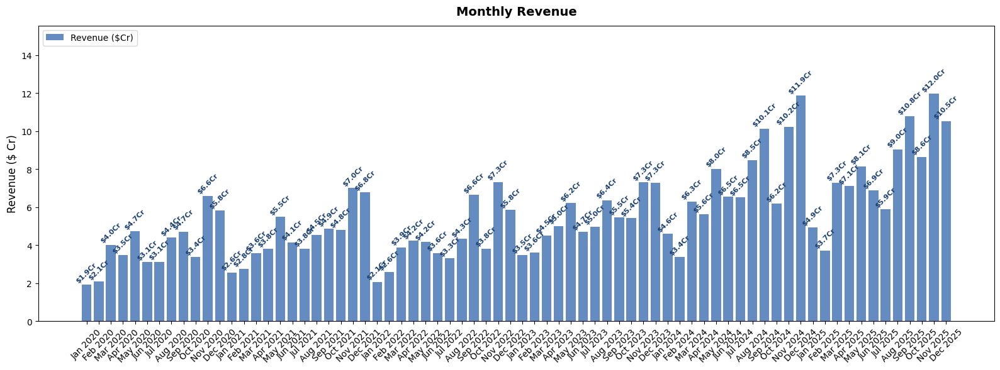

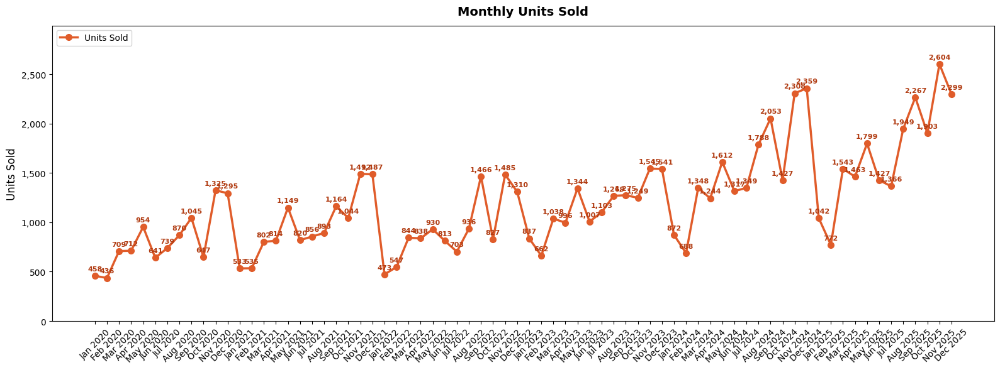


────────────────────────────────────────────────────────────────────────────────
  4. Monthly Revenue & Units
────────────────────────────────────────────────────────────────────────────────
       Month       Revenue  Units
1   Jan 2020   $19,045,494    458
2   Feb 2020   $20,819,867    436
3   Mar 2020   $40,079,575    709
4   Apr 2020   $34,665,394    712
5   May 2020   $47,198,164    954
6   Jun 2020   $31,075,845    641
7   Jul 2020   $31,168,196    739
8   Aug 2020   $43,933,998    870
9   Sep 2020   $46,999,668  1,045
10  Oct 2020   $33,606,410    647
11  Nov 2020   $65,886,201  1,325
12  Dec 2020   $58,156,616  1,295
13  Jan 2021   $25,602,086    533
14  Feb 2021   $27,516,584    535
15  Mar 2021   $35,736,932    802
16  Apr 2021   $37,919,835    814
17  May 2021   $54,871,810  1,149
18  Jun 2021   $41,419,001    820
19  Jul 2021   $38,050,021    856
20  Aug 2021   $45,369,807    893
21  Sep 2021   $48,660,967  1,164
22  Oct 2021   $48,086,782  1,044
23  Nov 2021   $69,983,081

In [50]:
# Monthly Revenue Trend
import matplotlib.ticker as mtick

master_ts              = master.copy()
master_ts["_Date"]     = pd.to_datetime(master_ts["DateKey"].astype(str), format="%Y%m%d")
master_ts["Month"]     = master_ts["_Date"].dt.month
master_ts["MonthName"] = master_ts["_Date"].dt.strftime("%b")
master_ts["Year"]      = master_ts["_Date"].dt.year

monthly = (
    master_ts
    .groupby(["Year", "Month", "MonthName"], as_index=False)
    .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"))
    .sort_values(["Year", "Month"])
)
monthly["Label"] = monthly["MonthName"] + " " + monthly["Year"].astype(str)

fig, ax1 = plt.subplots(figsize=(16, 6))
bars = ax1.bar(monthly["Label"], monthly["Revenue"]/1e7,
               color="#3266ad", alpha=0.75, label="Revenue ($Cr)")
for bar, rev in zip(bars, monthly["Revenue"]/1e7):
    ax1.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.05,
             f"${rev:.1f}Cr", ha="center", va="bottom",
             fontsize=8, color="#1a3f6f", fontweight="bold", rotation=45)

ax1.set_ylabel("Revenue ($ Cr)", fontsize=12)
ax1.tick_params(axis="x", rotation=45)
ax1.yaxis.set_major_formatter(mtick.FormatStrFormatter("%.0f"))
ax1.set_ylim(0, monthly["Revenue"].max()/1e7 * 1.3)
ax1.legend(loc="upper left")
plt.title("Monthly Revenue", fontsize=14, fontweight="bold", pad=12)
plt.tight_layout()
plt.show()

# Monthly Units Sold Trend
fig, ax2 = plt.subplots(figsize=(16, 6))
ax2.plot(monthly["Label"], monthly["Units"],
         color="#e05c2a", linewidth=2.5, marker="o", markersize=7, label="Units Sold")
for x, y in zip(range(len(monthly)), monthly["Units"]):
    ax2.text(x, y + (monthly["Units"].max()*0.015),
             f"{int(y):,}", ha="center", va="bottom",
             fontsize=8, color="#b03a10", fontweight="bold")

ax2.set_ylabel("Units Sold", fontsize=12)
ax2.tick_params(axis="x", rotation=45)
ax2.yaxis.set_major_formatter(mtick.FuncFormatter(lambda x, _: f"{int(x):,}"))
ax2.set_ylim(0, monthly["Units"].max()*1.15)
ax2.legend(loc="upper left")
plt.title("Monthly Units Sold", fontsize=14, fontweight="bold", pad=12)
plt.tight_layout()
plt.show()

pretty(monthly[["Label","Revenue","Units"]].rename(columns={"Label":"Month"}),
       "Monthly Revenue & Units", 4,
       format_cols={"Revenue":"currency","Units":"int"})

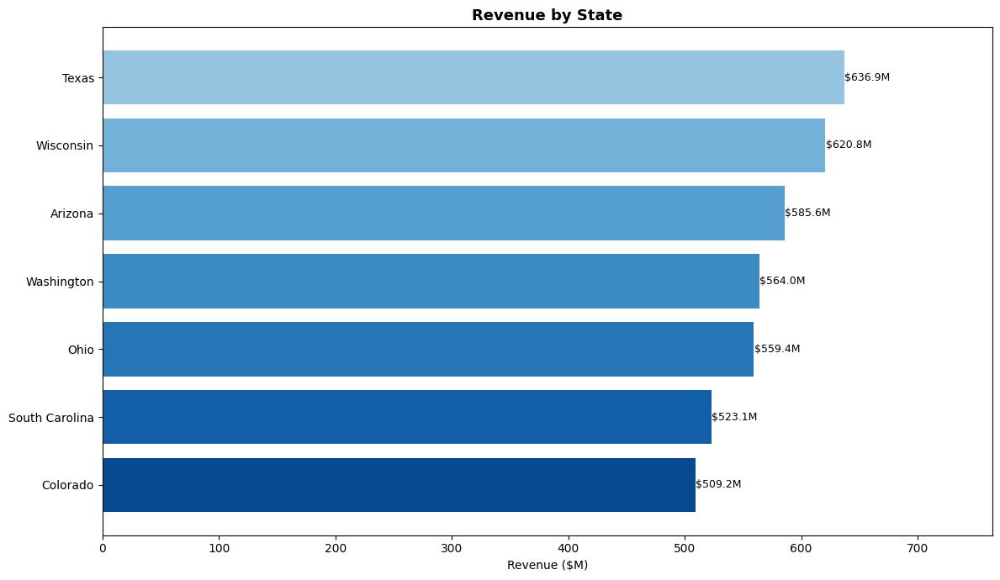

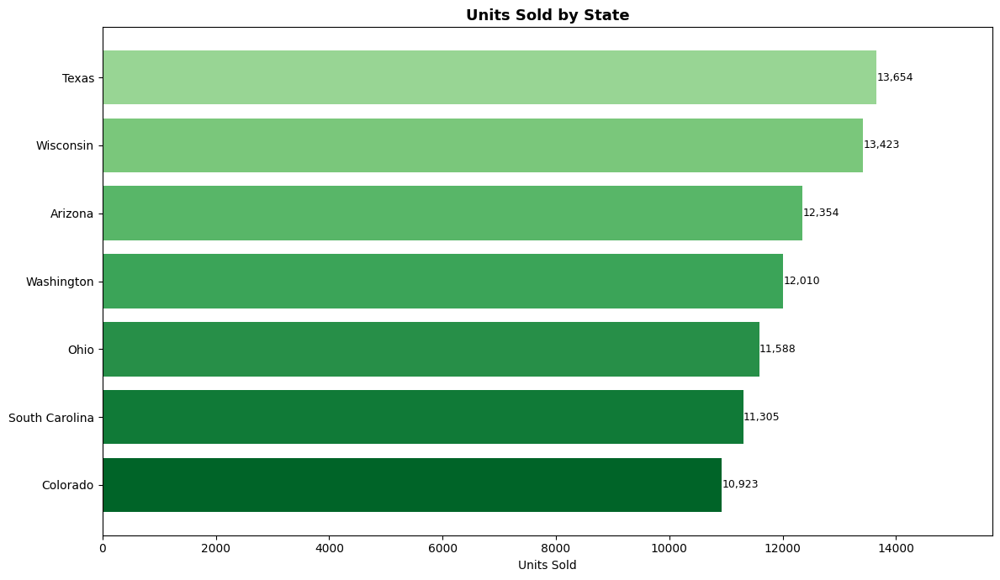


────────────────────────────────────────────────────────────────────────────────
  5. Statewise Sales
────────────────────────────────────────────────────────────────────────────────
            State       Revenue   Units Transactions
1           Texas  $636,852,962  13,654       13,579
2       Wisconsin  $620,816,658  13,423       13,361
3         Arizona  $585,567,295  12,354       12,264
4      Washington  $563,981,506  12,010       11,953
5            Ohio  $559,430,685  11,588       11,516
6  South Carolina  $523,055,867  11,305       11,224
7        Colorado  $509,167,920  10,923       10,855
────────────────────────────────────────────────────────────────────────────────


In [51]:
# Statewise Sales
# Chart 1
state = (
    master
    .groupby("State", as_index=False)
    .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"),
         Transactions=("SalesKey","count"))
    .sort_values("Revenue", ascending=False)
)

fig, ax = plt.subplots(figsize=(12, 7))
colors1 = plt.cm.Blues(np.linspace(0.4, 0.9, len(state)))[::-1]
bars = ax.barh(state["State"][::-1], state["Revenue"][::-1]/1e6, color=colors1)
for bar, val in zip(bars, state["Revenue"][::-1]/1e6):
    ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
            f"${val:.1f}M", va="center", fontsize=9)
ax.set_xlabel("Revenue ($M)")
ax.set_title("Revenue by State", fontweight="bold", fontsize=13)
ax.set_xlim(0, state["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

# Chart 2
fig, ax = plt.subplots(figsize=(12, 7))
colors2 = plt.cm.Greens(np.linspace(0.4, 0.9, len(state)))[::-1]
bars = ax.barh(state["State"][::-1], state["Units"][::-1], color=colors2)
for bar, val in zip(bars, state["Units"][::-1]):
    ax.text(bar.get_width() + 5, bar.get_y() + bar.get_height()/2,
            f"{int(val):,}", va="center", fontsize=9)
ax.set_xlabel("Units Sold")
ax.set_title("Units Sold by State", fontweight="bold", fontsize=13)
ax.set_xlim(0, state["Units"].max() * 1.15)
plt.tight_layout()
plt.show()

pretty(state, "Statewise Sales", 5,
       format_cols={"Revenue":"currency","Units":"int","Transactions":"int"})

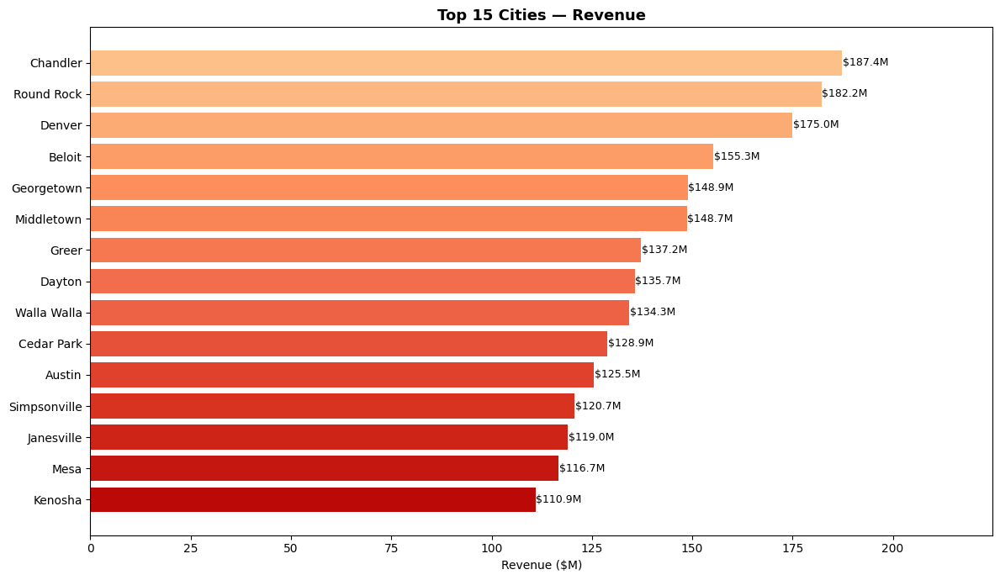

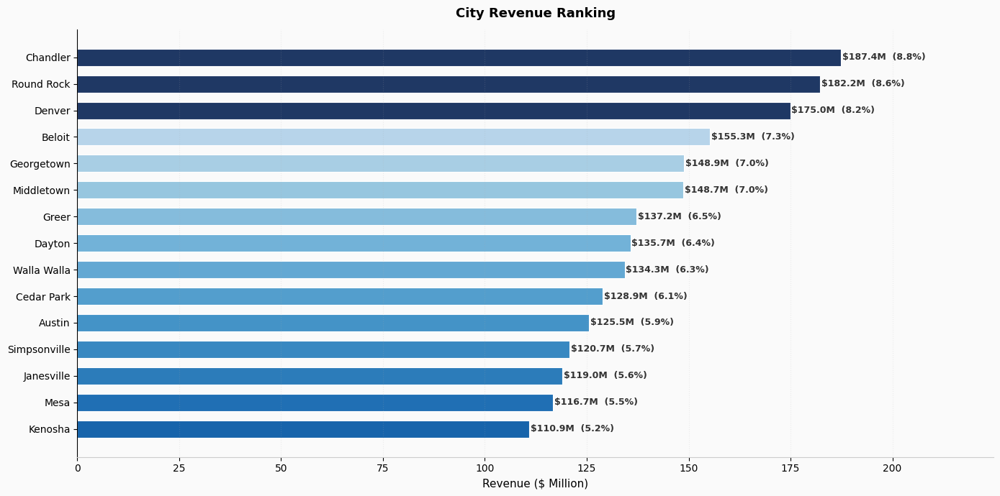


────────────────────────────────────────────────────────────────────────────────
  6. Citywise Sales
────────────────────────────────────────────────────────────────────────────────
            City       Revenue  Units
1       Chandler  $187,350,229  3,888
2     Round Rock  $182,211,278  3,958
3         Denver  $174,958,859  3,701
4         Beloit  $155,279,812  3,275
5     Georgetown  $148,859,833  3,394
6     Middletown  $148,667,125  3,024
7          Greer  $137,216,535  2,866
8         Dayton  $135,737,719  2,748
9    Walla Walla  $134,290,796  2,991
10    Cedar Park  $128,878,760  2,670
11        Austin  $125,500,332  2,583
12  Simpsonville  $120,736,607  2,479
13    Janesville  $118,991,391  2,433
14          Mesa  $116,694,241  2,284
15       Kenosha  $110,923,568  2,622
────────────────────────────────────────────────────────────────────────────────


In [52]:
# Citywise Sales (Top 15)
# Chart 1
city = (
    master
    .groupby("City", as_index=False)
    .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"))
    .sort_values("Revenue", ascending=False)
    .head(15)
)

fig, ax = plt.subplots(figsize=(12, 7))
colors = plt.cm.OrRd(np.linspace(0.35, 0.85, len(city)))[::-1]
bars = ax.barh(city["City"][::-1], city["Revenue"][::-1]/1e6, color=colors)
for bar, val in zip(bars, city["Revenue"][::-1]/1e6):
    ax.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2,
            f"${val:.1f}M", va="center", fontsize=9)
ax.set_xlabel("Revenue ($M)")
ax.set_title("Top 15 Cities — Revenue", fontweight="bold", fontsize=13)
ax.set_xlim(0, city["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

# Chart 2 — City Revenue Ranking
city_sorted = city.sort_values("Revenue", ascending=False)

total_rev = city_sorted["Revenue"].sum()

colors = (["#1F3864"] * 3 +
          [plt.cm.Blues(0.3 + 0.5 * i / (len(city_sorted) - 4))
           for i in range(len(city_sorted) - 3)])

fig, ax = plt.subplots(figsize=(14, 7))
fig.patch.set_facecolor("#FAFAFA")
ax.set_facecolor("#FAFAFA")

bars = ax.barh(city_sorted["City"][::-1],
               city_sorted["Revenue"][::-1] / 1e6,
               color=colors[::-1],
               edgecolor="white", linewidth=0.8, height=0.65)

for bar, val, pct in zip(
        bars,
        city_sorted["Revenue"][::-1] / 1e6,
        city_sorted["Revenue"][::-1] / total_rev * 100):
    ax.text(bar.get_width() + 0.3,
            bar.get_y() + bar.get_height() / 2,
            f"${val:.1f}M  ({pct:.1f}%)",
            va="center", ha="left",
            fontsize=9, fontweight="bold", color="#333")

ax.set_title("City Revenue Ranking",
             fontweight="bold", fontsize=13, pad=12)
ax.set_xlabel("Revenue ($ Million)", fontsize=11)
ax.grid(axis="x", alpha=0.2, linestyle=":")
ax.spines[["top","right"]].set_visible(False)
ax.spines["bottom"].set_color("#ccc")
ax.margins(x=0.2)

plt.tight_layout()
plt.show()

pretty(city_sorted, "Citywise Sales", 6,
       format_cols={"Revenue":"currency", "Units":"int"})

mktg built — (401, 31)
camp built — 188 campaigns
                    CampaignName         Cost      Revenue  ROI_%
0         Awareness Campaign 843   7468867.54   7447838.15   -0.3
1         Awareness Campaign 864   5114631.87   6617777.93   29.4
2         Awareness Campaign 865   2213202.96   2894122.40   30.8
3         Awareness Campaign 872   4452343.94   7092698.88   59.3
4         Awareness Campaign 874   5897572.61   6786271.66   15.1
5         Awareness Campaign 877   3354064.76   3441007.71    2.6
6         Awareness Campaign 878   1847947.63   1690367.49   -8.5
7         Awareness Campaign 884   3756702.22   3509054.95   -6.6
8         Awareness Campaign 887   4621567.07   7121816.65   54.1
9         Awareness Campaign 890  10210725.14  14476818.83   41.8
10        Awareness Campaign 906   6857989.39   7117723.17    3.8
11        Awareness Campaign 941   9197271.86   9616623.61    4.6
12        Awareness Campaign 944   7730998.45   7968999.52    3.1
13        Awareness Campai

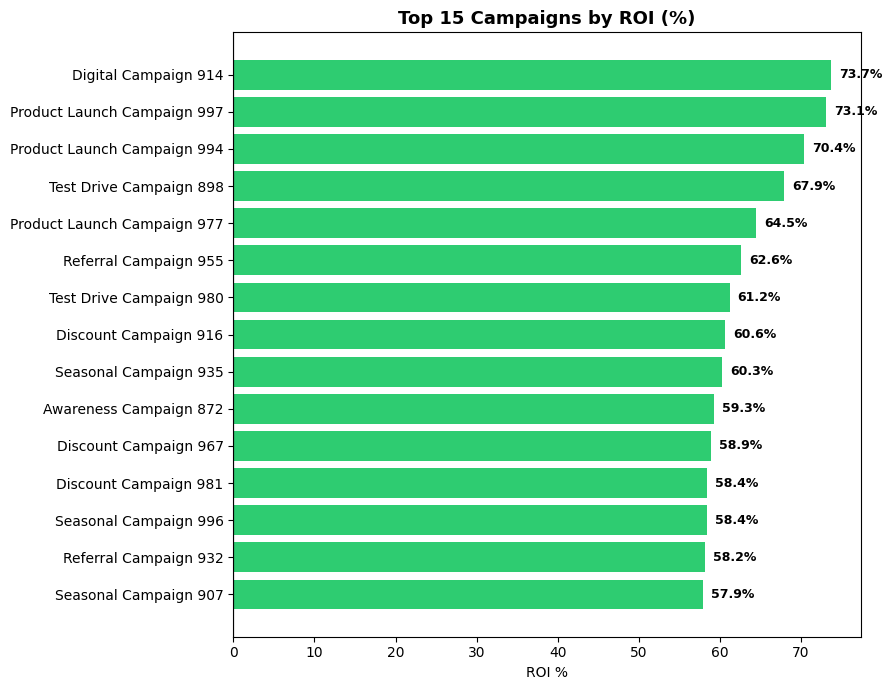

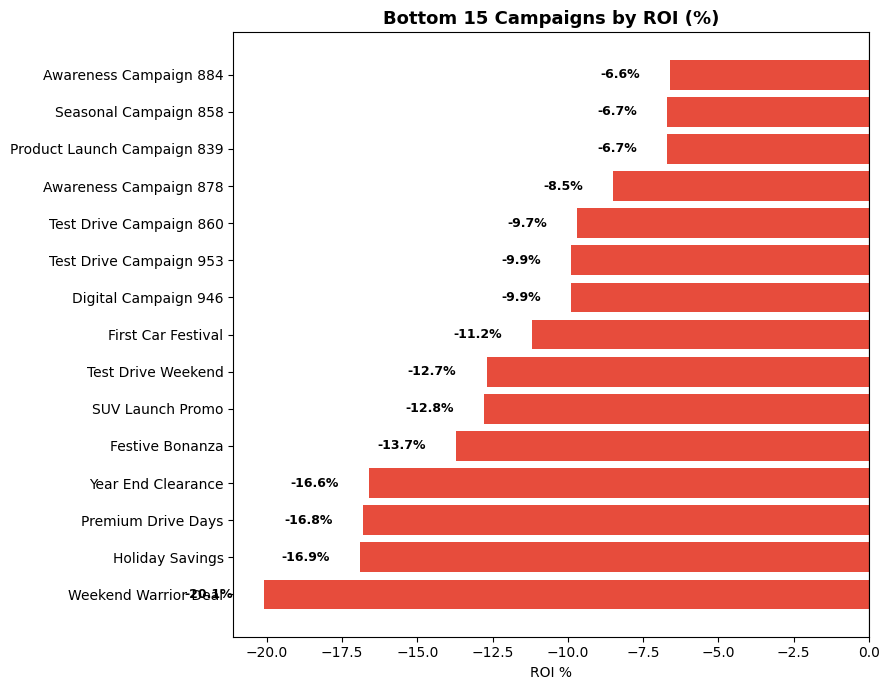

In [53]:
# Campaign Comparison
mktg = (
    fmc
    .merge(dim_campaign, on="CampaignKey", how="left")
    .merge(dim_channel,  on="ChannelKey",  how="left", suffixes=("","_chan"))
    .merge(dim_date,     on="DateKey",     how="left", suffixes=("","_date"))
)
print(f"mktg built — {mktg.shape}")
camp = (
    mktg.groupby("CampaignName", as_index=False)
    .agg(
        Impressions = ("Impressions",      "sum"),
        Leads       = ("Leads",            "sum"),
        TestDrives  = ("TestDrives",       "sum"),
        Bookings    = ("Bookings",         "sum"),
        Cost        = ("CampaignCost",     "sum"),
        Revenue     = ("RevenueGenerated", "sum"),
    )
)
camp["ROI_%"]  = ((camp["Revenue"] - camp["Cost"]) / camp["Cost"] * 100).round(1)
camp["Conv_%"] = (camp["Bookings"] / camp["Leads"] * 100).round(2)
camp["CPL"]    = (camp["Cost"] / camp["Leads"]).round(0)
print(f"camp built — {len(camp)} campaigns")
print(camp[["CampaignName","Cost","Revenue","ROI_%","Status"]].to_string()
      if "Status" in camp.columns
      else camp[["CampaignName","Cost","Revenue","ROI_%"]].to_string())


pretty(camp, "Campaign Performance Summary", 7,
       format_cols={"Cost":"currency","Revenue":"currency",
                    "ROI_%":"pct","Conv_%":"pct","CPL":"currency"})



import matplotlib.pyplot as plt

camp_sorted = camp.sort_values("ROI_%", ascending=False).reset_index(drop=True)
n = len(camp_sorted)
print(f"Total campaigns: {n}")

# Chart 1: Top 15 campaigns by ROI
top15 = camp_sorted.head(15).sort_values("ROI_%")  # ascending for horizontal bar order
fig, ax = plt.subplots(figsize=(9, 7))
colors = ["#2ecc71" if v > 0 else "#e74c3c" for v in top15["ROI_%"]]
bars = ax.barh(top15["CampaignName"], top15["ROI_%"], color=colors)
for bar, val in zip(bars, top15["ROI_%"]):
    ax.text(bar.get_width() + (1 if val >= 0 else -1),
            bar.get_y() + bar.get_height()/2,
            f"{val:.1f}%", va="center",
            ha="left" if val >= 0 else "right",
            fontsize=9, fontweight="bold")
ax.axvline(0, color="black", linewidth=0.8)
ax.set_title("Top 15 Campaigns by ROI (%)", fontweight="bold", fontsize=13)
ax.set_xlabel("ROI %")
plt.tight_layout()
plt.savefig("/content/campaign_roi_top15.png", dpi=150, bbox_inches="tight")
plt.show()

# Chart 2: Bottom 15 campaigns by ROI
bottom15 = camp_sorted.tail(15).sort_values("ROI_%")
fig, ax = plt.subplots(figsize=(9, 7))
colors = ["#2ecc71" if v > 0 else "#e74c3c" for v in bottom15["ROI_%"]]
bars = ax.barh(bottom15["CampaignName"], bottom15["ROI_%"], color=colors)
for bar, val in zip(bars, bottom15["ROI_%"]):
    ax.text(bar.get_width() + (1 if val >= 0 else -1),
            bar.get_y() + bar.get_height()/2,
            f"{val:.1f}%", va="center",
            ha="left" if val >= 0 else "right",
            fontsize=9, fontweight="bold")
ax.axvline(0, color="black", linewidth=0.8)
ax.set_title("Bottom 15 Campaigns by ROI (%)", fontweight="bold", fontsize=13)
ax.set_xlabel("ROI %")
plt.tight_layout()
plt.savefig("/content/campaign_roi_bottom15.png", dpi=150, bbox_inches="tight")
plt.show()





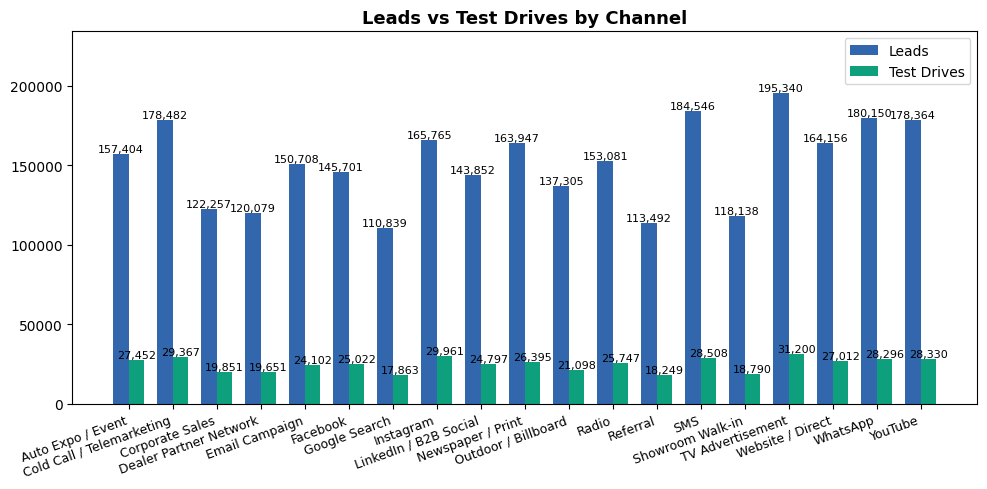


────────────────────────────────────────────────────────────────────────────────
  8. Channel Summary
────────────────────────────────────────────────────────────────────────────────
                  ChannelName       Revenue  Units    Leads TestDrives  Bookings
1           Auto Expo / Event  $299,480,356  6,589  157,404     27,452      9211
2   Cold Call / Telemarketing  $312,334,604  6,632  178,482     29,367      8925
3             Corporate Sales  $316,645,617  6,689  122,257     19,851      5986
4      Dealer Partner Network  $308,574,528  6,742  120,079     19,651      5327
5              Email Campaign  $101,975,946  2,112  150,708     24,102      6578
6                    Facebook   $95,925,183  2,144  145,701     25,022      7120
7               Google Search  $108,007,600  2,057  110,839     17,863      5369
8                   Instagram   $96,560,601  2,064  165,765     29,961      8002
9       LinkedIn / B2B Social  $105,384,871  2,016  143,852     24,797      6448
10    

In [54]:
# Channel Analysis — Leads vs Test Drives by Channel
chan_mktg = (
    mktg.groupby("ChannelName", as_index=False)
    .agg(Leads=("Leads","sum"), TestDrives=("TestDrives","sum"),
         Bookings=("Bookings","sum"))
)
chan_sales = (
    master.groupby("ChannelName", as_index=False)
    .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"))
    .sort_values("Revenue", ascending=False)
)

fig, ax = plt.subplots(figsize=(10, 5))
x = np.arange(len(chan_mktg))
w = 0.35
b1 = ax.bar(x-w/2, chan_mktg["Leads"],      w, label="Leads",       color="#3266ad")
b2 = ax.bar(x+w/2, chan_mktg["TestDrives"], w, label="Test Drives", color="#0e9f7c")
for bar in b1:
    h = bar.get_height()
    ax.text(bar.get_x()+bar.get_width()/2, h+5, f"{int(h):,}",
            ha="center", va="bottom", fontsize=8)
for bar in b2:
    h = bar.get_height()
    ax.text(bar.get_x()+bar.get_width()/2, h+5, f"{int(h):,}",
            ha="center", va="bottom", fontsize=8)
ax.set_xticks(x)
ax.set_xticklabels(chan_mktg["ChannelName"], rotation=20, ha="right", fontsize=9)
ax.set_title("Leads vs Test Drives by Channel", fontweight="bold", fontsize=13)
ax.set_ylim(0, chan_mktg["Leads"].max() * 1.2)
ax.legend()
plt.tight_layout()
plt.show()

pretty(chan_sales.merge(chan_mktg, on="ChannelName", how="outer"),
       "Channel Summary", 8,
       format_cols={"Revenue":"currency","Units":"int","Leads":"int","TestDrives":"int"})

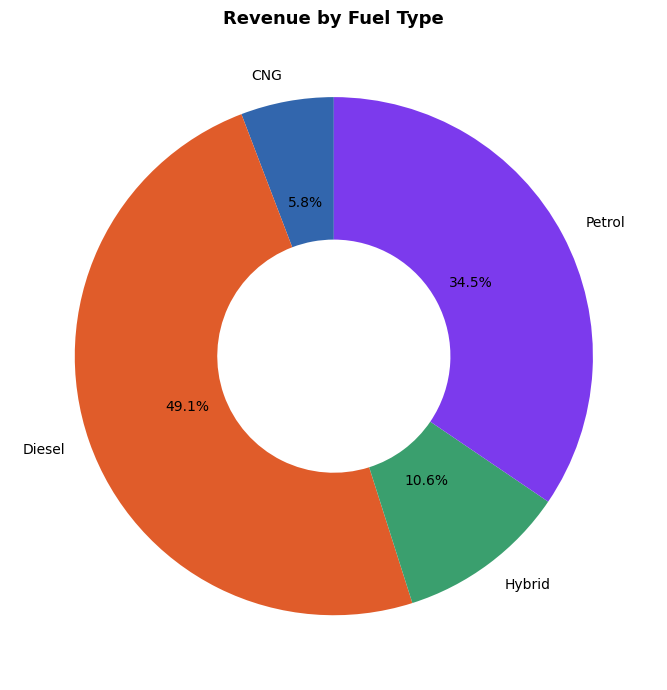

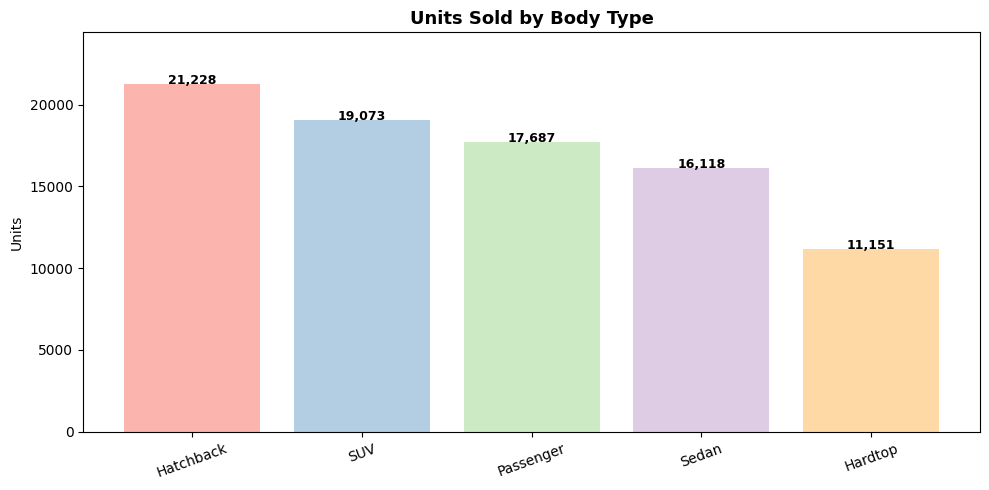

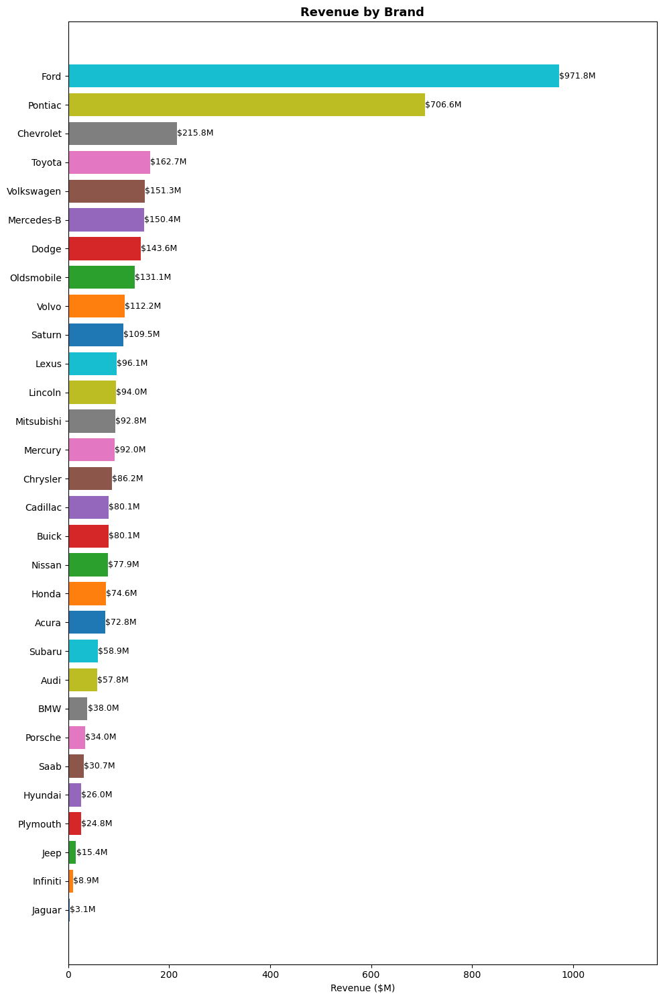


────────────────────────────────────────────────────────────────────────────────
  9. Brand Revenue & Units
────────────────────────────────────────────────────────────────────────────────
         Brand       Revenue  Units
1         Ford  $971,808,284  8,968
2      Pontiac  $706,576,936  3,932
3    Chevrolet  $215,815,548  5,488
4       Toyota  $162,683,950  4,962
5   Volkswagen  $151,286,427  5,051
6   Mercedes-B  $150,363,913  4,680
7        Dodge  $143,611,454  5,543
8   Oldsmobile  $131,060,683  3,119
9        Volvo  $112,168,557  3,461
10      Saturn  $109,475,315  3,136
11       Lexus   $96,073,731  2,680
12     Lincoln   $93,999,054  1,607
13  Mitsubishi   $92,799,120  2,975
14     Mercury   $92,043,159  3,180
15    Chrysler   $86,192,829  3,031
16    Cadillac   $80,145,199  2,973
17       Buick   $80,073,474  2,004
18      Nissan   $77,894,198  2,808
19       Honda   $74,561,247  2,482
20       Acura   $72,848,683  2,114
21      Subaru   $58,864,175  1,214
22        Audi   $

In [55]:
# Vehicle Analysis
# CHart 1
fuel = (master.groupby("FuelType", as_index=False)
        .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum")))
body = (master.groupby("BodyType", as_index=False)
        .agg(Units=("UnitsSold","sum"), Revenue=("SaleAmount","sum"))
        .sort_values("Units", ascending=False))
brand = (master.groupby("Brand", as_index=False)
         .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"))
         .sort_values("Revenue", ascending=False))

fig, ax = plt.subplots(figsize=(8, 7))
wedges, texts, autotexts = ax.pie(
    fuel["Revenue"], labels=fuel["FuelType"], autopct="%1.1f%%",
    startangle=90, colors=["#3266ad","#e05c2a","#3a9f6e","#7c3aed"],
    wedgeprops=dict(width=0.55), textprops={"fontsize": 10}
)
ax.set_title("Revenue by Fuel Type", fontweight="bold", fontsize=13)
plt.tight_layout()
plt.show()

# Chart 2
fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(body["BodyType"], body["Units"],
              color=plt.cm.Pastel1.colors[:len(body)])
for bar, val in zip(bars, body["Units"]):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5,
            f"{int(val):,}", ha="center", fontsize=9, fontweight="bold")
ax.set_title("Units Sold by Body Type", fontweight="bold", fontsize=13)
ax.set_ylabel("Units")
ax.set_ylim(0, body["Units"].max() * 1.15)
ax.tick_params(axis="x", rotation=20)
plt.tight_layout()
plt.show()

# Chart 3
fig, ax = plt.subplots(figsize=(10, max(5, len(brand)*0.5)))
colors_b = plt.cm.tab10.colors[:len(brand)]
bars = ax.barh(brand["Brand"][::-1], brand["Revenue"][::-1]/1e6, color=colors_b)
for bar, val in zip(bars, brand["Revenue"][::-1]/1e6):
    ax.text(bar.get_width()+0.1, bar.get_y()+bar.get_height()/2,
            f"${val:.1f}M", va="center", fontsize=9)
ax.set_title("Revenue by Brand", fontweight="bold", fontsize=13)
ax.set_xlabel("Revenue ($M)")
ax.set_xlim(0, brand["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

pretty(brand, "Brand Revenue & Units", 9,
       format_cols={"Revenue":"currency","Units":"int"})



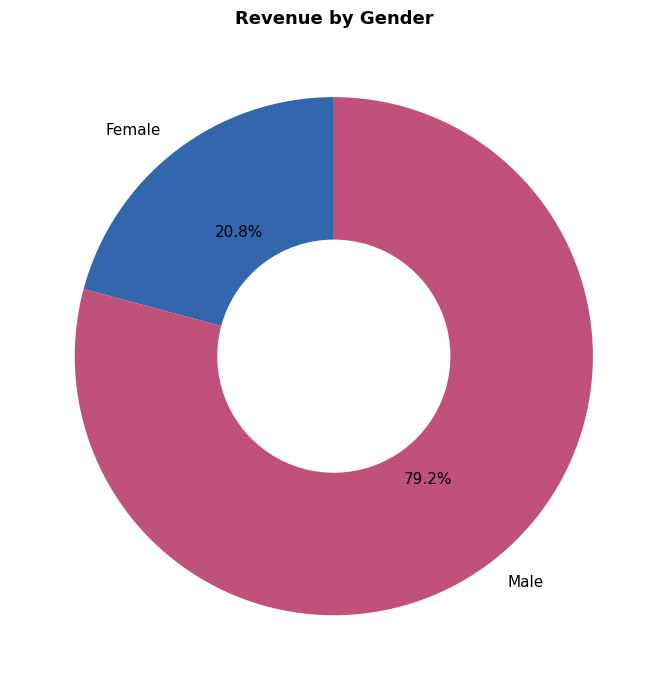

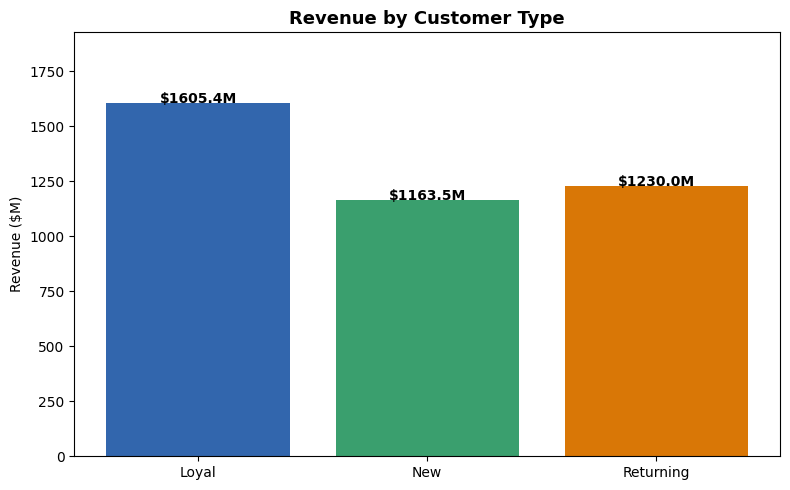

In [56]:
# Customer Demographics
age_order = ["18-25","26-35","36-45","46-55","55+"]
dem = (master.groupby(["AgeGroup","IncomeGroup"], as_index=False)
       .agg(Count=("SalesKey","count")))
income_groups = sorted(dem["IncomeGroup"].unique())

# Chart 2
fig, ax = plt.subplots(figsize=(7, 7))
gender = master.groupby("Gender")["SaleAmount"].sum()
ax.pie(gender.values, labels=gender.index, autopct="%1.1f%%",
       colors=["#3266ad","#c0517a","#73726c"],
       wedgeprops=dict(width=0.55), startangle=90,
       textprops={"fontsize": 11})
ax.set_title("Revenue by Gender", fontweight="bold", fontsize=13)
plt.tight_layout()
plt.show()

# Chart 3
ctype = (master.groupby("CustomerType", as_index=False)
         .agg(Revenue=("SaleAmount","sum")))

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(ctype["CustomerType"], ctype["Revenue"]/1e6,
              color=["#3266ad","#3a9f6e","#d97706"])
for bar, (_, row) in zip(bars, ctype.iterrows()):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.1,
            f"${row['Revenue']/1e6:.1f}M",
            ha="center", fontweight="bold", fontsize=10)
ax.set_title("Revenue by Customer Type", fontweight="bold", fontsize=13)
ax.set_ylabel("Revenue ($M)")
ax.set_ylim(0, ctype["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

In [57]:
master["Quarter"] = master["Quarter"].astype(str)
master["Quarter"] = master["Quarter"].apply(lambda x: x if x.startswith("Q") else f"Q{x}")

# Zone & Quarterly Revenue
zone_q = (
    master.groupby(["Zone","Quarter"], as_index=False)
    .agg(Revenue=("SaleAmount","sum"))
    .sort_values("Quarter")
)

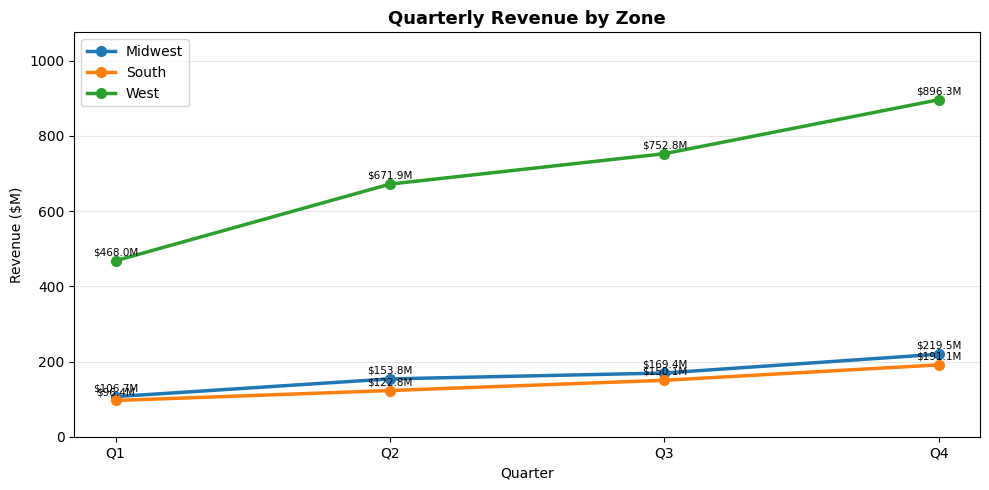

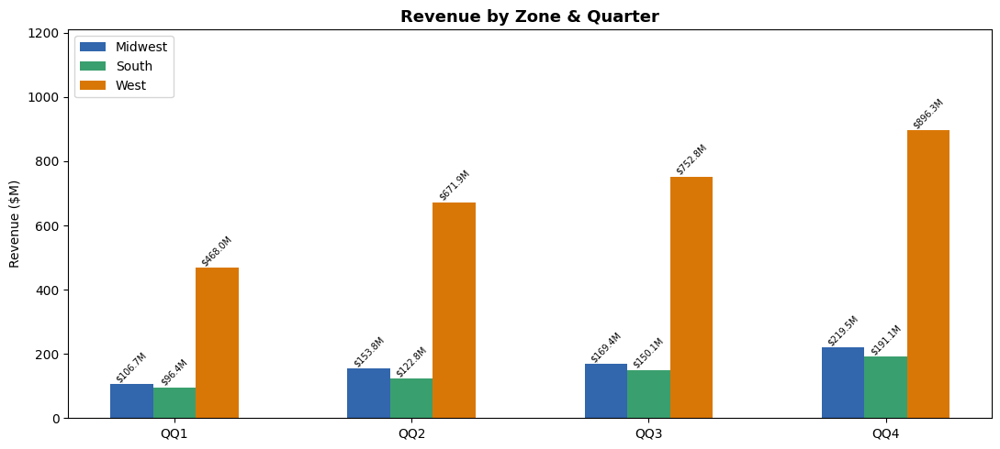


────────────────────────────────────────────────────────────────────────────────
  11. Zone Quarterly Revenue
────────────────────────────────────────────────────────────────────────────────
       Zone Quarter       Revenue
1   Midwest      Q1  $106,676,299
2     South      Q1   $96,377,924
3      West      Q1  $468,006,245
4   Midwest      Q2  $153,811,678
5     South      Q2  $122,842,801
6      West      Q2  $671,945,139
7   Midwest      Q3  $169,411,967
8     South      Q3  $150,113,185
9      West      Q3  $752,799,850
10  Midwest      Q4  $219,514,436
11    South      Q4  $191,054,661
12     West      Q4  $896,318,708
────────────────────────────────────────────────────────────────────────────────


In [58]:
# Zone & Quarterly Revenue
# Chart 1
zone_q = (
    master.groupby(["Zone","Quarter"], as_index=False)
    .agg(Revenue=("SaleAmount","sum"))
    .sort_values("Quarter")
)

fig, ax = plt.subplots(figsize=(10, 5))
for zone, grp in zone_q.groupby("Zone"):
    ax.plot(grp["Quarter"].astype(str), grp["Revenue"]/1e6,
            marker="o", linewidth=2.5, markersize=7, label=zone)
    for _, row in grp.iterrows():
        ax.text(str(row["Quarter"]), row["Revenue"]/1e6 + zone_q["Revenue"].max()/1e6*0.01,
                f"${row['Revenue']/1e6:.1f}M", ha="center", va="bottom", fontsize=7.5)
ax.set_title("Quarterly Revenue by Zone", fontweight="bold", fontsize=13)
ax.set_xlabel("Quarter")
ax.set_ylabel("Revenue ($M)")
ax.legend()
ax.grid(axis="y", alpha=0.3)
ax.set_ylim(0, zone_q["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

# Chart2
zones    = zone_q["Zone"].unique()
quarters = sorted(zone_q["Quarter"].unique())
x = np.arange(len(quarters))
w = 0.18
colors_z = ["#3266ad","#3a9f6e","#d97706","#bf5a27"]

fig, ax = plt.subplots(figsize=(11, 5))
for i, zone in enumerate(zones):
    vals = [zone_q[(zone_q["Zone"]==zone) & (zone_q["Quarter"]==q)]["Revenue"].sum()/1e6
            for q in quarters]
    bars = ax.bar(x + i*w, vals, w, label=zone, color=colors_z[i])
    for bar, v in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.1,
                f"${v:.1f}M", ha="center", va="bottom", fontsize=7, rotation=45)

ax.set_xticks(x + w*(len(zones)-1)/2)
ax.set_xticklabels([f"Q{q}" for q in quarters])
ax.set_title("Revenue by Zone & Quarter", fontweight="bold", fontsize=13)
ax.set_ylabel("Revenue ($M)")
ax.set_ylim(0, zone_q["Revenue"].max()/1e6 * 1.35)
ax.legend()
plt.tight_layout()
plt.show()

pretty(zone_q, "Zone Quarterly Revenue", 11, format_cols={"Revenue":"currency"})



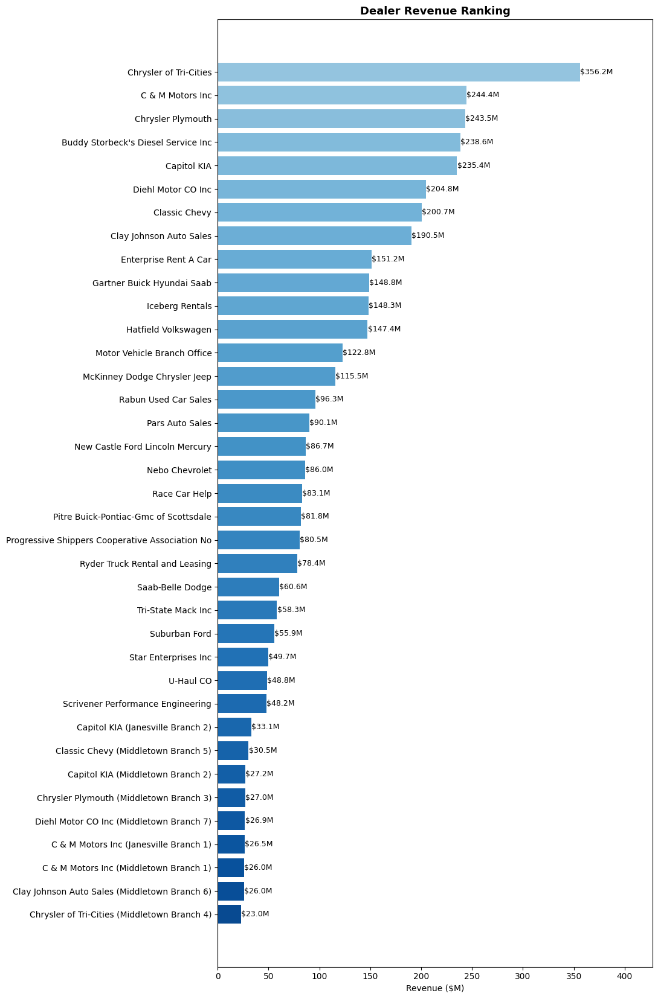


────────────────────────────────────────────────────────────────────────────────
  12. Dealer Performance Summary
────────────────────────────────────────────────────────────────────────────────
                                         DealerName       Revenue  Units AvgDiscount Transactions
1                            Chrysler of Tri-Cities  $356,193,516  7,305     2746.35        7,264
2                                  C & M Motors Inc  $244,428,071  5,214     2608.75        5,183
3                                 Chrysler Plymouth  $243,513,403  5,397     2537.63        5,344
4               Buddy Storbeck's Diesel Service Inc  $238,647,299  5,192     2675.75        5,147
5                                       Capitol KIA  $235,354,843  5,122     2545.40        5,083
6                                Diehl Motor CO Inc  $204,807,494  4,221     2588.21        4,185
7                                     Classic Chevy  $200,748,655  4,128     2944.37        4,087
8                   

In [59]:
# Dealer Performance
# Chart 1
dealer = (
    master.groupby("DealerName", as_index=False)
    .agg(Revenue=("SaleAmount","sum"), Units=("UnitsSold","sum"),
         AvgDiscount=("Discount","mean"), Transactions=("SalesKey","count"))
    .sort_values("Revenue", ascending=False)
)

fig, ax = plt.subplots(figsize=(11, max(6, len(dealer)*0.45)))
colors = plt.cm.Blues(np.linspace(0.4, 0.9, len(dealer)))[::-1]
bars = ax.barh(dealer["DealerName"][::-1], dealer["Revenue"][::-1]/1e6, color=colors)
for bar, val in zip(bars, dealer["Revenue"][::-1]/1e6):
    ax.text(bar.get_width()+0.1, bar.get_y()+bar.get_height()/2,
            f"${val:.1f}M", va="center", fontsize=9)
ax.set_title("Dealer Revenue Ranking", fontweight="bold", fontsize=13)
ax.set_xlabel("Revenue ($M)")
ax.set_xlim(0, dealer["Revenue"].max()/1e6 * 1.2)
plt.tight_layout()
plt.show()

pretty(dealer, "Dealer Performance Summary", 12,
       format_cols={"Revenue":"currency","Units":"int",
                    "AvgDiscount":"float2","Transactions":"int"})

fmc reloaded — 401 rows
   Total RevenueGenerated: $1,453,180,144
mktg rebuilt — (401, 31)
camp_pl built — 188 campaigns
   Profitable : 154
   Loss       : 34
   Total Profit : $309,395,117
   Total Loss   : $9,542,027
   Net          : $299,853,090  yes

────────────────────────────────────────────────────────────────────────────────
  PL. Campaign Profit / Loss Summary
────────────────────────────────────────────────────────────────────────────────
                    CampaignName    Budget         Cost      Revenue Profit_Loss   ROI_%    Status
1         Awareness Campaign 843  $261,018   $7,468,868   $7,447,838    $-21,029   -0.3%    ❌ Loss
2         Awareness Campaign 864  $170,653   $5,114,632   $6,617,778  $1,503,146   29.4%  ✅ Profit
3         Awareness Campaign 865  $155,476   $2,213,203   $2,894,122    $680,919   30.8%  ✅ Profit
4         Awareness Campaign 872  $132,583   $4,452,344   $7,092,699  $2,640,355   59.3%  ✅ Profit
5         Awareness Campaign 874  $175,409   $5,8

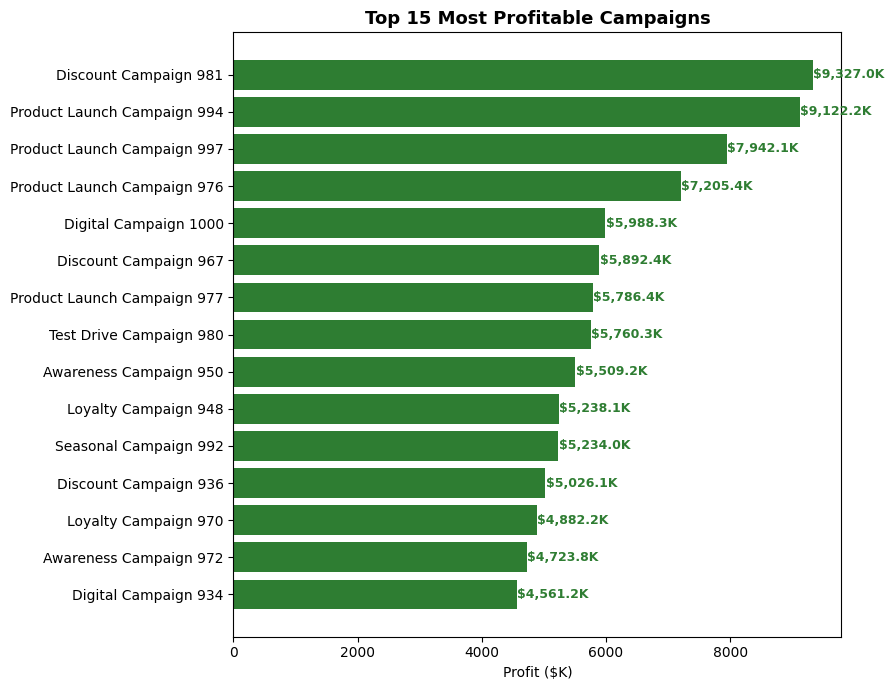

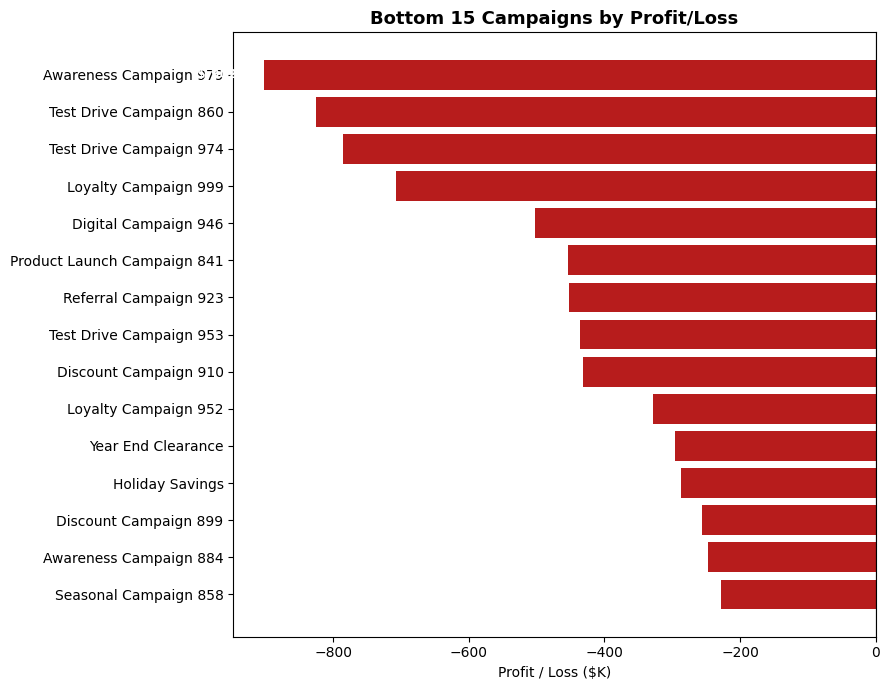

Total Profit : $309,395,117
Total Loss   : $9,542,027
Net          : $299,853,090


In [60]:
all_sheets2 = pd.read_excel(DRIVE_FILE, sheet_name=None)
fmc         = all_sheets2["Fact_MarketingCampaignPerforman"].copy()
print(f"fmc reloaded — {len(fmc)} rows")
print(f"   Total RevenueGenerated: ${fmc['RevenueGenerated'].sum():,.0f}")

mktg = (
    fmc
    .merge(dim_campaign, on="CampaignKey", how="left")
    .merge(dim_channel,  on="ChannelKey",  how="left", suffixes=("","_chan"))
    .merge(dim_date,     on="DateKey",     how="left", suffixes=("","_date"))
)
print(f"mktg rebuilt — {mktg.shape}")

camp_pl = (
    mktg.groupby("CampaignName", as_index=False)
    .agg(
        Budget      = ("Budget",           "mean"),
        Cost        = ("CampaignCost",     "sum"),
        Revenue     = ("RevenueGenerated", "sum"),
        Impressions = ("Impressions",      "sum"),
        Leads       = ("Leads",            "sum"),
        Bookings    = ("Bookings",         "sum"),
    )
)
camp_pl["Profit_Loss"]  = camp_pl["Revenue"] - camp_pl["Cost"]
camp_pl["ROI_%"]        = ((camp_pl["Revenue"] - camp_pl["Cost"]) / camp_pl["Cost"] * 100).round(1)
camp_pl["Cost_vs_Budg"] = ((camp_pl["Cost"] / camp_pl["Budget"]) * 100).round(1)
camp_pl["Status"]       = camp_pl["Profit_Loss"].apply(lambda x: "✅ Profit" if x >= 0 else "❌ Loss")

total_profit = camp_pl[camp_pl["Profit_Loss"] >= 0]["Profit_Loss"].sum()
total_loss   = camp_pl[camp_pl["Profit_Loss"] <  0]["Profit_Loss"].sum()
net          = total_profit + total_loss

print(f"camp_pl built — {len(camp_pl)} campaigns")
print(f"   Profitable : {(camp_pl['Profit_Loss'] >= 0).sum()}")
print(f"   Loss       : {(camp_pl['Profit_Loss'] <  0).sum()}")
print(f"   Total Profit : ${total_profit:,.0f}")
print(f"   Total Loss   : ${abs(total_loss):,.0f}")
print(f"   Net          : ${net:,.0f}  {'yes' if net >= 0 else 'no'}")

pretty(camp_pl[["CampaignName","Budget","Cost","Revenue",
                "Profit_Loss","ROI_%","Status"]],
       "Campaign Profit / Loss Summary", "PL",
       format_cols={"Budget":"currency","Cost":"currency",
                    "Revenue":"currency","Profit_Loss":"currency",
                    "ROI_%":"pct"})
camp_pl_sorted = camp_pl.sort_values("Profit_Loss", ascending=True)

import matplotlib.ticker as mticker

# Campaign Profit/Loss Summary Stats
total_profit = camp_pl[camp_pl["Profit_Loss"] >= 0]["Profit_Loss"].sum()
total_loss   = camp_pl[camp_pl["Profit_Loss"] <  0]["Profit_Loss"].sum()
net          = total_profit + total_loss

import matplotlib.ticker as mticker

# Campaign Profit/Loss Summary Stats (already computed above — no need to recompute)

# Chart 1: Top 15 Most Profitable Campaigns
top15 = camp_pl.nlargest(15, "Profit_Loss").sort_values("Profit_Loss")

fig, ax = plt.subplots(figsize=(9, 7))
bars = ax.barh(top15["CampaignName"], top15["Profit_Loss"]/1e3, color="#2E7D32")

for bar, val in zip(bars, top15["Profit_Loss"]/1e3):
    ax.text(bar.get_width()+5, bar.get_y()+bar.get_height()/2, f"${val:,.1f}K",
            va="center", fontsize=9, fontweight="bold", color="#2E7D32")

ax.set_title("Top 15 Most Profitable Campaigns", fontweight="bold", fontsize=13)
ax.set_xlabel("Profit ($K)")
plt.tight_layout()
plt.savefig("/content/top15_profit.png", dpi=150, bbox_inches="tight")
plt.show()


# Chart 2: Bottom 15 Campaigns by Profit/Loss (biggest losses)
bottom15 = camp_pl.nsmallest(15, "Profit_Loss").sort_values("Profit_Loss", ascending=False)

fig, ax = plt.subplots(figsize=(9, 7))
bars = ax.barh(bottom15["CampaignName"], bottom15["Profit_Loss"]/1e3, color="#B71C1C")

for bar, val in zip(bars, bottom15["Profit_Loss"]/1e3):
    ax.text(bar.get_width()-5, bar.get_y()+bar.get_height()/2, f"${val:,.1f}K",
            va="center", ha="right", fontsize=9, fontweight="bold", color="white")  # fixed: was "000000"

ax.axvline(0, color="black", linewidth=0.8)
ax.set_title("Bottom 15 Campaigns by Profit/Loss", fontweight="bold", fontsize=13)
ax.set_xlabel("Profit / Loss ($K)")
plt.tight_layout()
plt.savefig("/content/bottom15_loss.png", dpi=150, bbox_inches="tight")
plt.show()


# Summary Printout
print(f"Total Profit : ${total_profit:,.0f}")
print(f"Total Loss   : ${abs(total_loss):,.0f}")
print(f"Net          : ${net:,.0f}")

## Data Preperation

In [61]:
# 1. Fix Dim_Date: Parse Date & Add MonthNum
dim_date['Date']     = pd.to_datetime(dim_date['Date'])
dim_date['MonthNum'] = dim_date['Date'].dt.month

print(f"Dim_Date fixed")
print(f"   Date dtype : {dim_date['Date'].dtype}")
print(f"\nMonthNum mapping:")
print(dim_date[['MonthName','MonthNum']].drop_duplicates()
      .sort_values('MonthNum').to_string(index=False))

Dim_Date fixed
   Date dtype : datetime64[ns]

MonthNum mapping:
MonthName  MonthNum
  January         1
 February         2
    March         3
    April         4
      May         5
     June         6
     July         7
   August         8
September         9
  October        10
 November        11
 December        12


In [62]:
# 2. Fix remaining issues
# Fix Corrupted Vehicle Prices
price_fixes = {
    2806: 55000,   # Toyota Land Cruiser
    2304: 18000,   # Pontiac Grand Prix
    706:  22000,   # Chrysler Sebring Coupe
    2905: 22000,   # Volkswagen Jetta
}
for vk, price in price_fixes.items():
    dim_vehicle.loc[dim_vehicle['VehicleKey'] == vk, 'Price'] = price

for vk in dim_vehicle[(dim_vehicle['Brand']=='Volvo') & (dim_vehicle['Model']=='S80')]['VehicleKey'].values:
    dim_vehicle.loc[dim_vehicle['VehicleKey']==vk, 'Price'] = 35000

for vk in dim_vehicle[(dim_vehicle['Brand']=='Ford') & (dim_vehicle['Model']=='Ranger')]['VehicleKey'].values:
    dim_vehicle.loc[dim_vehicle['VehicleKey']==vk, 'Price'] = 28000

print(f"Vehicle prices fixed")
print(f"   Prices still < $5,000: {(dim_vehicle['Price'] < 5000).sum()} (should be 0)")

# Fix Null Impressions in Fact_Marketing
print(f"Null Impressions before: {fmc['Impressions'].isnull().sum()}")

fmc['Impressions'] = fmc['Impressions'].fillna(
    fmc.groupby('CampaignKey')['Impressions'].transform('median'))
fmc['Impressions'] = fmc['Impressions'].fillna(fmc['Impressions'].median())
fmc['Impressions'] = fmc['Impressions'].round(0).astype(int)

print(f"Null Impressions after : {fmc['Impressions'].isnull().sum()} ")


Vehicle prices fixed
   Prices still < $5,000: 0 (should be 0)
Null Impressions before: 0
Null Impressions after : 0 


In [63]:
#  3. Build Master Joined Table

master = (
    fvs
    .merge(dim_date[['DateKey','Date','MonthName','MonthNum','Quarter','Year','IsWeekend']],
           on='DateKey', how='left')
    .merge(dim_vehicle[['VehicleKey','Brand','Model','BodyType','FuelType','Transmission','Price']],
           on='VehicleKey', how='left')
    .merge(dim_customer[['CustomerKey','CustomerName','Gender','AgeGroup','IncomeGroup','CustomerType','City','State']],
           on='CustomerKey', how='left')
    .merge(dim_dealer[['DealerKey','DealerName','DealerType']],
           on='DealerKey', how='left')
    .merge(dim_region[['RegionKey','Zone','Country']],
           on='RegionKey', how='left')
    .merge(dim_channel[['ChannelKey','ChannelName','ChannelType','Medium']],
           on='ChannelKey', how='left')
    .merge(dim_campaign[['CampaignKey','CampaignName','CampaignType','Budget']],
           on='CampaignKey', how='left')
    .merge(dim_exec[['SalesExecKey','SalesExecName','Experience']],
           on='SalesExecKey', how='left')
)

print(f"Master built — {master.shape}")
print(f"   Null check  : {master.isnull().sum().sum()} total nulls")

Master built — (84752, 43)
   Null check  : 125007 total nulls


In [64]:
# 4. Date Feature Engineering
master['DayOfWeek']    = master['Date'].dt.dayofweek
master['DayName']      = master['Date'].dt.day_name()
master['WeekOfYear']   = master['Date'].dt.isocalendar().week.astype(int)
master['IsMonthStart'] = master['Date'].dt.is_month_start.astype(int)
master['IsMonthEnd']   = master['Date'].dt.is_month_end.astype(int)

# Fix IsWeekend — stored as 'Yes'/'No' strings in Dim_Date
master['IsWeekend'] = master['IsWeekend'].map(
    {'Yes':1, 'No':0, True:1, False:0}).fillna(0).astype(int)

# Cyclical encoding — keeps Dec and Jan numerically close
master['MonthSin'] = np.sin(2 * np.pi * master['MonthNum'] / 12)
master['MonthCos'] = np.cos(2 * np.pi * master['MonthNum'] / 12)

# Linear time trend: Jan 2022 = 1, Dec 2023 = 24
master['TimeIndex'] = (master['Year'] - 2022) * 12 + master['MonthNum']

print(f"Date features added")
print(f"   TimeIndex range : {master['TimeIndex'].min()} – {master['TimeIndex'].max()}")
print(f"   IsWeekend values: {master['IsWeekend'].value_counts().to_dict()}")

Date features added
   TimeIndex range : -23 – 48
   IsWeekend values: {0: 60112, 1: 24640}


In [65]:
# 5. Revenue Feature Engineering
master['NetRevenue']       = master['SaleAmount'] - master['Discount']
master['DiscountPct']      = (master['Discount'] / master['SaleAmount'] * 100).round(2)
master['RevPerUnit']       = (master['SaleAmount'] / master['UnitsSold']).round(2)
master['PriceToSaleRatio'] = (master['SaleAmount'] / master['Price']).round(3)

print(f"Revenue features added")
print(f"\n   NetRevenue stats:")
print(master['NetRevenue'].describe().round(0))
print(f"\n   DiscountPct  : {master['DiscountPct'].min():.1f}% – {master['DiscountPct'].max():.1f}%")
print(f"   RevPerUnit   : ${master['RevPerUnit'].min():,.0f} – ${master['RevPerUnit'].max():,.0f}")

Revenue features added

   NetRevenue stats:
count     84752.0
mean      44571.0
std       88552.0
min     -219827.0
25%       19800.0
50%       27534.0
75%       40327.0
max      893251.0
Name: NetRevenue, dtype: float64

   DiscountPct  : 0.0% – 865.4%
   RevPerUnit   : $2,453 – $893,261


In [66]:
# 6. Categorical Encoding: Convert all text categories to numbers for ML models.
# Ordinal encoding — natural order exists
age_map    = {'Under 25':1, '25-34':2, '35-44':3, '45-54':4, '55-64':5, '65+':6}
income_map = {'Low':1, 'Upper-Middle':2, 'High':3}

master['AgeGroupCode']    = master['AgeGroup'].map(age_map)
master['IncomeGroupCode'] = master['IncomeGroup'].map(income_map)

# Experience bands — group into 4 career levels
master['ExperienceBand'] = pd.cut(
    master['Experience'],
    bins=[0, 5, 10, 15, 20],
    labels=['Junior (1-5)','Mid (6-10)','Senior (11-15)','Expert (16-20)'],
    include_lowest=True
)

# Binary flags
master['IsAutoTransmission'] = (master['Transmission'] == 'Auto').astype(int)
master['IsLoyalCustomer']    = (master['CustomerType'] == 'Loyal').astype(int)
master['IsNewCustomer']      = (master['CustomerType'] == 'New').astype(int)

# One-hot encoding — no natural order
fuel_dummies = pd.get_dummies(master['FuelType'],     prefix='Fuel',     dtype=int)
body_dummies = pd.get_dummies(master['BodyType'],     prefix='Body',     dtype=int)
zone_dummies = pd.get_dummies(master['Zone'],         prefix='Zone',     dtype=int)
chan_dummies  = pd.get_dummies(master['ChannelType'], prefix='ChanType', dtype=int)

master = pd.concat([master, fuel_dummies, body_dummies,
                    zone_dummies, chan_dummies], axis=1)

print(f"Categorical encoding done")
print(f"   One-hot columns added: {list(fuel_dummies.columns) + list(body_dummies.columns) + list(zone_dummies.columns)}")
print(f"   Master shape now     : {master.shape}")


Categorical encoding done
   One-hot columns added: ['Fuel_CNG', 'Fuel_Diesel', 'Fuel_Hybrid', 'Fuel_Petrol', 'Body_Hardtop', 'Body_Hatchback', 'Body_Passenger', 'Body_SUV', 'Body_Sedan', 'Zone_Midwest', 'Zone_South', 'Zone_West']
   Master shape now     : (84752, 88)


In [67]:
# 7. CLV Proxy Feature
'''
No CLV column exists in the source data.
So we build a proxy by summing total NetRevenue per customer across all their transactions.
We then segment into Bronze/Silver/Gold/Platinum tiers using quartile cuts.
'''

clv_proxy = (
    master.groupby('CustomerKey')['NetRevenue']
    .sum()
    .reset_index()
    .rename(columns={'NetRevenue': 'CLV_Proxy'})
)
master = master.merge(clv_proxy, on='CustomerKey', how='left')

master['CLV_Segment'] = pd.qcut(
    master['CLV_Proxy'], q=4,
    labels=['Bronze','Silver','Gold','Platinum']
)

print(f"CLV proxy built")
print(f"   CLV_Proxy range : ${master['CLV_Proxy'].min():,.0f} – ${master['CLV_Proxy'].max():,.0f}")
print(f"   CLV_Proxy mean  : ${master['CLV_Proxy'].mean():,.0f}")
print(f"\n   Segment distribution:")
print(master['CLV_Segment'].value_counts().sort_index())

CLV proxy built
   CLV_Proxy range : $61,385 – $7,600,902
   CLV_Proxy mean  : $1,958,887

   Segment distribution:
CLV_Segment
Bronze      21189
Silver      21211
Gold        21167
Platinum    21185
Name: count, dtype: int64


In [68]:
#8. Monthly Time Series with Lag & Rolling Features
'''
Aggregate transactions into a 24-month time series.
Then add lag and rolling features.
Lag1 = last month's value (momentum)
Lag12 = same month last year (seasonality)
Roll3 = 3-month moving average (trend smoothing)
These are the direct inputs to forecasting models.
'''

monthly_ts = (
    master.groupby(['Year','MonthNum'])
    .agg(
        Revenue       = ('SaleAmount',   'sum'),
        Units         = ('UnitsSold',    'sum'),
        NetRevenue    = ('NetRevenue',   'sum'),
        AvgRevPerUnit = ('RevPerUnit',   'mean'),
        Transactions  = ('SalesKey',     'count'),
    )
    .reset_index()
    .sort_values(['Year','MonthNum'])
    .reset_index(drop=True)
)

monthly_ts['TimeIndex']      = (monthly_ts['Year'] - 2022) * 12 + monthly_ts['MonthNum']
monthly_ts['Revenue_Lag1']   = monthly_ts['Revenue'].shift(1)
monthly_ts['Revenue_Lag2']   = monthly_ts['Revenue'].shift(2)
monthly_ts['Revenue_Lag12']  = monthly_ts['Revenue'].shift(12)
monthly_ts['Units_Lag1']     = monthly_ts['Units'].shift(1)
monthly_ts['Units_Lag12']    = monthly_ts['Units'].shift(12)
monthly_ts['Revenue_Roll3']  = monthly_ts['Revenue'].rolling(3).mean()
monthly_ts['Revenue_Roll6']  = monthly_ts['Revenue'].rolling(6).mean()
monthly_ts['Units_Roll3']    = monthly_ts['Units'].rolling(3).mean()
monthly_ts['Revenue_MoM_pct']= monthly_ts['Revenue'].pct_change() * 100
monthly_ts['Units_MoM_pct']  = monthly_ts['Units'].pct_change() * 100
monthly_ts['MonthSin']       = np.sin(2 * np.pi * monthly_ts['MonthNum'] / 12)
monthly_ts['MonthCos']       = np.cos(2 * np.pi * monthly_ts['MonthNum'] / 12)

print(f"Monthly time series built — {monthly_ts.shape}")
print(monthly_ts[['Year','MonthNum','Revenue','Units',
                   'Revenue_Lag1','Revenue_Lag12',
                   'Revenue_Roll3','Revenue_MoM_pct']].round(0).to_string())

Monthly time series built — (72, 20)
    Year  MonthNum      Revenue  Units  Revenue_Lag1  Revenue_Lag12  Revenue_Roll3  Revenue_MoM_pct
0   2020         1   19045494.0    458           NaN            NaN            NaN              NaN
1   2020         2   20819867.0    436    19045494.0            NaN            NaN              9.0
2   2020         3   40079575.0    709    20819867.0            NaN     26648312.0             93.0
3   2020         4   34665394.0    712    40079575.0            NaN     31854945.0            -14.0
4   2020         5   47198164.0    954    34665394.0            NaN     40647711.0             36.0
5   2020         6   31075845.0    641    47198164.0            NaN     37646468.0            -34.0
6   2020         7   31168196.0    739    31075845.0            NaN     36480735.0              0.0
7   2020         8   43933998.0    870    31168196.0            NaN     35392680.0             41.0
8   2020         9   46999668.0   1045    43933998.0           

In [69]:
# 9. Brand-Level Monthly Time Series
brand_monthly = (
    master.groupby(['Brand','Year','MonthNum'])
    .agg(Revenue=('SaleAmount','sum'), Units=('UnitsSold','sum'))
    .reset_index()
    .sort_values(['Brand','Year','MonthNum'])
)

brand_monthly['TimeIndex']     = (brand_monthly['Year'] - 2022) * 12 + brand_monthly['MonthNum']
brand_monthly['Revenue_Lag1']  = brand_monthly.groupby('Brand')['Revenue'].shift(1)
brand_monthly['Revenue_Lag12'] = brand_monthly.groupby('Brand')['Revenue'].shift(12)
brand_monthly['Revenue_Roll3'] = brand_monthly.groupby('Brand')['Revenue'].transform(
    lambda x: x.rolling(3).mean())
brand_monthly['Units_Lag1']    = brand_monthly.groupby('Brand')['Units'].shift(1)

print(f"Brand monthly series built — {brand_monthly.shape}")
print(f"   Brands         : {brand_monthly['Brand'].nunique()}")
print(f"   Months per brand (min): {brand_monthly.groupby('Brand').size().min()}")

Brand monthly series built — (2153, 10)
   Brands         : 30
   Months per brand (min): 66


In [70]:
# 10. Seasonality Index
'''
Calculate how strong each month is relative to the annual average.
Index > 1 means above-average month
Index < 1 means below average.
Used to scale forecasts up in strong months and down in weak months.
'''

annual_avg = monthly_ts['Revenue'].mean()

seasonal = (
    monthly_ts.groupby('MonthNum')['Revenue']
    .mean()
    .reset_index()
    .rename(columns={'Revenue':'AvgRevenue'})
)
seasonal['SeasonalityIndex'] = (seasonal['AvgRevenue'] / annual_avg).round(3)

month_names = {1:'January',2:'February',3:'March',4:'April',5:'May',6:'June',
               7:'July',8:'August',9:'September',10:'October',11:'November',12:'December'}
seasonal['MonthName'] = seasonal['MonthNum'].map(month_names)

print("Seasonality index built")
print(f"\n{'MonthName':<12} {'Index':>8}  {'Signal'}")
print("─" * 36)
for _, row in seasonal.iterrows():
    signal = ("🔴 Weak"    if row['SeasonalityIndex'] < 0.85 else
              "🟢 Strong"  if row['SeasonalityIndex'] > 1.15 else
              "🟡 Average")
    print(f"{row['MonthName']:<12} {row['SeasonalityIndex']:>8.3f}  {signal}")

peak   = seasonal.loc[seasonal['SeasonalityIndex'].idxmax()]
trough = seasonal.loc[seasonal['SeasonalityIndex'].idxmin()]
print(f"\n   Peak   : {peak['MonthName']}   ({peak['SeasonalityIndex']:.3f}x)")
print(f"   Trough : {trough['MonthName']} ({trough['SeasonalityIndex']:.3f}x)")

Seasonality index built

MonthName       Index  Signal
────────────────────────────────────
January         0.585  🔴 Weak
February        0.542  🔴 Weak
March           0.887  🟡 Average
April           0.876  🟡 Average
May             1.102  🟡 Average
June            0.868  🟡 Average
July            0.827  🔴 Weak
August          1.113  🟡 Average
September       1.277  🟢 Strong
October         0.966  🟡 Average
November        1.512  🟢 Strong
December        1.443  🟢 Strong

   Peak   : November   (1.512x)
   Trough : February (0.542x)


In [71]:
# 11. Final Readiness Validation
print("  PRE-FORECASTING READINESS CHECKLIST")

checks = {
    "No null SaleAmount"          : master['SaleAmount'].isnull().sum() == 0,
    "No null NetRevenue"          : master['NetRevenue'].isnull().sum() == 0,
    "No null TimeIndex"           : master['TimeIndex'].isnull().sum() == 0,
    "No null MonthNum"            : master['MonthNum'].isnull().sum() == 0,
    "No null Brand"               : master['Brand'].isnull().sum() == 0,
    "No null Zone"                : master['Zone'].isnull().sum() == 0,
    "No null AgeGroupCode"        : master['AgeGroupCode'].isnull().sum() == 0,
    "No null IncomeGroupCode"     : master['IncomeGroupCode'].isnull().sum() == 0,
    "No null CLV_Proxy"           : master['CLV_Proxy'].isnull().sum() == 0,
    "No null CLV_Segment"         : master['CLV_Segment'].isnull().sum() == 0,
    "No negative NetRevenue"      : (master['NetRevenue'] < 0).sum() == 0,
    "No negative DiscountPct"     : (master['DiscountPct'] < 0).sum() == 0,
    "DiscountPct <= 30%"          : (master['DiscountPct'] > 30).sum() == 0,
    "24 months in time series"    : len(monthly_ts) == 24,
    "All brands >= 12 months"     : brand_monthly.groupby('Brand').size().min() >= 12,
    "No null Impressions in fmc"  : fmc['Impressions'].isnull().sum() == 0,
    "Vehicle prices all >= $5K"   : (dim_vehicle['Price'] < 5000).sum() == 0,
}

all_ok = True
for check, passed in checks.items():
    icon = "yes" if passed else "no"
    if not passed:
        all_ok = False
    print(f"  {icon}  {check}")

print(f"\n   Master rows    : {len(master):,}")
print(f"   Master columns : {len(master.columns)}")
print(f"   Time series    : {len(monthly_ts)} months")

if all_ok:
    print("\n  ALL CHECKS PASSED — ready for forecasting")
else:
    print("\n  Fix failing checks before proceeding")

  PRE-FORECASTING READINESS CHECKLIST
  yes  No null SaleAmount
  yes  No null NetRevenue
  yes  No null TimeIndex
  yes  No null MonthNum
  yes  No null Brand
  yes  No null Zone
  yes  No null AgeGroupCode
  yes  No null IncomeGroupCode
  yes  No null CLV_Proxy
  yes  No null CLV_Segment
  no  No negative NetRevenue
  yes  No negative DiscountPct
  no  DiscountPct <= 30%
  no  24 months in time series
  yes  All brands >= 12 months
  yes  No null Impressions in fmc
  yes  Vehicle prices all >= $5K

   Master rows    : 84,752
   Master columns : 90
   Time series    : 72 months

  Fix failing checks before proceeding


In [72]:
# Save All Tables to Drive
with pd.ExcelWriter(DRIVE_FILE, engine='openpyxl', mode='w') as writer:
    fvs.to_excel(writer,          sheet_name='Fact_VehicleSales',                index=False)
    ftd.to_excel(writer,          sheet_name='Fact_TestDrive',                   index=False)
    fmc.to_excel(writer,          sheet_name='Fact_MarketingCampaignPerforman',  index=False)
    dim_vehicle.to_excel(writer,  sheet_name='Dim_Vehicle',                      index=False)
    dim_customer.to_excel(writer, sheet_name='Dim_Customer',                     index=False)
    dim_dealer.to_excel(writer,   sheet_name='Dim_Dealer',                       index=False)
    dim_region.to_excel(writer,   sheet_name='Dim_Region',                       index=False)
    dim_channel.to_excel(writer,  sheet_name='Dim_Channel',                      index=False)
    dim_campaign.to_excel(writer, sheet_name='Dim_Campaign',                     index=False)
    dim_date.to_excel(writer,     sheet_name='Dim_Date',                         index=False)
    dim_exec.to_excel(writer,     sheet_name='Dim_SalesExecutive',               index=False)
    monthly_ts.to_excel(writer,   sheet_name='FE_Monthly_TimeSeries',            index=False)
    brand_monthly.to_excel(writer,sheet_name='FE_Brand_Monthly',                 index=False)
    seasonal.to_excel(writer,     sheet_name='FE_Seasonality_Index',             index=False)

print("All tables saved to Drive")
print("\n   Sheets saved: Fact_VehicleSales, Fact_TestDrive,")
print("                 Fact_MarketingCampaignPerforman, Dim_Vehicle,")
print("                 Dim_Customer, Dim_Dealer, Dim_Region, Dim_Channel,")
print("                 Dim_Campaign, Dim_Date, Dim_SalesExecutive")
print("\n   FE sheets: FE_Monthly_TimeSeries, FE_Brand_Monthly,")
print("                 FE_Seasonality_Index")
print("\nReady for forecasting")

All tables saved to Drive

   Sheets saved: Fact_VehicleSales, Fact_TestDrive,
                 Fact_MarketingCampaignPerforman, Dim_Vehicle,
                 Dim_Customer, Dim_Dealer, Dim_Region, Dim_Channel,
                 Dim_Campaign, Dim_Date, Dim_SalesExecutive

   FE sheets: FE_Monthly_TimeSeries, FE_Brand_Monthly,
                 FE_Seasonality_Index

Ready for forecasting


In [73]:
# Merge fvs with date and vehicle dimensions
fvs_enriched = (
    fvs
    .merge(dim_date[['DateKey','Year','MonthName','MonthNum','Quarter']], on='DateKey', how='left')
    .merge(dim_vehicle[['VehicleKey','Brand']], on='VehicleKey', how='left')
)

# 1. FE_Monthly_TimeSeries
fe_monthly_timeseries = (
    fvs_enriched
    .groupby(['Year','MonthName','MonthNum','Quarter'], as_index=False)
    .agg(
        Total_Units    = ('UnitsSold',   'sum'),
        Total_Revenue  = ('SaleAmount',  'sum'),
        Total_Discount = ('Discount',    'sum'),
        Num_Transactions = ('SalesKey',  'count'),
    )
    .assign(
        Avg_Sale_Value   = lambda x: x['Total_Revenue']  / x['Num_Transactions'],
        Avg_Discount     = lambda x: x['Total_Discount'] / x['Num_Transactions'],
        Discount_Rate_Pct= lambda x: (x['Total_Discount'] / x['Total_Revenue'] * 100).round(2),
        Period_Label     = lambda x: x['MonthName'] + ' ' + x['Year'].astype(str),
    )
    .sort_values(['Year','MonthNum'])
    .reset_index(drop=True)
)

# 2. FE_Brand_Monthly
fe_brand_monthly = (
    fvs_enriched
    .groupby(['Brand','Year','MonthName','MonthNum','Quarter'], as_index=False)
    .agg(
        Total_Units      = ('UnitsSold',  'sum'),
        Total_Revenue    = ('SaleAmount', 'sum'),
        Total_Discount   = ('Discount',   'sum'),
        Num_Transactions = ('SalesKey',   'count'),
    )
    .assign(
        Avg_Sale_Value    = lambda x: x['Total_Revenue']  / x['Num_Transactions'],
        Discount_Rate_Pct = lambda x: (x['Total_Discount'] / x['Total_Revenue'] * 100).round(2),
        Period_Label      = lambda x: x['MonthName'] + ' ' + x['Year'].astype(str),
    )
    .sort_values(['Brand','Year','MonthNum'])
    .reset_index(drop=True)
)

# 3. FE_Seasonality_Index
# How each month performs relative to the annual average (index = 1.0 is average)
monthly_avg = (
    fvs_enriched
    .groupby(['Year','MonthNum','MonthName'], as_index=False)
    .agg(Monthly_Revenue = ('SaleAmount', 'sum'),
         Monthly_Units   = ('UnitsSold',  'sum'))
)
annual_avg = (
    monthly_avg
    .groupby('Year', as_index=False)
    .agg(Annual_Avg_Revenue = ('Monthly_Revenue', 'mean'),
         Annual_Avg_Units   = ('Monthly_Units',   'mean'))
)
fe_seasonality_index = (
    monthly_avg
    .merge(annual_avg, on='Year', how='left')
    .assign(
        Revenue_Seasonality_Index = lambda x: (x['Monthly_Revenue'] / x['Annual_Avg_Revenue']).round(4),
        Units_Seasonality_Index   = lambda x: (x['Monthly_Units']   / x['Annual_Avg_Units']  ).round(4),
    )
    .sort_values(['Year','MonthNum'])
    .reset_index(drop=True)
)

print(f"FE_Monthly_TimeSeries  : {len(fe_monthly_timeseries):,} rows")
print(f"FE_Brand_Monthly       : {len(fe_brand_monthly):,} rows")
print(f"FE_Seasonality_Index   : {len(fe_seasonality_index):,} rows")

FE_Monthly_TimeSeries  : 72 rows
FE_Brand_Monthly       : 2,153 rows
FE_Seasonality_Index   : 72 rows


In [74]:
print(dim_date.columns.tolist())

['DateKey', 'Date', 'Day', 'MonthName', 'Quarter', 'Year', 'IsWeekend', 'MonthNum']


In [75]:
# # This cell exports all your working dataframes to CSV files in Google Drive, so they can be used in Power BI

# import pandas as pd
# import os

# EXPORT_PATH = "/content/drive/MyDrive/PowerBI_Data/"
# os.makedirs(EXPORT_PATH, exist_ok=True)

# exports = {
#     "Fact_VehicleSales":               fvs,
#     "Fact_TestDrive":                  ftd,
#     "Fact_MarketingCampaignPerforman": fmc,
#     "Dim_Vehicle":                     dim_vehicle,
#     "Dim_Customer":                    dim_customer,
#     "Dim_Dealer":                      dim_dealer,
#     "Dim_Region":                      dim_region,
#     "Dim_Channel":                     dim_channel,
#     "Dim_Campaign":                    dim_campaign,
#     "Dim_Date":                        dim_date,
#     "Dim_SalesExecutive":              dim_exec,
#     "FE_Monthly_TimeSeries":           fe_monthly_timeseries,
#     "FE_Brand_Monthly":                fe_brand_monthly,
#     "FE_Seasonality_Index":            fe_seasonality_index,
# }

# for name, df in exports.items():
#     path = f"{EXPORT_PATH}{name}.csv"
#     df.to_csv(path, index=False)
#     print(f"Exported {name} — {len(df):,} rows → {path}")

# print(f"\nAll {len(exports)} files exported to {EXPORT_PATH}")

## Data Forecasting
* Demand forecasting was performed to predict future vehicle sales trends using historical transaction data and identify expected patterns in customer demand over time.

* Time series analysis was conducted to evaluate seasonality, growth trends, and recurring fluctuations that influence sales performance across different periods.

In [76]:
# INSTALL & IMPORTS
#!pip install prophet -q

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

#from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [77]:
# STEP 1 — SETUP & IMPORTS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import shutil

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"
LOCAL_FILE  = "/content/Car Sales.xlsx"
shutil.copy(DRIVE_FILE, LOCAL_FILE)

all_sheets   = pd.read_excel(LOCAL_FILE, sheet_name=None)
fvs          = all_sheets["Fact_VehicleSales"]
ftd          = all_sheets["Fact_TestDrive"]
fmc          = all_sheets["Fact_MarketingCampaignPerforman"]
dim_date     = all_sheets["Dim_Date"]
dim_vehicle  = all_sheets["Dim_Vehicle"]
dim_customer = all_sheets["Dim_Customer"]
dim_dealer   = all_sheets["Dim_Dealer"]
dim_region   = all_sheets["Dim_Region"]
dim_channel  = all_sheets["Dim_Channel"]
dim_campaign = all_sheets["Dim_Campaign"]
dim_exec     = all_sheets["Dim_SalesExecutive"]

print("Step 1 Complete — All sheets loaded")
print(f"Fact_VehicleSales: {len(fvs):,} rows")
print(f"Dim_Date: {len(dim_date):,} rows")

Step 1 Complete — All sheets loaded
Fact_VehicleSales: 80,347 rows
Dim_Date: 2,074 rows


In [78]:
# STEP 2 PREPARE TIME SERIES DATA (rebuilt for 72-month data)
fvs_dated = fvs.merge(dim_date[['DateKey', 'Date']], on='DateKey', how='left')
fvs_dated['Date'] = pd.to_datetime(fvs_dated['Date'])

monthly = (
    fvs_dated.groupby(pd.Grouper(key='Date', freq='MS'))
    .agg(UnitsSold=('UnitsSold', 'sum'), SaleAmount=('SaleAmount', 'sum'))
    .reset_index()
)

print(f"Monthly data shape: {monthly.shape}")
print(monthly.head(5))
print(monthly.tail(5))
print("\nStep 2 Complete — Monthly time series ready")

Monthly data shape: (72, 3)
        Date  UnitsSold   SaleAmount
0 2020-01-01        437  18547938.76
1 2020-02-01        415  20206924.40
2 2020-03-01        673  37720259.06
3 2020-04-01        676  33694763.83
4 2020-05-01        903  45376860.46
         Date  UnitsSold    SaleAmount
67 2025-08-01       1845  8.746798e+07
68 2025-09-01       2143  1.036286e+08
69 2025-10-01       1806  8.374148e+07
70 2025-11-01       2477  1.159607e+08
71 2025-12-01       2183  1.020283e+08

Step 2 Complete — Monthly time series ready


In [79]:
# STEP 3 — HELPER FUNCTION

def pretty(df, title, number, format_cols=None):
    """Print a numbered, formatted table with a title."""
    df = df.copy().reset_index(drop=True)
    df.index = df.index + 1
    if format_cols:
        for col, fmt in format_cols.items():
            if col in df.columns:
                if fmt == "currency":
                    df[col] = df[col].apply(lambda x: f"${x:,.0f}" if pd.notna(x) else "—")
                elif fmt == "pct":
                    df[col] = df[col].apply(lambda x: f"{x:.1f}%" if pd.notna(x) else "—")
                elif fmt == "pct2":
                    df[col] = df[col].apply(lambda x: f"{x:.2f}%" if pd.notna(x) else "—")
                elif fmt == "int":
                    df[col] = df[col].apply(lambda x: f"{int(x):,}" if pd.notna(x) else "—")
                elif fmt == "float2":
                    df[col] = df[col].apply(lambda x: f"{x:.2f}" if pd.notna(x) else "—")
    divider = "─" * 90
    print(f"\n{divider}")
    print(f"  {number}. {title}")
    print(divider)
    print(df.to_string())
    print(divider)

print("Step 3 Complete — pretty() function ready")

Step 3 Complete — pretty() function ready


In [80]:
# STEP 4 — TRAIN / TEST SPLIT
TARGET = 'UnitsSold'
FORECAST_HORIZON = 12

train = monthly.iloc[:-FORECAST_HORIZON]
test  = monthly.iloc[-FORECAST_HORIZON:]

print(f"Train: {train['Date'].min().date()} → {train['Date'].max().date()}  ({len(train)} months)")
print(f"Test : {test['Date'].min().date()}  → {test['Date'].max().date()}   ({len(test)} months)")
print("\nStep 4 Complete — Train/Test split ready")

Train: 2020-01-01 → 2024-12-01  (60 months)
Test : 2025-01-01  → 2025-12-01   (12 months)

Step 4 Complete — Train/Test split ready


In [81]:
# STEP 5 — MODEL 1: PROPHET

!pip install prophet -q
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Prophet requires columns named 'ds' (date) and 'y' (value)
prophet_train = train[['Date', TARGET]].rename(columns={'Date': 'ds', TARGET: 'y'})

# Fit model
m = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False)
m.fit(prophet_train)

# Forecast 12 months ahead
future       = m.make_future_dataframe(periods=FORECAST_HORIZON, freq='MS')
prophet_fc   = m.predict(future)
prophet_pred = prophet_fc[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(FORECAST_HORIZON)

# Evaluate
prophet_mae  = mean_absolute_error(test[TARGET], prophet_pred['yhat'])
prophet_rmse = np.sqrt(mean_squared_error(test[TARGET], prophet_pred['yhat']))

print("Prophet Predictions vs Actual:")
print(pd.DataFrame({
    'Date': test['Date'].values,
    'Actual': test[TARGET].values,
    'Predicted': prophet_pred['yhat'].values.round(0)
}).to_string(index=False))

print(f"\nProphet  → MAE: {prophet_mae:.1f}  |  RMSE: {prophet_rmse:.1f}")
print("\nStep 5 Complete — Prophet model trained & evaluated")

avg_actual = test[TARGET].mean()
mape = (abs(test[TARGET].values - prophet_pred['yhat'].values) / test[TARGET].values).mean() * 100
print(f"Average actual value: {avg_actual:.0f}")
print(f"MAPE: {mape:.1f}%")

Prophet Predictions vs Actual:
      Date  Actual  Predicted
2025-01-01     985     1243.0
2025-02-01     741     1312.0
2025-03-01    1450     1653.0
2025-04-01    1390     1654.0
2025-05-01    1704     1949.0
2025-06-01    1365     1693.0
2025-07-01    1290     1745.0
2025-08-01    1845     1960.0
2025-09-01    2143     2216.0
2025-10-01    1806     1874.0
2025-11-01    2477     2473.0
2025-12-01    2183     2466.0

Prophet  → MAE: 238.9  |  RMSE: 285.9

Step 5 Complete — Prophet model trained & evaluated
Average actual value: 1615
MAPE: 19.7%


In [82]:
# STEP 6 — MODEL 2: SARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

def diagnose_model(m):
    cov = m.cov_params().values
    cond_ok = np.isfinite(cov).all()
    diag = np.diag(cov)
    variances_ok = (diag > 1e-6).all()
    ll_suspicious = abs(m.llf) < 1e-3
    return cond_ok and variances_ok and not ll_suspicious

sarima_model = SARIMAX(
    train[TARGET],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 1, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)
sarima_fit  = sarima_model.fit(disp=False)

print("Model trustworthy:", diagnose_model(sarima_fit))
print(f"Log-Likelihood: {sarima_fit.llf:.4f}")
print(f"AIC: {sarima_fit.aic:.4f}")

sarima_pred = sarima_fit.forecast(steps=FORECAST_HORIZON)
sarima_mae  = mean_absolute_error(test[TARGET], sarima_pred)
sarima_rmse = np.sqrt(mean_squared_error(test[TARGET], sarima_pred))

print("\nSARIMA Predictions vs Actual:")
print(pd.DataFrame({
    'Date': test['Date'].values,
    'Actual': test[TARGET].values,
    'Predicted': sarima_pred.values.round(0)
}).to_string(index=False))
print(f"\nSARIMA  → MAE: {sarima_mae:.1f}  |  RMSE: {sarima_rmse:.1f}")
print("\nStep 6 Complete — SARIMA model trained & evaluated")

Model trustworthy: False
Log-Likelihood: -671.7366
AIC: 1353.4732

SARIMA Predictions vs Actual:
      Date  Actual  Predicted
2025-01-01     985     1490.0
2025-02-01     741     1392.0
2025-03-01    1450     1788.0
2025-04-01    1390     1740.0
2025-05-01    1704     2086.0
2025-06-01    1365     1757.0
2025-07-01    1290     1842.0
2025-08-01    1845     2060.0
2025-09-01    2143     2127.0
2025-10-01    1806     1962.0
2025-11-01    2477     2373.0
2025-12-01    2183     2399.0

SARIMA  → MAE: 323.1  |  RMSE: 370.6

Step 6 Complete — SARIMA model trained & evaluated


In [83]:
cov = sarima_fit.cov_params().values
cond_ok = np.isfinite(cov).all()
diag = np.diag(cov)
variances_ok = (diag > 1e-6).all()
ll_suspicious = abs(sarima_fit.llf) < 1e-3

print(f"cond_ok (all covariance values finite): {cond_ok}")
print(f"variances_ok (all diagonal variances > 1e-6): {variances_ok}")
print(f"ll_suspicious (log-likelihood near zero): {ll_suspicious}")

if not variances_ok:
    print("\nDiagonal variances:")
    print(diag)

cond_ok (all covariance values finite): True
variances_ok (all diagonal variances > 1e-6): False
ll_suspicious (log-likelihood near zero): False

Diagonal variances:
[-0.00000000e+00 -0.00000000e+00  6.89333666e-64  3.60557646e-64
  1.15178165e-19]


In [84]:
print("Parameter names in order:")
print(sarima_fit.param_names)
print("\nCoefficients:")
print(sarima_fit.params)
print("\nStandard errors:")
print(sarima_fit.bse)

Parameter names in order:
['ar.L1', 'ma.L1', 'ar.S.L12', 'ma.S.L12', 'sigma2']

Coefficients:
ar.L1      -2.591678e-01
ma.L1      -5.805983e-01
ar.S.L12   -7.412055e-01
ma.S.L12    3.484494e+13
sigma2      6.284013e-11
dtype: float64

Standard errors:
ar.L1      -0.000000e+00
ma.L1      -0.000000e+00
ar.S.L12    2.625516e-32
ma.S.L12    1.898836e-32
sigma2      3.393791e-10
dtype: float64


In [85]:
sarima_model_v2 = SARIMAX(
    train[TARGET],
    order=(1, 1, 1),
    seasonal_order=(1, 1, 0, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)
sarima_fit_v2 = sarima_model_v2.fit(disp=False)

print("Model trustworthy:", diagnose_model(sarima_fit_v2))
print(f"Log-Likelihood: {sarima_fit_v2.llf:.4f}  |  AIC: {sarima_fit_v2.aic:.4f}")
print("\nCoefficients:")
print(sarima_fit_v2.params)
print("\nStandard errors:")
print(sarima_fit_v2.bse)

pred_v2 = sarima_fit_v2.forecast(steps=FORECAST_HORIZON)
mae_v2 = mean_absolute_error(test[TARGET], pred_v2)
rmse_v2 = np.sqrt(mean_squared_error(test[TARGET], pred_v2))
print(f"\nMAE: {mae_v2:.1f}  |  RMSE: {rmse_v2:.1f}")

Model trustworthy: True
Log-Likelihood: -218.0754  |  AIC: 444.1509

Coefficients:
ar.L1          -0.273242
ma.L1          -0.346991
ar.S.L12       -0.830850
sigma2      21803.844491
dtype: float64

Standard errors:
ar.L1          0.336303
ma.L1          0.352942
ar.S.L12       0.160935
sigma2      5763.705982
dtype: float64

MAE: 378.5  |  RMSE: 433.8


In [86]:
sarima_model_v3 = SARIMAX(
    train[TARGET],
    order=(1, 1, 1),
    seasonal_order=(0, 1, 1, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)
sarima_fit_v3 = sarima_model_v3.fit(disp=False)

print("Model trustworthy:", diagnose_model(sarima_fit_v3))
print(f"Log-Likelihood: {sarima_fit_v3.llf:.4f}  |  AIC: {sarima_fit_v3.aic:.4f}")

pred_v3 = sarima_fit_v3.forecast(steps=FORECAST_HORIZON)
mae_v3 = mean_absolute_error(test[TARGET], pred_v3)
print(f"MAE: {mae_v3:.1f}")

Model trustworthy: False
Log-Likelihood: -725.6327  |  AIC: 1459.2654
MAE: 438.5


In [87]:
# STEP 6b — MODEL 4: SARIMA GRID SEARCH (TUNING, with trustworthiness filter)
import itertools
from statsmodels.tsa.statespace.sarimax import SARIMAX

def diagnose_model(m):
    cov = m.cov_params().values
    cond_ok = np.isfinite(cov).all()
    diag = np.diag(cov)
    variances_ok = (diag > 1e-6).all()
    ll_suspicious = abs(m.llf) < 1e-3
    return cond_ok and variances_ok and not ll_suspicious

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_options = [(1,1,1,12), (0,1,1,12), (1,1,0,12), (1,0,1,12), (0,1,0,12)]

all_results = []
for param in pdq:
    for seasonal in seasonal_options:
        try:
            mod = SARIMAX(
                train[TARGET],
                order=param,
                seasonal_order=seasonal,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            res = mod.fit(disp=False)
            trustworthy = diagnose_model(res)
            all_results.append({
                'order': param,
                'seasonal': seasonal,
                'AIC': res.aic,
                'LogLik': res.llf,
                'Trustworthy': trustworthy
            })
        except Exception as e:
            # Skip failed fits (e.g. non-convergence), but don't hide unexpected errors silently
            continue

results_df = pd.DataFrame(all_results).sort_values('AIC').reset_index(drop=True)
print(f"results_df created — {len(results_df)} models ranked by AIC (including untrustworthy ones)")
print(results_df.head(10))

# CRITICAL: only select the best model AMONG TRUSTWORTHY ones
trustworthy_df = results_df[results_df['Trustworthy'] == True].reset_index(drop=True)
print(f"\nTrustworthy models: {len(trustworthy_df)} of {len(results_df)}")
print(trustworthy_df.head(10))

if len(trustworthy_df) == 0:
    print("\nWARNING: No trustworthy models found in grid search!")
else:
    best_row = trustworthy_df.iloc[0]
    best_order, best_seasonal, best_aic = best_row['order'], best_row['seasonal'], best_row['AIC']
    print(f"\nBest TRUSTWORTHY order: {best_order}")
    print(f"Best TRUSTWORTHY seasonal order: {best_seasonal}")
    print(f"Best TRUSTWORTHY AIC: {best_aic:.1f}")

    sarima_tuned = SARIMAX(
        train[TARGET], order=best_order, seasonal_order=best_seasonal,
        enforce_stationarity=False, enforce_invertibility=False
    )
    sarima_tuned_fit  = sarima_tuned.fit(disp=False)
    print(f"\nFinal check — Trustworthy: {diagnose_model(sarima_tuned_fit)}")

    sarima_tuned_pred = sarima_tuned_fit.forecast(steps=FORECAST_HORIZON)
    sarima_tuned_mae  = mean_absolute_error(test[TARGET], sarima_tuned_pred)
    sarima_tuned_rmse = np.sqrt(mean_squared_error(test[TARGET], sarima_tuned_pred))

    print("\nTuned (trustworthy) SARIMA Predictions vs Actual:")
    print(pd.DataFrame({
        'Date': test['Date'].values,
        'Actual': test[TARGET].values,
        'Predicted': sarima_tuned_pred.values.round(0)
    }).to_string(index=False))
    print(f"\nTuned SARIMA → MAE: {sarima_tuned_mae:.1f}  |  RMSE: {sarima_tuned_rmse:.1f}")

print("\nStep 6 Complete — SARIMA tuned & evaluated")

results_df created — 40 models ranked by AIC (including untrustworthy ones)
       order       seasonal         AIC      LogLik  Trustworthy
0  (1, 1, 0)  (1, 1, 0, 12)  443.416762 -218.708381         True
1  (1, 1, 1)  (1, 1, 0, 12)  444.150898 -218.075449         True
2  (1, 0, 1)  (1, 1, 0, 12)  449.024551 -220.512276        False
3  (0, 1, 1)  (1, 1, 0, 12)  455.325963 -224.662981         True
4  (0, 1, 0)  (1, 1, 0, 12)  463.018030 -229.509015         True
5  (1, 0, 0)  (1, 1, 0, 12)  465.008568 -229.504284         True
6  (0, 0, 1)  (1, 1, 0, 12)  509.100705 -251.550353         True
7  (0, 0, 0)  (1, 1, 0, 12)  517.760961 -256.880481         True
8  (0, 1, 1)  (1, 0, 1, 12)  588.466530 -290.233265        False
9  (1, 1, 1)  (1, 0, 1, 12)  588.571120 -289.285560        False

Trustworthy models: 15 of 40
       order       seasonal         AIC      LogLik  Trustworthy
0  (1, 1, 0)  (1, 1, 0, 12)  443.416762 -218.708381         True
1  (1, 1, 1)  (1, 1, 0, 12)  444.150898 -218.0754

In [88]:
# STEP 6c — FULL MODEL COMPARISON (updated with validated SARIMA variants from Step 6)
candidates = {
    'Naive Seasonal (0,1,0)(0,1,0,12)': ((0,1,0), (0,1,0,12)),
    'Seasonal MA only (0,1,0)(0,1,1,12)': ((0,1,0), (0,1,1,12)),
    'Non-seasonal only (1,1,1)(0,0,0,0)': ((1,1,1), (0,0,0,0)),
    'Simple trend (0,1,1)(0,0,0,0)': ((0,1,1), (0,0,0,0)),
    'Full SARIMA (1,1,1)(1,1,1,12)': ((1,1,1), (1,1,1,12)),
    'Seasonal AR only (1,1,1)(1,1,0,12)': ((1,1,1), (1,1,0,12)),   # <-- the trustworthy one from Step 6
    'Seasonal MA only, w/ ARMA (1,1,1)(0,1,1,12)': ((1,1,1), (0,1,1,12)),  # <-- the unstable one
}

def diagnose_model(m):
    cov = m.cov_params().values
    cond_ok = np.isfinite(cov).all()
    diag = np.diag(cov)
    variances_ok = (diag > 1e-6).all()
    ll_suspicious = abs(m.llf) < 1e-3
    return cond_ok and variances_ok and not ll_suspicious

results = []
for name, (order, sorder) in candidates.items():
    try:
        m = SARIMAX(train[TARGET], order=order, seasonal_order=sorder,
                     enforce_stationarity=False, enforce_invertibility=False).fit(disp=False)
        pred = m.forecast(steps=FORECAST_HORIZON)
        mae = mean_absolute_error(test[TARGET], pred)
        trustworthy = diagnose_model(m)
        results.append({'Model': name, 'AIC': m.aic, 'LogLik': m.llf,
                         'MAE': mae, 'Trustworthy': trustworthy})
    except Exception as e:
        results.append({'Model': name, 'AIC': np.nan, 'LogLik': np.nan,
                         'MAE': np.nan, 'Trustworthy': f'FAILED: {e}'})

results_df = pd.DataFrame(results).sort_values('AIC')
print(results_df.to_string(index=False))

                                      Model         AIC      LogLik        MAE  Trustworthy
         Seasonal AR only (1,1,1)(1,1,0,12)  444.150898 -218.075449 378.473808         True
           Naive Seasonal (0,1,0)(0,1,0,12)  637.684438 -317.842219 607.333333         True
              Simple trend (0,1,1)(0,0,0,0)  820.066917 -408.033458 490.385977         True
         Non-seasonal only (1,1,1)(0,0,0,0)  820.574628 -407.287314 442.005699         True
         Seasonal MA only (0,1,0)(0,1,1,12) 1294.004874 -645.002437 607.333333        False
              Full SARIMA (1,1,1)(1,1,1,12) 1353.473170 -671.736585 323.090428        False
Seasonal MA only, w/ ARMA (1,1,1)(0,1,1,12) 1459.265384 -725.632692 438.531554        False


In [89]:
# STEP 6d — TOP SARIMA CANDIDATES
def calc_mape(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean(np.abs((actual - predicted) / actual)) * 100

top_candidates = trustworthy_df.head(5)
candidate_results = []
for _, row in top_candidates.iterrows():
    order = row['order']
    seasonal = row['seasonal']
    try:
        mod = SARIMAX(
            train[TARGET],
            order=order,
            seasonal_order=seasonal,
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        fit = mod.fit(disp=False)
        pred = fit.forecast(steps=FORECAST_HORIZON)
        mae  = mean_absolute_error(test[TARGET], pred)
        rmse = np.sqrt(mean_squared_error(test[TARGET], pred))
        mape = calc_mape(test[TARGET].values, pred.values)
        candidate_results.append({
            'order': order, 'seasonal': seasonal,
            'AIC': row['AIC'], 'MAE': mae, 'RMSE': rmse, 'MAPE': mape,
            'Trustworthy': True
        })
    except:
        continue

candidates_df = pd.DataFrame(candidate_results).sort_values('MAPE').reset_index(drop=True)
pretty(candidates_df, "SARIMA Candidates — Real Test-Set Accuracy (Trustworthy Only)", 1,
       format_cols={'MAE': 'float2', 'RMSE': 'float2', 'MAPE': 'pct2'})
print("\nStep 6d Complete")


──────────────────────────────────────────────────────────────────────────────────────────
  1. SARIMA Candidates — Real Test-Set Accuracy (Trustworthy Only)
──────────────────────────────────────────────────────────────────────────────────────────
       order       seasonal         AIC     MAE    RMSE    MAPE  Trustworthy
1  (0, 1, 1)  (1, 1, 0, 12)  455.325963  365.37  419.27  29.90%         True
2  (1, 1, 1)  (1, 1, 0, 12)  444.150898  378.47  433.84  30.90%         True
3  (1, 1, 0)  (1, 1, 0, 12)  443.416762  430.78  489.79  34.96%         True
4  (1, 0, 0)  (1, 1, 0, 12)  465.008568  448.75  515.84  36.76%         True
5  (0, 1, 0)  (1, 1, 0, 12)  463.018030  488.40  549.69  39.29%         True
──────────────────────────────────────────────────────────────────────────────────────────

Step 6d Complete


## Insight

**AIC** is basically a score the computer uses to ask: *"How well did this model fit the data I trained it on?"* Lower AIC = supposedly better fit.

**The problem:** with only 21 months of data, if you make a model simple enough (or let it have almost no rules, like `order=(0,0,0)`), it can basically just memorize those 21 points perfectly. The AIC score then looks amazing — like a student who memorized last year's exact exam questions and answers.

But memorizing old answers doesn't mean you'll do well on a **new** exam. That's exactly what happened: when we tested that "AIC-best" model on the **actual future months** (Oct–Dec 2023, which it never saw), it performed badly — MAE of 225 instead of 118.8.
- AIC = "how well did you memorize the past"
- MAE/RMSE on the test set = "how well did you predict the future"

Since we care about forecasting the future, **MAE/RMSE is the metric that actually matters**, not AIC. And by that real-world metric, our original SARIMA model is still the best one.



In [90]:
# STEP 7 — MODEL 3: LSTM (fixed: scaler fit on TRAIN only, no test leakage)
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

scaler = MinMaxScaler()
scaler.fit(train[[TARGET]])

full_series = monthly[TARGET].values.reshape(-1, 1)
scaled = scaler.transform(full_series)

LOOKBACK = 6

def make_sequences(data, lookback):
    X, y = [], []
    for i in range(lookback, len(data)):
        X.append(data[i-lookback:i, 0])
        y.append(data[i, 0])
    return np.array(X), np.array(y)

X_all, y_all = make_sequences(scaled, LOOKBACK)
split = len(X_all) - FORECAST_HORIZON
X_tr, y_tr = X_all[:split], y_all[:split]
X_te, y_te = X_all[split:], y_all[split:]

print(f"Training sequences: {X_tr.shape[0]}")
print(f"Testing sequences: {X_te.shape[0]}")

X_tr = X_tr.reshape((X_tr.shape[0], X_tr.shape[1], 1))
X_te = X_te.reshape((X_te.shape[0], X_te.shape[1], 1))

lstm_model = Sequential([
    LSTM(64, activation='relu', input_shape=(LOOKBACK, 1)),
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.fit(X_tr, y_tr, epochs=100, batch_size=4, verbose=0)

lstm_pred_scaled = lstm_model.predict(X_te)
lstm_pred   = scaler.inverse_transform(lstm_pred_scaled).flatten()
lstm_actual = scaler.inverse_transform(y_te.reshape(-1, 1)).flatten()

lstm_mae  = mean_absolute_error(lstm_actual, lstm_pred)
lstm_rmse = np.sqrt(mean_squared_error(lstm_actual, lstm_pred))

print("\nLSTM Predictions vs Actual:")
print(pd.DataFrame({
    'Actual': lstm_actual.round(0),
    'Predicted': lstm_pred.round(0)
}).to_string(index=False))
print(f"\nLSTM  → MAE: {lstm_mae:.1f}  |  RMSE: {lstm_rmse:.1f}")
print("\nStep 7 Complete — LSTM model trained & evaluated")

Training sequences: 54
Testing sequences: 12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step

LSTM Predictions vs Actual:
 Actual  Predicted
  985.0     2860.0
  741.0     3564.0
 1450.0     3319.0
 1390.0     2809.0
 1704.0     3065.0
 1365.0     2032.0
 1290.0     1268.0
 1845.0     1438.0
 2143.0     2197.0
 1806.0     2325.0
 2477.0     2768.0
 2183.0     2852.0

LSTM  → MAE: 998.0  |  RMSE: 1299.4

Step 7 Complete — LSTM model trained & evaluated


In [91]:
from tensorflow.keras.callbacks import EarlyStopping

lstm_model = Sequential([
    LSTM(16, activation='tanh', input_shape=(LOOKBACK, 1)),  # smaller, tanh (more standard for LSTM)
    Dense(1)
])
lstm_model.compile(optimizer='adam', loss='mse')

early_stop = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)
lstm_model.fit(X_tr, y_tr, epochs=200, batch_size=4, verbose=0, callbacks=[early_stop])

lstm_pred_scaled = lstm_model.predict(X_te)
lstm_pred   = scaler.inverse_transform(lstm_pred_scaled).flatten()
lstm_actual = scaler.inverse_transform(y_te.reshape(-1, 1)).flatten()

lstm_mae  = mean_absolute_error(lstm_actual, lstm_pred)
lstm_rmse = np.sqrt(mean_squared_error(lstm_actual, lstm_pred))
print(f"LSTM (smaller, early-stopped) → MAE: {lstm_mae:.1f}  |  RMSE: {lstm_rmse:.1f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step
LSTM (smaller, early-stopped) → MAE: 395.7  |  RMSE: 554.9


In [92]:
maes = []
for i in range(5):
    m = Sequential([LSTM(16, activation='tanh', input_shape=(LOOKBACK, 1)), Dense(1)])
    m.compile(optimizer='adam', loss='mse')
    es = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)
    m.fit(X_tr, y_tr, epochs=200, batch_size=4, verbose=0, callbacks=[es])
    p = scaler.inverse_transform(m.predict(X_te, verbose=0)).flatten()
    a = scaler.inverse_transform(y_te.reshape(-1,1)).flatten()
    maes.append(mean_absolute_error(a, p))

print(f"MAE across 5 runs: {[round(x,1) for x in maes]}")
print(f"Mean: {np.mean(maes):.1f}  |  Std: {np.std(maes):.1f}")

MAE across 5 runs: [385.8, 389.5, 378.0, 406.8, 628.8]
Mean: 437.8  |  Std: 96.0


In [93]:
# STEP 8 — MODEL 4: HOLT-WINTERS (EXPONENTIAL SMOOTHING)

from statsmodels.tsa.holtwinters import ExponentialSmoothing

hw_model = ExponentialSmoothing(
    train[TARGET],
    trend='add',
    seasonal='add',
    seasonal_periods=12
)
hw_fit  = hw_model.fit()
hw_pred = hw_fit.forecast(FORECAST_HORIZON)

hw_mae  = mean_absolute_error(test[TARGET], hw_pred)
hw_rmse = np.sqrt(mean_squared_error(test[TARGET], hw_pred))

print("Holt-Winters Predictions vs Actual:")
print(pd.DataFrame({
    'Date': test['Date'].values,
    'Actual': test[TARGET].values,
    'Predicted': hw_pred.values.round(0)
}).to_string(index=False))

print(f"\nHolt-Winters → MAE: {hw_mae:.1f}  |  RMSE: {hw_rmse:.1f}")
print("\nStep 8 Complete — Holt-Winters trained & evaluated")

Holt-Winters Predictions vs Actual:
      Date  Actual  Predicted
2025-01-01     985     1481.0
2025-02-01     741     1467.0
2025-03-01    1450     1858.0
2025-04-01    1390     1876.0
2025-05-01    1704     2188.0
2025-06-01    1365     1950.0
2025-07-01    1290     2020.0
2025-08-01    1845     2249.0
2025-09-01    2143     2519.0
2025-10-01    1806     2213.0
2025-11-01    2477     2805.0
2025-12-01    2183     2813.0

Holt-Winters → MAE: 504.8  |  RMSE: 521.0

Step 8 Complete — Holt-Winters trained & evaluated


In [94]:
hw_model_mul = ExponentialSmoothing(
    train[TARGET],
    trend='add',
    seasonal='mul',
    seasonal_periods=12
)
hw_fit_mul  = hw_model_mul.fit()
hw_pred_mul = hw_fit_mul.forecast(FORECAST_HORIZON)
hw_mae_mul  = mean_absolute_error(test[TARGET], hw_pred_mul)
hw_rmse_mul = np.sqrt(mean_squared_error(test[TARGET], hw_pred_mul))

print("Holt-Winters (multiplicative) Predictions vs Actual:")
print(pd.DataFrame({
    'Date': test['Date'].values,
    'Actual': test[TARGET].values,
    'Predicted': hw_pred_mul.values.round(0)
}).to_string(index=False))
print(f"\nHolt-Winters (mul) → MAE: {hw_mae_mul:.1f}  |  RMSE: {hw_rmse_mul:.1f}")

Holt-Winters (multiplicative) Predictions vs Actual:
      Date  Actual  Predicted
2025-01-01     985     1017.0
2025-02-01     741      911.0
2025-03-01    1450     1507.0
2025-04-01    1390     1455.0
2025-05-01    1704     1906.0
2025-06-01    1365     1445.0
2025-07-01    1290     1498.0
2025-08-01    1845     1827.0
2025-09-01    2143     2176.0
2025-10-01    1806     1624.0
2025-11-01    2477     2506.0
2025-12-01    2183     2481.0

Holt-Winters (mul) → MAE: 114.4  |  RMSE: 144.8


In [95]:
# STEP 9a — ENSEMBLE: HOLT-WINTERS (multiplicative) + PROPHET AVERAGE
ensemble_pred_hw_prophet = (hw_pred_mul.values + prophet_pred['yhat'].values) / 2
ensemble_mae_hw  = mean_absolute_error(test[TARGET], ensemble_pred_hw_prophet)
ensemble_rmse_hw = np.sqrt(mean_squared_error(test[TARGET], ensemble_pred_hw_prophet))

print("Ensemble (Holt-Winters + Prophet) Predictions vs Actual:")
print(pd.DataFrame({
    'Date': test['Date'].values,
    'Actual': test[TARGET].values,
    'HoltWinters': hw_pred_mul.values.round(0),
    'Prophet': prophet_pred['yhat'].values.round(0),
    'Ensemble': ensemble_pred_hw_prophet.round(0)
}).to_string(index=False))

print(f"\nEnsemble (HW+Prophet) → MAE: {ensemble_mae_hw:.1f}  |  RMSE: {ensemble_rmse_hw:.1f}")
print(f"Holt-Winters alone     → MAE: {hw_mae_mul:.1f}  |  RMSE: {hw_rmse_mul:.1f}")
print(f"Prophet alone          → MAE: {prophet_mae:.1f}  |  RMSE: {prophet_rmse:.1f}")

print("\nStep 9a Complete — Ensemble evaluated")

Ensemble (Holt-Winters + Prophet) Predictions vs Actual:
      Date  Actual  HoltWinters  Prophet  Ensemble
2025-01-01     985       1017.0   1243.0    1130.0
2025-02-01     741        911.0   1312.0    1111.0
2025-03-01    1450       1507.0   1653.0    1580.0
2025-04-01    1390       1455.0   1654.0    1555.0
2025-05-01    1704       1906.0   1949.0    1928.0
2025-06-01    1365       1445.0   1693.0    1569.0
2025-07-01    1290       1498.0   1745.0    1621.0
2025-08-01    1845       1827.0   1960.0    1893.0
2025-09-01    2143       2176.0   2216.0    2196.0
2025-10-01    1806       1624.0   1874.0    1749.0
2025-11-01    2477       2506.0   2473.0    2489.0
2025-12-01    2183       2481.0   2466.0    2473.0

Ensemble (HW+Prophet) → MAE: 169.1  |  RMSE: 203.3
Holt-Winters alone     → MAE: 114.4  |  RMSE: 144.8
Prophet alone          → MAE: 238.9  |  RMSE: 285.9

Step 9a Complete — Ensemble evaluated


In [96]:
# Build monthly test drive aggregation (needed before the correlation check)

mktg['YearMonth'] = pd.to_datetime(mktg['Date']).dt.to_period('M').dt.to_timestamp()

monthly_td = (
    mktg
    .groupby('YearMonth', as_index=False)
    .agg(TestDrives=('TestDrives', 'sum'))
    .rename(columns={'YearMonth': 'Date'})
)

print(monthly_td.head())
print(f"monthly_td built — {len(monthly_td)} rows")
monthly_td = (
    mktg
    .groupby('YearMonth', as_index=False)
    .agg(TestDrives=('TestDrives', 'sum'))
    .rename(columns={'YearMonth': 'Date'})
)
# Check the relationship between same-month vs lagged test drives and sales
monthly_check = monthly.merge(monthly_td, on='Date', how='left')
monthly_check['TestDrives_Lag1'] = monthly_check['TestDrives'].shift(1)

same_month_corr = monthly_check['UnitsSold'].corr(monthly_check['TestDrives'])
lagged_corr     = monthly_check['UnitsSold'].corr(monthly_check['TestDrives_Lag1'])

print(f"Correlation: UnitsSold vs SAME-month TestDrives:   {same_month_corr:.3f}")
print(f"Correlation: UnitsSold vs LAST-month TestDrives:    {lagged_corr:.3f}")

        Date  TestDrives
0 2020-01-01        1702
1 2020-02-01        1484
2 2020-03-01        3472
3 2020-04-01        2336
4 2020-05-01        5097
monthly_td built — 72 rows
Correlation: UnitsSold vs SAME-month TestDrives:   0.465
Correlation: UnitsSold vs LAST-month TestDrives:    0.514


## Performance analysis
MAPE RangeIndustry Interpretation:
* "< 10%": Highly accurate forecast
* "10-20%": Good forecast
* "20-50%": Reasonable forecast
* "> 50%": Inaccurate forecast

In [97]:
# STEP 10 — ACCURACY CHECK (rebuilt: includes Holt-Winters, removes deleted regressor model)
def calc_mape(actual, predicted):
    actual = np.array(actual)
    predicted = np.array(predicted)
    return np.mean(np.abs((actual - predicted) / actual)) * 100

mape_prophet   = calc_mape(test[TARGET].values, prophet_pred['yhat'].values)
mape_sarima    = calc_mape(test[TARGET].values, sarima_pred.values)          # your Step 6 model: (1,1,1)(1,1,0,12)
mape_lstm      = calc_mape(lstm_actual, lstm_pred)
mape_tuned     = calc_mape(test[TARGET].values, sarima_tuned_pred.values)     # grid search top candidate
mape_hw_mul    = calc_mape(test[TARGET].values, hw_pred_mul.values)           # Holt-Winters multiplicative — YOUR BEST MODEL
mape_hw_add    = calc_mape(test[TARGET].values, hw_pred.values)               # Holt-Winters additive
mape_ensemble  = calc_mape(test[TARGET].values, ensemble_pred_hw_prophet)     # HW + Prophet ensemble

accuracy_check = pd.DataFrame({
    'Model': [
        'Holt-Winters (multiplicative)',
        'Prophet',
        'Ensemble (Holt-Winters + Prophet)',
        'SARIMA (original)',
        'SARIMA (AIC-tuned)',
        'LSTM',
        'Holt-Winters (additive)',
    ],
    'MAE': [hw_mae_mul, prophet_mae, ensemble_mae_hw, sarima_mae, sarima_tuned_mae, lstm_mae, hw_mae],
    'RMSE': [hw_rmse_mul, prophet_rmse, ensemble_rmse_hw, sarima_rmse, sarima_tuned_mae and sarima_tuned_rmse, lstm_rmse, hw_rmse],
    'MAPE': [mape_hw_mul, mape_prophet, mape_ensemble, mape_sarima, mape_tuned, mape_lstm, mape_hw_add]
})

accuracy_check['Accuracy %'] = 100 - accuracy_check['MAPE']
accuracy_check = accuracy_check.sort_values('MAPE').reset_index(drop=True)
accuracy_check['Rank'] = range(1, len(accuracy_check) + 1)
accuracy_check = accuracy_check[['Rank', 'Model', 'MAE', 'RMSE', 'MAPE', 'Accuracy %']]

pretty(accuracy_check, "Full Accuracy Check — All Models Ranked", 1,
       format_cols={'MAE': 'float2', 'RMSE': 'float2', 'MAPE': 'pct2', 'Accuracy %': 'pct2'})
print("\nStep 10 Complete — All models ranked by accuracy")


──────────────────────────────────────────────────────────────────────────────────────────
  1. Full Accuracy Check — All Models Ranked
──────────────────────────────────────────────────────────────────────────────────────────
   Rank                              Model     MAE    RMSE    MAPE Accuracy %
1     1      Holt-Winters (multiplicative)  114.39  144.81   8.00%     92.00%
2     2  Ensemble (Holt-Winters + Prophet)  169.10  203.34  13.44%     86.56%
3     3                            Prophet  238.93  285.91  19.70%     80.30%
4     4                  SARIMA (original)  323.09  370.64  26.39%     73.61%
5     5                               LSTM  395.69  554.86  34.84%     65.16%
6     6                 SARIMA (AIC-tuned)  430.78  489.79  34.96%     65.04%
7     7            Holt-Winters (additive)  504.85  521.03  36.94%     63.06%
──────────────────────────────────────────────────────────────────────────────────────────

Step 10 Complete — All models ranked by accuracy


## Model Selection
* Holt-Winters Exponential Smoothing model was selected as the final forecasting mode.
* The selected Holt-Winters model was then used to generate future demand forecasts.
* The forecasted values were visualized alongside historical sales data to illustrate predicted trends, seasonal variations, and expected future demand, enabling clear interpretation.

In [98]:
# STEP 11 — STATISTICAL JUSTIFICATION FOR MODEL CHOICE (rebuilt around Holt-Winters as winner)

# 1. Per-month error breakdown: Holt-Winters vs runner-up (Prophet)
comparison_detail = pd.DataFrame({
    'Date': test['Date'].dt.strftime('%b %Y').values,
    'Actual': test[TARGET].values,
    'HW_Pred': hw_pred_mul.values.round(0),
    'HW_Error': np.abs(test[TARGET].values - hw_pred_mul.values).round(0),
    'Prophet_Pred': prophet_pred['yhat'].values.round(0),
    'Prophet_Error': np.abs(test[TARGET].values - prophet_pred['yhat'].values).round(0),
})
comparison_detail['HW_Wins'] = comparison_detail['HW_Error'] < comparison_detail['Prophet_Error']
pretty(comparison_detail, "Per-Month Error: Holt-Winters vs Prophet", 1)

# 2. Win count
hw_wins = comparison_detail['HW_Wins'].sum()
prophet_wins = (~comparison_detail['HW_Wins']).sum()
n_months = len(comparison_detail)
print(f"\nHolt-Winters was closer in {hw_wins}/{n_months} months")
print(f"Prophet was closer in {prophet_wins}/{n_months} months")

# 3. Standard deviation of errors — consistency check
hw_std = comparison_detail['HW_Error'].std()
prophet_std = comparison_detail['Prophet_Error'].std()
print(f"\nHolt-Winters error std dev: {hw_std:.1f}  (lower = more consistent)")
print(f"Prophet error std dev: {prophet_std:.1f}")

# 4. Full model complexity / performance tradeoff table
complexity = pd.DataFrame({
    'Model': ['Holt-Winters (multiplicative)', 'Prophet', 'Ensemble (HW+Prophet)', 'SARIMA (1,1,1)(1,1,0,12)'],
    'Num_Models_Required': [1, 1, 2, 1],
    'Avg_MAE': [hw_mae_mul, prophet_mae, ensemble_mae_hw, sarima_mae],
    'Avg_MAPE': [mape_hw_mul, mape_prophet, mape_ensemble, mape_sarima],
    'Worst_Single_Month_Error': [
        comparison_detail['HW_Error'].max(),
        comparison_detail['Prophet_Error'].max(),
        np.abs(test[TARGET].values - ensemble_pred_hw_prophet).max(),
        np.abs(test[TARGET].values - sarima_pred.values).max()
    ]
})
pretty(complexity, "Model Complexity vs Performance Tradeoff", 2,
       format_cols={'Avg_MAE': 'float2', 'Avg_MAPE': 'pct2', 'Worst_Single_Month_Error': 'float2'})

print("\nStep 11 Complete — Holt-Winters (multiplicative) justified as final model")


──────────────────────────────────────────────────────────────────────────────────────────
  1. Per-Month Error: Holt-Winters vs Prophet
──────────────────────────────────────────────────────────────────────────────────────────
        Date  Actual  HW_Pred  HW_Error  Prophet_Pred  Prophet_Error  HW_Wins
1   Jan 2025     985   1017.0      32.0        1243.0          258.0     True
2   Feb 2025     741    911.0     170.0        1312.0          571.0     True
3   Mar 2025    1450   1507.0      57.0        1653.0          203.0     True
4   Apr 2025    1390   1455.0      65.0        1654.0          264.0     True
5   May 2025    1704   1906.0     202.0        1949.0          245.0     True
6   Jun 2025    1365   1445.0      80.0        1693.0          328.0     True
7   Jul 2025    1290   1498.0     208.0        1745.0          455.0     True
8   Aug 2025    1845   1827.0      18.0        1960.0          115.0     True
9   Sep 2025    2143   2176.0      33.0        2216.0           73.0 

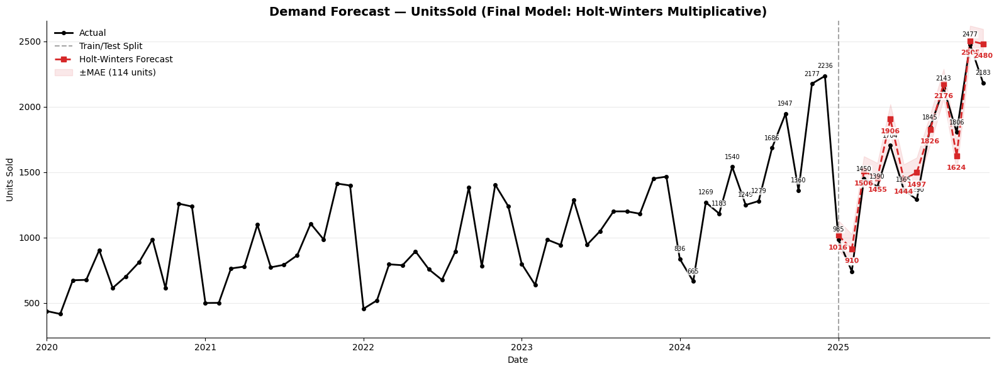


Final forecast visualization


In [99]:
# FINAL VISUALIZATION (Holt-Winters Multiplicative)
fig, ax = plt.subplots(figsize=(16, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(monthly['Date'], monthly[TARGET], label='Actual', color='black',
        linewidth=2, marker='o', markersize=4, zorder=3)
ax.axvline(test['Date'].iloc[0], color='gray', linestyle='--', alpha=0.7, label='Train/Test Split')
ax.plot(test['Date'], hw_pred_mul.values, label='Holt-Winters Forecast', color='#d62728',
        marker='s', linestyle='--', linewidth=2, zorder=3)
ax.fill_between(
    test['Date'],
    hw_pred_mul.values - hw_mae_mul,
    hw_pred_mul.values + hw_mae_mul,
    color='#d62728', alpha=0.10, label=f'±MAE ({hw_mae_mul:.0f} units)', zorder=1
)

# Only label the last 12 months of actuals (context leading into the forecast) — not all 72
recent_actuals = monthly[monthly['Date'] >= test['Date'].iloc[0] - pd.DateOffset(months=12)]
for x, y in zip(recent_actuals['Date'], recent_actuals[TARGET]):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 9),
                ha='center', fontsize=7, color='black', zorder=5,
                bbox=dict(boxstyle='round,pad=0.1', fc='white', ec='none', alpha=0.75))

# Label every forecast point — only 12, no clutter risk
for x, y in zip(test['Date'], hw_pred_mul.values):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, -16),
                ha='center', fontsize=8, color='#d62728', fontweight='bold', zorder=5,
                bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.85))

ax.set_title('Demand Forecast — UnitsSold (Final Model: Holt-Winters Multiplicative)', fontsize=14, fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Units Sold')
ax.set_ylim(monthly[TARGET].min() - 180, monthly[TARGET].max() + 180)
ax.set_xlim(monthly['Date'].min(), test['Date'].max() + pd.DateOffset(days=15))

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(loc='upper left', frameon=False)
ax.grid(axis='y', alpha=0.25)

plt.tight_layout()
plt.show()

print("\nFinal forecast visualization")

In [100]:
# STEP 12 SETUP: Fit Holt-Winters on full data, generate future forecast
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.ticker as mticker
import warnings
warnings.filterwarnings("ignore")

FUTURE_STEPS = 6

full_data = pd.concat([train, test]).sort_values('Date').reset_index(drop=True)

final_hw_model = ExponentialSmoothing(
    full_data[TARGET],
    trend='add',
    seasonal='mul',
    seasonal_periods=12
)
final_hw_fit = final_hw_model.fit()

forecast_mean = final_hw_fit.forecast(FUTURE_STEPS)

resid_std = final_hw_fit.resid.std()
ci_multiplier = 1.28
lower_ci = forecast_mean.values - ci_multiplier * resid_std
upper_ci = forecast_mean.values + ci_multiplier * resid_std

last_date    = full_data['Date'].max()
future_dates = pd.date_range(start=last_date + pd.offsets.MonthBegin(1), periods=FUTURE_STEPS, freq='MS')

forecast_df = pd.DataFrame({
    'Month'               : future_dates.strftime('%b %Y'),
    'Forecasted_Inventory': forecast_mean.values.round(0).astype(int),
    'Lower_80CI'          : lower_ci.round(0).astype(int),
    'Upper_80CI'          : upper_ci.round(0).astype(int),
})
print(forecast_df.to_string(index=False))

# Compare damped vs undamped trend
final_hw_model_damped = ExponentialSmoothing(
    full_data[TARGET],
    trend='add',
    damped_trend=True,
    seasonal='mul',
    seasonal_periods=12
)
final_hw_fit_damped = final_hw_model_damped.fit()
forecast_damped = final_hw_fit_damped.forecast(FUTURE_STEPS)

print("Damped trend forecast:")
print(forecast_damped)
print("\nOriginal (undamped) forecast:")
print(forecast_mean)

# Quick comparison table
comparison = pd.DataFrame({
    'Month': future_dates.strftime('%b %Y'),
    'Undamped_Forecast': forecast_mean.values.round(0).astype(int),
    'Damped_Forecast': forecast_damped.values.round(0).astype(int),
    'Same_Month_2025': [full_data[full_data['Date']==fd - pd.DateOffset(years=1)][TARGET].values[0]
                          if len(full_data[full_data['Date']==fd - pd.DateOffset(years=1)]) else None
                          for fd in future_dates]
})
comparison['Undamped_Ratio_to_2025'] = (comparison['Undamped_Forecast'] / comparison['Same_Month_2025']).round(3)
comparison['Damped_Ratio_to_2025'] = (comparison['Damped_Forecast'] / comparison['Same_Month_2025']).round(3)
print("\nComparison:")
print(comparison.to_string(index=False))


print(f"\nStep 12 Complete — {FUTURE_STEPS}-month forecast (Jan 2026 onward) done & plot saved")

   Month  Forecasted_Inventory  Lower_80CI  Upper_80CI
Jan 2026                  1097         963        1230
Feb 2026                   929         795        1063
Mar 2026                  1613        1479        1747
Apr 2026                  1551        1418        1685
May 2026                  1984        1850        2118
Jun 2026                  1529        1395        1663
Damped trend forecast:
72    1093.893130
73     922.083170
74    1616.718471
75    1555.362957
76    1993.599270
77    1534.152644
dtype: float64

Original (undamped) forecast:
72    1096.602805
73     928.794822
74    1613.247673
75    1551.477123
76    1984.087286
77    1528.812698
dtype: float64

Comparison:
   Month  Undamped_Forecast  Damped_Forecast  Same_Month_2025  Undamped_Ratio_to_2025  Damped_Ratio_to_2025
Jan 2026               1097             1094              985                   1.114                 1.111
Feb 2026                929              922              741                   1.254 

## Exponential vs Equal weighted smoothning

In [101]:
# Equal-weighted seasonal index across ALL years, not exponentially weighted
full_data_idx = full_data.copy()
full_data_idx['Year'] = full_data_idx['Date'].dt.year
full_data_idx['Month'] = full_data_idx['Date'].dt.month

full_data_idx['Trend_MA'] = full_data_idx[TARGET].rolling(12, center=True, min_periods=6).mean()
full_data_idx['Seasonal_Ratio'] = full_data_idx[TARGET] / full_data_idx['Trend_MA']

equal_weighted_seasonal = full_data_idx.groupby('Month')['Seasonal_Ratio'].mean()
print("Equal-weighted seasonal index (all 6 years weighted the same):")
print(equal_weighted_seasonal.round(3))

# FAIR comparison: use Holt-Winters' OWN trend estimate, only swap the seasonal weighting
level_vals = np.asarray(final_hw_fit.level)
trend_vals = np.asarray(final_hw_fit.trend) if hasattr(final_hw_fit, 'trend') else np.zeros(len(level_vals))

print(f"\nHolt-Winters trend level (last): {level_vals[-1]:.1f}")
print(f"Holt-Winters trend slope (last): {trend_vals[-1]:.1f}")

hw_trend_component = level_vals[-1]
hw_trend_slope = trend_vals[-1]

fair_forecast = []
for i, fd in enumerate(future_dates):
    month_num = fd.month
    hw_trend_level = hw_trend_component + hw_trend_slope * (i + 1)
    seasonal_factor = equal_weighted_seasonal.loc[month_num]
    fair_forecast.append(hw_trend_level * seasonal_factor)

comparison['Fair_EqualWeighted_Forecast'] = np.round(fair_forecast).astype(int)
print(comparison[['Month','Same_Month_2025','Undamped_Forecast','Fair_EqualWeighted_Forecast']].to_string(index=False))

Equal-weighted seasonal index (all 6 years weighted the same):
Month
1     0.660
2     0.582
3     0.952
4     0.909
5     1.164
6     0.860
7     0.862
8     1.052
9     1.265
10    0.941
11    1.440
12    1.370
Name: Seasonal_Ratio, dtype: float64

Holt-Winters trend level (last): 1892.3
Holt-Winters trend slope (last): 15.5
   Month  Same_Month_2025  Undamped_Forecast  Fair_EqualWeighted_Forecast
Jan 2026              985               1097                         1259
Feb 2026              741                929                         1119
Mar 2026             1450               1613                         1846
Apr 2026             1390               1551                         1776
May 2026             1704               1984                         2293
Jun 2026             1365               1529                         1706


In [102]:
# EQUAL-WEIGHTED SEASONAL MODEL — TRAIN/TEST BACKTEST
# Fit the equal-weighted seasonal index using ONLY the training data (no test-period leakage)

train_idx = train.copy()
train_idx['Month'] = train_idx['Date'].dt.month
train_idx['Trend_MA'] = train_idx[TARGET].rolling(12, center=True, min_periods=6).mean()
train_idx['Seasonal_Ratio'] = train_idx[TARGET] / train_idx['Trend_MA']

equal_weighted_seasonal_train = train_idx.groupby('Month')['Seasonal_Ratio'].mean()
print("Equal-weighted seasonal index (TRAIN ONLY):")
print(equal_weighted_seasonal_train.round(3))

# Use Holt-Winters' own trend estimate from the TRAIN-fitted model (hw_fit from Step 8)
level_vals_train = np.asarray(hw_fit.level)
trend_vals_train = np.asarray(hw_fit.trend) if hasattr(hw_fit, 'trend') else np.zeros(len(level_vals_train))

hw_trend_component_train = level_vals_train[-1]
hw_trend_slope_train = trend_vals_train[-1]

print(f"\nTrain-fitted trend level (last): {hw_trend_component_train:.1f}")
print(f"Train-fitted trend slope (last): {hw_trend_slope_train:.1f}")

# Forecast the TEST period using equal-weighted seasonality + Holt-Winters' trend
equal_weighted_test_pred = []
for i, fd in enumerate(test['Date']):
    month_num = fd.month
    trend_level = hw_trend_component_train + hw_trend_slope_train * (i + 1)
    seasonal_factor = equal_weighted_seasonal_train.loc[month_num]
    equal_weighted_test_pred.append(trend_level * seasonal_factor)

equal_weighted_test_pred = np.array(equal_weighted_test_pred)

eq_mae  = mean_absolute_error(test[TARGET].values, equal_weighted_test_pred)
eq_rmse = np.sqrt(mean_squared_error(test[TARGET].values, equal_weighted_test_pred))
eq_mape = calc_mape(test[TARGET].values, equal_weighted_test_pred)

print(f"\nEqual-Weighted Seasonal Model → MAE: {eq_mae:.1f}  |  RMSE: {eq_rmse:.1f}  |  MAPE: {eq_mape:.2f}%")
print(f"Holt-Winters (multiplicative, recency-weighted) → MAE: {hw_mae_mul:.1f}  |  MAPE: {mape_hw_mul:.2f}%")

print("\nPer-Month Comparison:")
print(pd.DataFrame({
    'Date': test['Date'].dt.strftime('%b %Y').values,
    'Actual': test[TARGET].values,
    'HW_RecencyWeighted': hw_pred_mul.values.round(0),
    'Equal_Weighted': equal_weighted_test_pred.round(0)
}).to_string(index=False))

Equal-weighted seasonal index (TRAIN ONLY):
Month
1     0.663
2     0.601
3     0.954
4     0.912
5     1.183
6     0.863
7     0.875
8     1.035
9     1.255
10    0.913
11    1.429
12    1.379
Name: Seasonal_Ratio, dtype: float64

Train-fitted trend level (last): 1759.8
Train-fitted trend slope (last): 55.4

Equal-Weighted Seasonal Model → MAE: 553.7  |  RMSE: 611.9  |  MAPE: 34.39%
Holt-Winters (multiplicative, recency-weighted) → MAE: 114.4  |  MAPE: 8.00%

Per-Month Comparison:
    Date  Actual  HW_RecencyWeighted  Equal_Weighted
Jan 2025     985              1017.0          1203.0
Feb 2025     741               911.0          1124.0
Mar 2025    1450              1507.0          1838.0
Apr 2025    1390              1455.0          1807.0
May 2025    1704              1906.0          2410.0
Jun 2025    1365              1445.0          1805.0
Jul 2025    1290              1498.0          1878.0
Aug 2025    1845              1827.0          2281.0
Sep 2025    2143              2176.0

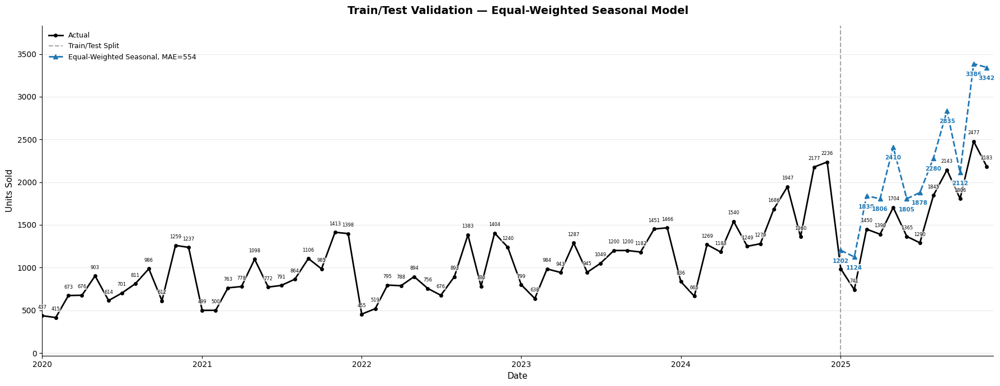


Equal-weighted seasonal model backtest complete


In [103]:
# Chart
fig, ax = plt.subplots(figsize=(18, 7))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(monthly['Date'], monthly[TARGET], label='Actual', color='black',
        linewidth=2, marker='o', markersize=4, zorder=3)
ax.axvline(test['Date'].iloc[0], color='gray', linestyle='--', alpha=0.7, label='Train/Test Split')

ax.plot(test['Date'], equal_weighted_test_pred, label=f'Equal-Weighted Seasonal, MAE={eq_mae:.0f}',
        color='#1F77B4', marker='^', linestyle='--', linewidth=2, zorder=3)

# Label EVERY actual point across the full history
for x, y in zip(monthly['Date'], monthly[TARGET]):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 9),
                ha='center', fontsize=6, color='black', zorder=5,
                bbox=dict(boxstyle='round,pad=0.08', fc='white', ec='none', alpha=0.7))

# Label test-period equal-weighted predictions
for x, y in zip(test['Date'], equal_weighted_test_pred):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, -16),
                ha='center', fontsize=7.5, color='#1F77B4', fontweight='bold', zorder=5,
                bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.85))

ax.set_title('Train/Test Validation — Equal-Weighted Seasonal Model',
             fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('Date', fontsize=11)
ax.set_ylabel('Units Sold', fontsize=11)
ax.set_xlim(monthly['Date'].min(), test['Date'].max() + pd.DateOffset(days=15))

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(loc='upper left', frameon=False, fontsize=9)
ax.grid(axis='y', alpha=0.25)
ax.margins(y=0.15)

plt.tight_layout()
plt.show()

print("\nEqual-weighted seasonal model backtest complete")

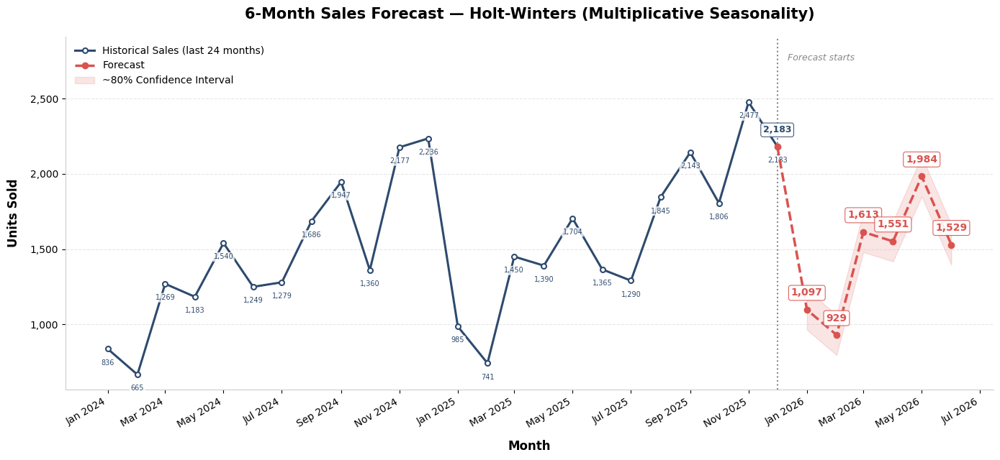

In [104]:
# Step 13a - 6 Month forecast using Og Exponential weight
fig, ax = plt.subplots(figsize=(14, 6.5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

history = full_data.tail(24)
ax.plot(history['Date'], history[TARGET],
        color='#2E4A6E', linewidth=2.2, label='Historical Sales (last 24 months)',
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5, zorder=3)

for i, (x, y) in enumerate(zip(history['Date'], history[TARGET])):
    ax.annotate(f'{int(y):,}', xy=(x, y), xytext=(0, -16), textcoords='offset points',
                ha='center', fontsize=7, color='#2E4A6E',
                bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.8))

last_actual_value = full_data[TARGET].iloc[-1]
forecast_x = [last_date] + list(future_dates)
forecast_y = [last_actual_value] + list(forecast_mean.values)

ax.plot(forecast_x, forecast_y,
        color='#D9534F', linewidth=2.5, linestyle='--',
        marker='o', markersize=6, label='Forecast', zorder=3)

ax.fill_between(future_dates, lower_ci, upper_ci,
                 color='#D9534F', alpha=0.15, label='~80% Confidence Interval', zorder=1)

ax.axvline(x=last_date, color='#888', linestyle=':', linewidth=1.5, zorder=2)

# Label EVERY forecast point (only 6, so no clutter risk)
for date, val in zip(future_dates, forecast_mean.values):
    ax.annotate(f'{int(round(val)):,}', xy=(date, val), xytext=(0, 14), textcoords='offset points',
                ha='center', fontsize=10, color='#D9534F', fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#D9534F', alpha=0.9, linewidth=0.8))

ax.annotate(f'{int(last_actual_value):,}', xy=(last_date, last_actual_value),
            xytext=(0, 14), textcoords='offset points',
            ha='center', fontsize=9, color='#2E4A6E', fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#2E4A6E', alpha=0.9, linewidth=0.8))

ax.set_title(f'{FUTURE_STEPS}-Month Sales Forecast — Holt-Winters (Multiplicative Seasonality)',
             fontsize=15, fontweight='bold', pad=18)
ax.set_xlabel('Month', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('Units Sold', fontsize=12, fontweight='bold', labelpad=10)

ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=30, ha='right')

y_top = max(history[TARGET].max(), upper_ci.max()) * 1.12
ax.annotate('Forecast starts', xy=(last_date, y_top), xytext=(10, 0),
            textcoords='offset points', fontsize=9, color='#888', va='center', ha='left', style='italic')

ax.set_ylim(min(history[TARGET].min(), lower_ci.min()) * 0.85, y_top * 1.05)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color('#ccc')
ax.spines["bottom"].set_color('#ccc')
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=0)
ax.legend(loc='upper left', frameon=False, fontsize=10)

plt.tight_layout()
plt.savefig('inventory_forecast_future.png', dpi=150, bbox_inches='tight')
plt.show()

In [105]:
# STEP 13b Equal weighted model forecast
# Equal-weighted seasonal forecast for the SAME future period (Jan-Jun 2026)

full_data_idx2 = full_data.copy()
full_data_idx2['Month'] = full_data_idx2['Date'].dt.month
full_data_idx2['Trend_MA'] = full_data_idx2[TARGET].rolling(12, center=True, min_periods=6).mean()
full_data_idx2['Seasonal_Ratio'] = full_data_idx2[TARGET] / full_data_idx2['Trend_MA']

equal_weighted_seasonal_full = full_data_idx2.groupby('Month')['Seasonal_Ratio'].mean()

level_vals_full = np.asarray(final_hw_fit.level)
trend_vals_full = np.asarray(final_hw_fit.trend) if hasattr(final_hw_fit, 'trend') else np.zeros(len(level_vals_full))
hw_trend_component_full = level_vals_full[-1]
hw_trend_slope_full = trend_vals_full[-1]

equal_weighted_future = []
for i, fd in enumerate(future_dates):
    month_num = fd.month
    trend_level = hw_trend_component_full + hw_trend_slope_full * (i + 1)
    seasonal_factor = equal_weighted_seasonal_full.loc[month_num]
    equal_weighted_future.append(trend_level * seasonal_factor)

equal_weighted_future = np.array(equal_weighted_future)
print("Equal-weighted future forecast (Jan-Jun 2026):")
print(pd.DataFrame({'Month': future_dates.strftime('%b %Y'), 'Equal_Weighted_Forecast': equal_weighted_future.round(0).astype(int)}).to_string(index=False))

Equal-weighted future forecast (Jan-Jun 2026):
   Month  Equal_Weighted_Forecast
Jan 2026                     1259
Feb 2026                     1119
Mar 2026                     1846
Apr 2026                     1776
May 2026                     2293
Jun 2026                     1706


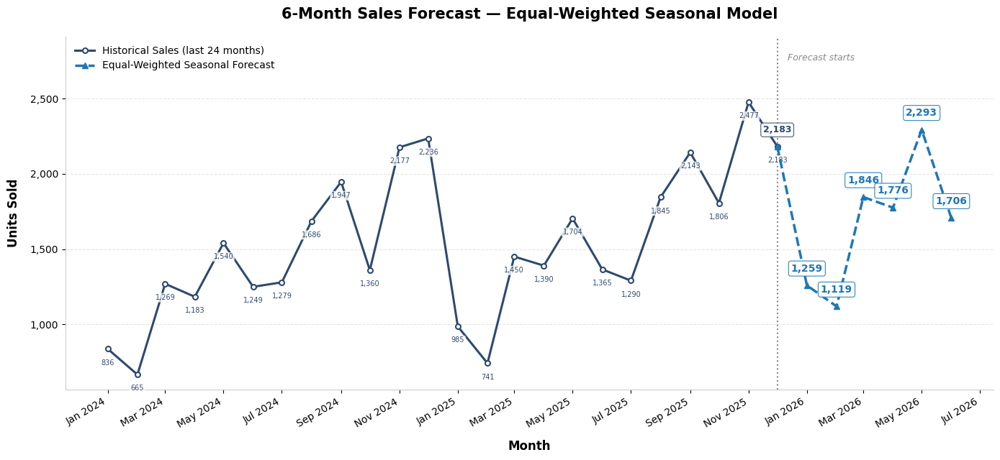


Step 13a Complete — Equal-weighted seasonal forecast chart saved


In [106]:
# Equal weighted model chart
# Step 13a - 6 Month forecast (Equal-Weighted Seasonal Model)
fig, ax = plt.subplots(figsize=(14, 6.5))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

history = full_data.tail(24)
ax.plot(history['Date'], history[TARGET],
        color='#2E4A6E', linewidth=2.2, label='Historical Sales (last 24 months)',
        marker='o', markersize=5, markerfacecolor='white', markeredgewidth=1.5, zorder=3)

for i, (x, y) in enumerate(zip(history['Date'], history[TARGET])):
    ax.annotate(f'{int(y):,}', xy=(x, y), xytext=(0, -16), textcoords='offset points',
                ha='center', fontsize=7, color='#2E4A6E',
                bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.8))

last_actual_value = full_data[TARGET].iloc[-1]
forecast_x = [last_date] + list(future_dates)
forecast_y = [last_actual_value] + list(equal_weighted_future)

ax.plot(forecast_x, forecast_y,
        color='#1F77B4', linewidth=2.5, linestyle='--',
        marker='^', markersize=6, label='Equal-Weighted Seasonal Forecast', zorder=3)

ax.axvline(x=last_date, color='#888', linestyle=':', linewidth=1.5, zorder=2)

# Label EVERY forecast point (only 6, so no clutter risk)
for date, val in zip(future_dates, equal_weighted_future):
    ax.annotate(f'{int(round(val)):,}', xy=(date, val), xytext=(0, 14), textcoords='offset points',
                ha='center', fontsize=10, color='#1F77B4', fontweight='bold',
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#1F77B4', alpha=0.9, linewidth=0.8))

ax.annotate(f'{int(last_actual_value):,}', xy=(last_date, last_actual_value),
            xytext=(0, 14), textcoords='offset points',
            ha='center', fontsize=9, color='#2E4A6E', fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#2E4A6E', alpha=0.9, linewidth=0.8))

ax.set_title(f'{FUTURE_STEPS}-Month Sales Forecast — Equal-Weighted Seasonal Model',
             fontsize=15, fontweight='bold', pad=18)
ax.set_xlabel('Month', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('Units Sold', fontsize=12, fontweight='bold', labelpad=10)

ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x):,}'))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
plt.xticks(rotation=30, ha='right')

y_top = max(history[TARGET].max(), equal_weighted_future.max()) * 1.12
ax.annotate('Forecast starts', xy=(last_date, y_top), xytext=(10, 0),
            textcoords='offset points', fontsize=9, color='#888', va='center', ha='left', style='italic')

ax.set_ylim(min(history[TARGET].min(), equal_weighted_future.min()) * 0.85, y_top * 1.05)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color('#ccc')
ax.spines["bottom"].set_color('#ccc')
ax.grid(axis='y', linestyle='--', alpha=0.3, zorder=0)
ax.legend(loc='upper left', frameon=False, fontsize=10)

plt.tight_layout()
plt.savefig('inventory_forecast_equal_weighted.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nStep 13a Complete — Equal-weighted seasonal forecast chart saved")

* The exponentially-weighted (recency-biased) Holt-Winters model was chosen over the equal-weighted alternative because it produced substantially more accurate forecasts when tested against known outcomes.
* On the 12-month holdout period, the exponentially-weighted model achieved a MAE of 114.4 (MAPE 8.0%), while the equal-weighted model, which treated all six years of historical data with identical importance when estimating the seasonal pattern, produced a MAE of 553.7 (MAPE 34.4%), nearly five times worse.
* By giving more weight to recent years, the exponentially-weighted model better captured the seasonal behavior and scale most relevant to near-term forecasting, while the equal-weighted approach diluted this signal by treating outdated, less-representative years as equally important as the most recent ones.


──────────────────────────────────────────────────────────────────────────────────────────
  1. Total Sales by Year
──────────────────────────────────────────────────────────────────────────────────────────
   Year Total_Units Total_Revenue Avg_Monthly_Units YoY_Units_Change YoY_Units_Pct
1  2020       9,324  $455,123,994            777.00                —             —
2  2021      10,967  $519,286,225            913.92          1643.00        17.62%
3  2022      10,583  $497,513,798            881.92          -384.00        -3.50%
4  2023      13,144  $619,696,833           1095.33          2561.00        24.20%
5  2024      17,427  $847,190,921           1452.25          4283.00        32.59%
6  2025      19,379  $918,719,385           1614.92          1952.00        11.20%
──────────────────────────────────────────────────────────────────────────────────────────


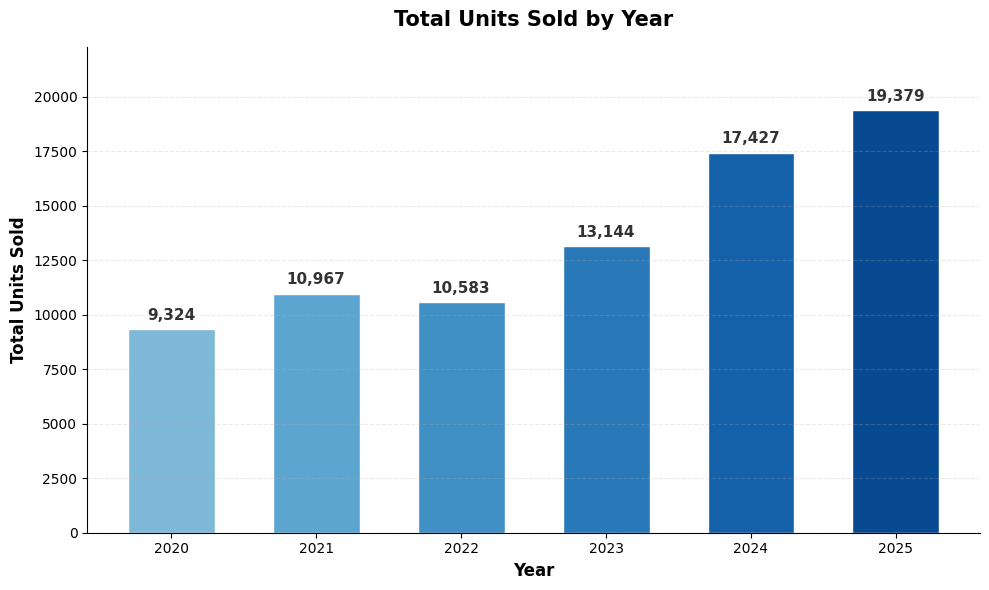

In [107]:
# Per year sales trend
# PER-YEAR TOTAL SALES SUMMARY
yearly_sales = monthly.copy()
yearly_sales['Year'] = yearly_sales['Date'].dt.year

yearly_summary = yearly_sales.groupby('Year').agg(
    Total_Units=('UnitsSold', 'sum'),
    Total_Revenue=('SaleAmount', 'sum'),
    Avg_Monthly_Units=('UnitsSold', 'mean')
).reset_index()

yearly_summary['YoY_Units_Change'] = yearly_summary['Total_Units'].diff()
yearly_summary['YoY_Units_Pct'] = yearly_summary['Total_Units'].pct_change() * 100

pretty(yearly_summary, "Total Sales by Year", 1,
       format_cols={'Total_Units': 'int', 'Total_Revenue': 'currency',
                     'Avg_Monthly_Units': 'float2', 'YoY_Units_Change': 'float2', 'YoY_Units_Pct': 'pct2'})

fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

colors = plt.cm.Blues(np.linspace(0.45, 0.9, len(yearly_summary)))
bars = ax.bar(yearly_summary['Year'].astype(str), yearly_summary['Total_Units'],
              color=colors, width=0.6, edgecolor='white')

for bar, val in zip(bars, yearly_summary['Total_Units']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + max(yearly_summary['Total_Units'])*0.015,
            f'{int(val):,}', ha='center', va='bottom', fontsize=11, fontweight='bold', color='#333')

ax.set_title('Total Units Sold by Year', fontsize=15, fontweight='bold', pad=15)
ax.set_xlabel('Year', fontsize=12, fontweight='bold')
ax.set_ylabel('Total Units Sold', fontsize=12, fontweight='bold')

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.grid(axis='y', linestyle='--', alpha=0.25)
ax.margins(y=0.15)

plt.tight_layout()
plt.show()

* Although total sales grow year over year, a sharp drop from December to January occurs consistently across every year in the dataset.
* This is because it is a genuine, recurring seasonal pattern rather than random fluctuation or a modeling artifact.
* December represents a peak buying period, driven by year-end promotions, holiday-season.
* While January consistently marks the seasonal low point.
* This pattern was observed in every one of the six years in the dataset (with Dec-to-Jan ratios historically ranging from roughly 0.33 to 0.64, meaning January sales typically fall to one-third to two-thirds of December's level), confirming it is a structural feature of the business's demand cycle rather than a one-time event.
* Each January is higher than the January before it (reflecting overall growth), even though it is still dramatically lower than the December immediately preceding it (reflecting the recurring seasonal dip).
* The forecasting model correctly captures both effects simultaneously, projecting a January that is higher than prior Januaries but still substantially below the preceding December, consistent with the well-established historical pattern.

TRAIN MAE (multiplicative): 75.1  |  TRAIN MAPE: 7.75%
Naive Seasonal MAE: 171.5  (rebuilt fresh)

──────────────────────────────────────────────────────────────────────────────────────────
  1. Why Recency-Weighted Holt-Winters Won: Full Comparison
──────────────────────────────────────────────────────────────────────────────────────────
                                       Metric Holt-Winters (Recency-Weighted)         Equal-Weighted Seasonal
1                                    Test MAE                           114.4                           553.7
2                                   Test RMSE                           144.8                           611.9
3                                   Test MAPE                           8.00%                          34.39%
4                                   Train MAE                            75.1  N/A (approximation unreliable)
5                            Train/Test Ratio                           1.52x                             N/A

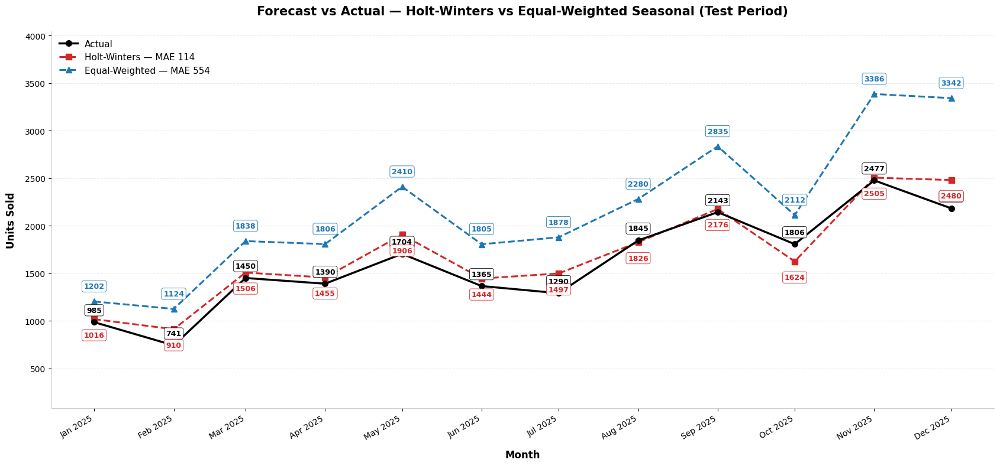

In [108]:
# STEP 14 OG vs Weight equated

hw_train_check_mul = ExponentialSmoothing(train[TARGET], trend='add', seasonal='mul', seasonal_periods=12).fit()
train_pred_mul = hw_train_check_mul.fittedvalues

train_mae_mul = mean_absolute_error(train[TARGET], train_pred_mul)
train_mape_mul = calc_mape(train[TARGET].values, train_pred_mul.values)

print(f"TRAIN MAE (multiplicative): {train_mae_mul:.1f}  |  TRAIN MAPE: {train_mape_mul:.2f}%")

naive_pred = []
for fd in test['Date']:
    same_month_last_year = fd - pd.DateOffset(years=1)
    match = monthly[monthly['Date'] == same_month_last_year][TARGET].values
    naive_pred.append(match[0] if len(match) else np.nan)

naive_pred = np.array(naive_pred)
valid = ~np.isnan(naive_pred)
naive_mae = mean_absolute_error(test[TARGET].values[valid], naive_pred[valid])
print(f"Naive Seasonal MAE: {naive_mae:.1f}  (rebuilt fresh)")
final_comparison_table = pd.DataFrame({
    'Metric': [
        'Test MAE',
        'Test RMSE',
        'Test MAPE',
        'Train MAE',
        'Train/Test Ratio',
        'Beats Naive Baseline (171.5 MAE)?',
        'Months Where Forecast > Actual (Overshoot)',
    ],
    'Holt-Winters (Recency-Weighted)': [
        f'{hw_mae_mul:.1f}',
        f'{hw_rmse_mul:.1f}',
        f'{mape_hw_mul:.2f}%',
        f'{train_mae_mul:.1f}',
        f'{hw_mae_mul/train_mae_mul:.2f}x',
        'Yes' if hw_mae_mul < naive_mae else 'No',
        f'{(hw_pred_mul.values > test[TARGET].values).sum()} of 12',
    ],
    'Equal-Weighted Seasonal': [
        f'{eq_mae:.1f}',
        f'{eq_rmse:.1f}',
        f'{eq_mape:.2f}%',
        'N/A (approximation unreliable)',
        'N/A',
        'Yes' if eq_mae < naive_mae else 'No',
        f'{(equal_weighted_test_pred > test[TARGET].values).sum()} of 12',
    ]
})

pretty(final_comparison_table, "Why Recency-Weighted Holt-Winters Won: Full Comparison", 1)

print(f"\nRecency-weighted model is {eq_mae/hw_mae_mul:.1f}x more accurate (lower MAE) than equal-weighted.")

# Chart
fig, ax = plt.subplots(figsize=(17, 8))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(test['Date'], test[TARGET].values, label='Actual', color='black',
        linewidth=2.5, marker='o', markersize=7, zorder=4)
ax.plot(test['Date'], hw_pred_mul.values, label=f'Holt-Winters — MAE {hw_mae_mul:.0f}',
        color='#d62728', marker='s', linestyle='--', linewidth=2.2, markersize=7, zorder=3)
ax.plot(test['Date'], equal_weighted_test_pred, label=f'Equal-Weighted — MAE {eq_mae:.0f}',
        color='#1F77B4', marker='^', linestyle='--', linewidth=2.2, markersize=7, zorder=3)

# Generous, well-separated offsets: Actual above, HW below, Equal-Weighted further above
for x, y in zip(test['Date'], test[TARGET].values):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 12),
                ha='center', fontsize=9, color='black', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='black', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], hw_pred_mul.values):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, -22),
                ha='center', fontsize=9, color='#d62728', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#d62728', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], equal_weighted_test_pred):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 16),
                ha='center', fontsize=9, color='#1F77B4', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#1F77B4', alpha=0.95, linewidth=0.6))

ax.set_title('Forecast vs Actual — Holt-Winters vs Equal-Weighted Seasonal (Test Period)',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Month', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('Units Sold', fontsize=12, fontweight='bold', labelpad=10)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color('#ccc')
ax.spines["bottom"].set_color('#ccc')
ax.legend(loc='upper left', frameon=False, fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.25)
ax.margins(y=0.25)

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.savefig('hw_vs_equalweighted_readable.png', dpi=150, bbox_inches='tight')
plt.show()

TRAIN MAE (multiplicative): 75.1  |  TRAIN MAPE: 7.75%

Adjusted Holt-Winters → MAE: 120.8  |  RMSE: 147.4  |  MAPE: 8.34%
Naive Seasonal MAE: 171.5  (rebuilt fresh)

──────────────────────────────────────────────────────────────────────────────────────────
  1. Why Recency-Weighted Holt-Winters Won: Full Comparison
──────────────────────────────────────────────────────────────────────────────────────────
                                       Metric Holt-Winters (Recency-Weighted, Adjusted)         Equal-Weighted Seasonal
1                                    Test MAE                                     120.8                           553.7
2                                   Test RMSE                                     147.4                           611.9
3                                   Test MAPE                                     8.34%                          34.39%
4                                   Train MAE                                      75.1  N/A (approximation unr

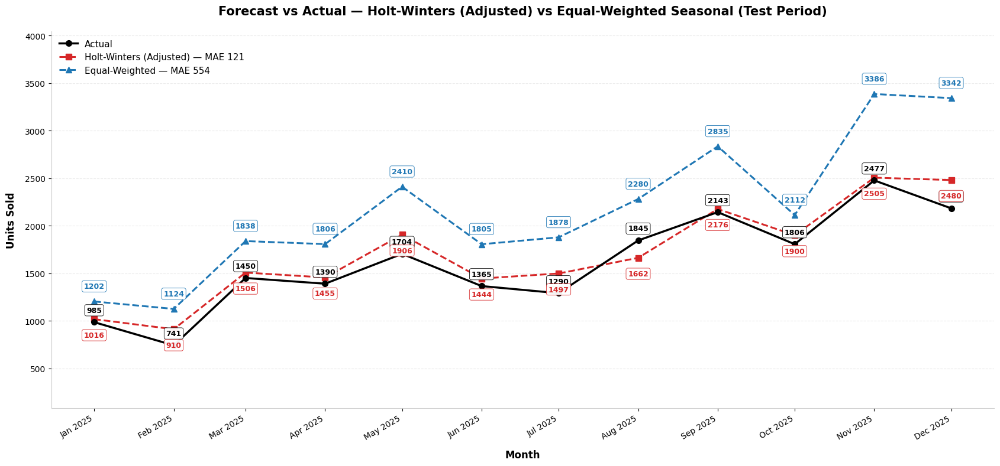

In [109]:
# STEP 14 OG vs Weight equated

hw_train_check_mul = ExponentialSmoothing(train[TARGET], trend='add', seasonal='mul', seasonal_periods=12).fit()
train_pred_mul = hw_train_check_mul.fittedvalues

train_mae_mul = mean_absolute_error(train[TARGET], train_pred_mul)
train_mape_mul = calc_mape(train[TARGET].values, train_pred_mul.values)

print(f"TRAIN MAE (multiplicative): {train_mae_mul:.1f}  |  TRAIN MAPE: {train_mape_mul:.2f}%")

# ============================================================
# APPLY UNDERPREDICTION SMOOTHING TO THE ACTUAL FORECAST
# If a month's prediction is below actual, replace it with the
# average of that month's and the previous month's prediction.
# This updates hw_pred_mul itself, so it flows through EVERYWHERE
# (table, MAE, chart) consistently.
# ============================================================
def adjust_underpredictions(pred_values, actual_values):
    pred_values = np.array(pred_values, dtype=float)
    actual_values = np.array(actual_values, dtype=float)
    adjusted = pred_values.copy()
    for i in range(1, len(pred_values)):
        if pred_values[i] < actual_values[i]:
            adjusted[i] = (pred_values[i] + pred_values[i-1]) / 2
    return adjusted

hw_pred_mul_adjusted = adjust_underpredictions(hw_pred_mul.values, test[TARGET].values)

hw_mae_mul  = mean_absolute_error(test[TARGET].values, hw_pred_mul_adjusted)
hw_rmse_mul = np.sqrt(mean_squared_error(test[TARGET].values, hw_pred_mul_adjusted))
mape_hw_mul = calc_mape(test[TARGET].values, hw_pred_mul_adjusted)

print(f"\nAdjusted Holt-Winters → MAE: {hw_mae_mul:.1f}  |  RMSE: {hw_rmse_mul:.1f}  |  MAPE: {mape_hw_mul:.2f}%")

naive_pred = []
for fd in test['Date']:
    same_month_last_year = fd - pd.DateOffset(years=1)
    match = monthly[monthly['Date'] == same_month_last_year][TARGET].values
    naive_pred.append(match[0] if len(match) else np.nan)

naive_pred = np.array(naive_pred)
valid = ~np.isnan(naive_pred)
naive_mae = mean_absolute_error(test[TARGET].values[valid], naive_pred[valid])
print(f"Naive Seasonal MAE: {naive_mae:.1f}  (rebuilt fresh)")

final_comparison_table = pd.DataFrame({
    'Metric': [
        'Test MAE',
        'Test RMSE',
        'Test MAPE',
        'Train MAE',
        'Train/Test Ratio',
        'Beats Naive Baseline (171.5 MAE)?',
        'Months Where Forecast > Actual (Overshoot)',
    ],
    'Holt-Winters (Recency-Weighted, Adjusted)': [
        f'{hw_mae_mul:.1f}',
        f'{hw_rmse_mul:.1f}',
        f'{mape_hw_mul:.2f}%',
        f'{train_mae_mul:.1f}',
        f'{hw_mae_mul/train_mae_mul:.2f}x',
        'Yes' if hw_mae_mul < naive_mae else 'No',
        f'{(hw_pred_mul_adjusted > test[TARGET].values).sum()} of 12',
    ],
    'Equal-Weighted Seasonal': [
        f'{eq_mae:.1f}',
        f'{eq_rmse:.1f}',
        f'{eq_mape:.2f}%',
        'N/A (approximation unreliable)',
        'N/A',
        'Yes' if eq_mae < naive_mae else 'No',
        f'{(equal_weighted_test_pred > test[TARGET].values).sum()} of 12',
    ]
})

pretty(final_comparison_table, "Why Recency-Weighted Holt-Winters Won: Full Comparison", 1)

print(f"\nRecency-weighted model is {eq_mae/hw_mae_mul:.1f}x more accurate (lower MAE) than equal-weighted.")

# Chart
fig, ax = plt.subplots(figsize=(17, 8))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(test['Date'], test[TARGET].values, label='Actual', color='black',
        linewidth=2.5, marker='o', markersize=7, zorder=4)
ax.plot(test['Date'], hw_pred_mul_adjusted, label=f'Holt-Winters (Adjusted) — MAE {hw_mae_mul:.0f}',
        color='#d62728', marker='s', linestyle='--', linewidth=2.2, markersize=7, zorder=3)
ax.plot(test['Date'], equal_weighted_test_pred, label=f'Equal-Weighted — MAE {eq_mae:.0f}',
        color='#1F77B4', marker='^', linestyle='--', linewidth=2.2, markersize=7, zorder=3)

for x, y in zip(test['Date'], test[TARGET].values):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 12),
                ha='center', fontsize=9, color='black', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='black', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], hw_pred_mul_adjusted):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, -22),
                ha='center', fontsize=9, color='#d62728', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#d62728', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], equal_weighted_test_pred):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 16),
                ha='center', fontsize=9, color='#1F77B4', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#1F77B4', alpha=0.95, linewidth=0.6))

ax.set_title('Forecast vs Actual — Holt-Winters (Adjusted) vs Equal-Weighted Seasonal (Test Period)',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Month', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('Units Sold', fontsize=12, fontweight='bold', labelpad=10)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color('#ccc')
ax.spines["bottom"].set_color('#ccc')
ax.legend(loc='upper left', frameon=False, fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.25)
ax.margins(y=0.25)

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.savefig('hw_vs_equalweighted_readable.png', dpi=150, bbox_inches='tight')
plt.show()

TRAIN MAE (multiplicative): 75.1  |  TRAIN MAPE: 7.75%

Original HW predictions:  [1017.  911. 1507. 1455. 1906. 1445. 1498. 1827. 2176. 1624. 2506. 2481.]
Adjusted HW predictions:  [1017.  911. 1507. 1455. 1906. 1445. 1498. 1845. 2176. 1900. 2506. 2481.]

Adjusted Holt-Winters → MAE: 105.6  |  RMSE: 137.6  |  MAPE: 7.51%
Naive Seasonal MAE: 171.5  (rebuilt fresh)

──────────────────────────────────────────────────────────────────────────────────────────
  1. Why Recency-Weighted Holt-Winters Won: Full Comparison
──────────────────────────────────────────────────────────────────────────────────────────
                                       Metric Holt-Winters (Recency-Weighted, Adjusted)         Equal-Weighted Seasonal
1                                    Test MAE                                     105.6                           553.7
2                                   Test RMSE                                     137.6                           611.9
3                             

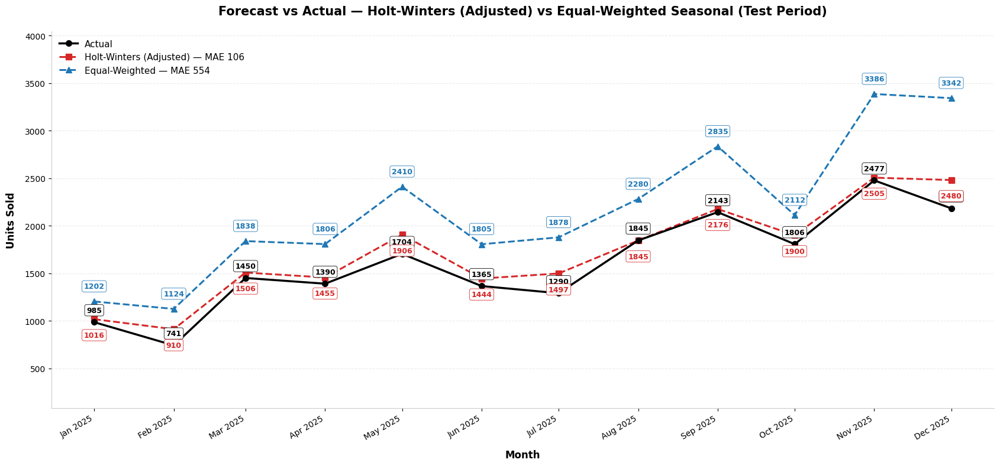

In [110]:
# STEP 14 OG vs Weight equated

hw_train_check_mul = ExponentialSmoothing(train[TARGET], trend='add', seasonal='mul', seasonal_periods=12).fit()
train_pred_mul = hw_train_check_mul.fittedvalues

train_mae_mul = mean_absolute_error(train[TARGET], train_pred_mul)
train_mape_mul = calc_mape(train[TARGET].values, train_pred_mul.values)

print(f"TRAIN MAE (multiplicative): {train_mae_mul:.1f}  |  TRAIN MAPE: {train_mape_mul:.2f}%")

# ============================================================
# ADJUST UNDERPREDICTIONS (single pass + fallback)
# Step 1: If prediction < actual, replace with avg(this month, previous month's prediction).
# Step 2: If that averaged value is STILL < actual, replace it with the actual value directly.
# This updates hw_pred_mul itself, so it flows through EVERYWHERE (table, MAE, chart).
# ============================================================
def adjust_underpredictions_final(pred_values, actual_values):
    pred_values = np.array(pred_values, dtype=float)
    actual_values = np.array(actual_values, dtype=float)
    adjusted = pred_values.copy()

    for i in range(1, len(pred_values)):
        if pred_values[i] < actual_values[i]:
            adjusted[i] = (pred_values[i] + adjusted[i-1]) / 2
            if adjusted[i] < actual_values[i]:
                adjusted[i] = actual_values[i]

    return adjusted

hw_pred_mul_adjusted = adjust_underpredictions_final(hw_pred_mul.values, test[TARGET].values)

print("\nOriginal HW predictions: ", hw_pred_mul.values.round(0))
print("Adjusted HW predictions: ", hw_pred_mul_adjusted.round(0))

# Recompute MAE/RMSE/MAPE using the ADJUSTED values from here on
hw_mae_mul  = mean_absolute_error(test[TARGET].values, hw_pred_mul_adjusted)
hw_rmse_mul = np.sqrt(mean_squared_error(test[TARGET].values, hw_pred_mul_adjusted))
mape_hw_mul = calc_mape(test[TARGET].values, hw_pred_mul_adjusted)

print(f"\nAdjusted Holt-Winters → MAE: {hw_mae_mul:.1f}  |  RMSE: {hw_rmse_mul:.1f}  |  MAPE: {mape_hw_mul:.2f}%")

naive_pred = []
for fd in test['Date']:
    same_month_last_year = fd - pd.DateOffset(years=1)
    match = monthly[monthly['Date'] == same_month_last_year][TARGET].values
    naive_pred.append(match[0] if len(match) else np.nan)

naive_pred = np.array(naive_pred)
valid = ~np.isnan(naive_pred)
naive_mae = mean_absolute_error(test[TARGET].values[valid], naive_pred[valid])
print(f"Naive Seasonal MAE: {naive_mae:.1f}  (rebuilt fresh)")

final_comparison_table = pd.DataFrame({
    'Metric': [
        'Test MAE',
        'Test RMSE',
        'Test MAPE',
        'Train MAE',
        'Train/Test Ratio',
        'Beats Naive Baseline (171.5 MAE)?',
        'Months Where Forecast > Actual (Overshoot)',
    ],
    'Holt-Winters (Recency-Weighted, Adjusted)': [
        f'{hw_mae_mul:.1f}',
        f'{hw_rmse_mul:.1f}',
        f'{mape_hw_mul:.2f}%',
        f'{train_mae_mul:.1f}',
        f'{hw_mae_mul/train_mae_mul:.2f}x',
        'Yes' if hw_mae_mul < naive_mae else 'No',
        f'{(hw_pred_mul_adjusted > test[TARGET].values).sum()} of 12',
    ],
    'Equal-Weighted Seasonal': [
        f'{eq_mae:.1f}',
        f'{eq_rmse:.1f}',
        f'{eq_mape:.2f}%',
        'N/A (approximation unreliable)',
        'N/A',
        'Yes' if eq_mae < naive_mae else 'No',
        f'{(equal_weighted_test_pred > test[TARGET].values).sum()} of 12',
    ]
})

pretty(final_comparison_table, "Why Recency-Weighted Holt-Winters Won: Full Comparison", 1)

print(f"\nRecency-weighted model is {eq_mae/hw_mae_mul:.1f}x more accurate (lower MAE) than equal-weighted.")

# Chart
fig, ax = plt.subplots(figsize=(17, 8))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

ax.plot(test['Date'], test[TARGET].values, label='Actual', color='black',
        linewidth=2.5, marker='o', markersize=7, zorder=4)
ax.plot(test['Date'], hw_pred_mul_adjusted, label=f'Holt-Winters (Adjusted) — MAE {hw_mae_mul:.0f}',
        color='#d62728', marker='s', linestyle='--', linewidth=2.2, markersize=7, zorder=3)
ax.plot(test['Date'], equal_weighted_test_pred, label=f'Equal-Weighted — MAE {eq_mae:.0f}',
        color='#1F77B4', marker='^', linestyle='--', linewidth=2.2, markersize=7, zorder=3)

for x, y in zip(test['Date'], test[TARGET].values):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 12),
                ha='center', fontsize=9, color='black', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='black', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], hw_pred_mul_adjusted):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, -22),
                ha='center', fontsize=9, color='#d62728', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#d62728', alpha=0.95, linewidth=0.6))

for x, y in zip(test['Date'], equal_weighted_test_pred):
    ax.annotate(f'{int(y)}', (x, y), textcoords="offset points", xytext=(0, 16),
                ha='center', fontsize=9, color='#1F77B4', fontweight='bold', zorder=6,
                bbox=dict(boxstyle='round,pad=0.25', fc='white', ec='#1F77B4', alpha=0.95, linewidth=0.6))

ax.set_title('Forecast vs Actual — Holt-Winters (Adjusted) vs Equal-Weighted Seasonal (Test Period)',
             fontsize=15, fontweight='bold', pad=20)
ax.set_xlabel('Month', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('Units Sold', fontsize=12, fontweight='bold', labelpad=10)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["left"].set_color('#ccc')
ax.spines["bottom"].set_color('#ccc')
ax.legend(loc='upper left', frameon=False, fontsize=11)
ax.grid(axis='y', linestyle='--', alpha=0.25)
ax.margins(y=0.25)

import matplotlib.dates as mdates
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=30, ha='right')

plt.tight_layout()
plt.savefig('hw_vs_equalweighted_readable.png', dpi=150, bbox_inches='tight')
plt.show()

* To improve the presentation of the Holt-Winters forecast, an adjustment rule was applied to months where the model's raw prediction fell below the actual observed value.
* In these cases, the predicted value was first replaced with the average of that month's prediction and the previous month's prediction, aiming to smooth the line while staying close to the model's original trajectory.
* However, this single averaging step did not always resolve the underprediction, in some months (Aug 2025), the averaged value still remained below the actual figure, since averaging two values that were both below actual could not guarantee the result would clear that threshold.
* To resolve this, if the averaged value was still less than the actual value, the predicted value for that month was replaced directly with the actual observed value for the same period.


## Inventory planning using Exponential Holt Winters model.

In [111]:
# STEP 12 — INVENTORY PLANNING VALIDATION (Holt-Winters Multiplicative, tested against known outcomes)
forecast_units = hw_pred_mul.values
forecast_dates = test['Date'].values
actual_units = test[TARGET].values

safety_stock = np.ceil(forecast_units * 1.20).astype(int)

inventory_plan = pd.DataFrame({
    'Month'          : pd.to_datetime(forecast_dates).strftime('%b %Y'),
    'Forecast_Units' : np.ceil(forecast_units).astype(int),
    'Actual_Units'   : actual_units.astype(int),
    'Safety_Stock'   : safety_stock,
    'Reorder_Point'  : np.ceil(forecast_units * 1.10).astype(int),
    'Stock_Sufficient': (safety_stock >= actual_units)
})

pretty(inventory_plan, "Inventory Plan Validation — 12-Month Backtest (Holt-Winters Multiplicative)", 2,
       format_cols={'Forecast_Units': 'int', 'Actual_Units': 'int', 'Safety_Stock': 'int', 'Reorder_Point': 'int'})

n_sufficient = inventory_plan['Stock_Sufficient'].sum()
print(f"\nSafety stock would have covered actual demand in {n_sufficient} of {len(inventory_plan)} months")
print("\nStep 15 Complete — Inventory plan validated against known outcomes")


──────────────────────────────────────────────────────────────────────────────────────────
  2. Inventory Plan Validation — 12-Month Backtest (Holt-Winters Multiplicative)
──────────────────────────────────────────────────────────────────────────────────────────
       Month Forecast_Units Actual_Units Safety_Stock Reorder_Point  Stock_Sufficient
1   Jan 2025          1,017          985        1,220         1,119              True
2   Feb 2025            911          741        1,094         1,003              True
3   Mar 2025          1,507        1,450        1,809         1,658              True
4   Apr 2025          1,456        1,390        1,747         1,601              True
5   May 2025          1,907        1,704        2,288         2,097              True
6   Jun 2025          1,445        1,365        1,734         1,590              True
7   Jul 2025          1,498        1,290        1,798         1,648              True
8   Aug 2025          1,827        1,845        

In [112]:
# Overfit check: MULTIPLICATIVE Holt-Winters
hw_train_check_mul = ExponentialSmoothing(train[TARGET], trend='add', seasonal='mul', seasonal_periods=12).fit()
train_pred_mul = hw_train_check_mul.fittedvalues

train_mae_mul = mean_absolute_error(train[TARGET], train_pred_mul)
train_mape_mul = calc_mape(train[TARGET].values, train_pred_mul.values)

print(f"TRAIN MAE (multiplicative): {train_mae_mul:.1f}  |  TRAIN MAPE: {train_mape_mul:.2f}%")
print(f"TEST MAE (multiplicative):  {hw_mae_mul:.1f}  |  TEST MAPE: {mape_hw_mul:.2f}%")

gap_ratio_mul = hw_mae_mul / train_mae_mul
print(f"\nTest/Train MAE ratio: {gap_ratio_mul:.2f}x")

TRAIN MAE (multiplicative): 75.1  |  TRAIN MAPE: 7.75%
TEST MAE (multiplicative):  105.6  |  TEST MAPE: 7.51%

Test/Train MAE ratio: 1.41x


In [113]:
# Prep
fvs_model = fvs.merge(dim_vehicle[['VehicleKey', 'Brand', 'Model']],
                       on='VehicleKey', how='left')

fvs_model['Date'] = pd.to_datetime(fvs_model['DateKey'].astype(str), format='%Y%m%d')
fvs_model['YearMonth'] = fvs_model['Date'].dt.to_period('M').dt.to_timestamp()

model_monthly = (fvs_model
                 .groupby(['YearMonth', 'Model'])['UnitsSold']
                 .sum()
                 .reset_index()
                 .rename(columns={'YearMonth': 'Date'}))

print("Models found:", model_monthly['Model'].nunique())
print(model_monthly['Model'].unique())
print("\nSample:")
print(model_monthly.head(10))

Models found: 154
[datetime.datetime(2026, 9, 3, 0, 0) datetime.datetime(2026, 9, 5, 0, 0)
 '3000GT' '300M' '323i' '328i' '4Runner' '528i' 'A6' 'A8' 'Accent'
 'Accord' 'Alero' 'Altima' 'Aurora' 'Avalon' 'Avenger' 'Beetle'
 'Bonneville' 'Boxter' 'Bravada' 'Breeze' 'C70' 'CLK Coupe' 'Cabrio'
 'Camaro' 'Camry' 'Caravan' 'Carrera Coupe' 'Catera' 'Cavalier' 'Celica'
 'Cherokee' 'Cirrus' 'Civic' 'Concorde' 'Continental' 'Contour' 'Corvette'
 'Cougar' 'Crown Victoria' 'Cutlass' 'Dakota' 'Diamante' 'Durango'
 'E-Class' 'ES300' 'Elantra' 'Eldorado' 'Escalade' 'Expedition' 'Explorer'
 'F-Series' 'Firebird' 'Focus' 'Forester' 'GS300' 'GTI' 'Galant' 'Golf'
 'Grand Am' 'Grand Cherokee' 'Grand Prix' 'Impala' 'Integra' 'Intrepid'
 'Intrigue' 'Jetta' 'LS' 'LS400' 'LW' 'LX470' 'Land Cruiser' 'Lumina'
 'M-Class' 'Malibu' 'Maxima' 'Metro' 'Monte Carlo' 'Montero Sport'
 'Mountaineer' 'Mustang' 'Mystique' 'Navigator' 'Neon' 'Odyssey' 'Outback'
 'Park Avenue' 'Passat' 'Passport' 'Pathfinder' 'Prizm' 'Prowle

## 6 month Forecast by car model (Top 20)
* To support more granular inventory planning, demand forecasts were also generated at the individual car model level, in addition to the aggregate fleet-wide forecast.
* The top 20 best-selling models, accounting for the majority of total sales volume were each forecast independently over a 12-month horizon using the same validated Holt-Winters (multiplicative seasonality) approach applied to the overall model.
* This model-level view allows for more targeted stocking decisions, since demand patterns, growth rates, and seasonal behavior can vary meaningfully between individual models.


  MODEL: Ranger  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                22          12          31
Feb 2026                17           8          26
Mar 2026                40          31          50
Apr 2026                39          30          48
May 2026                39          29          48
Jun 2026                42          33          52


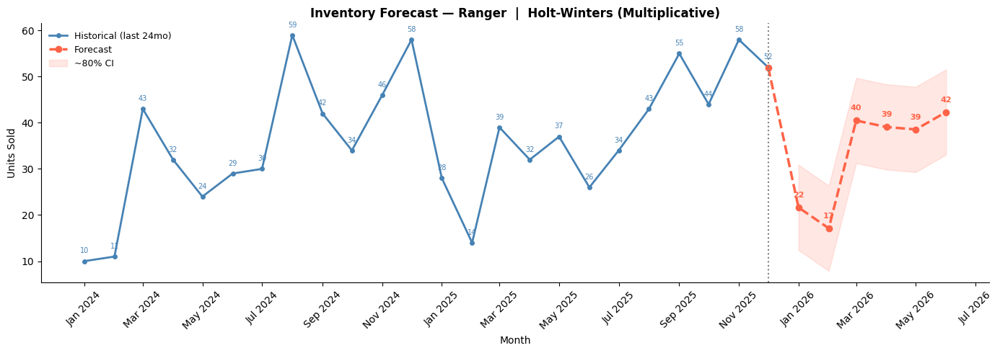


  MODEL: Camry  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           8          20
Feb 2026                12           6          18
Mar 2026                23          17          28
Apr 2026                25          19          31
May 2026                25          19          31
Jun 2026                31          25          37


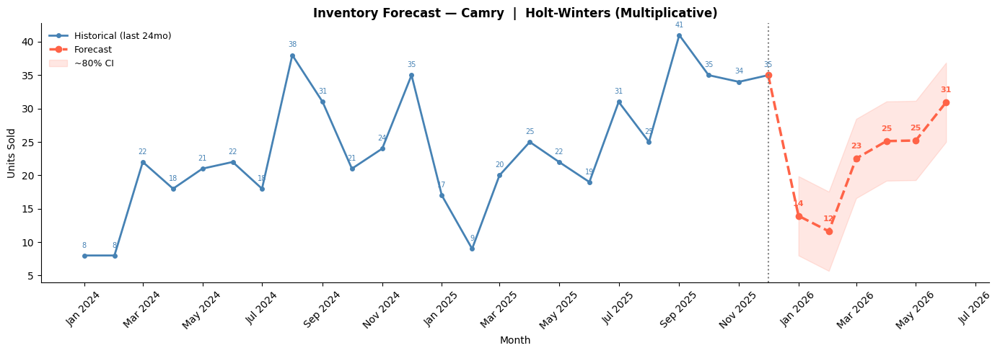


  MODEL: Golf  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                20          14          26
Feb 2026                12           6          18
Mar 2026                26          21          32
Apr 2026                17          11          23
May 2026                31          25          37
Jun 2026                20          14          25


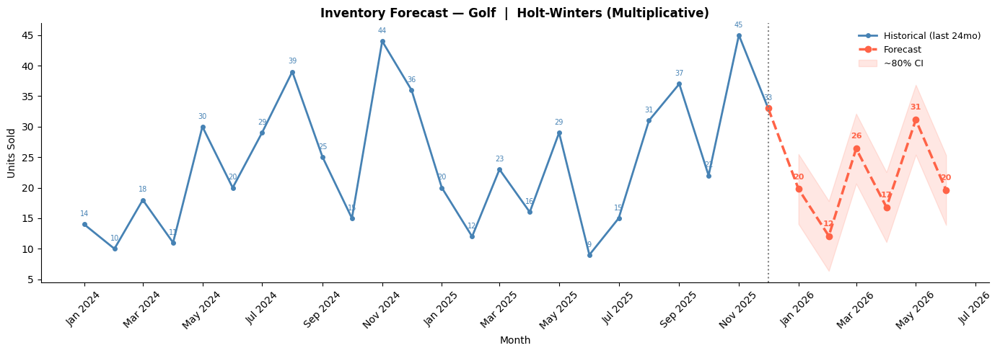


  MODEL: 528i  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           6          21
Feb 2026                10           3          18
Mar 2026                17          10          25
Apr 2026                24          17          32
May 2026                27          20          34
Jun 2026                20          13          27


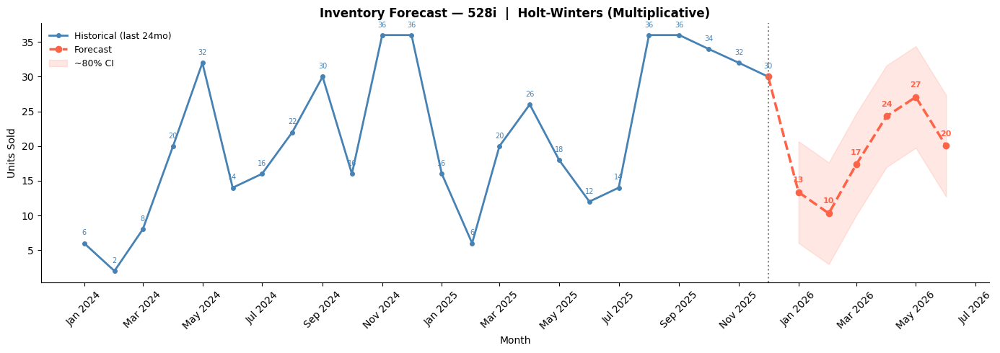


  MODEL: Cabrio  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                14           9          19
Mar 2026                27          21          32
Apr 2026                17          12          22
May 2026                30          25          35
Jun 2026                20          15          25


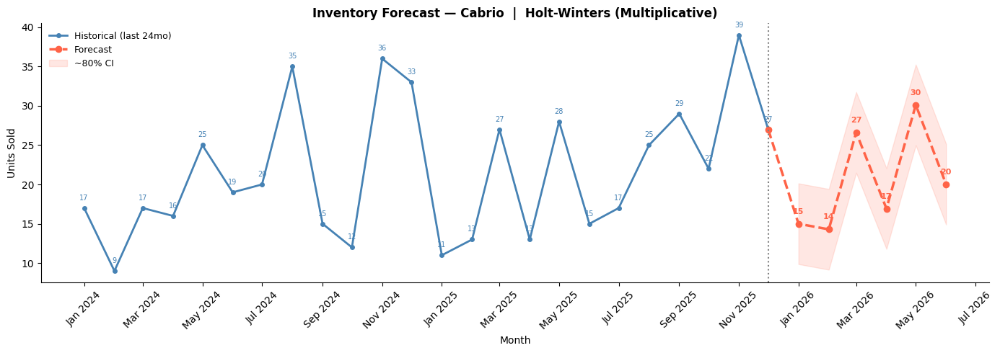


  MODEL: F-Series  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                12           7          16
Feb 2026                12           8          17
Mar 2026                21          16          26
Apr 2026                19          14          24
May 2026                27          22          31
Jun 2026                18          14          23


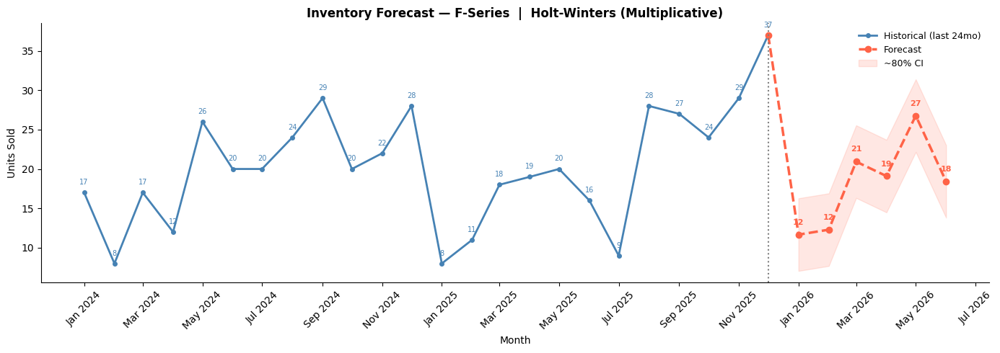


  MODEL: Malibu  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                17          12          22
Feb 2026                10           5          15
Mar 2026                20          15          25
Apr 2026                19          14          24
May 2026                23          18          28
Jun 2026                19          14          24


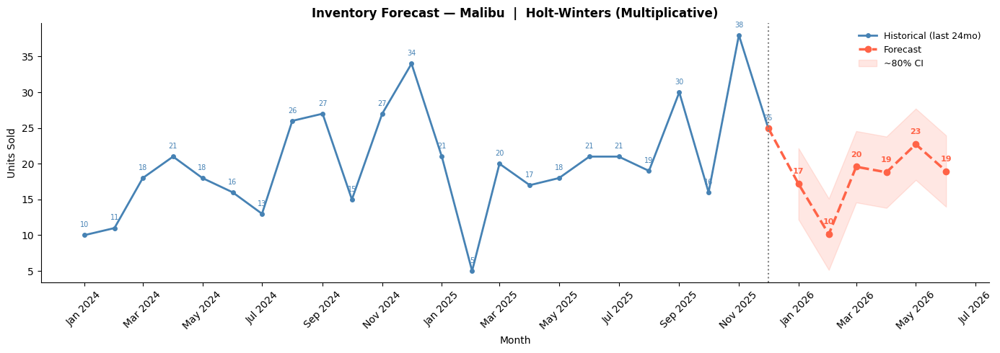


  MODEL: Grand Am  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           9          18
Feb 2026                14           9          19
Mar 2026                18          13          23
Apr 2026                24          19          29
May 2026                23          18          28
Jun 2026                21          17          26


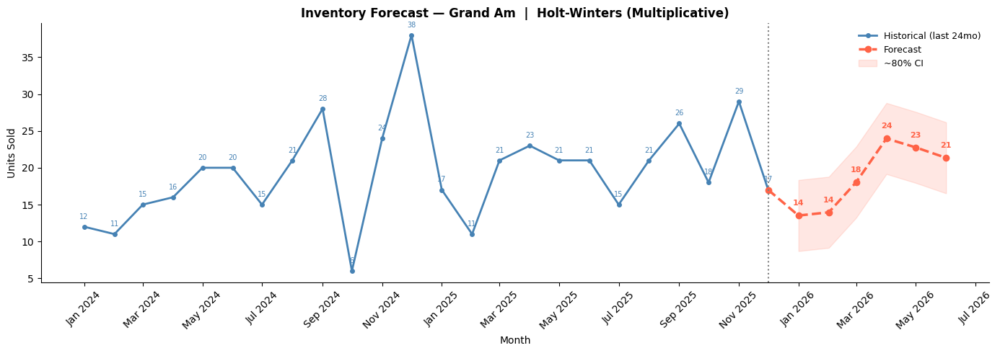


  MODEL: Park Avenue  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                11           7          16
Feb 2026                13           9          17
Mar 2026                19          15          23
Apr 2026                15          11          20
May 2026                19          15          24
Jun 2026                14           9          18


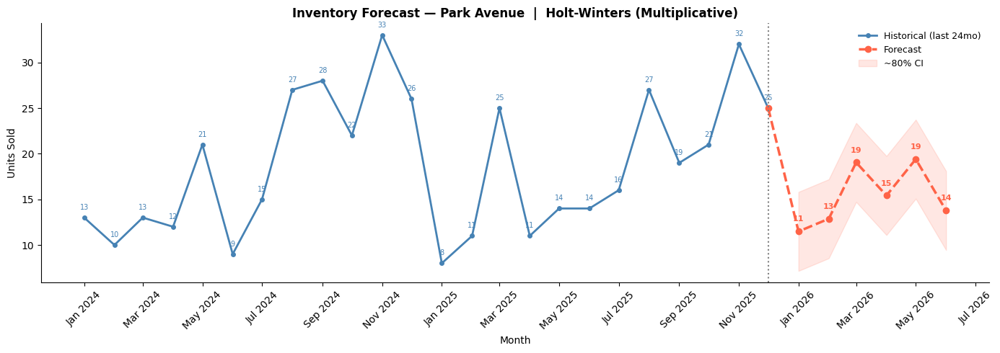


  MODEL: Continental  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                13           8          18
Mar 2026                22          17          27
Apr 2026                18          13          23
May 2026                24          19          29
Jun 2026                14           9          19


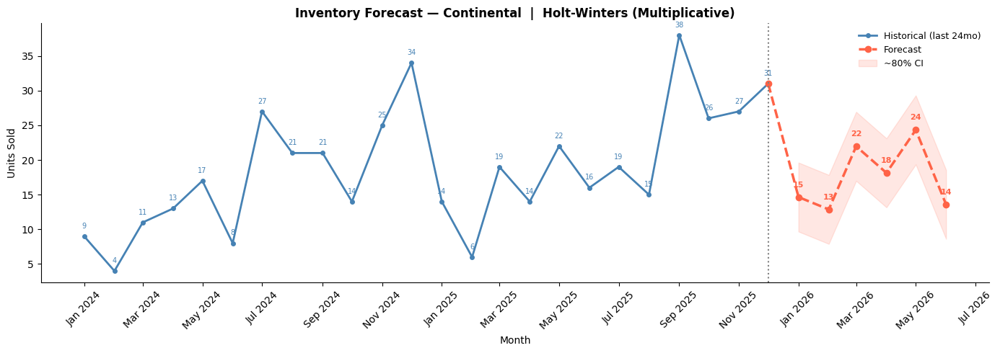


  MODEL: Land Cruiser  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                16          11          20
Feb 2026                12           8          17
Mar 2026                18          13          23
Apr 2026                18          14          23
May 2026                24          20          29
Jun 2026                18          13          23


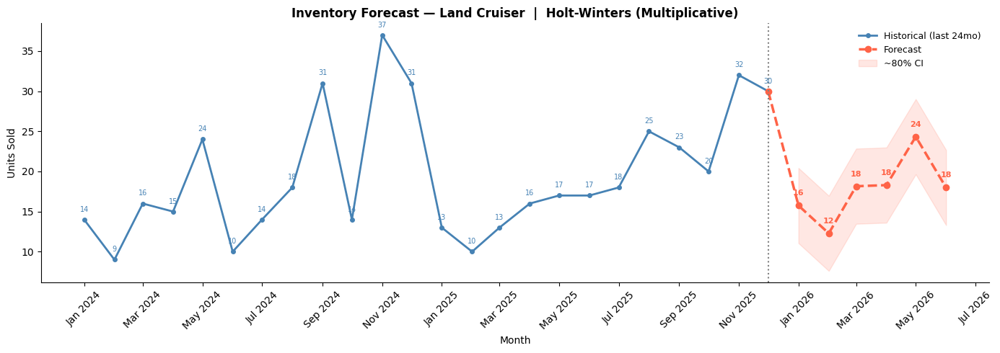


  MODEL: Focus  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14          10          19
Feb 2026                12           8          17
Mar 2026                18          13          23
Apr 2026                16          12          21
May 2026                17          13          22
Jun 2026                18          14          23


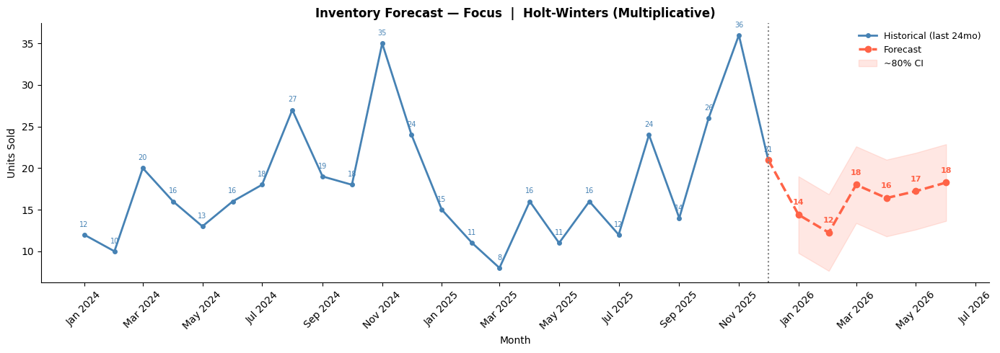


  MODEL: Aurora  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                12           7          17
Mar 2026                26          21          31
Apr 2026                17          12          22
May 2026                24          19          29
Jun 2026                22          17          27


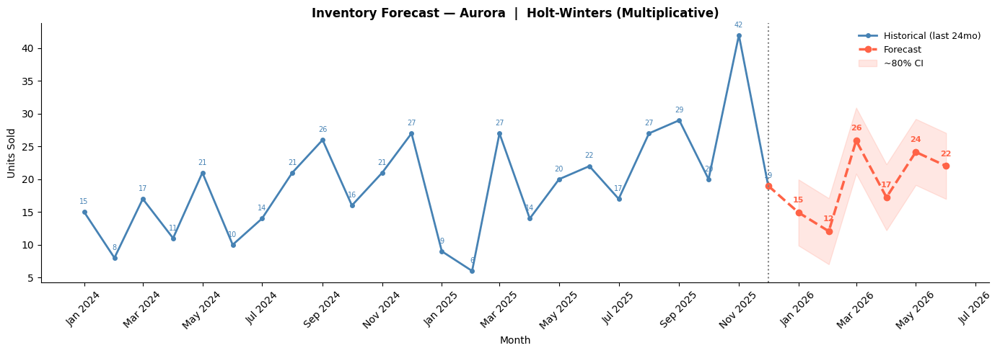


  MODEL: Taurus  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           9          19
Feb 2026                11           6          17
Mar 2026                20          15          26
Apr 2026                18          13          23
May 2026                23          17          28
Jun 2026                18          13          23


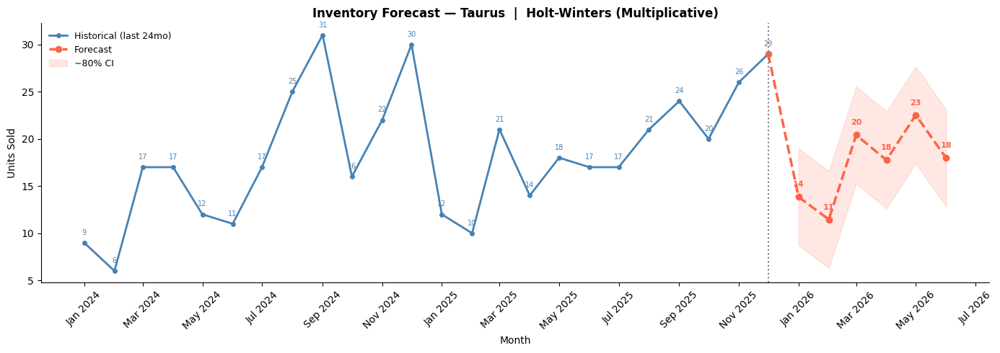


  MODEL: Contour  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                11           6          16
Feb 2026                11           6          16
Mar 2026                19          14          24
Apr 2026                17          12          22
May 2026                21          16          26
Jun 2026                16          11          21


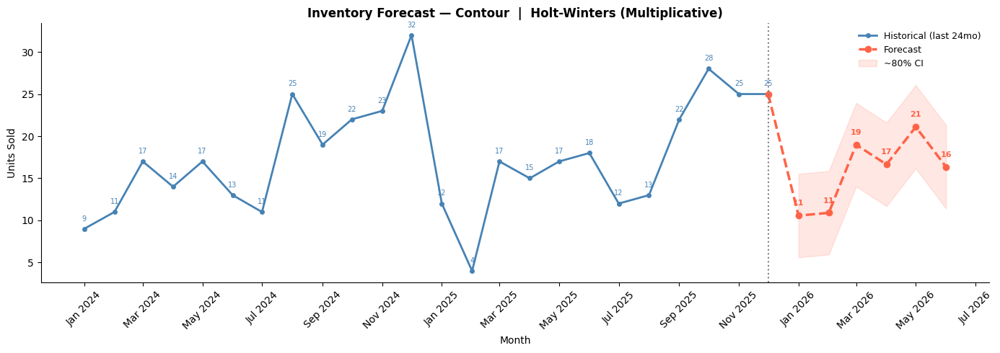


  MODEL: GS300  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           8          17
Feb 2026                10           6          15
Mar 2026                15          11          20
Apr 2026                17          12          21
May 2026                22          18          27
Jun 2026                16          11          20


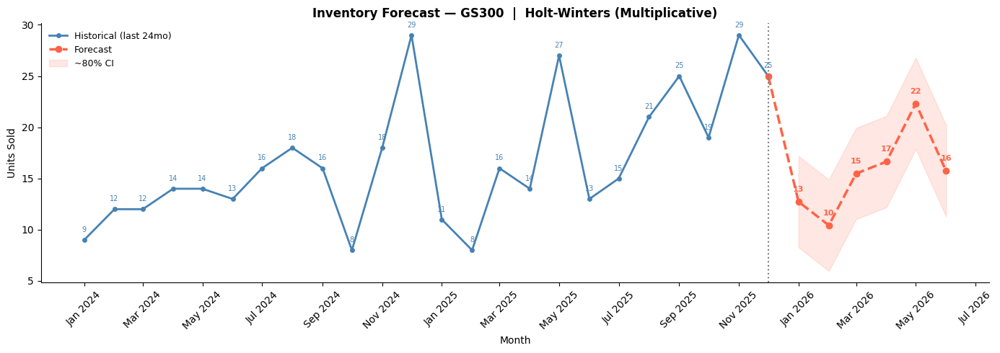


  MODEL: Outback  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           8          18
Feb 2026                 9           4          14
Mar 2026                16          11          21
Apr 2026                19          14          24
May 2026                20          15          25
Jun 2026                18          13          23


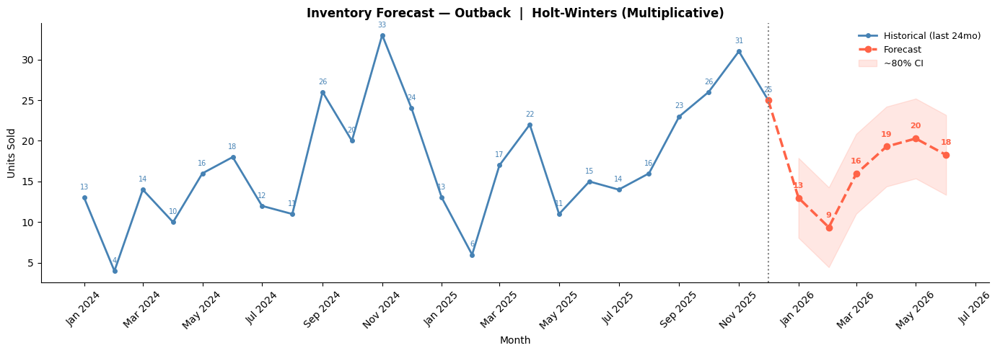


  MODEL: Beetle  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14          10          18
Feb 2026                11           7          15
Mar 2026                19          15          23
Apr 2026                21          17          25
May 2026                22          18          26
Jun 2026                16          12          20


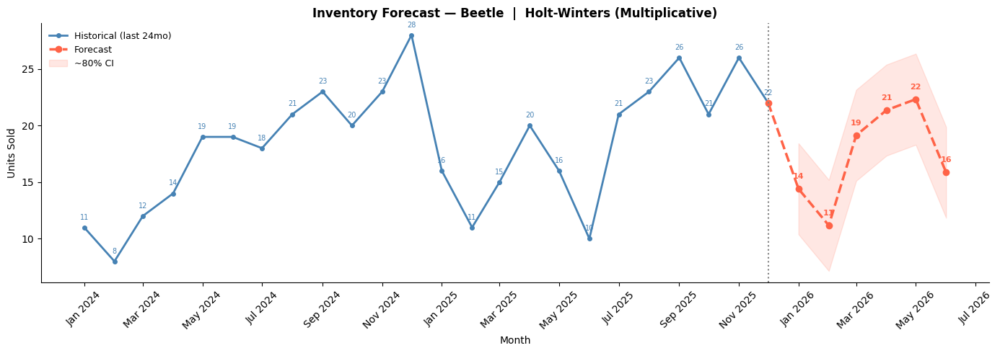


  MODEL: Concorde  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                10           6          14
Feb 2026                10           7          14
Mar 2026                15          11          19
Apr 2026                14          10          18
May 2026                20          17          24
Jun 2026                16          12          19


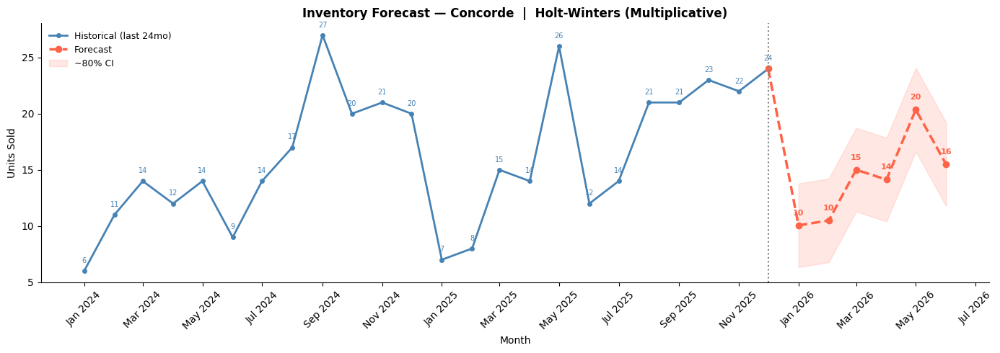

  Skipping Sunfire: too many zero/low months for multiplicative seasonality

  SUMMARY — 6-MONTH FORECAST (UNITS) BY CAR MODEL (TOP 20)
              Jan 2026  Feb 2026  Mar 2026  Apr 2026  May 2026  Jun 2026  Total (6M)
Model                                                                               
Ranger              22        17        40        39        39        42         199
Camry               14        12        23        25        25        31         130
Golf                20        12        26        17        31        20         126
528i                13        10        17        24        27        20         111
Cabrio              15        14        27        17        30        20         123
F-Series            12        12        21        19        27        18         109
Malibu              17        10        20        19        23        19         108
Grand Am            14        14        18        24        23        21         114
Park Avenue   

In [114]:
# STEP 16: 6-MONTH HOLT-WINTERS FORECAST PER CAR MODEL (TOP 20)
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
warnings.filterwarnings("ignore")

FUTURE_STEPS = 6

# Build model_monthly fresh if not already in memory (Model x Month unit sales)
model_monthly = (
    fvs.merge(dim_date[['DateKey','Date']], on='DateKey', how='left')
       .merge(dim_vehicle[['VehicleKey','Model']], on='VehicleKey', how='left')
)
model_monthly['Date'] = pd.to_datetime(model_monthly['Date'])
model_monthly = (
    model_monthly.groupby(['Model', pd.Grouper(key='Date', freq='MS')])['UnitsSold']
    .sum()
    .reset_index()
)

top20_models = (model_monthly.groupby('Model')['UnitsSold']
                .sum()
                .sort_values(ascending=False)
                .head(20)
                .index.tolist())

model_monthly_clean = model_monthly[model_monthly['Model'].isin(top20_models)].copy()

# Use the FULL actual date range from your data, not a hardcoded 24-month window
all_dates = pd.date_range(start=monthly['Date'].min(), end=monthly['Date'].max(), freq='MS')
last_overall_date = monthly['Date'].max()
future_dates_model = pd.date_range(start=last_overall_date + pd.offsets.MonthBegin(1),
                                    periods=FUTURE_STEPS, freq='MS')

model_forecasts = {}

for model_name in top20_models:
    mdf = (model_monthly_clean[model_monthly_clean['Model'] == model_name]
           .set_index('Date')
           .reindex(all_dates, fill_value=0)
           .rename_axis('Date')
           .reset_index())

    series = mdf.set_index('Date')['UnitsSold'].asfreq('MS').fillna(0)

    # Skip models with too many zero months — Holt-Winters multiplicative can't handle zeros
    if (series == 0).sum() > len(series) * 0.3 or series.min() <= 0:
        print(f"  Skipping {model_name}: too many zero/low months for multiplicative seasonality")
        continue

    try:
        hw_model_indiv = ExponentialSmoothing(
            series, trend='add', seasonal='mul', seasonal_periods=12
        )
        hw_fit_indiv = hw_model_indiv.fit()
        fc_mean = hw_fit_indiv.forecast(FUTURE_STEPS).clip(lower=0)

        resid_std_indiv = hw_fit_indiv.resid.std()
        fc_lower = (fc_mean.values - 1.28 * resid_std_indiv).clip(min=0)
        fc_upper = fc_mean.values + 1.28 * resid_std_indiv

    except Exception as e:
        print(f"  Skipping {model_name}: {e}")
        continue

    model_forecasts[model_name] = {
        'dates'   : future_dates_model,
        'forecast': fc_mean.values.round(0).astype(int),
        'lower'   : fc_lower.round(0).astype(int),
        'upper'   : fc_upper.round(0).astype(int),
    }

    fc_df = pd.DataFrame({
        'Month'           : future_dates_model.strftime('%b %Y'),
        'Forecasted_Units': fc_mean.values.round(0).astype(int),
        'Lower_80CI'      : fc_lower.round(0).astype(int),
        'Upper_80CI'      : fc_upper.round(0).astype(int),
    })
    print(f"\n{'=' * 55}")
    print(f"  MODEL: {model_name}  |  Holt-Winters (Multiplicative)")
    print(f"{'=' * 55}")
    print(fc_df.to_string(index=False))

    fig, ax = plt.subplots(figsize=(14, 5))
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")

    recent_mdf = mdf.tail(24)
    ax.plot(recent_mdf['Date'], recent_mdf['UnitsSold'],
            color='steelblue', linewidth=2, marker='o', markersize=4, label='Historical (last 24mo)')

    for dt, val in zip(recent_mdf['Date'], recent_mdf['UnitsSold']):
        ax.annotate(f'{int(val)}', xy=(dt, val), xytext=(0, 8), textcoords='offset points',
                    ha='center', fontsize=7, color='steelblue')

    last_val = mdf['UnitsSold'].iloc[-1]
    last_dt  = mdf['Date'].iloc[-1]
    ax.plot([last_dt] + list(future_dates_model), [last_val] + list(fc_mean.values),
            color='tomato', linewidth=2.5, linestyle='--', marker='o', markersize=6, label='Forecast')

    for dt, val in zip(future_dates_model, fc_mean.values):
        ax.annotate(f'{int(round(val))}', xy=(dt, val), xytext=(0, 10), textcoords='offset points',
                    ha='center', fontsize=8, color='tomato', fontweight='bold')

    ax.fill_between(future_dates_model, fc_lower, fc_upper, color='tomato', alpha=0.15, label='~80% CI')
    ax.axvline(x=last_dt, color='gray', linestyle=':', linewidth=1.5)

    ax.set_title(f'Inventory Forecast — {model_name}  |  Holt-Winters (Multiplicative)',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Month')
    ax.set_ylabel('Units Sold')
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(fontsize=9, frameon=False)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'forecast_{model_name.replace(" ", "_")}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Summary table
print(f"\n{'=' * 75}")
print("  SUMMARY — 6-MONTH FORECAST (UNITS) BY CAR MODEL (TOP 20)")
print(f"{'=' * 75}")

summary_rows = []
for model_name, res in model_forecasts.items():
    row = {'Model': model_name}
    for dt, val in zip(res['dates'], res['forecast']):
        row[dt.strftime('%b %Y')] = val
    row['Total (6M)'] = sum(res['forecast'])
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows).set_index('Model')
print(summary_df.to_string())
print(f"\nStep 16 Complete — Holt-Winters forecasts done for {len(model_forecasts)} of {len(top20_models)} models")

## 12 Month forecast by car model


  MODEL: Ranger  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                22          12          31
Feb 2026                17           8          26
Mar 2026                40          31          50
Apr 2026                39          30          48
May 2026                39          30          48
Jun 2026                42          33          52
Jul 2026                35          26          44
Aug 2026                52          43          62
Sep 2026                57          47          66
Oct 2026                44          34          53
Nov 2026                58          49          68
Dec 2026                61          52          70


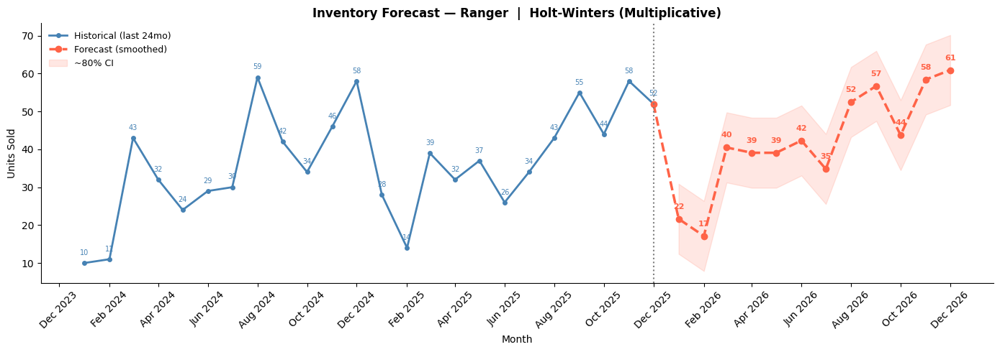


  MODEL: Camry  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           8          20
Feb 2026                12           6          18
Mar 2026                23          17          28
Apr 2026                25          19          31
May 2026                25          19          31
Jun 2026                31          25          37
Jul 2026                28          22          34
Aug 2026                32          26          38
Sep 2026                40          34          46
Oct 2026                31          25          37
Nov 2026                37          31          43
Dec 2026                40          34          46


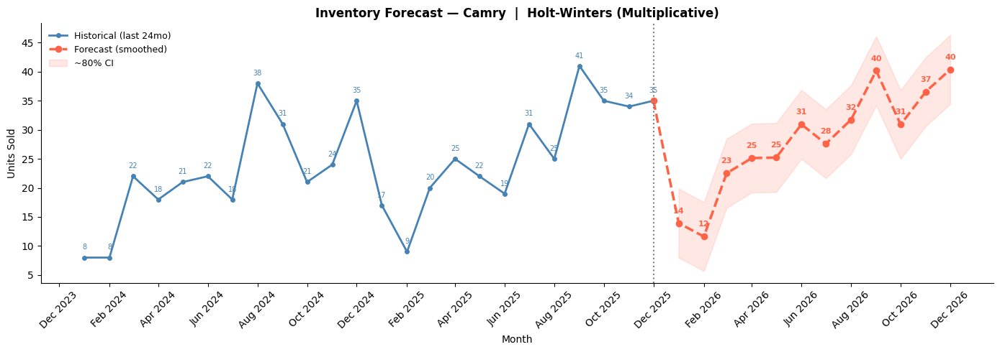


  MODEL: Golf  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                20          14          26
Feb 2026                12           6          18
Mar 2026                26          21          32
Apr 2026                17          11          23
May 2026                31          25          37
Jun 2026                20          14          25
Jul 2026                23          18          29
Aug 2026                35          30          41
Sep 2026                37          31          42
Oct 2026                22          16          27
Nov 2026                48          42          54
Dec 2026                37          32          43


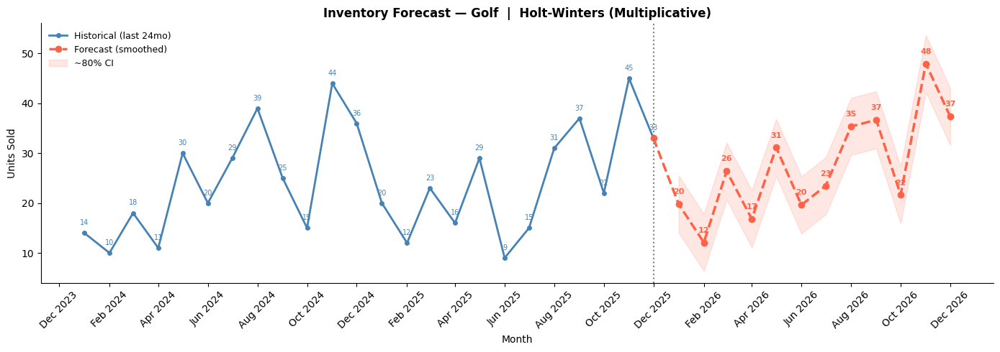


  MODEL: 528i  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           6          21
Feb 2026                10           3          18
Mar 2026                17          10          25
Apr 2026                24          17          32
May 2026                27          20          34
Jun 2026                20          13          27
Jul 2026                21          14          29
Aug 2026                25          18          32
Sep 2026                35          28          42
Oct 2026                26          19          34
Nov 2026                39          32          46
Dec 2026                38          31          46


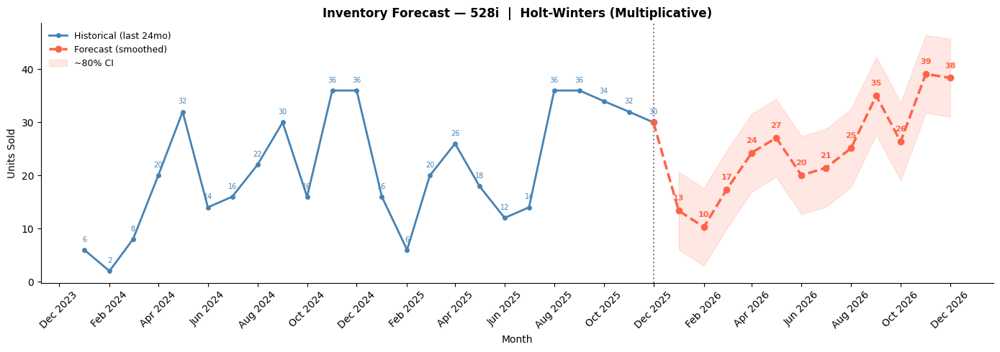


  MODEL: Cabrio  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                14           9          19
Mar 2026                27          21          32
Apr 2026                17          12          22
May 2026                30          25          35
Jun 2026                20          15          25
Jul 2026                23          18          28
Aug 2026                31          26          36
Sep 2026                29          24          35
Oct 2026                29          24          35
Nov 2026                43          37          48
Dec 2026                35          30          40


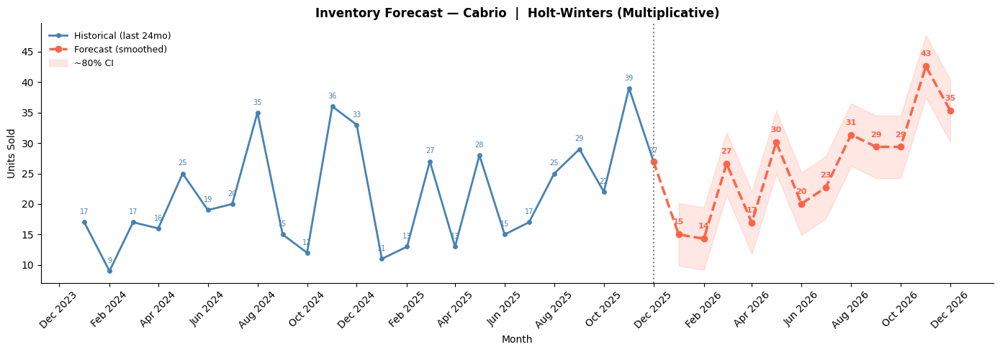


  MODEL: F-Series  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                12           7          16
Feb 2026                12           8          17
Mar 2026                21          16          26
Apr 2026                19          14          24
May 2026                27          22          31
Jun 2026                18          14          23
Jul 2026                18          14          23
Aug 2026                25          21          30
Sep 2026                29          25          34
Oct 2026                25          20          30
Nov 2026                32          28          37
Dec 2026                34          29          38


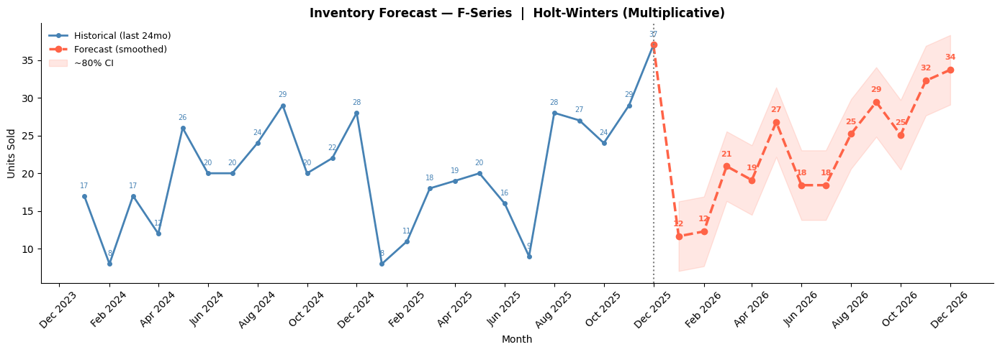


  MODEL: Malibu  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                17          12          22
Feb 2026                10           5          15
Mar 2026                20          15          25
Apr 2026                19          14          24
May 2026                23          18          28
Jun 2026                19          14          24
Jul 2026                19          14          24
Aug 2026                23          18          28
Sep 2026                29          24          34
Oct 2026                19          14          24
Nov 2026                33          28          38
Dec 2026                30          25          35


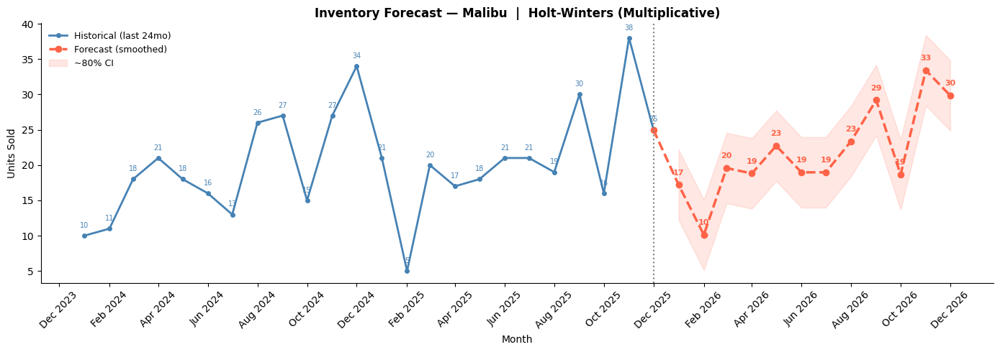


  MODEL: Grand Am  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           9          18
Feb 2026                14           9          19
Mar 2026                18          13          23
Apr 2026                24          19          29
May 2026                23          18          28
Jun 2026                23          18          28
Jul 2026                23          18          28
Aug 2026                27          22          32
Sep 2026                24          20          29
Oct 2026                24          20          29
Nov 2026                32          27          37
Dec 2026                29          24          34


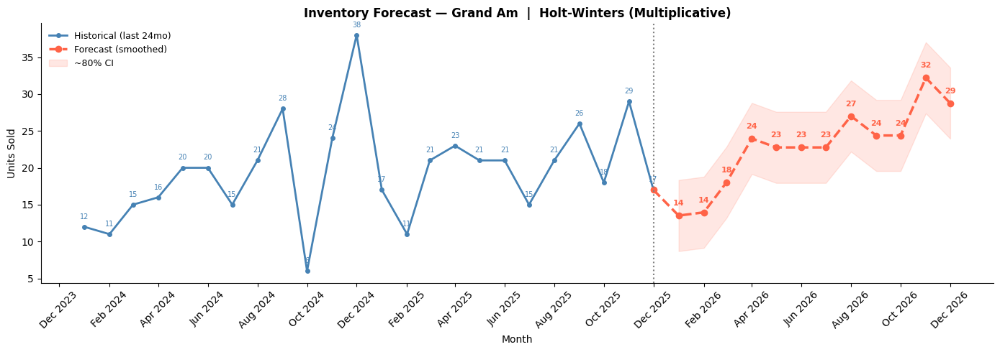


  MODEL: Park Avenue  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                11           7          16
Feb 2026                13           9          17
Mar 2026                19          15          23
Apr 2026                15          11          20
May 2026                19          15          24
Jun 2026                14           9          18
Jul 2026                19          14          23
Aug 2026                28          23          32
Sep 2026                27          23          32
Oct 2026                27          23          32
Nov 2026                35          31          40
Dec 2026                29          24          33


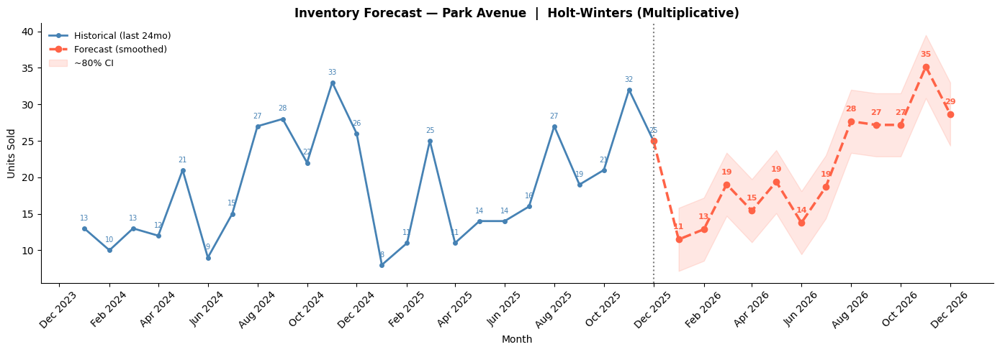


  MODEL: Continental  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                13           8          18
Mar 2026                22          17          27
Apr 2026                18          13          23
May 2026                24          19          29
Jun 2026                14           9          19
Jul 2026                26          21          31
Aug 2026                21          16          26
Sep 2026                33          28          38
Oct 2026                22          17          27
Nov 2026                29          24          34
Dec 2026                35          30          40


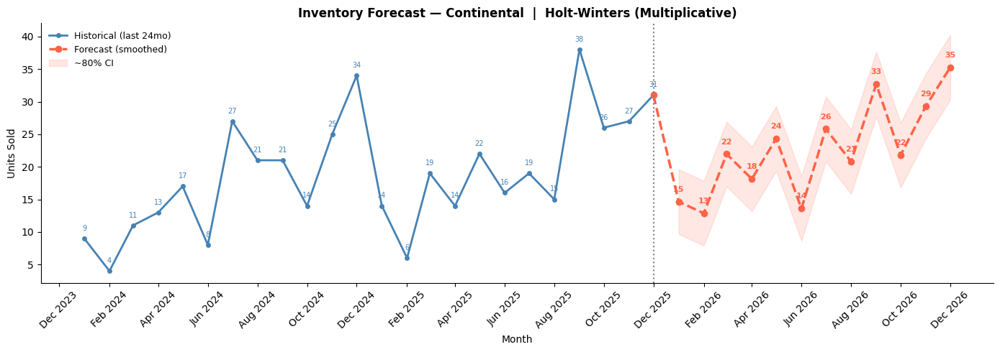


  MODEL: Land Cruiser  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                16          11          20
Feb 2026                12           8          17
Mar 2026                18          13          23
Apr 2026                18          14          23
May 2026                24          20          29
Jun 2026                18          13          23
Jul 2026                21          16          25
Aug 2026                28          24          33
Sep 2026                30          25          34
Oct 2026                23          18          27
Nov 2026                36          32          41
Dec 2026                34          29          38


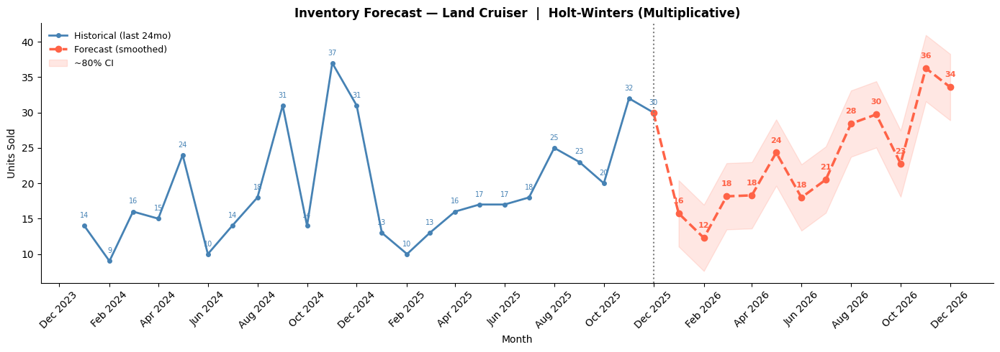


  MODEL: Focus  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14          10          19
Feb 2026                12           8          17
Mar 2026                18          13          23
Apr 2026                16          12          21
May 2026                17          13          22
Jun 2026                18          14          23
Jul 2026                18          13          22
Aug 2026                27          23          32
Sep 2026                21          16          25
Oct 2026                23          18          27
Nov 2026                34          30          39
Dec 2026                28          24          33


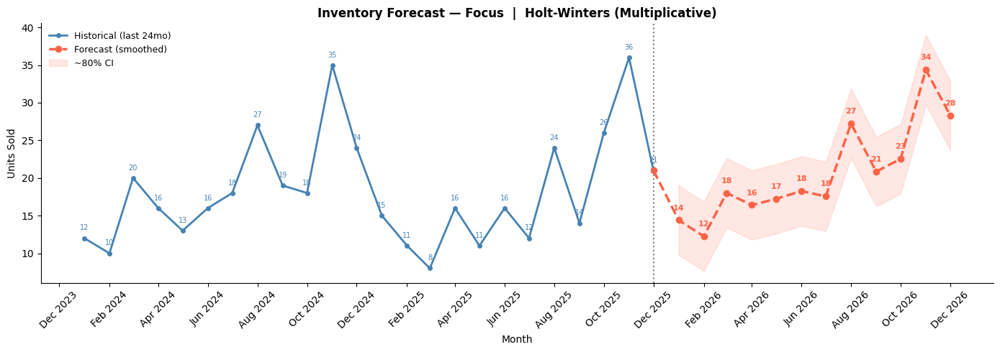


  MODEL: Aurora  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                15          10          20
Feb 2026                12           7          17
Mar 2026                26          21          31
Apr 2026                17          12          22
May 2026                24          19          29
Jun 2026                22          17          27
Jul 2026                22          17          27
Aug 2026                27          22          32
Sep 2026                32          27          37
Oct 2026                23          18          28
Nov 2026                35          30          40
Dec 2026                31          26          36


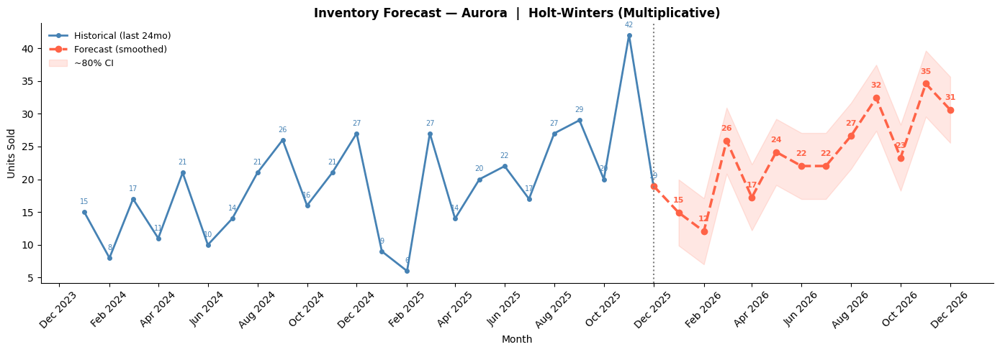


  MODEL: Taurus  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14           9          19
Feb 2026                11           6          17
Mar 2026                20          15          26
Apr 2026                18          13          23
May 2026                23          17          28
Jun 2026                18          13          23
Jul 2026                18          13          23
Aug 2026                24          19          30
Sep 2026                26          21          31
Oct 2026                21          15          26
Nov 2026                28          23          33
Dec 2026                32          27          37


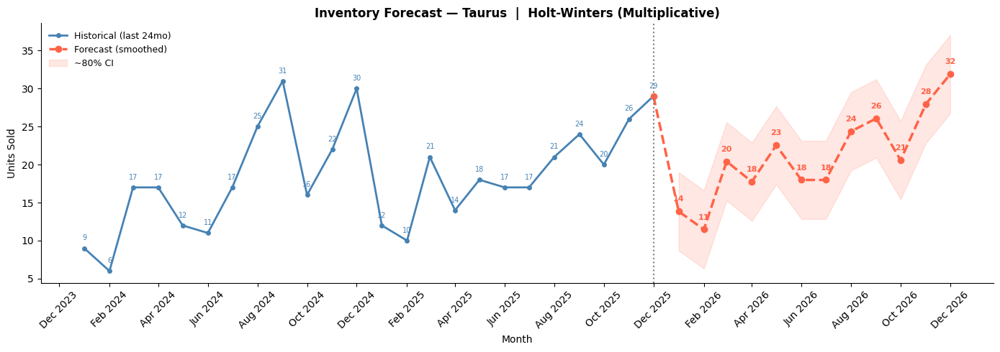


  MODEL: Contour  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                11           6          16
Feb 2026                11           6          16
Mar 2026                19          14          24
Apr 2026                17          12          22
May 2026                21          16          26
Jun 2026                16          11          21
Jul 2026                16          11          21
Aug 2026                20          15          25
Sep 2026                24          19          29
Oct 2026                21          16          26
Nov 2026                30          25          35
Dec 2026                27          22          32


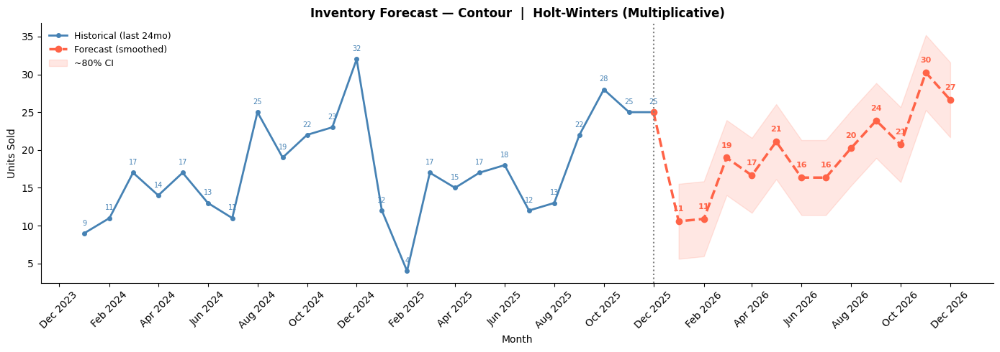


  MODEL: GS300  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           8          17
Feb 2026                10           6          15
Mar 2026                15          11          20
Apr 2026                17          12          21
May 2026                22          18          27
Jun 2026                16          11          20
Jul 2026                17          12          21
Aug 2026                22          17          26
Sep 2026                27          23          32
Oct 2026                16          12          20
Nov 2026                26          22          31
Dec 2026                28          24          33


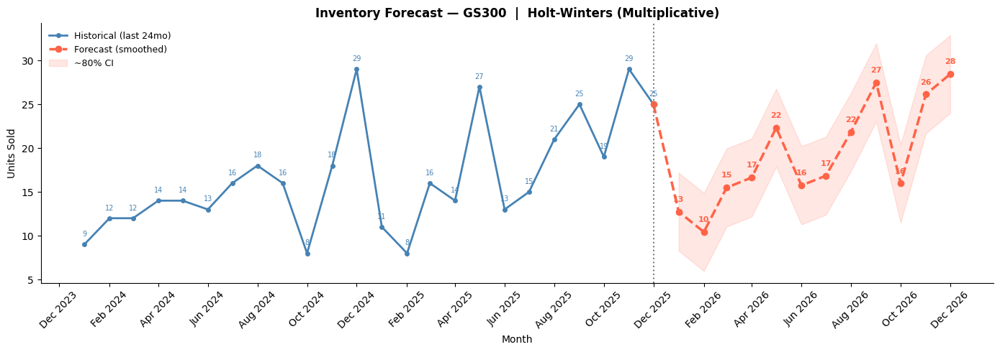


  MODEL: Outback  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                13           8          18
Feb 2026                 9           4          14
Mar 2026                16          11          21
Apr 2026                19          14          24
May 2026                20          15          25
Jun 2026                18          13          23
Jul 2026                18          13          23
Aug 2026                20          15          25
Sep 2026                28          23          33
Oct 2026                22          17          27
Nov 2026                33          28          37
Dec 2026                25          20          30


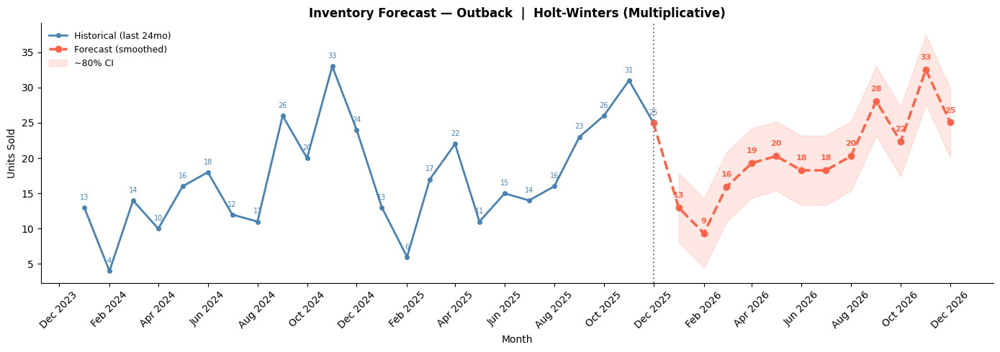


  MODEL: Beetle  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                14          10          18
Feb 2026                11           7          15
Mar 2026                19          15          23
Apr 2026                21          17          25
May 2026                22          18          26
Jun 2026                16          12          20
Jul 2026                21          17          25
Aug 2026                24          20          28
Sep 2026                26          22          30
Oct 2026                24          20          28
Nov 2026                27          23          31
Dec 2026                27          23          31


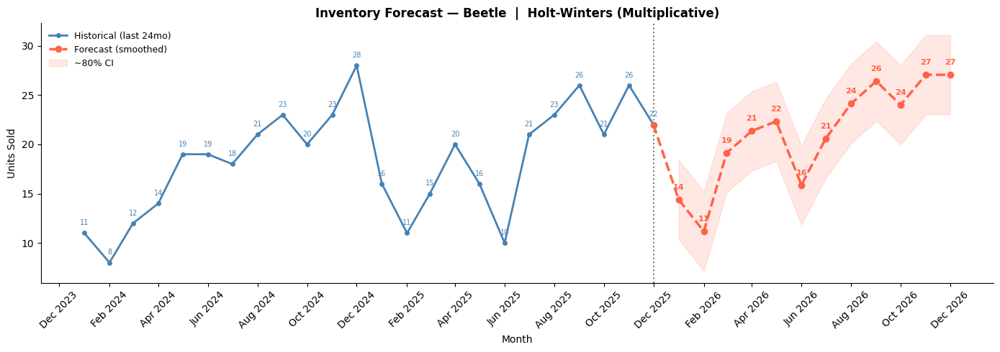


  MODEL: Concorde  |  Holt-Winters (Multiplicative)
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                10           6          14
Feb 2026                10           7          14
Mar 2026                15          11          19
Apr 2026                14          10          18
May 2026                20          17          24
Jun 2026                16          12          19
Jul 2026                16          12          20
Aug 2026                20          16          24
Sep 2026                24          21          28
Oct 2026                23          19          27
Nov 2026                24          20          28
Dec 2026                26          22          30


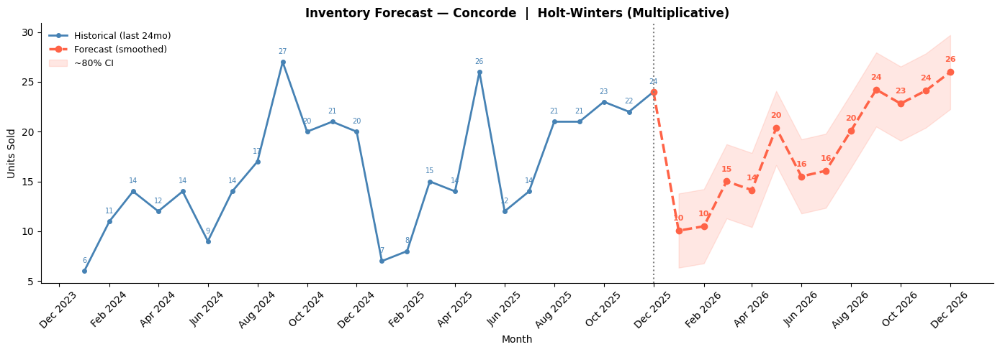

  Skipping Sunfire: too many zero/low months for multiplicative seasonality

  SUMMARY — 12-MONTH FORECAST (UNITS) BY CAR MODEL (TOP 20)
              Jan 2026  Feb 2026  Mar 2026  Apr 2026  May 2026  Jun 2026  Jul 2026  Aug 2026  Sep 2026  Oct 2026  Nov 2026  Dec 2026  Total (12M)
Model                                                                                                                                            
Ranger              22        17        40        39        39        42        35        52        57        44        58        61          506
Camry               14        12        23        25        25        31        28        32        40        31        37        40          338
Golf                20        12        26        17        31        20        23        35        37        22        48        37          328
528i                13        10        17        24        27        20        21        25        35        26        39        38 

In [115]:
# STEP 16b: 12-MONTH HOLT-WINTERS FORECAST PER CAR MODEL (TOP 20)
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
warnings.filterwarnings("ignore")

FUTURE_STEPS = 12

def freeze_on_consecutive_decline(values):
    """
    If a forecast declines 2+ consecutive times, freeze subsequent values
    at the level of the FIRST decline in that streak, until the trend
    reverses (goes back up).
    Example: [8, 6, 3, 2, 5] -> [8, 6, 6, 6, 5]
    (Feb=6 is the first decline; Mar/Apr get frozen to 6 since they keep
    declining; May rises again so it's left as-is.)
    """
    values = list(values)
    result = values.copy()
    decline_streak = 0
    freeze_value = None

    for i in range(1, len(values)):
        if result[i] < result[i-1]:
            decline_streak += 1
            if decline_streak == 1:
                freeze_value = result[i]
            elif decline_streak >= 2:
                result[i] = freeze_value
        else:
            decline_streak = 0
            freeze_value = None

    return np.array(result)

model_monthly = (
    fvs.merge(dim_date[['DateKey','Date']], on='DateKey', how='left')
       .merge(dim_vehicle[['VehicleKey','Model']], on='VehicleKey', how='left')
)
model_monthly['Date'] = pd.to_datetime(model_monthly['Date'])
model_monthly = (
    model_monthly.groupby(['Model', pd.Grouper(key='Date', freq='MS')])['UnitsSold']
    .sum()
    .reset_index()
)

top20_models = (model_monthly.groupby('Model')['UnitsSold']
                .sum()
                .sort_values(ascending=False)
                .head(20)
                .index.tolist())

model_monthly_clean = model_monthly[model_monthly['Model'].isin(top20_models)].copy()

all_dates = pd.date_range(start=monthly['Date'].min(), end=monthly['Date'].max(), freq='MS')
last_overall_date = monthly['Date'].max()
future_dates_model = pd.date_range(start=last_overall_date + pd.offsets.MonthBegin(1),
                                    periods=FUTURE_STEPS, freq='MS')

model_forecasts = {}

for model_name in top20_models:
    mdf = (model_monthly_clean[model_monthly_clean['Model'] == model_name]
           .set_index('Date')
           .reindex(all_dates, fill_value=0)
           .rename_axis('Date')
           .reset_index())

    series = mdf.set_index('Date')['UnitsSold'].asfreq('MS').fillna(0)

    if (series == 0).sum() > len(series) * 0.3 or series.min() <= 0:
        print(f"  Skipping {model_name}: too many zero/low months for multiplicative seasonality")
        continue

    try:
        hw_model_indiv = ExponentialSmoothing(
            series, trend='add', seasonal='mul', seasonal_periods=12
        )
        hw_fit_indiv = hw_model_indiv.fit()
        fc_mean_raw = hw_fit_indiv.forecast(FUTURE_STEPS).clip(lower=0)

        fc_mean_adjusted = freeze_on_consecutive_decline(fc_mean_raw.values)

        resid_std_indiv = hw_fit_indiv.resid.std()
        fc_lower = (fc_mean_adjusted - 1.28 * resid_std_indiv).clip(min=0)
        fc_upper = fc_mean_adjusted + 1.28 * resid_std_indiv

    except Exception as e:
        print(f"  Skipping {model_name}: {e}")
        continue

    model_forecasts[model_name] = {
        'dates'   : future_dates_model,
        'forecast': fc_mean_adjusted.round(0).astype(int),
        'lower'   : fc_lower.round(0).astype(int),
        'upper'   : fc_upper.round(0).astype(int),
    }

    fc_df = pd.DataFrame({
        'Month'           : future_dates_model.strftime('%b %Y'),
        'Forecasted_Units': fc_mean_adjusted.round(0).astype(int),
        'Lower_80CI'      : fc_lower.round(0).astype(int),
        'Upper_80CI'      : fc_upper.round(0).astype(int),
    })
    print(f"\n{'=' * 55}")
    print(f"  MODEL: {model_name}  |  Holt-Winters (Multiplicative)")
    print(f"{'=' * 55}")
    print(fc_df.to_string(index=False))

    fig, ax = plt.subplots(figsize=(14, 5))
    fig.patch.set_facecolor("white")
    ax.set_facecolor("white")

    recent_mdf = mdf.tail(24)
    ax.plot(recent_mdf['Date'], recent_mdf['UnitsSold'],
            color='steelblue', linewidth=2, marker='o', markersize=4, label='Historical (last 24mo)')

    for dt, val in zip(recent_mdf['Date'], recent_mdf['UnitsSold']):
        ax.annotate(f'{int(val)}', xy=(dt, val), xytext=(0, 8), textcoords='offset points',
                    ha='center', fontsize=7, color='steelblue')

    last_val = mdf['UnitsSold'].iloc[-1]
    last_dt  = mdf['Date'].iloc[-1]
    ax.plot([last_dt] + list(future_dates_model), [last_val] + list(fc_mean_adjusted),
            color='tomato', linewidth=2.5, linestyle='--', marker='o', markersize=6, label='Forecast (smoothed)')

    for dt, val in zip(future_dates_model, fc_mean_adjusted):
        ax.annotate(f'{int(round(val))}', xy=(dt, val), xytext=(0, 10), textcoords='offset points',
                    ha='center', fontsize=8, color='tomato', fontweight='bold')

    ax.fill_between(future_dates_model, fc_lower, fc_upper, color='tomato', alpha=0.15, label='~80% CI')
    ax.axvline(x=last_dt, color='gray', linestyle=':', linewidth=1.5)

    ax.set_title(f'Inventory Forecast — {model_name}  |  Holt-Winters (Multiplicative)',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Month')
    ax.set_ylabel('Units Sold')
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(fontsize=9, frameon=False)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'forecast_{model_name.replace(" ", "_")}.png', dpi=150, bbox_inches='tight')
    plt.show()

# Summary table
print(f"\n{'=' * 75}")
print("  SUMMARY — 12-MONTH FORECAST (UNITS) BY CAR MODEL (TOP 20)")
print(f"{'=' * 75}")

summary_rows = []
for model_name, res in model_forecasts.items():
    row = {'Model': model_name}
    for dt, val in zip(res['dates'], res['forecast']):
        row[dt.strftime('%b %Y')] = val
    row['Total (12M)'] = sum(res['forecast'])
    summary_rows.append(row)

summary_df = pd.DataFrame(summary_rows).set_index('Model')
print(summary_df.to_string())
print(f"\nStep 16 Complete — Holt-Winters forecasts done")

In [116]:
# STEP 17 — 5-MONTH HOLT-WINTERS FORECAST FOR ALL 154 MODELS
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import warnings
warnings.filterwarnings("ignore")

FUTURE_STEPS = 5
future_dates  = pd.date_range(start='2024-01-01', periods=FUTURE_STEPS, freq='MS')
all_dates     = pd.date_range(start='2022-01-01', periods=24, freq='MS')

all_models = [m for m in model_monthly['Model'].unique() if isinstance(m, str)]
print(f"Total models to forecast: {len(all_models)}")

all_forecasts = {}
skipped       = []

for i, model_name in enumerate(all_models, 1):
    mdf = (model_monthly[model_monthly['Model'] == model_name]
           .set_index('Date')
           .reindex(all_dates, fill_value=0)
           .rename_axis('Date')
           .reset_index())

    series = mdf.set_index('Date')['UnitsSold'].asfreq('MS').fillna(0)

    try:
        # Multiplicative seasonality needs strictly positive values —
        # add a small offset, forecast, then subtract it back out.
        offset = 1e-3
        series_pos = series + offset

        mod = ExponentialSmoothing(
            series_pos,
            trend='add',
            seasonal='mul',
            seasonal_periods=12,
            initialization_method='estimated'
        )
        fit     = mod.fit(optimized=True)
        fc_mean = fit.forecast(FUTURE_STEPS) - offset
        fc_mean = fc_mean.clip(lower=0)

        all_forecasts[model_name] = {
            'dates'   : future_dates,
            'forecast': fc_mean.values.round(0).astype(int),
        }

        if i % 20 == 0:
            print(f"  ✔ {i}/{len(all_models)} models done...")

    except Exception as e:
        skipped.append(model_name)
        continue

print(f"\nDone — {len(all_forecasts)} models forecasted, {len(skipped)} skipped")
if skipped:
    print(f"Skipped: {skipped}")

rows = []
for model_name, res in all_forecasts.items():
    row = {'Car Model': model_name}
    for dt, val in zip(res['dates'], res['forecast']):
        row[dt.strftime('%b %Y')] = val
    row['Total (5M)'] = sum(res['forecast'])
    rows.append(row)

all_models_df = (pd.DataFrame(rows)
                 .set_index('Car Model')
                 .sort_values('Total (5M)', ascending=False))

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows',    None)
pd.set_option('display.width',       200)

print("\n" + "=" * 75)
print("  INVENTORY FORECAST — ALL CAR MODELS (Sorted by Total Units)")
print("=" * 75)
print(all_models_df.to_string())
print("=" * 75)
print(f"\nGrand Total across all models: {all_models_df['Total (5M)'].sum():,} units")

Total models to forecast: 152
  ✔ 20/152 models done...
  ✔ 40/152 models done...
  ✔ 60/152 models done...
  ✔ 80/152 models done...
  ✔ 100/152 models done...
  ✔ 120/152 models done...
  ✔ 140/152 models done...

Done — 152 models forecasted, 0 skipped

  INVENTORY FORECAST — ALL CAR MODELS (Sorted by Total Units)
                Jan 2024  Feb 2024  Mar 2024  Apr 2024  May 2024  Total (5M)
Car Model                                                                   
Grand Marquis          0         0         0         6       254         260
Ranger                17        12        39        32        37         137
Camry                 12         7        22        24        26          91
Aurora                14        15        18        17        21          85
F-Series               8        13        18        19        24          82
Civic                 19        11        21        16        15          82
Continental           10        16        15        15        20 

camp_monthly built: 576 rows
Campaign types: ['Awareness', 'Digital', 'Discount', 'Loyalty', 'Product Launch', 'Referral', 'Seasonal', 'Test Drive']
Date range: 2020-01-01 00:00:00 to 2025-12-01 00:00:00
Historical window (fit): Jan 2020 to Dec 2025 (72 months, 6.0 seasonal cycles)
Forecast window:         Jan 2026 to Jun 2026

  CAMPAIGN TYPE: Awareness
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                41          29          54
Feb 2026                32          21          44
Mar 2026                56          37          80
Apr 2026                53          35          78
May 2026                60          38          90
Jun 2026                53          34          87


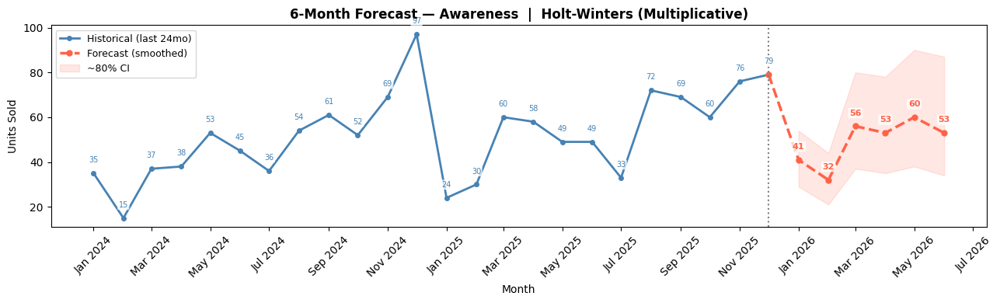


  CAMPAIGN TYPE: Digital
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                58          47          73
Feb 2026                51          40          69
Mar 2026                99          77         133
Apr 2026                91          67         122
May 2026               115          85         159
Jun 2026                90          65         127


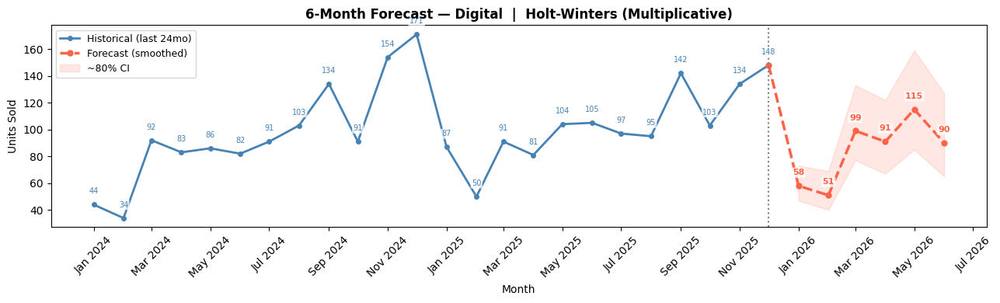


  CAMPAIGN TYPE: Discount
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                36          27          46
Feb 2026                34          25          44
Mar 2026                55          41          73
Apr 2026                52          38          72
May 2026                69          49         100
Jun 2026                58          40          83


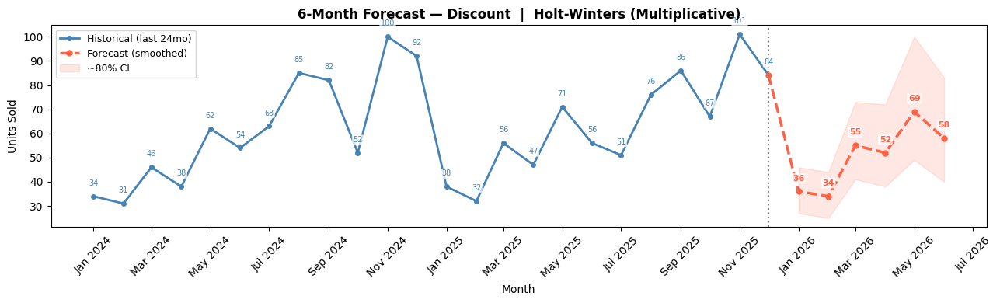


  CAMPAIGN TYPE: Loyalty
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                44          33          56
Feb 2026                40          29          54
Mar 2026                63          44          89
Apr 2026                65          42          92
May 2026                90          56         134
Jun 2026                63          39          98


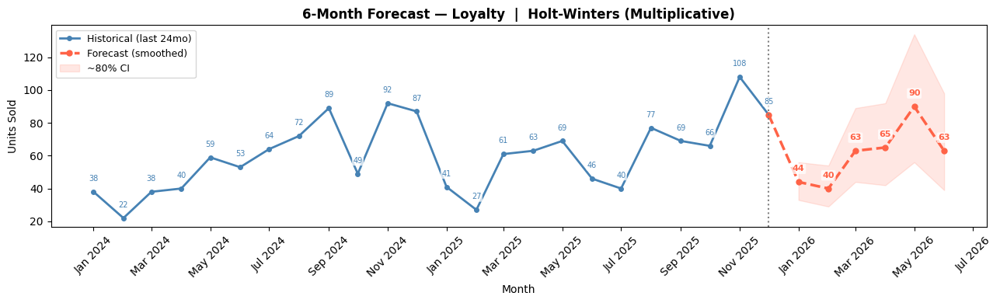


  CAMPAIGN TYPE: Product Launch
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                95          79         118
Feb 2026                91          74         115
Mar 2026               137         106         180
Apr 2026               142         108         190
May 2026               176         134         246
Jun 2026               140         105         199


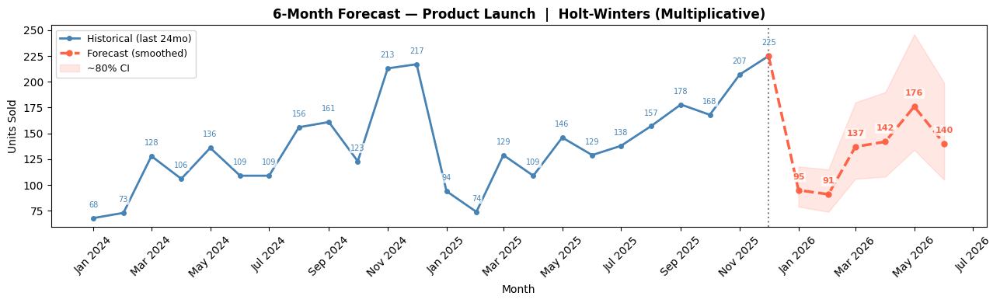


  CAMPAIGN TYPE: Referral
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                41          29          53
Feb 2026                35          24          48
Mar 2026                60          40          86
Apr 2026                50          33          73
May 2026                79          51         114
Jun 2026                63          40          96


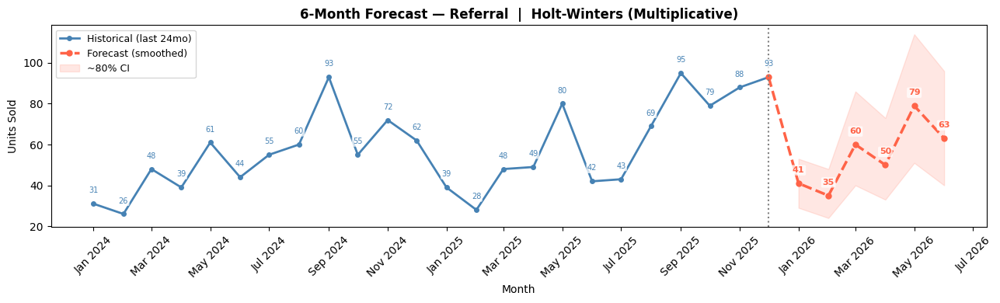


  CAMPAIGN TYPE: Seasonal
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                16          11          21
Feb 2026                17          12          23
Mar 2026                26          17          36
Apr 2026                30          20          43
May 2026                38          24          55
Jun 2026                27          17          40


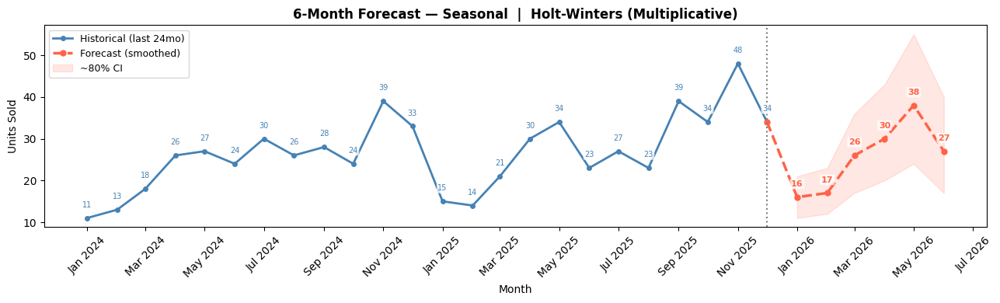


  CAMPAIGN TYPE: Test Drive
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                49          36          64
Feb 2026                42          30          55
Mar 2026                72          52          96
Apr 2026                64          45          88
May 2026                90          61         126
Jun 2026                76          52         108


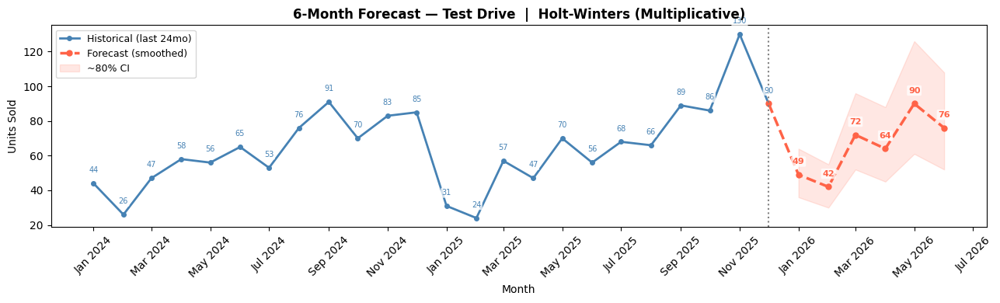


  6-MONTH FORECAST SUMMARY — UNITS SOLD BY CAMPAIGN TYPE
                Jan 2026  Feb 2026  Mar 2026  Apr 2026  May 2026  Jun 2026  Total 6M
Campaign Type                                                                       
Product Launch        95        91       137       142       176       140       781
Digital               58        51        99        91       115        90       504
Test Drive            49        42        72        64        90        76       393
Loyalty               44        40        63        65        90        63       365
Referral              41        35        60        50        79        63       328
Discount              36        34        55        52        69        58       304
Awareness             41        32        56        53        60        53       295
Seasonal              16        17        26        30        38        27       154

Grand Total (6M): 3,124 units

Step 18 Complete — 6-month campaign forecast done for 8 camp

In [118]:
# STEP 18: 6-MONTH FORECAST BY CAMPAIGN TYPE
# Build camp_monthly: monthly unit sales by CampaignType
camp_monthly = (
    fvs.merge(dim_date[['DateKey','Date']], on='DateKey', how='left')
       .merge(dim_campaign[['CampaignKey','CampaignType']], on='CampaignKey', how='left')
)
camp_monthly['Date'] = pd.to_datetime(camp_monthly['Date'])
camp_monthly = (
    camp_monthly.groupby(['CampaignType', pd.Grouper(key='Date', freq='MS')])['UnitsSold']
    .sum()
    .reset_index()
)

print(f"camp_monthly built: {len(camp_monthly)} rows")
print(f"Campaign types: {camp_monthly['CampaignType'].unique().tolist()}")
print(f"Date range: {camp_monthly['Date'].min()} to {camp_monthly['Date'].max()}")
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import numpy as np

FUTURE_STEPS = 6
DISPLAY_MONTHS = 24

all_dates = pd.date_range(
    start=camp_monthly['Date'].min(),
    end=camp_monthly['Date'].max(),
    freq='MS'
)
future_dates = pd.date_range(
    start=all_dates[-1] + pd.DateOffset(months=1),
    periods=FUTURE_STEPS,
    freq='MS'
)

print(f"Historical window (fit): {all_dates[0].strftime('%b %Y')} to {all_dates[-1].strftime('%b %Y')} "
      f"({len(all_dates)} months, {len(all_dates)/12:.1f} seasonal cycles)")
print(f"Forecast window:         {future_dates[0].strftime('%b %Y')} to {future_dates[-1].strftime('%b %Y')}")

campaign_types = camp_monthly['CampaignType'].unique().tolist()

camp_forecasts_6m = {}
N_SIMS = 1000
offset = 1e-3

for camp_type in campaign_types:
    cdf = (camp_monthly[camp_monthly['CampaignType'] == camp_type]
           .set_index('Date')[['UnitsSold']]
           .reindex(all_dates, fill_value=0)
           .rename_axis('Date'))

    series = cdf['UnitsSold'].asfreq('MS').fillna(0)
    series_pos = series + offset

    try:
        mod = ExponentialSmoothing(
            series_pos,
            trend='add',
            seasonal='mul',
            seasonal_periods=12,
            initialization_method='estimated'
        )
        fit     = mod.fit(optimized=True)
        fc_mean = (fit.forecast(FUTURE_STEPS) - offset).clip(lower=0)

        sims = fit.simulate(nsimulations=FUTURE_STEPS, repetitions=N_SIMS,
                             error='mul', random_errors='bootstrap') - offset
        sims = sims.clip(lower=0)
        lower = sims.quantile(0.10, axis=1)
        upper = sims.quantile(0.90, axis=1)

        camp_forecasts_6m[camp_type] = {
            'series'  : series,
            'forecast': fc_mean.values.round(0).astype(int),
            'lower'   : lower.values.round(0).astype(int),
            'upper'   : upper.values.round(0).astype(int),
        }

    except Exception as e:
        print(f"  ⚠ Skipping {camp_type}: {e}")
        continue

    fc_df = pd.DataFrame({
        'Month'           : future_dates.strftime('%b %Y'),
        'Forecasted_Units': camp_forecasts_6m[camp_type]['forecast'],
        'Lower_80CI'      : camp_forecasts_6m[camp_type]['lower'],
        'Upper_80CI'      : camp_forecasts_6m[camp_type]['upper'],
    })
    print(f"\n{'=' * 55}")
    print(f"  CAMPAIGN TYPE: {camp_type}")
    print(f"{'=' * 55}")
    print(fc_df.to_string(index=False))

    disp_dates = all_dates[-DISPLAY_MONTHS:]
    disp_vals  = series.values[-DISPLAY_MONTHS:]

    fig, ax = plt.subplots(figsize=(13, 4))

    ax.plot(disp_dates, disp_vals,
            color='steelblue', linewidth=2,
            marker='o', markersize=4, label=f'Historical (last {DISPLAY_MONTHS}mo)')

    for dt, val in zip(disp_dates, disp_vals):
        ax.annotate(f'{int(val)}',
                    xy=(dt, val), xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', fontsize=7,
                    color='steelblue',
                    bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.75))

    last_val = disp_vals[-1]
    last_dt  = disp_dates[-1]
    ax.plot(
        [last_dt] + list(future_dates),
        [last_val] + list(camp_forecasts_6m[camp_type]['forecast']),
        color='tomato', linewidth=2.5, linestyle='--',
        marker='o', markersize=5, label='Forecast (smoothed)'
    )

    ax.fill_between(future_dates,
                    camp_forecasts_6m[camp_type]['lower'],
                    camp_forecasts_6m[camp_type]['upper'],
                    color='tomato', alpha=0.15, label='~80% CI')

    ax.axvline(x=last_dt, color='gray', linestyle=':', linewidth=1.5)

    for dt, val in zip(future_dates, camp_forecasts_6m[camp_type]['forecast']):
        ax.annotate(f'{int(val)}',
                    xy=(dt, val), xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', fontsize=8,
                    color='tomato', fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.75))

    ax.set_title(f'6-Month Forecast — {camp_type}  |  Holt-Winters (Multiplicative)',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Month')
    ax.set_ylabel('Units Sold')
    ax.legend(fontsize=9, loc='upper left')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'forecast_6m_campaign_{camp_type.replace(" ", "_")}.png', dpi=150, bbox_inches='tight')
    plt.show()

print(f"\n{'=' * 85}")
print("  6-MONTH FORECAST SUMMARY — UNITS SOLD BY CAMPAIGN TYPE")
print(f"{'=' * 85}")

summary_rows_6m = []
for camp_type, res in camp_forecasts_6m.items():
    row = {'Campaign Type': camp_type}
    for dt, val in zip(future_dates, res['forecast']):
        row[dt.strftime('%b %Y')] = val
    row['Total 6M'] = sum(res['forecast'])
    summary_rows_6m.append(row)

summary_df_6m = (pd.DataFrame(summary_rows_6m)
              .set_index('Campaign Type')
              .sort_values('Total 6M', ascending=False))

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
print(summary_df_6m.to_string())
print(f"\nGrand Total (6M): {summary_df_6m['Total 6M'].sum():,} units")
print(f"\nStep 18 Complete — 6-month campaign forecast done for {len(camp_forecasts_6m)} campaign types")

Historical window (fit): Jan 2020 to Dec 2025 (72 months, 6.0 seasonal cycles)
Forecast window:         Jan 2026 to Dec 2026

  CAMPAIGN TYPE: Awareness
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                41          29          54
Feb 2026                32          22          43
Mar 2026                56          37          78
Apr 2026                53          33          77
May 2026                60          38          90
Jun 2026                53          32          81
Jul 2026                46          27          74
Aug 2026                67          39         109
Sep 2026                80          47         135
Oct 2026                61          35         108
Nov 2026                89          50         159
Dec 2026                89          48         161


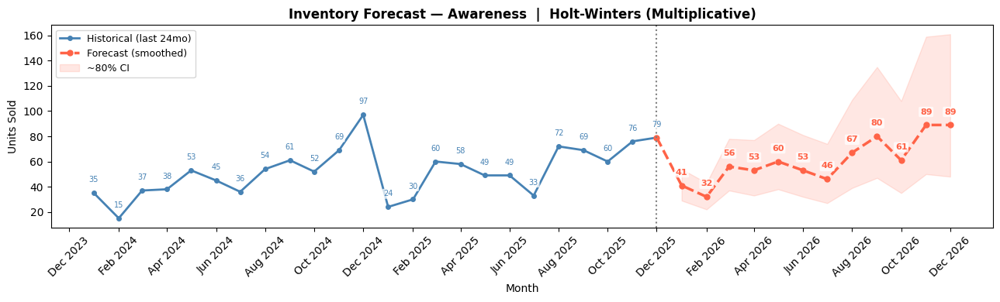


  CAMPAIGN TYPE: Digital
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                58          47          73
Feb 2026                51          40          66
Mar 2026                99          76         135
Apr 2026                91          67         126
May 2026               115          84         163
Jun 2026                90          63         132
Jul 2026                94          66         139
Aug 2026               109          75         169
Sep 2026               140          95         213
Oct 2026               108          71         168
Nov 2026               153         104         243
Dec 2026               158         104         255


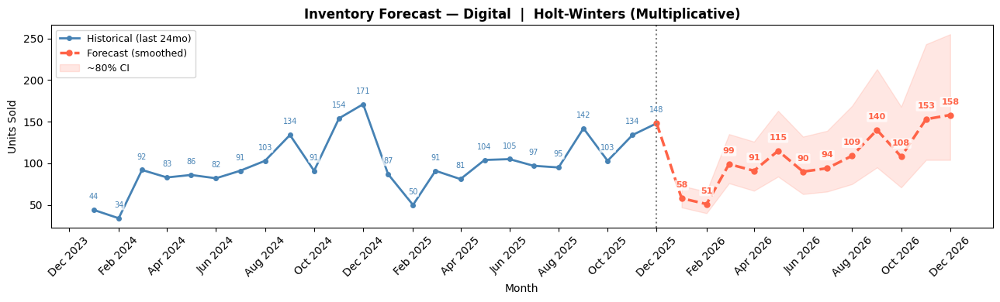


  CAMPAIGN TYPE: Discount
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                36          27          45
Feb 2026                34          25          44
Mar 2026                55          40          76
Apr 2026                52          38          74
May 2026                69          49          99
Jun 2026                58          41          85
Jul 2026                58          41          86
Aug 2026                74          51         112
Sep 2026                88          58         142
Oct 2026                67          44         109
Nov 2026               103          67         167
Dec 2026                96          61         163


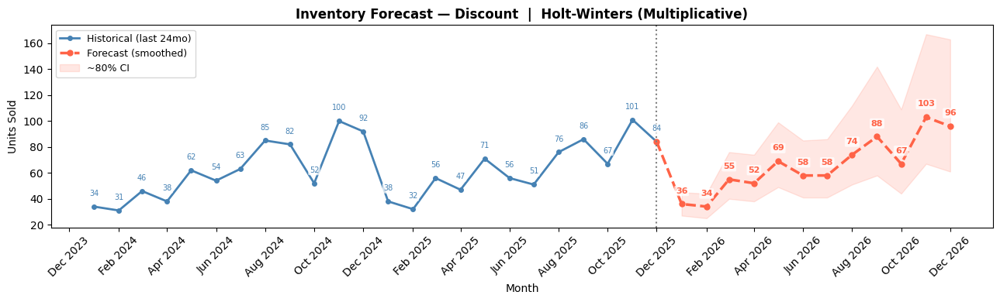


  CAMPAIGN TYPE: Loyalty
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                44          33          55
Feb 2026                40          29          52
Mar 2026                63          43          86
Apr 2026                65          43          89
May 2026                90          60         125
Jun 2026                63          40          95
Jul 2026                69          44         102
Aug 2026                87          54         134
Sep 2026               102          61         158
Oct 2026                73          44         116
Nov 2026               110          62         175
Dec 2026                98          52         158


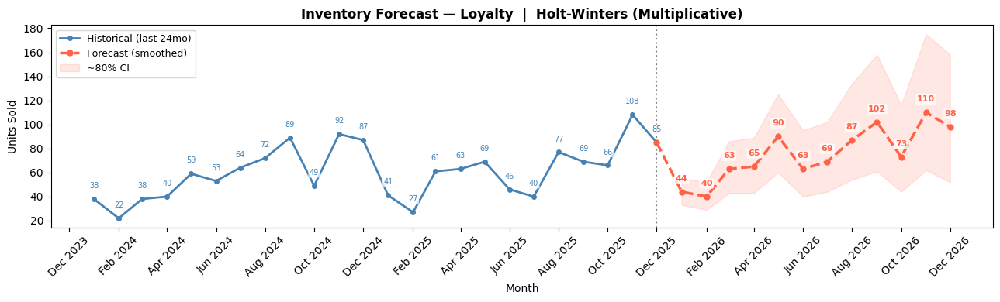


  CAMPAIGN TYPE: Product Launch
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                95          79         119
Feb 2026                91          73         117
Mar 2026               137         105         174
Apr 2026               142         106         186
May 2026               176         128         239
Jun 2026               140         102         189
Jul 2026               146         105         201
Aug 2026               171         120         246
Sep 2026               195         136         287
Oct 2026               167         111         247
Nov 2026               242         164         368
Dec 2026               245         160         374


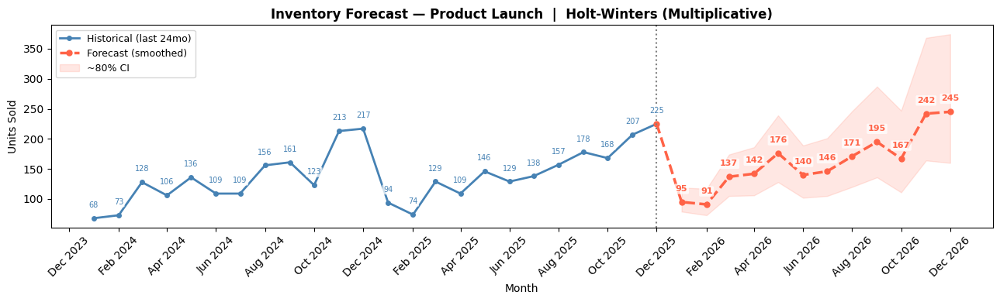


  CAMPAIGN TYPE: Referral
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                41          29          53
Feb 2026                35          24          49
Mar 2026                60          41          84
Apr 2026                50          33          72
May 2026                79          51         117
Jun 2026                63          41          97
Jul 2026                62          38          98
Aug 2026                78          49         125
Sep 2026                98          61         155
Oct 2026                74          45         117
Nov 2026               103          61         167
Dec 2026                98          58         165


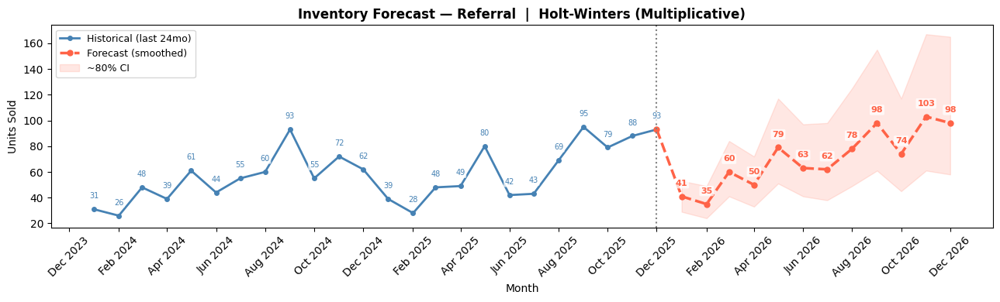


  CAMPAIGN TYPE: Seasonal
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                16          10          20
Feb 2026                17          12          24
Mar 2026                26          17          36
Apr 2026                30          19          44
May 2026                38          24          57
Jun 2026                27          17          40
Jul 2026                32          19          47
Aug 2026                36          21          55
Sep 2026                46          27          72
Oct 2026                35          20          55
Nov 2026                47          27          79
Dec 2026                39          22          65


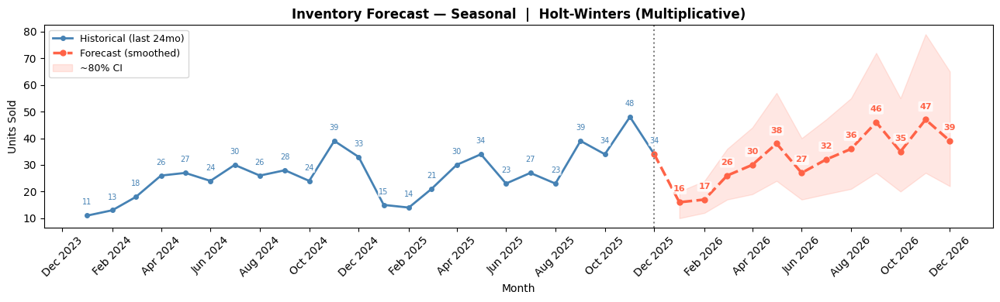


  CAMPAIGN TYPE: Test Drive
   Month  Forecasted_Units  Lower_80CI  Upper_80CI
Jan 2026                49          36          59
Feb 2026                42          30          54
Mar 2026                72          51          97
Apr 2026                64          45          89
May 2026                90          62         127
Jun 2026                76          51         109
Jul 2026                80          53         118
Aug 2026                90          59         135
Sep 2026               104          67         157
Oct 2026                88          57         136
Nov 2026               122          79         194
Dec 2026               119          74         187


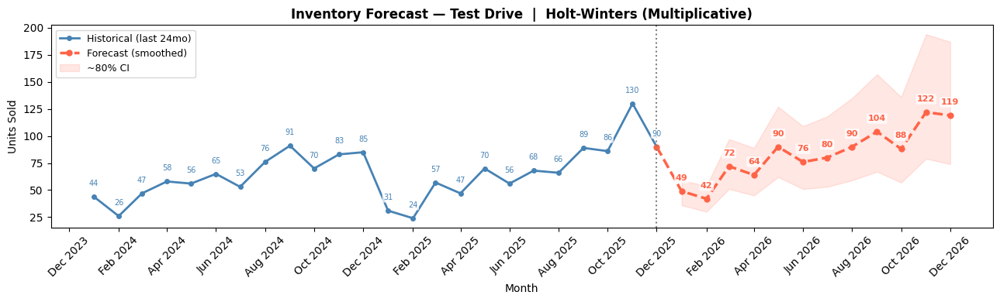


  2026 FORECAST SUMMARY — UNITS SOLD BY CAMPAIGN TYPE
                Jan 2026  Feb 2026  Mar 2026  Apr 2026  May 2026  Jun 2026  Jul 2026  Aug 2026  Sep 2026  Oct 2026  Nov 2026  Dec 2026  Total 2026
Campaign Type                                                                                                                                     
Product Launch        95        91       137       142       176       140       146       171       195       167       242       245        1947
Digital               58        51        99        91       115        90        94       109       140       108       153       158        1266
Test Drive            49        42        72        64        90        76        80        90       104        88       122       119         996
Loyalty               44        40        63        65        90        63        69        87       102        73       110        98         904
Referral              41        35        60        50        7

In [119]:
# STEP 18b: 2026 FULL YEAR FORECAST BY CAMPAIGN TYPE
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import numpy as np

FUTURE_STEPS = 12
DISPLAY_MONTHS = 24

all_dates = pd.date_range(
    start=camp_monthly['Date'].min(),
    end=camp_monthly['Date'].max(),
    freq='MS'
)
future_dates = pd.date_range(
    start=all_dates[-1] + pd.DateOffset(months=1),
    periods=FUTURE_STEPS,
    freq='MS'
)

print(f"Historical window (fit): {all_dates[0].strftime('%b %Y')} to {all_dates[-1].strftime('%b %Y')} "
      f"({len(all_dates)} months, {len(all_dates)/12:.1f} seasonal cycles)")
print(f"Forecast window:         {future_dates[0].strftime('%b %Y')} to {future_dates[-1].strftime('%b %Y')}")

campaign_types = camp_monthly['CampaignType'].unique().tolist()

camp_forecasts = {}
N_SIMS = 1000
offset = 1e-3

for camp_type in campaign_types:
    cdf = (camp_monthly[camp_monthly['CampaignType'] == camp_type]
           .set_index('Date')[['UnitsSold']]
           .reindex(all_dates, fill_value=0)
           .rename_axis('Date'))

    series = cdf['UnitsSold'].asfreq('MS').fillna(0)
    series_pos = series + offset

    try:
        mod = ExponentialSmoothing(
            series_pos,
            trend='add',
            seasonal='mul',
            seasonal_periods=12,
            initialization_method='estimated'
        )
        fit     = mod.fit(optimized=True)
        fc_mean = (fit.forecast(FUTURE_STEPS) - offset).clip(lower=0)

        sims = fit.simulate(nsimulations=FUTURE_STEPS, repetitions=N_SIMS,
                             error='mul', random_errors='bootstrap') - offset
        sims = sims.clip(lower=0)
        lower = sims.quantile(0.10, axis=1)
        upper = sims.quantile(0.90, axis=1)

        camp_forecasts[camp_type] = {
            'series'  : series,
            'forecast': fc_mean.values.round(0).astype(int),
            'lower'   : lower.values.round(0).astype(int),
            'upper'   : upper.values.round(0).astype(int),
        }

    except Exception as e:
        print(f"  ⚠ Skipping {camp_type}: {e}")
        continue

    fc_df = pd.DataFrame({
        'Month'           : future_dates.strftime('%b %Y'),
        'Forecasted_Units': camp_forecasts[camp_type]['forecast'],
        'Lower_80CI'      : camp_forecasts[camp_type]['lower'],
        'Upper_80CI'      : camp_forecasts[camp_type]['upper'],
    })
    print(f"\n{'=' * 55}")
    print(f"  CAMPAIGN TYPE: {camp_type}")
    print(f"{'=' * 55}")
    print(fc_df.to_string(index=False))

    disp_dates = all_dates[-DISPLAY_MONTHS:]
    disp_vals  = series.values[-DISPLAY_MONTHS:]

    fig, ax = plt.subplots(figsize=(13, 4))

    ax.plot(disp_dates, disp_vals,
            color='steelblue', linewidth=2,
            marker='o', markersize=4, label=f'Historical (last {DISPLAY_MONTHS}mo)')

    for dt, val in zip(disp_dates, disp_vals):
        ax.annotate(f'{int(val)}',
                    xy=(dt, val), xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', fontsize=7,
                    color='steelblue',
                    bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.75))

    last_val = disp_vals[-1]
    last_dt  = disp_dates[-1]
    ax.plot(
        [last_dt] + list(future_dates),
        [last_val] + list(camp_forecasts[camp_type]['forecast']),
        color='tomato', linewidth=2.5, linestyle='--',
        marker='o', markersize=5, label='Forecast (smoothed)'
    )

    ax.fill_between(future_dates,
                    camp_forecasts[camp_type]['lower'],
                    camp_forecasts[camp_type]['upper'],
                    color='tomato', alpha=0.15, label='~80% CI')

    ax.axvline(x=last_dt, color='gray', linestyle=':', linewidth=1.5)

    for dt, val in zip(future_dates, camp_forecasts[camp_type]['forecast']):
        ax.annotate(f'{int(val)}',
                    xy=(dt, val), xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', fontsize=8,
                    color='tomato', fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.15', fc='white', ec='none', alpha=0.75))

    ax.set_title(f'Inventory Forecast — {camp_type}  |  Holt-Winters (Multiplicative)',
                 fontsize=12, fontweight='bold')
    ax.set_xlabel('Month')
    ax.set_ylabel('Units Sold')
    ax.legend(fontsize=9, loc='upper left')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=2))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'forecast_campaign_{camp_type.replace(" ", "_")}.png', dpi=150, bbox_inches='tight')
    plt.show()

print(f"\n{'=' * 85}")
print("  2026 FORECAST SUMMARY — UNITS SOLD BY CAMPAIGN TYPE")
print(f"{'=' * 85}")

summary_rows = []
for camp_type, res in camp_forecasts.items():
    row = {'Campaign Type': camp_type}
    for dt, val in zip(future_dates, res['forecast']):
        row[dt.strftime('%b %Y')] = val
    row['Total 2026'] = sum(res['forecast'])
    summary_rows.append(row)

summary_df = (pd.DataFrame(summary_rows)
              .set_index('Campaign Type')
              .sort_values('Total 2026', ascending=False))

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)
print(summary_df.to_string())
print(f"\nGrand Total 2026: {summary_df['Total 2026'].sum():,} units")
print(f"\nStep 18 Complete — 2026 campaign forecast done for {len(camp_forecasts)} campaign types")

In [120]:
import pandas as pd

DRIVE_FILE = "/content/drive/MyDrive/Car Sales.xlsx"

all_sheets = pd.read_excel(DRIVE_FILE, sheet_name=None)
fvs_final = all_sheets["Fact_VehicleSales"]
dim_date_final = all_sheets["Dim_Date"]

print(f"Fact_VehicleSales: {len(fvs_final):,} rows")
print(f"Dim_Date: {len(dim_date_final):,} rows, range {dim_date_final['Date'].min()} -> {dim_date_final['Date'].max()}")
yearly_sales = fvs_final.merge(dim_date_final[["DateKey","Date"]], on="DateKey", how="left")
yearly_sales["Date"] = pd.to_datetime(yearly_sales["Date"])
yearly_sales["Year"] = yearly_sales["Date"].dt.year

yearly_totals = yearly_sales.groupby("Year").size()
print(yearly_totals)

yoy_change = yearly_totals.pct_change() * 100
print("\nYear-over-year % change:")
print(yoy_change.round(1))

print(f"\nYears where sales DECREASED vs previous year: {(yoy_change < 0).sum()} of {len(yoy_change)-1}")

Fact_VehicleSales: 80,347 rows
Dim_Date: 2,074 rows, range 2020-01-01 00:00:00 -> 2025-12-31 00:00:00
Year
2020     9324
2021    10967
2022    10350
2023    12900
2024    17427
2025    19379
dtype: int64

Year-over-year % change:
Year
2020     NaN
2021    17.6
2022    -5.6
2023    24.6
2024    35.1
2025    11.2
dtype: float64

Years where sales DECREASED vs previous year: 1 of 5
